# Init

## Import


In [ ]:
import numpy as np
import matplotlib
import pandas as pd
import healpy as hp
import scipy
import matplotlib.patches as patches
import photutils
import seaborn as sns

from matplotlib import pyplot as plt
from scipy.io import FortranFile as ff
from scipy.ndimage import gaussian_filter
from scipy import interpolate
from astropy.utils.data import get_pkg_data_filename
from astropy.io import fits 
from scipy import stats
from ipywidgets import IntProgress
from IPython.display import display
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
from matplotlib.colors import LogNorm
from regions import PixCoord, CircleSkyRegion, CirclePixelRegion, RectangleSkyRegion, RectanglePixelRegion
from photutils import CircularAperture, CircularAnnulus
from matplotlib.gridspec import GridSpec
from mpl_toolkits.axes_grid1 import make_axes_locatable 
from matplotlib.lines import Line2D
from matplotlib import rcParams
    
cFS = '#80A4ED'
cnoFS ='#87A937'
colors = ['#E7B075' , '#57DC1F']  # R -> G -> B


rcParams["text.usetex"] = 'True'
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times'
rcParams["xtick.direction"] = "in"
rcParams["ytick.direction"] = "in"
rcParams["xtick.minor.visible"] = "True"
rcParams["ytick.minor.visible"] = "True"
plt.rc('font', size=15) 
plt.rc('text.latex', preamble=r'\usepackage{amsmath,newtxmath}')

## Functions

In [2]:
def read_file(Dir,FileName,ndir):
    f = ff('%s/%s_spectrum'%(Dir,FileName))
    n = f.read_ints()[0]
    aperture,lmin,lmax = f.read_reals('d')
    spec = np.zeros((ndir,n))
    spec[0,:] = f.read_reals('d')
    for j in range(1,ndir):
        f.read_ints()
        f.read_reals('d')
        spec[j,:] = f.read_reals('d')
    f.close()

    return lmin,lmax,n,spec

# To get the spectra, in the appropriate units
def read_spectrum_si(path_to_data, halo):
    f = ff('%s/%s/SiII_SMC/spectra_SiII_1260/IC_photons_%i_nphots'%(path_to_data,str(halo).zfill(5),
                                                                          1000000))
    a = f.read_ints()
    lum_per_packet = f.read_reals()
    f.close()
    lum_per_packet = lum_per_packet/a
    lmin,lmax,npix,phot_packets = \
        read_file('%s/%s/SiII_SMC/spectra_SiII_1260/'%(path_to_data,str(halo).zfill(5)),'output.out',ndirections)
    dl   = (lmax - lmin) / npix                  # [A] 
    l    = np.arange(lmin,lmax-1e-5,dl) + 0.5*dl # [A]
    flux = h_cgs*c_cgs/(l*1e-8)*lum_per_packet   # [erg / s / phot packet]
    flux = flux / dl                             # [erg / s / A / phot packet]
    flux = flux * phot_packets                   # [erg / s/ A]
    
    return l,flux


def read_spectrum_c(path_to_data,halo):
    f = ff('%s/%s/CII_SMC/spectra_CII_1334/IC_photons_%i_nphots'%(path_to_data,str(halo).zfill(5),
                                                                          1000000))
    a = f.read_ints()
    lum_per_packet = f.read_reals()
    f.close()
    lum_per_packet = lum_per_packet/a
    lmin,lmax,npix,phot_packets = \
        read_file('%s/%s/CII_SMC/spectra_CII_1334/'%(path_to_data,str(halo).zfill(5)),'output.out',ndirections)
    dl   = (lmax - lmin) / npix                  # [A] 
    l    = np.arange(lmin,lmax-1e-5,dl) + 0.5*dl # [A]
    flux = h_cgs*c_cgs/(l*1e-8)*lum_per_packet   # [erg / s / phot packet]
    flux = flux / dl                             # [erg / s / A / phot packet]
    flux = flux * phot_packets                   # [erg / s/ A]
    
    return l,flux


def read_cube(path,ndir):
    
    f = ff('%s/output.out_cube'%path,'r')
    nlbda,nxy = f.read_ints()
    lmin,lmax,imsize = f.read_reals('d')
    center = f.read_reals('d')
    cube = np.zeros((ndir,nxy,nxy,nlbda))
    cube1 = f.read_reals('d')
    cube[0] = cube1.reshape(nxy,nxy,nlbda)
    for j in range(1,ndir):
        f.read_ints()
        f.read_reals('d')
        f.read_reals('d')
        cube1 = f.read_reals('d')
        cube[j] = cube1.reshape((nxy,nxy,nlbda))
    f.close()
    
    f = ff('%s/IC_photons_16000000_nphots'%path,'r')
    nphot = f.read_ints()[0]
    total_lum = f.read_reals()
    f.close()
    
    l = np.linspace(lmin,lmax,nlbda)
    
    cube = cube*total_lum/nphot
    cube = cube*h_cgs*c_cgs / (l*1e-8)
    cube = cube/((lmax-lmin)/nlbda)   

    return nxy,imsize*cu_to_pc,l,cube

ndirections = 300
directions = np.zeros((ndirections,3))
for i in range(ndirections):
    directions[i,:] = hp.pix2vec(5,i)

In [3]:
def measureEW(lam, vel, fluxA, errA, xl, yl):
    valid = (vel>=xl) & (vel<=yl)     
    if(np.sum(errA) == 0):
        EW = scipy.integrate.simps(1-fluxA[valid], x = lam[valid])
        EWstd = 0
    else:
        mes = np.zeros(1000)
        EW = scipy.integrate.simps(1-fluxA[valid], x = lam[valid])
        for i in range(1000):
            modFlux = fluxA[valid] + errA[valid]*np.random.normal(0, 1, len(fluxA[valid]))
            modFlux[modFlux<0] = 0
            mes[i] =  scipy.integrate.simps(1-modFlux, x = lam[valid])
        EWstd = np.std(mes)
    return [EW, EWstd]


def measureMinVel(vel, fluxA, errA, xl, yl):
    valid = (vel>=xl) & (vel<=yl)     
    if(np.sum(errA) == 0):
        modFlux = gaussian_filter(fluxA[valid], sigma = 0.)
        V = vel[valid][np.argmin(modFlux)]
        Vstd = 0
    else:
        mes = np.zeros(1000)
        mes2 = np.zeros(1000)
        modFlux = gaussian_filter(fluxA[valid], sigma = 0.)
        V = vel[valid][np.argmin(modFlux)]
        for i in range(1000):
            modFlux = fluxA[valid] + errA[valid]*np.random.normal(0, 1, len(fluxA[valid]))
            mes[i] =  vel[valid][np.argmin(modFlux)]
        Vstd = np.std(mes)        
        Fstd = np.std(mes2)
    return [V, Vstd]

  


In [4]:
from astropy.cosmology import FlatLambdaCDM

cosmo = FlatLambdaCDM(H0=67.8, Om0=0.308)
def mab_lam(flux_lambda): #apparent
#     flux_hz = (wl)**2  * 3.34e-19* flux_lambda
#     print(flux_hz)
    return -2.5 * np.log10(flux_lambda)   - 21.2#48.594

def mab_lam2(flux_lambda, wl): #apparent
#     flux_hz = (wl)**2  * 3.34e-19* flux_lambda
#     print(flux_hz)
    return -2.5 * np.log10(flux_lambda)   - 5*np.log10(wl) - 2.406#48.594

def mab_hz(flux_lambda, wl): #apparent
    flux_hz = (wl)**2/(2.99792458e+21/1000) * flux_lambda
    return -2.5 * np.log10(flux_hz)   - 48.594


def Mab (mab,z ): #absolute
    dL = cosmo.luminosity_distance(z).value  * 1e6 #in parsec
    return mab - 5*np.log10(dL/10)


def Mab2(flam,wl,z):
    fnu =  (wl)**2/(2.99792458e+21/1000) * flam
    print(-2.5*np.log10(fnu) -48.60)
    absmag =  -2.5*np.log10(fnu) -48.60 \
    -5*np.log10(cosmo.luminosity_distance(z).value*1e5)+\
    +2.5*np.log10(1+z)
    return absmag


def Mab3(flam,wl,z):
    fnu =  (wl)**2/(2.99792458e+21/1000) * flam*1e23#7.5e10 * flam*(1+z)
    obsmag =  -2.5*np.log10(fnu/3631) 
    print(obsmag)
    absmag = obsmag - 5 * np.log10(cosmo.luminosity_distance(z).value*1e5) +2.5*np.log10(1+z)
    return absmag

def Mab_simu(flam,wl,z):
    fnu =  (wl)**2/(2.99792458e+21/1000) * flam
    absmag = -2.5*np.log10(fnu / (4*np.pi*3.086e19**2)) - 48.6
    return absmag
# 4:22
# where obsmag is ab magnitudes
# 4:23
# defined as mab = -2.5*np.log10(fnu) -48.60

## Read parameters

In [5]:
h_cgs     = 6.6260755e-27  # [erg s]
c_cgs     = 2.99792458e10  # [cm/s]
c = 299792.458

cu_to_cm  = 0.218526280953331e26
cu_to_pc  = cu_to_cm/3.086e18

offsiIIfluo1265 = ((1265.002-1260.42)/1260.42*c)
offcIIfluo1335 = ((1335.708-1334.5322)/1334.532*c)
wcII1334  = 1334.532
wsiII1260 = 1260.42
wLya = 1215.67

nGal = 1
mask_all = []
path_to_folder = '../RHDSimulation/'
path_to_data_arr=[path_to_folder+'CII_SiII_nofine/',path_to_folder+ 'CII_SiII_fine/',
                  path_to_folder+'CII_SiII_ND/',path_to_folder+'CII_SiII_depletion/']

fescM = np.zeros(75)
fesc900M = np.zeros(75)
fesc = np.zeros((75,300))
fesc900 = np.zeros((75,300))

for i in range(75):
    f = pd.read_csv(path_to_folder+'dat_files/fesc/fesc_%d.txt'%int(i+90), 
                    delimiter = ' ', skiprows=1, header= None)
    fesc[i,:]    = f[0]
    fesc900[i,:] = f[1]
    fescM[i] = np.round(np.mean(fesc[i,:]),4)
    fesc900M[i] = np.round(np.mean(fesc900[i,:]),4)
    
SFR10 = np.zeros(75)
f = pd.read_csv(path_to_folder+'dat_files/SFR_10.dat', delimiter = ' ', header= None)
SFR10 = f[3][f[0]>=90].values

SFR100 = np.zeros(75)
f = pd.read_csv(path_to_folder+'dat_files/SFR_100.dat', delimiter = ' ', header= None)
SFR100 = f[3][f[0]>=90].values

Mgas = np.zeros(75)
f = pd.read_csv(path_to_folder+'dat_files/Mgas.dat', delimiter = ' ', header= None)
Mgas = f[3][f[0]>=90].values

Mhalo = np.zeros(75)
f = pd.read_csv(path_to_folder+'dat_files/Mhalo.dat', delimiter = ' ', header= None)
Mhalo = f[1][f[0]>=90].values

Mstar = np.zeros(75)
f = pd.read_csv(path_to_folder+'dat_files/Mstar.dat', delimiter = ' ', header= None)
Mstar = f[3][f[0]>=90].values

Zgas = np.zeros(75)
f = pd.read_csv(path_to_folder+'dat_files/Zgas.dat', delimiter = ' ', header= None)
Zgas = f[1][f[0]>=90].values

Zstar = np.zeros(75)
f = pd.read_csv(path_to_folder+'dat_files/Zstar.dat', delimiter = ' ', header= None)
Zstar = f[1][f[0]>=90].values


In [6]:
#Read Simu measurements
RHDmeas = []
for i in range(75):
    RHDmeas.append(pd.read_csv(f'csv/RHD_Mes_%d_300.csv'%(i+90)))

classy = pd.read_csv('../Classy/AnalysisClassy.csv')
ClassFluo =  pd.read_csv(f'{path_to_folder}/csv/Classy_Fluo_V2.csv')
ClassAbs =  pd.read_csv(f'{path_to_folder}/csv/Classy_Abs.csv')

VANDELSmeas=  pd.read_csv('csv/VANDELS_CII_SiII_meas.csv')


# VANDELS

## Read info

In [7]:
info = pd.read_csv('vandels_sample/vandels-sample.info',delim_whitespace=True, comment="#", 
                   names = ['spectrum', 'z', 'redshift_flag', 'snr_per_pix', 'lmass', 'lsfr'] )
rkms_vandels = 3e5/580

In [8]:
print(rkms_vandels)

517.2413793103449


## Read data

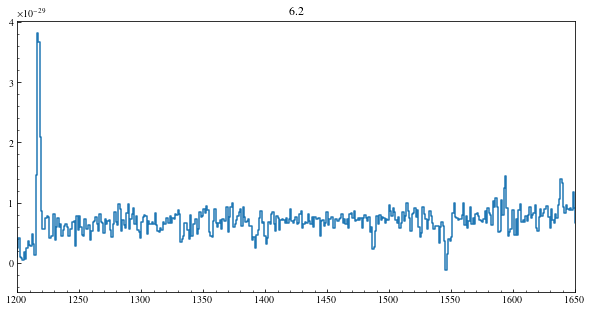

In [9]:
gal_lyc = ['023836','025948', '220026', 'UDS200677']
for i in range(965):
    if(gal_lyc[3] in info["spectrum"][i]):
        dat1 = pd.read_csv(f'vandels_sample/vandels_spectra/{info["spectrum"][i]}.dat',delim_whitespace=True,
                           comment="#", 
                           names = ['wl', 'flam', 'flam_err'])
        redshift = info["z"][i]
    #     print(info['snr_per_pix'][i])
        wave_kcor = dat1['wl']/(1+redshift)
        flux_norm = dat1['flam']#/np.median(dat1['flam'][(wave_kcor>1310) & (wave_kcor<1320)])
        flux_nu = dat1['flam']/(2.99792458e+21/1000/(dat1['wl'])**2)
        plt.figure(figsize = (10,5))
        plt.plot(wave_kcor, flux_nu, drawstyle='steps-mid')
        plt.xlim(1200, 1650)
        plt.title(info['snr_per_pix'][i])
#         plt.ylim(0,6e-18)

### Selected Sample SNR >5 data

Remove this gal


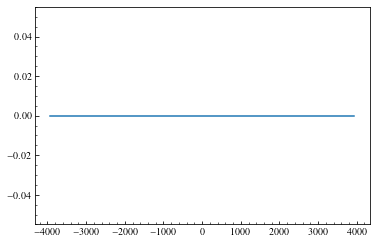

Remove this gal


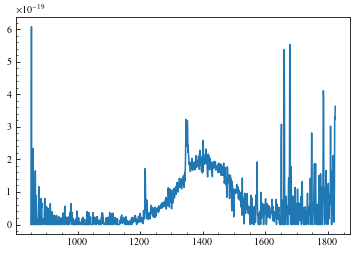

Ngalaxies in Sample: 131


In [10]:
mask = (info['snr_per_pix']>=5) & (info['lmass']>7.5)
for i in range(len(info)):    
    if(mask[i] == False):
        continue

    dat1 = pd.read_csv(f'vandels_sample/vandels_spectra/{info["spectrum"][i]}.dat',delim_whitespace=True,
                       comment="#", 
                       names = ['wl', 'flam', 'flam_err'])

    redshift = info["z"][i]
    wave     = dat1['wl'].values/(1+redshift)
    err      = dat1['flam_err'].values#/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
    flux     = dat1['flam'].values#(1+redshift)#/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
    flux[flux<0]=0
    flux_nu = flux/(2.99792458e+21/1000/(dat1['wl'])**2)
    vsiIId = (wave/wsiII1260-1)*c
    cutSiIIall = (vsiIId>-4000) & (vsiIId<4000)  
    
    fsiII    = flux_nu[cutSiIIall]
    esiII    = err[cutSiIIall]
    vsiII    = vsiIId[cutSiIIall]  
    if('229589' in info["spectrum"][i]):
        print('Remove this gal')
        plt.figure()
        plt.plot(wave, flux)
        plt.show()
        mask[i] = False
    if(np.nanmedian(fsiII) == 0):
        print('Remove this gal')
        plt.figure()
        plt.plot(vsiII, fsiII)
        plt.show()
        mask[i] = False

        
nGal = np.sum(mask)
print('Ngalaxies in Sample:', nGal)

#### Mass and redshift

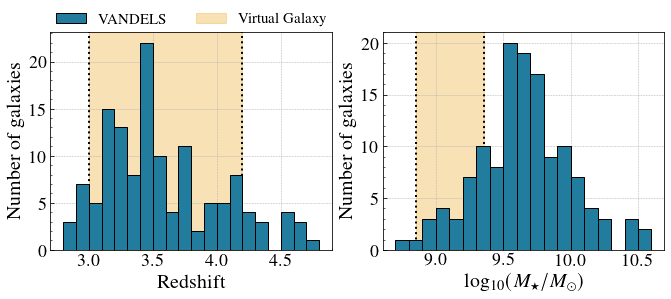

In [855]:
from matplotlib.legend_handler import HandlerPatch
import matplotlib.patches as mpatches

fig, (ax2, ax1) = plt.subplots(1,2, figsize = (11,4))

ax2.axvline(3, ls = ':', c= 'k', lw =2)
ax2.axvline(4.2, ls = ':',c='k', lw = 2)
ax2.hist(info['z'][mask],bins=np.arange(np.min(info['z'][mask]),np.max(info['z'][mask])+0.1,0.1),align='mid',  
         alpha = 1, label = 'VANDELS',
             edgecolor = 'k',color = '#227C9D', zorder =5)
cur_ylim = ax2.get_ylim()
ax2.fill_betweenx([0,cur_ylim[1]], x1 = 3, x2 =  4.2, color='#E99F0C', alpha = 0.3, label = 'Virtual Galaxy')
ax2.grid(linestyle = '--', linewidth = 0.5)
ax2.set_xlabel(r'Redshift', fontsize = 20)
ax2.tick_params(axis='both', which='major', labelsize=18)
ax2.set_ylim(0,cur_ylim[1])
ax2.set_ylabel(r'Number of galaxies', fontsize = 20)
ax2.legend(frameon = False, loc = (0,1), fontsize = 15, ncol = 2)
ahist = ax1.hist(info['lmass'][mask],
                 bins=np.arange(np.min(info['lmass'][mask]),np.max(info['lmass'][mask]),0.1),
                                align='mid',  alpha = 1,
             edgecolor = 'k',color = '#227C9D', zorder =5, lw = 1)
# print(np.min(np.log10(Mstar)),np.max(np.log10(Mstar)))
cur_ylim = ax1.get_ylim()
ax1.axvline(np.min(np.log10(Mstar)), ls = ':', c= 'k', lw =2)
ax1.axvline(np.max(np.log10(Mstar)), ls = ':',c='k', lw = 2)

ax1.fill_betweenx([0,cur_ylim[1]], x1 = np.min(np.log10(Mstar)), x2 = np.max(np.log10(Mstar)),
                  color='#E99F0C', alpha = 0.3)
ax1.set_xlabel(r'log$_{10}(M_\star/M_\odot)$', fontsize = 20)
ax1.set_ylabel(r'Number of galaxies', fontsize = 20)
ax1.set_ylim(0,cur_ylim[1])
# ax1.set_xlim(5.8,10.4)
ax1.tick_params(axis='both', which='major', labelsize=18)
# ax1.set_xticks([6,7,8,9,10])
ax1.grid(linestyle = '--', linewidth = 0.5)
plt.subplots_adjust(wspace=0.18)

fig.savefig('Plots/CompareGlobal.pdf', bbox_inches = 'tight')

#### Mass, z, SFR, lum

(0.0, 21.0)

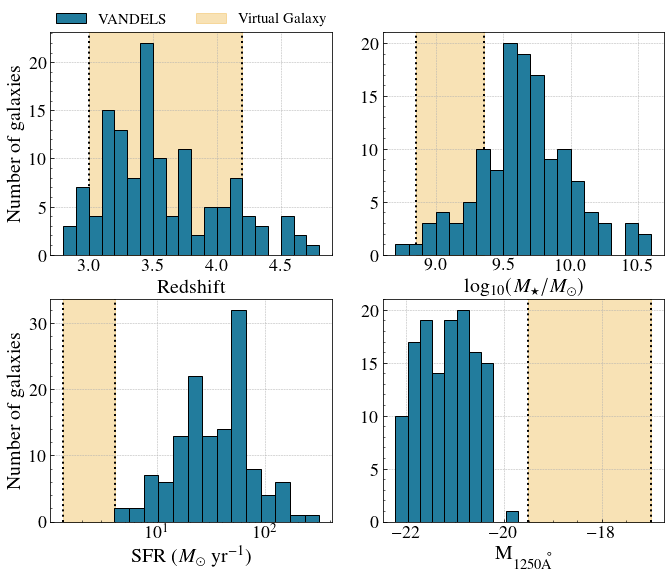

In [105]:
from matplotlib.legend_handler import HandlerPatch
import matplotlib.patches as mpatches

fig, ((ax2, ax1), (ax3, ax4)) = plt.subplots(2,2, figsize = (11,9))

ax2.axvline(3, ls = ':', c= 'k', lw =2)
ax2.axvline(4.2, ls = ':',c='k', lw = 2)
ax2.hist(info['z'][mask],bins=np.arange(np.min(info['z'][mask]),np.max(info['z'][mask])+0.1,0.1),align='mid',  
         alpha = 1, label = 'VANDELS',
             edgecolor = 'k',color = '#227C9D', zorder =5)
cur_ylim = ax2.get_ylim()
ax2.fill_betweenx([0,cur_ylim[1]], x1 = 3, x2 =  4.2, color='#E99F0C', alpha = 0.3, label = 'Virtual Galaxy')
ax2.grid(linestyle = '--', linewidth = 0.5)
ax2.set_xlabel(r'Redshift', fontsize = 20)
ax2.tick_params(axis='both', which='major', labelsize=18)
ax2.set_ylim(0,cur_ylim[1])
ax2.set_ylabel(r'Number of galaxies', fontsize = 20)
ax2.legend(frameon = False, loc = (0,1), fontsize = 15, ncol = 2)
ahist = ax1.hist(info['lmass'][mask],
                 bins=np.arange(np.min(info['lmass'][mask]),np.max(info['lmass'][mask]),0.1),
                                align='mid',  alpha = 1,
             edgecolor = 'k',color = '#227C9D', zorder =5, lw = 1)
# print(np.min(np.log10(Mstar)),np.max(np.log10(Mstar)))
cur_ylim = ax1.get_ylim()
ax1.axvline(np.min(np.log10(Mstar)), ls = ':', c= 'k', lw =2)
ax1.axvline(np.max(np.log10(Mstar)), ls = ':',c='k', lw = 2)

ax1.fill_betweenx([0,cur_ylim[1]], x1 = np.min(np.log10(Mstar)), x2 = np.max(np.log10(Mstar)),
                  color='#E99F0C', alpha = 0.3)
ax1.set_xlabel(r'log$_{10}(M_\star/M_\odot)$', fontsize = 20)
# ax1.set_ylabel(r'Number of galaxies', fontsize = 20)
ax1.set_ylim(0,cur_ylim[1])
# ax1.set_xlim(5.8,10.4)
ax1.tick_params(axis='both', which='major', labelsize=18)
# ax1.set_xticks([6,7,8,9,10])
ax1.grid(linestyle = '--', linewidth = 0.5)
plt.subplots_adjust(wspace=0.18, hspace = 0.2)


ax3.axvline(np.min(SFR100), ls = ':', c= 'k', lw =2)
ax3.axvline(np.max(SFR100), ls = ':',c='k', lw = 2)
ax3.hist(10**info['lsfr'][mask],
         bins=np.logspace(np.min(info['lsfr'][mask]),np.max(info['lsfr'][mask])+0.1, 15),align='mid',  
         alpha = 1, label = 'VANDELS',
             edgecolor = 'k',color = '#227C9D', zorder =5)
cur_ylim = ax3.get_ylim()
ax3.fill_betweenx([0,cur_ylim[1]], x1 = np.min(SFR100), x2 =  np.max(SFR100), color='#E99F0C', alpha = 0.3, label = 'Virtual Galaxy')
ax3.grid(linestyle = '--', linewidth = 0.5)
ax3.set_xlabel(r'SFR ($M_\odot$ yr$^{-1}$)', fontsize = 20)
ax3.tick_params(axis='both', which='major', labelsize=18)
ax3.set_ylim(0,cur_ylim[1])
ax3.set_ylabel(r'Number of galaxies', fontsize = 20)
ax3.set_xscale('log')

ax4.axvline(np.min(M_obs_sim), ls = ':', c= 'k', lw =2)
ax4.axvline(np.max(np.median(M_obs_sim, axis = 1)), ls = ':',c='k', lw = 2)
ax4.hist(M_obs,
         bins=10,align='mid',  
         alpha = 1, label = 'VANDELS',
             edgecolor = 'k',color = '#227C9D', zorder =5)
cur_ylim = ax4.get_ylim()
ax4.fill_betweenx([0,cur_ylim[1]], x1 = np.min(M_obs_sim), x2 =  np.max(np.median(M_obs_sim, axis = 1)), color='#E99F0C', alpha = 0.3, label = 'Virtual Galaxy')
ax4.grid(linestyle = '--', linewidth = 0.5)
ax4.set_xlabel(r'$\rm M_{\rm 1250\AA}$', fontsize = 20)
ax4.tick_params(axis='both', which='major', labelsize=18)
ax4.set_ylim(0,cur_ylim[1])
# ax4.set_ylabel(r'Number of galaxies', fontsize = 20)
# ax4.set_xscale('log')
# fig.savefig('Plots/CompareGlobal_V2.pdf', bbox_inches = 'tight')

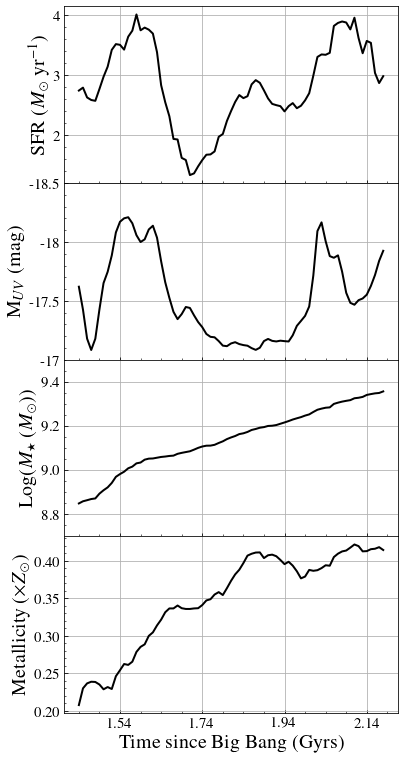

In [14]:
fig, axs = plt.subplots(4,1, figsize = (6, 13), sharex = True)

ax_main = axs[0]
ax_main.plot(np.arange(90,165, 1), SFR100, c ='k', label = 'SFR', lw = 2)
ax_main.set_xticks([100,120,140, 160])
ax_main.set_xlabel('Time since Big Bang (Gyrs)', fontsize = 20)
ax_main.set_ylabel(r'SFR ($M_\odot$ yr$^{-1}$)', fontsize = 20)
ax_main.set_xticklabels(['1.54', '1.74', '1.94', '2.14'], size = 18)
ax_main.tick_params(labelsize = 15)
ax_main.grid()
# plt.figure()
ax_main =  axs[1]
ax_main.plot(np.arange(90,165, 1),gaussian_filter(abs(np.median(M_obs_sim, axis = 1)),sigma = 1),
             c ='k', label = 'SFR', lw = 2)
ax_main.set_xticks([100,120,140, 160])
ax_main.set_xlabel('Time since Big Bang (Gyrs)', fontsize = 20)
ax_main.set_ylabel(r'M$_{UV}$ (mag)', fontsize = 20)
ax_main.set_xticklabels(['1.54', '1.74', '1.94', '2.14'], size = 18)
ax_main.tick_params(labelsize = 15)
ax_main.set_yticks([17, 17.5, 18, 18.5])

ax_main.set_yticklabels([-17, -17.5, -18, -18.5])
# ax_main.set_yticks([0.8e9, 1.2e9, 1.6e9, 2e9])
ax_main.grid()

ax_main =  axs[2]
ax_main.plot(np.arange(90,165, 1),np.log10(Mstar), c ='k', label = 'SFR', lw = 2)
ax_main.set_xticks([100,120,140, 160])
ax_main.set_xlabel('Time since Big Bang (Gyrs)', fontsize = 20)
ax_main.set_ylabel(r'Log($M_\star$ ($M_\odot$))', fontsize = 20)
ax_main.set_xticklabels(['1.54', '1.74', '1.94', '2.14'], size = 18)
ax_main.tick_params(labelsize = 15)
ax_main.set_ylim(8.7,9.5)
# ax_main.set_yticks([0.8e9, 1.2e9, 1.6e9, 2e9])
ax_main.grid()

# plt.figure()
ax_main =  axs[3]
ax_main.plot(np.arange(90,165, 1), Zgas, c ='k', label = 'SFR', lw = 2)
ax_main.set_xticks([100,120,140, 160])
ax_main.set_xlabel('Time since Big Bang (Gyrs)', fontsize = 20)
ax_main.set_ylabel(r'Metallicity ($\times Z_\odot$)', fontsize = 20)
ax_main.set_xticklabels(['1.54', '1.74', '1.94', '2.14'], size = 18)
ax_main.tick_params(labelsize = 15)
ax_main.grid()

plt.subplots_adjust(hspace=0)
# ax_main.set_yscale('log')

## Measuring properties

### VANDELS

In [ ]:
EWSiabs = np.zeros((nGal,2)) 
EWSiabs[EWSiabs == 0] = np.nan
EWSiemi = np.zeros((nGal,2)) 
EWSiemi[EWSiemi == 0] = np.nan
# print(EWSiabs)

EWCall = np.zeros((nGal,2))
EWCall[EWCall == 0] = np.nan

VSi = np.zeros((nGal,2))
VSi[VSi == 0] = np.nan

VC = np.zeros((nGal,2))
VC[VC == 0] = np.nan

true_i = 0
for i in range(len(info)):    
    if(mask[i] == False):
        continue
    dat1 = pd.read_csv(f'vandels_sample/vandels_spectra/{info["spectrum"][i]}.dat',delim_whitespace=True,
                       comment="#", 
                       names = ['wl', 'flam', 'flam_err'])

    redshift = info["z"][i]
    wave     = dat1['wl'].values/(1+redshift)
    err      =  dat1['flam_err'].values/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
    flux     = dat1['flam'].values/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
    flux[flux<0]=0
    vcIId  = (wave/wcII1334-1)*c
    vsiIId = (wave/wsiII1260-1)*c

    cutCIIall = (vcIId>-2700) & (vcIId<2700) 
    cutSiIIall = (vsiIId>-2700) & (vsiIId<3500)  
    
    fcII     = flux[cutCIIall]
    fsiII    = flux[cutSiIIall]
    ecII     = err[cutCIIall]
    esiII    = err[cutSiIIall]
    vcII     = vcIId[cutCIIall]
    vsiII    = vsiIId[cutSiIIall]  
    
    rmedCII = ((vcII<-1200) | (vcII>1200))
    fmedCII = np.nanmedian(fcII[rmedCII])
    fcII /= fmedCII
    
    rmedSiII = ((vsiII<-1000) |  (vsiII > 2000) )
    fmedSiII = np.nanmedian(fsiII[rmedSiII])
    fsiII /= fmedSiII  
    

    if(~np.isnan(np.median(fcII[((vcII<500) & (vcII>-500))])) and np.median(fcII[((vcII<500) & (vcII>-500))]) > 0.01):
#         print(np.median(fcII[((vcII<500) & (vcII>-500))]))
        try:
            EWCall[true_i][0], EWCall[true_i][1] = measureEW(wave[cutCIIall], vcII, fcII.copy(),
                                                (ecII.copy()/fmedCII), -1500, 1500)

            VC[true_i][0], VC[true_i][1] = measureMinVel(vcII, fcII.copy(), 
                                                                   (ecII.copy()/fmedCII), -1500, 1500)

        except:
            print('nocare', true_i,  info["spectrum"][i])
            
    if(~np.isnan(np.median(fsiII[((vsiII<500) &  (vsiII > -500) )])) and \
       (np.median(fsiII[((vsiII<500) & (vsiII>-500))]) > 0.01)):
#         print(np.median(fsiII[((vsiII<500) &  (vsiII > -500) )]))

        try:
            EWSiabs[true_i][0], EWSiabs[true_i][1] = measureEW(wave[cutSiIIall], vsiII, fsiII.copy(),
                                                  (esiII.copy()/fmedSiII),    -1500, 1000)
            EWSiemi[true_i][0], EWSiemi[true_i][1] = measureEW(wave[cutSiIIall], vsiII, fsiII.copy(),
                                                  (esiII.copy()/fmedSiII),    800, 2000)
            VSi[true_i][0], VSi[true_i][1], = measureMinVel(vsiII, fsiII.copy(),
                                                                      (esiII.copy()/fmedSiII), -1500, 1000)
    #         axs[1].axvline(VSi[i][0], c= 'r')
    #         axs[1].axhline(FSi[i][0], c= 'r')
    #         print(EWSi[i][0],EWSi[i][1])

    #         print(VSi[i][0],VSi[i][1])
    #         print(FSi[i][0],FSi[i][1])
        except:
            print('nocare', true_i, info["spectrum"][i] )

    if(true_i % 2 == 0):
        fig, (ax1, ax2) = plt.subplots(1,2,figsize=(15,5))

        ax1.plot(vcII, fcII,  c='k', drawstyle = 'steps-mid',
                 label = f'{EWCall[true_i][0]:.2f}')
        ax1.axvline(VC[true_i][0], c= 'r')
        ax1.axvline(-1000, c= 'c')
        ax1.axvline(1000, c= 'c')
        ax1.legend(ncol = 2, fontsize = 20, frameon = False)

        ax2.plot(vsiII, fsiII,   c = 'k', linestyle = '--', label = f'{EWSiabs[true_i][0]:.2f}, {EWSiemi[true_i][0]: .2f}', drawstyle = 'steps-mid' )
        ax2.axvline(VSi[true_i][0], c= 'r')
        ax2.axvline(-1000, c= 'c')
        ax2.axvline(900, c= 'c')
#         ax2.set_xlim(-1500,1500)
        ax2.legend(ncol = 2, fontsize = 20, frameon = False)
        plt.show()
    true_i+=1


In [307]:
df = pd.DataFrame(np.vstack((info["spectrum"][mask],
                             EWCall[:,0],EWCall[:,1], EWSiabs[:,0],EWSiabs[:,1], EWSiemi[:,0],EWSiemi[:,1], 
                   VC[:,0],VC[:,1], VSi[:,0],VSi[:,1])).T) # A is a numpy 2d array
C=['Galaxy','EWCII','ErrEWCII', 'EWSiIIabs', 'ErrEWSiIIabs',  'EWSiIIemi', 'ErrEWSiIIemi', 
   'VminCII', 'ErrVminCII', 'VminSiII', 'ErrVminSiII',]
df.to_csv("csv/VANDELS_CII_SiII_meas.csv", sep=',', header= C, index=False) # C is a list of string corresponding to the title of each column of A

#### Lum

(array([ 4.,  6., 10.,  7., 10.,  9.,  8.,  6.,  8., 11., 14.,  6.,  9.,
         7.,  9.,  6.,  0.,  0.,  0.,  1.]),
 array([-22.22182657, -22.09664363, -21.97146068, -21.84627773,
        -21.72109478, -21.59591183, -21.47072888, -21.34554593,
        -21.22036298, -21.09518003, -20.96999708, -20.84481413,
        -20.71963118, -20.59444823, -20.46926528, -20.34408233,
        -20.21889938, -20.09371643, -19.96853348, -19.84335053,
        -19.71816758]),
 <BarContainer object of 20 artists>)

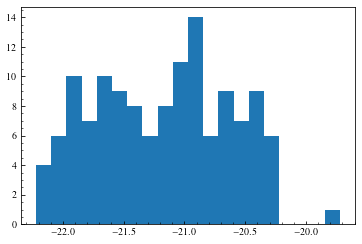

In [16]:
Lumi_obs = np.zeros(nGal)
M_obs = np.zeros(nGal)


true_i = 0
for i in range(len(info)):    
    if(mask[i] == False):
        continue
    dat1 = pd.read_csv(f'vandels_sample/vandels_spectra/{info["spectrum"][i]}.dat',delim_whitespace=True,
                       comment="#", 
                       names = ['wl', 'flam', 'flam_err'])

    redshift = info["z"][i]
    wave     = dat1['wl'].values/(1+redshift)
    err      = dat1['flam_err'].values#/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
    flux     = dat1['flam'].values#(1+redshift)#/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
    flux[flux<0]=0
    flux_nu = flux/(2.99792458e+21/1000/(dat1['wl'])**2)
    vsiIId = (wave/wsiII1260-1)*c
    cutSiIIall = (vsiIId>-4000) & (vsiIId<4000)  
    
    fsiII    = flux_nu[cutSiIIall]
    esiII    = err[cutSiIIall]
    vsiII    = vsiIId[cutSiIIall]  
    Lumi_obs[true_i] = np.median(fsiII[(vsiII<-2000) | (vsiII>2000) ])
    M_obs[true_i] = -2.5*np.log10(Lumi_obs[true_i]) -48.60 \
    -5*np.log10(cosmo.luminosity_distance(info['z'][i]).value*1e5)+\
    +2.5*np.log10(1+info['z'][i])
    
#     print(Lumi_obs[true_i],mab_lam(Lumi_obs[true_i]),Mab(mab_lam(Lumi_obs[true_i]), info['z'][i]),info['z'][i])
# ';{ }'
#     print(Lumi_obs[true_i], Mab)
#     if(Lumi_obs[true_i]==0):
#         plt.figure()
#         plt.plot(wave, flux)
#         plt.title(Lumi_obs[true_i])
#         plt.xlabel('Rest-frame')
#         plt.ylabel('FLux erg cm-2 s-1 A-1')
#         plt.show()
    true_i+=1

plt.figure()
plt.hist(M_obs, bins = 20)


In [310]:
df = pd.DataFrame(np.vstack((info["spectrum"][mask],M_obs)).T) # A is a numpy 2d array
C=['Galaxy','Mobs_1265',]
df.to_csv("csv/VANDELS_SiII_Mobs.csv", sep=',', header= C, index=False) # C is a list of st

### RHD simu properties

In [ ]:
path_to_data = path_to_folder+'/CII_SiII_depletion/'   # To change if you move the data

nout = 75
ndir = 300 

EWCII_sim = np.zeros((nout,ndir))
VCII_sim = np.zeros((nout,ndir))

EWSiIIabs_sim = np.zeros((nout,ndir))
EWSiIIemi_sim = np.zeros((nout,ndir))
VSiII_sim = np.zeros((nout,ndir))

f = IntProgress(min=0, max=nout) # instantiate the bar
display(f) # display the bar

v_cm = np.genfromtxt(path_to_folder+'./dat_files/vcm_90_164.dat',unpack=True)

for output in range(90,165,1):
    f.value += 1# output = 142
    l_c, flux_c = read_spectrum_c(path_to_data,output )
    l_si, flux_si = read_spectrum_si(path_to_data,output )
    
    vGal = v_cm[:,output-90]

    for idir in range(300):
        l_sys_c = l_c + np.dot(directions[idir,:],vGal)/c_cgs*1e5*np.mean(l_c)
        l_sys_c =l_sys_c[1:]
        l_big_c = np.arange(np.min(l_sys_c), np.max(l_sys_c), 2.2/2 )
        
        vcII   = (l_big_c/1334.532 -1)*c
        sigma_pixel = rkms_vandels /2.355/ ((vcII[1]-vcII[0]))
        rmedCII = ((vcII<-1000) | (vcII>1000))
        fluxdir = flux_c[idir,1:]
        fluxdir = np.interp(l_big_c, l_sys_c, fluxdir)
        fluxdir /= np.nanmedian(fluxdir[rmedCII])

        model = gaussian_filter(fluxdir, sigma = sigma_pixel, mode = 'constant', cval = 1)
        modelCII = model.copy()
        EWCII_sim[output-90, idir], oo = measureEW(l_big_c, vcII, model.copy(), np.zeros(len(fluxdir)),
                                                     -1500, 1500)

        VCII_sim[output-90,idir], oo, = measureMinVel(vcII, model.copy(), 
                                                                             np.zeros(len(fluxdir)), -1500, 1500)

        
        
        l_sys_si = l_si + np.dot(directions[idir,:],vGal)/c_cgs*1e5*np.mean(l_si) 
        l_sys_si =l_sys_si[1:]
        l_big_si = np.arange(np.min(l_sys_si), np.max(l_sys_si), 2.2/2 )

        vsiII   = (l_big_si/1260.42 -1)*c
        sigma_pixel = rkms_vandels / ((vsiII[1]-vsiII[0]))
        rmedSiII = ((vsiII<-1000) |  (vsiII > 1800) )

        fluxdir = flux_si[idir,1:]
        fluxdir = np.interp(l_big_si, l_sys_si, fluxdir)

        fluxdir/= np.nanmedian(fluxdir[rmedSiII])
        model = gaussian_filter(fluxdir, sigma = sigma_pixel)
#         model = model/np.nanmedian(model[rmedSiII])
        

        EWSiIIabs_sim[output-90,idir], oo = measureEW(l_big_si, vsiII, model.copy(), np.zeros(len(model)), 
                                                     -1500, 1000)
        EWSiIIemi_sim[output-90,idir], oo = measureEW(l_big_si, vsiII, model.copy(),   np.zeros(len(model)),
                                                     800, 2000)

        VSiII_sim[output-90,idir], oo,  = measureMinVel(vsiII, model.copy(),np.zeros(len(model)),
                                                       -1500, 800)

        if(idir % 200 == 0):
            fig, (ax1, ax2) = plt.subplots(1,2,figsize=(15,5))

            ax1.plot(vcII, modelCII,  c='k', drawstyle = 'steps-mid',
                     label = f'{ EWCII_sim[output-90, idir]:.2f}')
            ax1.axvline(VCII_sim[output-90,idir], c= 'r')
            ax1.axvline(-1000, c= 'c')
            ax1.axvline(1000, c= 'c')
            ax1.legend(ncol = 2, fontsize = 20, frameon = False)

            ax2.plot(vsiII, model,   c = 'k', linestyle = '--', 
                     label = f'{EWSiIIabs_sim[output-90,idir]: .2f}, {EWSiIIemi_sim[output-90,idir]: .2f}'    , 
                     drawstyle = 'steps-mid' )
            ax2.axvline(VSiII_sim[output-90,idir], c= 'r')
            ax2.axvline(-1000, c= 'c')
            ax2.axvline(900, c= 'c')

            ax2.legend(ncol = 2, fontsize = 20, frameon = False)
            plt.show()

In [53]:
print(sigma_pixel)

51.71097247190807


#### Saving

In [76]:
for i in range(75):
    df = pd.DataFrame(np.vstack((np.linspace(0,299,300),  
                                 EWCII_sim[i,:], VCII_sim[i,:], 
                                 EWSiIIabs_sim[i,:], EWSiIIemi_sim[i,:], 
                                 VSiII_sim[i,:])).T) # A is a numpy 2d array
    C=['dir', 'EWCII', 'VminCII', 'EWSiIIabs', 'EWSiIIemi', 
       'VSiII']
    df.to_csv("csv/RHD_Mes_%d_300.csv"%(i+90), sep=',', header= C, index=False) 
    


### Meaure luminosity

In [6]:
path_to_data = path_to_folder+'/CII_SiII_depletion/'   # To change if you move the data

nout = 75
ndir = 300 

Lumi_sim = np.zeros((nout,ndir))
M_obs_sim = np.zeros((nout,ndir))
f = IntProgress(min=0, max=nout) # instantiate the bar
display(f) # display the bar

v_cm = np.genfromtxt(path_to_folder+'./dat_files/vcm_90_164.dat',unpack=True)

for output in range(90,165,1):
    f.value += 1# output = 142
    l_c, flux_c = read_spectrum_c(path_to_data,output )
    l_si, flux_si = read_spectrum_si(path_to_data,output )
    
    vGal = v_cm[:,output-90]

    for idir in range(300):

        l_sys_si = l_si + np.dot(directions[idir,:],vGal)/c_cgs*1e5*np.mean(l_si) 
        l_sys_si =l_sys_si[1:]
        l_big_si = np.arange(np.min(l_sys_si), np.max(l_sys_si), 2.2/2 )
        fluxdir = flux_si[idir,1:]

        vsiII   = (l_sys_si/1260.42 -1)*c
        Lumi_sim[output-90, idir] = np.median(fluxdir[vsiII<-1000])
        M_obs_sim[output-90, idir] = Mab_simu(Lumi_sim[output-90, idir], 1260,0)
        
#         model = model/np.nanmedian(model[rmedSiII])
        


IntProgress(value=0, max=75)

### Showing global measurements

/tmp/ipykernel_3542351/2988143062.py:113: UserWarning: No contour levels were found within the data range.
  CS=ax_main.contour(counts.transpose(),extent=[xbins.min(),xbins.max(),


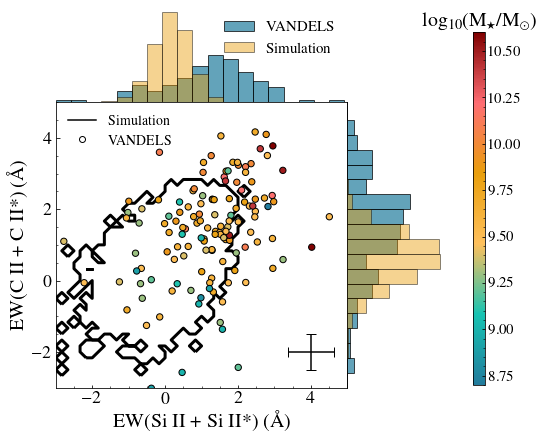

In [331]:
# cb_colors = ["#FFC15E", "#F7B05B", "#F7934C", "#CC5803", "#1F1300"]
cb_colors = ["#227C9D", "#17C3B2", "#FFC05C", "#E99F0C", "#FE6D73", "#800000"]

num_colors = len(cb_colors)
cmap = LinearSegmentedColormap.from_list('test',cb_colors)

mstarAll = np.zeros((75,300))
RHDCIIAll = np.zeros((75,300))
RHDSiIIAll = np.zeros((75,300))
RHDVCIIAll = np.zeros((75,300))
RHDVSiIIAll = np.zeros((75,300))

for i in range(75):
    mstarAll[i,:] += np.log10(Mstar[i])
    RHDCIIAll[i,:] = RHDmeas[i]['EWCII']
    RHDSiIIAll[i,:] = RHDmeas[i]['EWSiIIabs']+RHDmeas[i]['EWSiIIemi']

    RHDVCIIAll[i,:] = RHDmeas[i]['VminCII']
    RHDVSiIIAll[i,:] = RHDmeas[i]['VSiII']
    
    
vmin = np.min(info['lmass'][mask])
vmax = np.max(info['lmass'][mask])


fig = plt.figure(figsize=(8,7))
gs = GridSpec(8, 8)
ax_main = plt.subplot(gs[2:8, :6])
ax_xDist = plt.subplot(gs[0:2, :6],sharex=ax_main)
ax_yDist = plt.subplot(gs[2:8, 6:8],sharey=ax_main)

# ax_main.errorbar(VANDELSmeas['EWSiIIabs']+VANDELSmeas['EWSiIIemi'], VANDELSmeas['EWCII'], 
#                 xerr = np.sqrt(VANDELSmeas['ErrEWSiIIabs']**2+VANDELSmeas['ErrEWSiIIemi']**2),
#                  yerr = VANDELSmeas['ErrEWCII'],
#                 label = 'VANDELS', linestyle = 'None', marker = 's',c='k')

cm = ax_main.scatter(VANDELSmeas['EWSiIIabs']+VANDELSmeas['EWSiIIemi'], VANDELSmeas['EWCII'],  c = info['lmass'][mask],
                marker = 'o', s = 40, zorder = 5, cmap = cmap,  vmin = vmin, vmax = vmax, edgecolor = 'k')
ax_main.errorbar(4, -2, 
                xerr = np.nanmedian(np.sqrt(VANDELSmeas['ErrEWSiIIabs']**2+VANDELSmeas['ErrEWSiIIemi']**2)),
                 yerr = np.nanmedian(VANDELSmeas['ErrEWCII']),
                label = 'VANDELS', linestyle = '--', marker = 'None',c='k', capsize=5)


# ax_main.errorbar(RHDSiIIAll.flatten(), RHDCIIAll.flatten(), 
#                 xerr = RHDSiIIErrAll.flatten(), yerr = RHDCIIAll.flatten(),
#                 label = 'VANDELS', linestyle = 'None', marker = 's',c='k', markeredgecolor = 'k')

# ax_main.scatter(RHDSiIIAll.flatten(), RHDCIIAll.flatten(),  c = info['lmass'][mask],
#                 marker = 's', s = 20, zorder = 5, cmap = cmap, edgecolor = 'k', vmin = vmin, vmax = vmax)


# ax_main.set(xlabel="x data", ylabel="y data")

# cm = ax_main.scatter( np.flip(RHDSiIIAll.flatten()[:]), np.flip(RHDCIIAll.flatten()[:]), zorder = 0, marker = '+', 
#                   c =  np.flip(mstarAll.flatten()[:]), cmap = cmap, s = 0.5, vmin = vmin, vmax = vmax, label = 'Simulation')

ax_xDist.hist(VANDELSmeas['EWSiIIabs']+VANDELSmeas['EWSiIIemi'],bins=np.linspace(-3,7,25),
              align='mid', density=True, alpha = 0.7, label = 'VANDELS',
             edgecolor = 'k',color = '#227C9D', )
ax_xDist.hist(np.flip(RHDSiIIAll.flatten()[:]),bins=np.linspace(-3,7,25),align='mid', density=True, alpha = 0.45, 
              label = 'Simulation', edgecolor = 'k', color = '#E99F0C',)
ax_xDist.axis(False)
ax_xDist.legend(frameon = False)

ax_yDist.hist(VANDELSmeas['EWCII'],bins=np.linspace(-3,7,25),orientation='horizontal',align='mid', 
              density=True, alpha = 0.7, 
              edgecolor = 'k',color = '#227C9D')

ax_yDist.hist(np.flip(RHDCIIAll.flatten()[:]),bins=np.linspace(-3,7,25),orientation='horizontal',align='mid', density=True,
              alpha =0.45,              edgecolor = 'k', color = '#E99F0C')

ax_yDist.axis(False)
ax_main.set_xlabel(r'EW(Si II + Si II*) ($\rm \AA$)', fontsize = 20)
ax_main.set_ylabel(r'EW(C II + C II*) ($\rm \AA$)', fontsize = 20)
ax_main.set_xlim(-3,5)
ax_main.set_ylim(-3,5)

line0 = Line2D([0], [0], label='Simulation', marker='None', linestyle='-', color='k')    
line1 = Line2D([], [], label='Simulation', marker='+', linestyle='None', color='w',markeredgecolor = 'k')    
line3 = Line2D([], [], label='CLASSY ', marker='o', linestyle='None', color='w',markeredgecolor = 'k')
labels = [r'Simulation', 'VANDELS']
ll = ax_main.legend([line0,line3,], labels,frameon = False, fontsize = 14, loc = 'upper left')
# ll.legendHandles[1]._sizes = [60,60,60,60]
ax_main.tick_params(axis='both', which='major', labelsize=18)
# ax_main.set_yticks([0,1,2,3,4])

plt.subplots_adjust(wspace=0, hspace=0)
plt.setp(ax_xDist.get_xticklabels(), visible=False)
plt.setp(ax_xDist.get_yticklabels(), visible=False)
plt.setp(ax_yDist.get_xticklabels(), visible=False)
plt.setp(ax_yDist.get_yticklabels(), visible=False)


def grid(x, y, z, resX=100, resY=100):
    "Convert 3 column data to matplotlib grid"
    xi = linspace(min(x), max(x), resX)
    yi = linspace(min(y), max(y), resY)
    Z = griddata(x, y, z, xi, yi)
    X, Y = meshgrid(xi, yi)
    return X, Y, Z

# X, Y, Z = grid(np.flip(RHDSiIIAll.flatten()[:]), np.flip(RHDCIIAll.flatten()[:]), z)
counts,xbins,ybins=np.histogram2d(np.flip(RHDSiIIAll.flatten()[:]), np.flip(RHDCIIAll.flatten()[:]),
                                  bins=[np.linspace(-3,5,50), np.linspace(-3,5,50)])
counts = (counts - counts.min())/(counts.max() - counts.min())
from scipy import ndimage

# resample your data grid by a factor of 4 using cubic spline interpolation
pw = 4
# counts = ndimage.zoom(counts, pw)

CS=ax_main.contour(counts.transpose(),extent=[xbins.min(),xbins.max(),
    ybins.min(),ybins.max()],colors='k',levels = [0,  1], linewidths=[3,3])
# ax_main.clabel(CS, fmt='%1.2f', colors='k', fontsize=8, inline=True, inline_spacing=0)



# ax_main = plt.subplot(gs[2:8, 20:26])
# ax_xDist = plt.subplot(gs[0:2, 20:26],sharex=ax_main)
# ax_yDist = plt.subplot(gs[2:8, 26:28],sharey=ax_main)


# # ax_main.errorbar(VANDELSmeas['VminSiII'], VANDELSmeas['VminCII'],
# #                 xerr = VANDELSmeas['ErrVminSiII'], yerr = VANDELSmeas['ErrVminCII'],
# #                  linestyle = 'None', marker = 'o',c='k', markeredgecolor = 'k')
# ax_main.scatter(VANDELSmeas['VminSiII'], VANDELSmeas['VminCII'],  c = info['lmass'][mask],
#                 marker = 's', s = 40, zorder = 5, cmap = cmap,  vmin = vmin, vmax = vmax, edgecolor = 'k')

# cm = ax_main.scatter( np.flip(RHDVSiIIAll.flatten()[:]), np.flip(RHDVCIIAll.flatten()[:]), zorder = 0, marker = '+', 
#                   c =  np.flip(mstarAll.flatten()[:]), cmap = cmap, s = 0.5, vmin = vmin, vmax = vmax)
    
# ax_main.plot(np.linspace(-600,200),np.linspace(-600,200), linestyle = '--', c = 'k')

# ax_main.set_xlabel(r'$v_{\rm min}$(Si II) ($\rm km\ s^{-1}$)', fontsize = 20)
# ax_main.set_ylabel(r'$v_{\rm min}$(C II) ($\rm km\ s^{-1}$)', fontsize = 20)


# ax_xDist.hist(VANDELSmeas['VminSiII'],bins=np.linspace(-600,150,20),align='mid', density=True, alpha = 0.3, label = 'CLASSY',
#              edgecolor = '#17C3B2',color = '#17C3B2')
# ax_xDist.hist(np.flip(RHDVSiIIAll.flatten()[:]),bins=np.linspace(-600,150,20),align='mid', density=True, 
#                 alpha =0.5,              edgecolor = 'k', color = '#ECEBE4')
# # ax_xDist.legend(frameon 
# # = False)
# ax_xDist.axis(False)


# ax_yDist.hist( VANDELSmeas['VminCII'],bins=np.linspace(-600,150,20),orientation='horizontal',align='mid', density=True, alpha = 0.3, 
#                edgecolor = '#17C3B2',color = '#17C3B2')
# ax_yDist.hist(np.flip(RHDVCIIAll.flatten()[:]),bins=np.linspace(-600,150,20),orientation='horizontal',align='mid', density=True, 
#                 alpha =0.5,              edgecolor = 'k', color = '#ECEBE4')

# ax_yDist.axis(False)

# ax_main.set_xlim(-600,350)
# ax_main.set_ylim(-600,350)
# # plt.subplots_adjust(wspace=0, hspace=0)
# plt.setp(ax_xDist.get_xticklabels(), visible=False)
# plt.setp(ax_xDist.get_yticklabels(), visible=False)
# plt.setp(ax_yDist.get_xticklabels(), visible=False)
# plt.setp(ax_yDist.get_yticklabels(), visible=False)


# # ax_yDist
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.13, 0.02, 0.7])
cbar = fig.colorbar(cm, cax=cbar_ax, orientation='vertical')
cbar.ax.set_title(r'log$_{10}$(M$_{\star}$/M$_\odot$)', fontsize = 20)

plt.savefig('Plots/EWProp.pdf', bbox_inches = 'tight', dpi = 300)

# # plt.show()

3600
5100
5100
4800
0.19130730081593617
0.17128002120698205
0.23640510240595247
0.16501639022621467
0.10510868715940178
nan


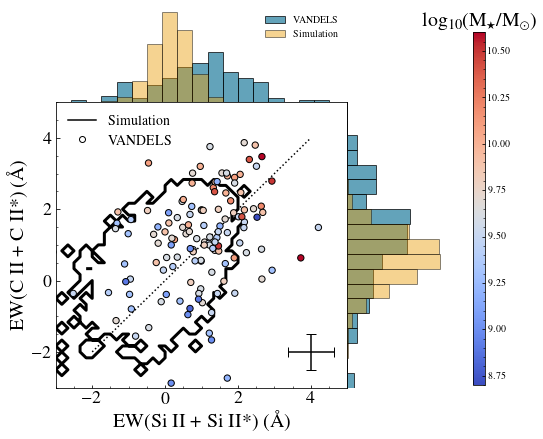

In [47]:
# cb_colors = ["#FFC15E", "#F7B05B", "#F7934C", "#CC5803", "#1F1300"]
cb_colors = ["#227C9D", "#17C3B2", "#FFC05C", "#E99F0C", "#FE6D73", "#800000"]

num_colors = len(cb_colors)
cmap = LinearSegmentedColormap.from_list('test',cb_colors)

mstarAll = np.zeros((75,300))
RHDCIIAll = np.zeros((75,300))
RHDSiIIAll = np.zeros((75,300))
RHDVCIIAll = np.zeros((75,300))
RHDVSiIIAll = np.zeros((75,300))

for i in range(75):
    mstarAll[i,:] += np.log10(Mstar[i])
    RHDCIIAll[i,:] = RHDmeas[i]['EWCII']
    RHDSiIIAll[i,:] = RHDmeas[i]['EWSiIIabs']+RHDmeas[i]['EWSiIIemi']

    RHDVCIIAll[i,:] = RHDmeas[i]['VminCII']
    RHDVSiIIAll[i,:] = RHDmeas[i]['VSiII']
    
    
vmin = np.min(info['lmass'][mask])
vmax = np.max(info['lmass'][mask])

cmap = 'coolwarm'
fig = plt.figure(figsize=(8,7))
gs = GridSpec(8, 8)
ax_main = plt.subplot(gs[2:8, :6])
ax_xDist = plt.subplot(gs[0:2, :6],sharex=ax_main)
ax_yDist = plt.subplot(gs[2:8, 6:8],sharey=ax_main)

# ax_main.errorbar(VANDELSmeas['EWSiIIabs']+VANDELSmeas['EWSiIIemi'], VANDELSmeas['EWCII'], 
#                 xerr = np.sqrt(VANDELSmeas['ErrEWSiIIabs']**2+VANDELSmeas['ErrEWSiIIemi']**2),
#                  yerr = VANDELSmeas['ErrEWCII'],
#                 label = 'VANDELS', linestyle = 'None', marker = 's',c='k')

cm = ax_main.scatter(VANDELSmeas['EWSiIIabs']+VANDELSmeas['EWSiIIemi']-0.3, VANDELSmeas['EWCII']-0.3,  c = info['lmass'][mask],
                marker = 'o', s = 40, zorder = 5, cmap = cmap,  vmin = vmin, vmax = vmax, edgecolor = 'k')
ax_main.errorbar(4, -2, 
                xerr = np.nanmedian(np.sqrt(VANDELSmeas['ErrEWSiIIabs']**2+VANDELSmeas['ErrEWSiIIemi']**2)),
                 yerr = np.nanmedian(VANDELSmeas['ErrEWCII']),
                label = 'VANDELS', linestyle = '--', marker = 'None',c='k', capsize=5)

ax_main.plot(np.linspace(-2,4),np.linspace(-2,4), c= 'k', ls = ':')
ax_xDist.hist(VANDELSmeas['EWSiIIabs']+VANDELSmeas['EWSiIIemi']-0.3,bins=np.linspace(-3,7,25),
              align='mid', density=True, alpha = 0.7, label = 'VANDELS',
             edgecolor = 'k',color = '#227C9D', )
ax_xDist.hist(np.flip(RHDSiIIAll.flatten()[:]),bins=np.linspace(-3,7,25),align='mid', density=True, alpha = 0.45, 
              label = 'Simulation', edgecolor = 'k', color = '#E99F0C',)
ax_xDist.axis(False)
ax_xDist.legend(frameon = False)

ax_yDist.hist(VANDELSmeas['EWCII']-0.3,bins=np.linspace(-3,7,25),orientation='horizontal',align='mid', 
              density=True, alpha = 0.7, 
              edgecolor = 'k',color = '#227C9D')

ax_yDist.hist(np.flip(RHDCIIAll.flatten()[:]),bins=np.linspace(-3,7,25),orientation='horizontal',align='mid', density=True,
              alpha =0.45,              edgecolor = 'k', color = '#E99F0C')

ax_yDist.axis(False)
ax_main.set_xlabel(r'EW(Si II + Si II*) ($\rm \AA$)', fontsize = 20)
ax_main.set_ylabel(r'EW(C II + C II*) ($\rm \AA$)', fontsize = 20)
ax_main.set_xlim(-3,5)
ax_main.set_ylim(-3,5)

line0 = Line2D([0], [0], label='Simulation', marker='None', linestyle='-', color='k')    
line1 = Line2D([], [], label='Simulation', marker='+', linestyle='None', color='w',markeredgecolor = 'k')    
line3 = Line2D([], [], label='CLASSY ', marker='o', linestyle='None', color='w',markeredgecolor = 'k')
labels = [r'Simulation', 'VANDELS']
ll = ax_main.legend([line0,line3,], labels,frameon = False, fontsize = 14, loc = 'upper left')
# ll.legendHandles[1]._sizes = [60,60,60,60]
ax_main.tick_params(axis='both', which='major', labelsize=18)
# ax_main.set_yticks([0,1,2,3,4])

plt.subplots_adjust(wspace=0, hspace=0)
plt.setp(ax_xDist.get_xticklabels(), visible=False)
plt.setp(ax_xDist.get_yticklabels(), visible=False)
plt.setp(ax_yDist.get_xticklabels(), visible=False)
plt.setp(ax_yDist.get_yticklabels(), visible=False)


def grid(x, y, z, resX=100, resY=100):
    "Convert 3 column data to matplotlib grid"
    xi = linspace(min(x), max(x), resX)
    yi = linspace(min(y), max(y), resY)
    Z = griddata(x, y, z, xi, yi)
    X, Y = meshgrid(xi, yi)
    return X, Y, Z

# X, Y, Z = grid(np.flip(RHDSiIIAll.flatten()[:]), np.flip(RHDCIIAll.flatten()[:]), z)
counts,xbins,ybins=np.histogram2d(np.flip(RHDSiIIAll.flatten()[:]), np.flip(RHDCIIAll.flatten()[:]),
                                  bins=[np.linspace(-3,5,50), np.linspace(-3,5,50)])
counts = (counts - counts.min())/(counts.max() - counts.min())
from scipy import ndimage

# resample your data grid by a factor of 4 using cubic spline interpolation
pw = 4
# counts = ndimage.zoom(counts, pw)

CS=ax_main.contour(counts.transpose(),extent=[xbins.min(),xbins.max(),
    ybins.min(),ybins.max()],colors='k',levels = [0,  1], linewidths=[3,3])


# # ax_yDist
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.13, 0.02, 0.7])
cbar = fig.colorbar(cm, cax=cbar_ax, orientation='vertical')
cbar.ax.set_title(r'log$_{10}$(M$_{\star}$/M$_\odot$)', fontsize = 20)

print(np.sum((mstarAll.flatten()<9)))
print(np.sum((mstarAll.flatten()>=9) & (mstarAll.flatten()<9.1)))
print(np.sum((mstarAll.flatten()>=9.1) & (mstarAll.flatten()<9.2)))
print(np.sum((mstarAll.flatten()>=9.2) & (mstarAll.flatten()<9.3)))

print(np.nanmedian((RHDSiIIAll.flatten()[:])[mstarAll.flatten()<9]))
print(np.nanmedian((RHDSiIIAll.flatten()[:])[(mstarAll.flatten()>=9) & (mstarAll.flatten()<9.1)]))
print(np.nanmedian((RHDSiIIAll.flatten()[:])[(mstarAll.flatten()>=9.1) & (mstarAll.flatten()<9.2)]))
print(np.nanmedian((RHDSiIIAll.flatten()[:])[(mstarAll.flatten()>=9.2) & (mstarAll.flatten()<9.3)]))
print(np.nanmedian((RHDSiIIAll.flatten()[:])[(mstarAll.flatten()>=9.3) & (mstarAll.flatten()<9.4)]))
print(np.nanmedian((RHDSiIIAll.flatten()[:])[(mstarAll.flatten()>=9.4) & (mstarAll.flatten()<9.5)]))

# plt.savefig('Plots/EWProp.pdf', bbox_inches = 'tight', dpi = 300)

# # plt.show()

In [332]:
ninside = 0
for i in range(len(VANDELSmeas['EWSiIIabs']+VANDELSmeas['EWSiIIemi'])):
    curmeasSi = VANDELSmeas['EWSiIIabs'][i]+VANDELSmeas['EWSiIIemi'][i]
    curmeasC = VANDELSmeas['EWCII'][i]
    for j in range(len(RHDCIIAll.flatten())):
        if(RHDCIIAll.flatten()[j] >= curmeasC and RHDSiIIAll.flatten()[j] >= curmeasSi ):
            ninside+=1
            break
print('Percentage values : ' ,ninside/nGal)

### Old 1D histograms

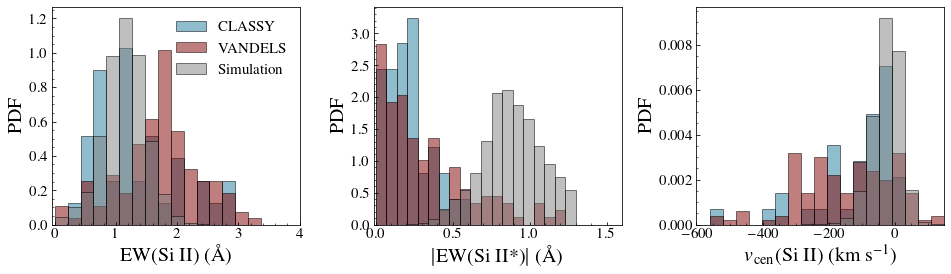

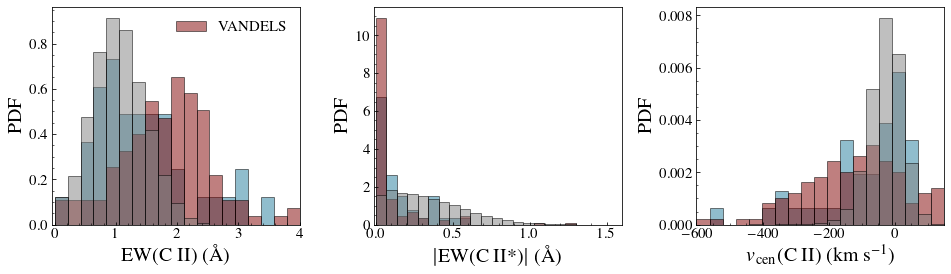

In [460]:
# cb_colors = ["#FFC15E", "#F7B05B", "#F7934C", "#CC5803", "#1F1300"]
cb_colors = ["#227C9D", "#17C3B2", "#FFC05C", "#E99F0C", "#FE6D73", "#800000"]
alpha = 0.5
num_colors = len(cb_colors)
cmap = LinearSegmentedColormap.from_list('test',cb_colors)

fig, axs = plt.subplots(1,3,figsize=(16,4))

axs[0].hist(-ClassAbs['EWSiII'],bins=np.linspace(0,4,20),align='mid', density=True, alpha = alpha, label = 'CLASSY',
             edgecolor = 'k',color = '#227C9D', )
axs[0].hist(-VANDELSAbs['EWSiII'],bins=np.linspace(0,4,20),align='mid', density=True, alpha = alpha, label = 'VANDELS',
             edgecolor = 'k',color = '#800000', )
axs[0].hist(-np.flip(EWabsSiIIdep.flatten()[:]),bins=np.linspace(0,4,20),align='mid', density=True, alpha = 0.5, 
              label = 'Simulation', edgecolor = 'k', color = 'gray',)
axs[0].set_xlabel(r'EW(Si II) ($\rm \AA$)', fontsize = 20)
axs[0].set_xlim(-0.05,4)
axs[0].set_ylabel(r'PDF', fontsize = 20)
axs[0].legend(frameon = False, fontsize = 15)


axs[1].hist(ClassFluo['EWFluoSiII'],bins=np.linspace(0,1.3,20),align='mid', density=True, alpha = alpha, label = 'CLASSY',
             edgecolor = 'k',color = '#227C9D', )
axs[1].hist(VANDELSFluo['EWFluoSiII'],bins=np.linspace(0,1.3,20),align='mid', density=True, alpha = alpha, label = 'CLASSY',
             edgecolor = 'k',color = '#800000', )
axs[1].hist(np.flip(EWemiSiIIdep.flatten()[:]),bins=np.linspace(0,1.3,20),align='mid', density=True, alpha = 0.5, 
              label = 'Simulation', edgecolor = 'k', color = 'gray',)
axs[1].set_xlabel(r'$|$EW(Si II*)$|$ ($\rm \AA$)', fontsize = 20)
axs[1].set_xlim(-0.01,1.6)
axs[1].set_ylabel(r'PDF', fontsize = 20)


axs[2].hist(ClassAbs['VcenSiII'],bins=np.linspace(-600,150,20),align='mid', density=True, alpha = alpha, label = 'CLASSY',
             edgecolor = 'k',color = '#227C9D', )
axs[2].hist(VANDELSAbs['VcenSiII'],bins=np.linspace(-600,150,20),align='mid', density=True, alpha = alpha, label = 'CLASSY',
             edgecolor = 'k',color = '#800000', )
axs[2].hist(np.flip(VcenSiIIdep.flatten()[:]),bins=np.linspace(-600,150,20),align='mid', density=True, alpha = 0.5, 
              label = 'Simulation', edgecolor = 'k', color = 'gray',)
axs[2].set_xlabel(r'$v_{\rm cen}$(Si II) ($\rm km\ s^{-1}$)', fontsize = 20)

axs[2].set_ylabel(r'PDF', fontsize = 20)

axs[2].set_xlim(-600,150)
plt.subplots_adjust(wspace=0.3)

plt.savefig('Plots/SiIIProp.png', bbox_inches = 'tight', dpi = 300)


fig, axs = plt.subplots(1,3,figsize=(16,4))

axs[0].hist(-ClassAbs['EWCII'],bins=np.linspace(0,4,20),align='mid', density=True, alpha = alpha, 
              edgecolor = 'k',color = '#227C9D')
axs[0].hist(-VANDELSAbs['EWCII'],bins=np.linspace(0,4,20),align='mid', density=True, alpha = alpha, label = 'VANDELS',
             edgecolor = 'k',color = '#800000', )
axs[0].hist(-np.flip(EWabsCIIdep.flatten()[:]),bins=np.linspace(0,4,20),align='mid', density=True,
              alpha =0.5,              edgecolor = 'k', color = 'gray')
axs[0].set_xlabel(r'EW(C II) ($\rm \AA$)', fontsize = 20)
axs[0].set_xlim(-0.05,4)
axs[0].set_ylabel(r'PDF', fontsize = 20)
axs[0].legend(frameon = False, fontsize = 15)


axs[1].hist(ClassFluo['EWFluoCII'],bins=np.linspace(0,1.3,20),align='mid', density=True, alpha = alpha, 
              edgecolor = 'k',color = '#227C9D')
axs[1].hist(VANDELSFluo['EWFluoCII'],bins=np.linspace(0,1.3,20),align='mid', density=True, alpha = alpha, label = 'CLASSY',
             edgecolor = 'k',color = '#800000', )
axs[1].hist(np.flip(EWemiCIIdep.flatten()[:]),bins=np.linspace(0,1.3,20),align='mid', density=True,
              alpha =0.5,              edgecolor = 'k', color = 'gray')
axs[1].set_xlabel(r'$|$EW(C II*)$|$ ($\rm \AA$)', fontsize = 20)
axs[1].set_xlim(-0.01,1.6)
axs[1].set_ylabel(r'PDF', fontsize = 20)


axs[2].hist(ClassAbs['VcenCII'],bins=np.linspace(-600,150,20),align='mid', density=True, alpha = alpha, 
              edgecolor = 'k',color = '#227C9D')
axs[2].hist(VANDELSAbs['VcenCII'],bins=np.linspace(-600,150,20),align='mid', density=True, alpha = alpha, label = 'CLASSY',
             edgecolor = 'k',color = '#800000', )
axs[2].hist(np.flip(VcenCIIdep.flatten()[:]),bins=np.linspace(-600,150,20),align='mid', density=True,
              alpha =0.5,              edgecolor = 'k', color = 'gray')
axs[2].set_xlabel(r'$v_{\rm cen}$(C II) ($\rm km\ s^{-1}$)', fontsize = 20)

axs[2].set_ylabel(r'PDF', fontsize = 20)

axs[2].set_xlim(-600,150)
plt.subplots_adjust(wspace=0.3)

plt.savefig('Plots/CIIProp.png', bbox_inches = 'tight', dpi = 300)


# fig, axs = plt.subplots(1,2,figsize=(10,4))

# axs[0].hist(ClassAbs['VcenSiII'],bins=np.linspace(-600,150,20),align='mid', density=True, alpha = alpha, label = 'CLASSY',
#              edgecolor = 'k',color = '#227C9D', )
# axs[0].hist(np.flip(VcenSiIIdep.flatten()[:]),bins=np.linspace(-600,150,20),align='mid', density=True, alpha = 0.5, 
#               label = 'Simulation', edgecolor = 'k', color = '#E99F0C',)

# axs[1].hist(ClassAbs['VcenCII'],bins=np.linspace(-600,150,20),align='mid', density=True, alpha = alpha, 
#               edgecolor = 'k',color = '#227C9D')
# axs[1].hist(np.flip(VcenCIIdep.flatten()[:]),bins=np.linspace(-600,150,20),align='mid', density=True,
#               alpha =0.5,              edgecolor = 'k', color = '#E99F0C')
# axs[0].set_xlabel(r'$v_{\rm cen}$(Si II) ($\rm km\ s^{-1}$)', fontsize = 20)
# axs[1].set_xlabel(r'$v_{\rm cen}$(C II) ($\rm km\ s^{-1}$)', fontsize = 20)
# axs[0].set_ylabel(r'PDF', fontsize = 20)
# axs[1].set_ylabel(r'PDF', fontsize = 20)
# axs[0].set_yticks([])
# axs[1].set_yticks([])

# axs[0].set_xlim(-600,150)
# axs[1].set_xlim(-600,150)
# axs[0].legend(frameon = False, fontsize = 15)



# plt.show()

## Fit using systemic redshift (OLD)

In [ ]:
nGal =len(info[(info['snr_per_pix']>=5) & (info['lmass']>7.5)])
nmocks         = 100
Chi2all        = np.zeros((nGal, nmocks)) + 1e40
dirall         = np.zeros((nGal, nmocks)) - 1
outall         = np.zeros((nGal, nmocks)) - 1
offall         = np.zeros((nGal, nmocks)) - 1

v_cm = np.genfromtxt(path_to_folder+'/dat_files/vcm_90_164.dat',unpack=True)
path_to_data = path_to_data_arr[-1]

analyze_i = 0

for i in range(len(info)):    
    
    if(info['snr_per_pix'][i]<5 or info['lmass'][i]<7.5):
        continue
    dat1 = pd.read_csv(f'vandels_sample/vandels_spectra/{info["spectrum"][i]}.dat',delim_whitespace=True,
                       comment="#", 
                       names = ['wl', 'flam', 'flam_err'])
    redshift = info["z"][i]
    wave = dat1['wl']/(1+redshift)
    err  =  dat1['flam_err']/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
    flux = dat1['flam']/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
    flux[flux<0]=0
    vcIId  = (wave/wcII1334-1)*c
    vsiIId = (wave/wsiII1260-1)*c

    cutCIIall = (vcIId>-3000) & (vcIId<3000) 
    cutSiIIall = (vsiIId>-3000) & (vsiIId<3000)  
    
    fcII     = flux[cutCIIall]
    fsiII    = flux[cutSiIIall]
    ecII     = err[cutCIIall]
    esiII    = err[cutSiIIall]
    vcII     = vcIId[cutCIIall]
    vsiII    = vsiIId[cutSiIIall]  
    
    rmedCII = ((vcII<-1200) | (vcII>1200))
    fmedCII = np.nanmedian(fcII[rmedCII])
    fcII /= fmedCII
    
    rmedSiII = ((vsiII<-1000) |  (vsiII > 2000) )
    fmedSiII = np.nanmedian(fsiII[rmedSiII])
    fsiII /= fmedSiII  
    
    
    fig, axs = plt.subplots(1,2,figsize=(12,5))
    axs[1].errorbar(vcII, fcII, yerr = ecII, fmt='.k' , alpha=0.5)
    axs[1].plot(vcII, fcII,  c='k', alpha = 0.7,drawstyle='steps-mid' , label = 'Observed')
    axs[1].set_title('C II 1334')
    axs[1].axvline(0, c= 'royalblue')
   
    
    axs[0].errorbar(vsiII, fsiII, yerr = esiII, fmt='.k' , alpha=0.5)
    axs[0].plot(vsiII, fsiII,  c='k',  alpha = 0.7,drawstyle='steps-mid' )
    axs[0].set_title('Si II 1260')
    axs[0].axvline(0, c= 'royalblue')

    bestfluxsiall = np.zeros((nmocks, len(vsiII)))
    bestfluxciiall = np.zeros((nmocks, len(vcII)))
    
    
    for output in range(90,165,1):
    
        lcII,  fluxcII  = read_spectrum_c(path_to_data,output) 
        lsiII, fluxsiII = read_spectrum_si(path_to_data,output) 
        
        for idir in range(300):
            lcII_systemic = lcII + np.dot(directions[idir,:],v_cm[:,output-90])/c_cgs*1e5*np.mean(lcII) 
            lcII_systemic = lcII_systemic[1:]
            vcII_s    = (lcII_systemic/wcII1334 -1)*c

            lsiII_systemic = lsiII + np.dot(directions[idir,:],v_cm[:,output-90])/c_cgs*1e5*np.mean(lsiII) 
            lsiII_systemic = lsiII_systemic[1:]
            vsiII_s  = (lsiII_systemic/wsiII1260 -1)*c

            sigma_pixelcII  =  rkms_vandels/2 /2.355/ ((vcII_s[50] - vcII_s[49]))
            sigma_pixelsiII =  rkms_vandels/2 /2.355/ ((vsiII_s[50]- vsiII_s[49]))

            modelcII    = gaussian_filter(fluxcII[idir,1:], sigma = sigma_pixelcII)
            modelsiII   = gaussian_filter(fluxsiII[idir,1:], sigma = sigma_pixelsiII)
            
            modelNewcII = np.interp(vcII,vcII_s, modelcII)
            modelNewsiII= np.interp(vsiII,vsiII_s, modelsiII)

            rmedCII = ((vcII<-1200) | (vcII>1200))
            fmedCII = np.nanmedian(modelNewcII[rmedCII])
            modelNewcII /= fmedCII            

            rmedSiII = ((vsiII<-1000) |  (vsiII > 2000) )
            fmedSiII = np.nanmedian(modelNewsiII[rmedSiII])
            modelNewsiII /= fmedSiII
            
            maskCII = (vcII >-1000) & (vcII < 1000)
            maskSiII =  (vsiII > -1000)  & (vsiII < 1700)

            
            if(len(ecII[maskCII]) > 0):
                lnlikecII  =  np.nansum(((fcII[maskCII]-modelNewcII[maskCII])**2)/ecII[maskCII]**2) #/len(ecII[maskCII])
                ncII = len(fcII[maskCII])
            else:
                lnlikecII = 0
                ncII = 0
            if(len(esiII[maskSiII]) > 0):
                lnlikesiII =  np.nansum(((fsiII[maskSiII] - modelNewsiII[maskSiII])**2)/esiII[maskSiII]**2)#/len(esiII[maskSiII])
                nsiII = len(fsiII[maskSiII])               
            else:
                lnlikesiII = 0
                nsiII = 0

            if(np.isnan(lnlikesiII)):
                lnlikesiII = 0
                nsiII = 0
            if(np.isnan(lnlikecII)):
                lnlikecII = 0
                ncII = 0
            lnlikeall  = (lnlikecII + lnlikesiII)/(ncII + nsiII)
            
            if(lnlikeall > Chi2all[analyze_i][-1]):
                continue
            else:
                for j in range(nmocks):                            
                    if(lnlikeall < Chi2all[analyze_i][j]):
                        b = dirall[analyze_i].copy()
                        b = np.insert(b, j, idir)
                        b = b[:-1]
                        dirall[analyze_i] = b

                        b = Chi2all[analyze_i].copy()
                        b = np.insert(b, j, lnlikeall)
                        b = b[:-1]
                        Chi2all[analyze_i] = b

                        b = outall[analyze_i].copy()
                        b = np.insert(b,j, output)
                        b = b[:-1]
                        outall[analyze_i] = b

                        b = offall[analyze_i].copy()
                        b = np.insert(b,j, off)
                        b = b[:-1]
                        offall[analyze_i] = b

                        bestfluxsiall = np.insert(bestfluxsiall,j, modelNewsiII,0)
                        bestfluxsiall = bestfluxsiall[:-1, :]

                        bestfluxciiall = np.insert(bestfluxciiall,j, modelNewcII,0)
                        bestfluxciiall = bestfluxciiall[:-1]                 

                        break
 



    for k in range(nmocks):
#         if(np.sum(bestfluxsiall[k]))
        #print(off)
        #print('Velocity offset:', vcII_s[50+int(off)]-vcII_s[50],vsiII_s[50+int(off)]-vsiII_s[50] )
        axs[1].plot(vcII, bestfluxciiall[k],
                label = 'Mock %d - TS %d - Chi %1.3f'%(k, outall[analyze_i][k],
                                                             Chi2all[analyze_i][k]), lw = 2)

        axs[0].plot(vsiII, bestfluxsiall[k],  lw = 4)

    plt.subplots_adjust(wspace = 0.1)
#     plt.suptitle(label[i])
#     plt.savefig('Plots/'+info["spectrum"][i]+'match_off.pdf', bbox_inches = 'tight')
    axs[0].set_ylim(-0.5,3)
    axs[1].set_ylim(-0.5,3)
    axs[0].set_xlim(-2000,2000)
    axs[1].set_xlim(-2000,2000)   
    analyze_i +=1
    plt.show()
    plt.close()

In [919]:
totCol = np.vstack((info[(info['snr_per_pix']>=5) & (info['lmass']>7.5)]['spectrum'],outall[:,0].astype(int), 
                    dirall[:,0].astype(int),Chi2all[:,0], offall[:,0]))
C=['Galaxy','OutputAll0','DirAll0', 'x2All0', 'outAll0']

for k in range(1,nmocks):
    totCol = np.vstack((totCol,outall[:,k].astype(int), dirall[:,k].astype(int),Chi2all[:,k],offall[:,k]))
    C.extend([f'OutputAll{k}',f'DirAll{k}',f'x2All{k}', f'outAll{k}'])
    
# print(C)
# print(totCol)
df = pd.DataFrame(totCol.T) # A is a numpy 2d array
df.to_csv(f"Vandels_100best_nooffset.csv", sep=',', header= C, index=False) 

In [920]:
print(Chi2all)

[[1.16907615 1.22216645 1.30315926 ... 1.56075068 1.56077947 1.56170087]
 [4.61106063 4.79274148 4.96845144 ... 5.72013746 5.72375111 5.72769387]
 [0.69992297 0.70067355 0.74404326 ... 1.00897826 1.01127028 1.0113476 ]
 ...
 [1.16426826 1.26687077 1.29424933 ... 1.95948981 1.95989393 1.96954703]
 [0.99403861 1.60332779 1.64778526 ... 2.51728047 2.51949455 2.52048075]
 [2.13041308 2.16359476 2.21485221 ... 2.54057729 2.54179143 2.54352138]]


### Plot some fits, see quality

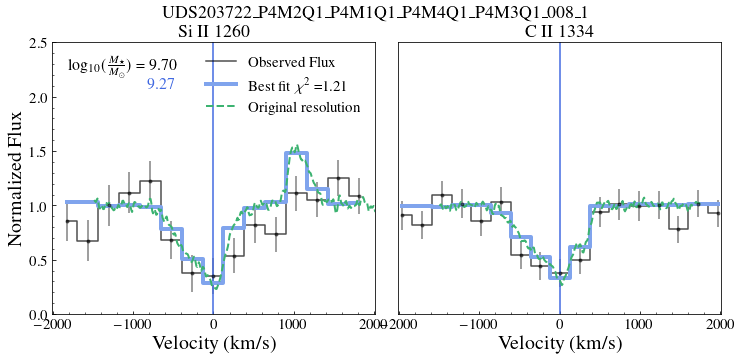

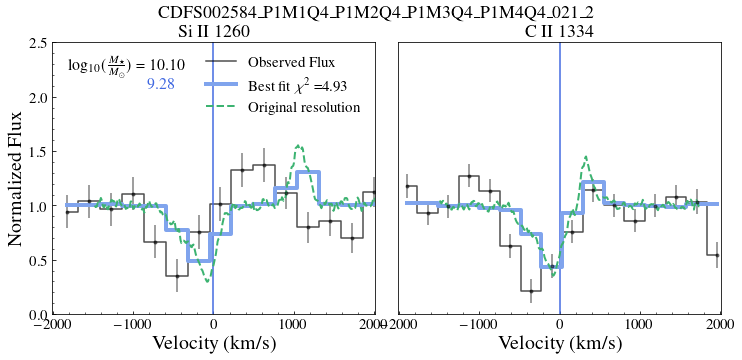

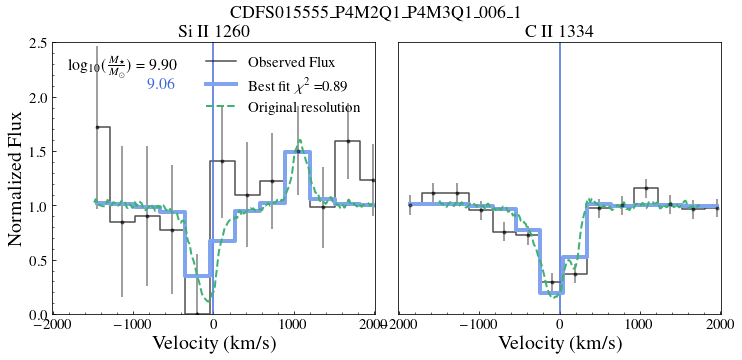

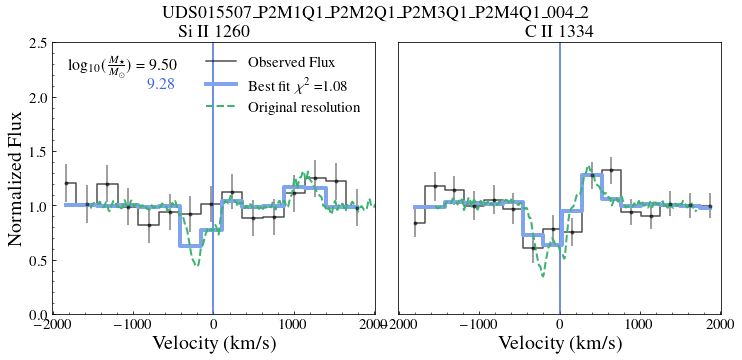

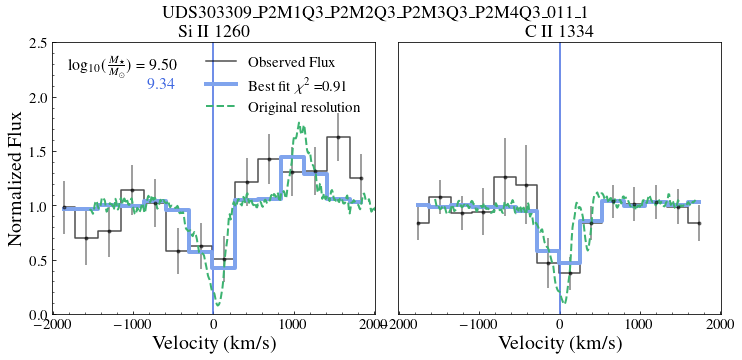

...

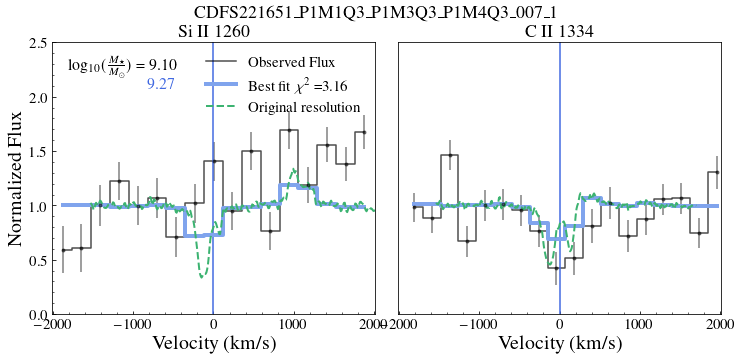

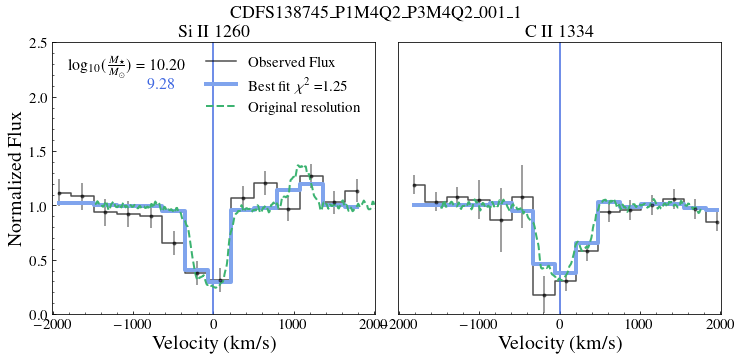

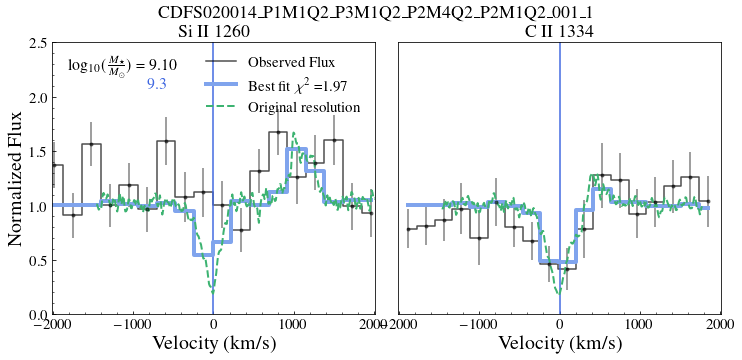

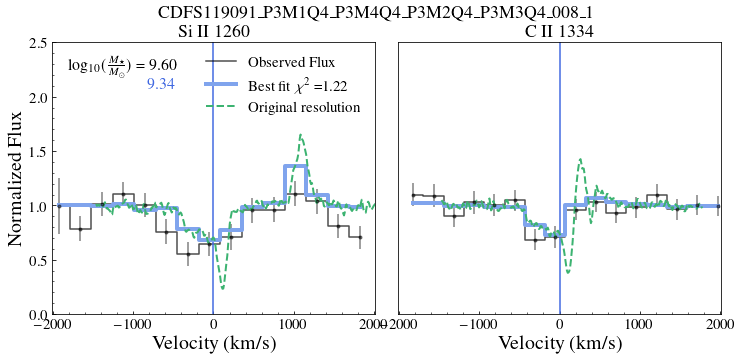

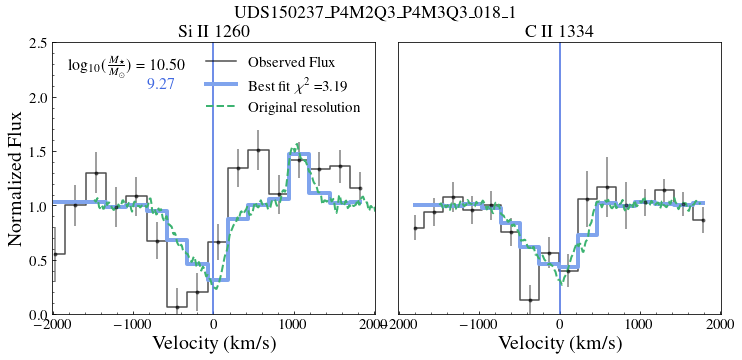

/home/simon/anaconda3/lib/python3.9/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


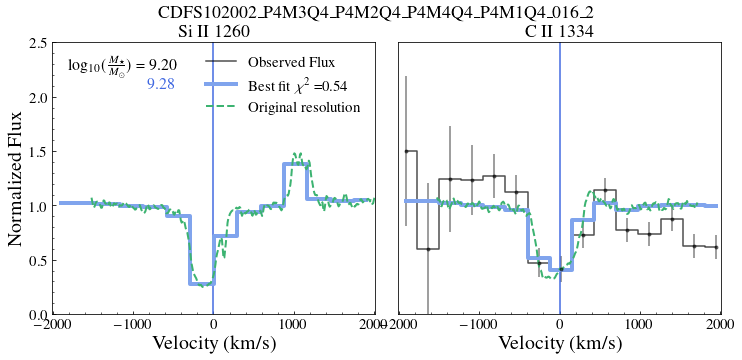

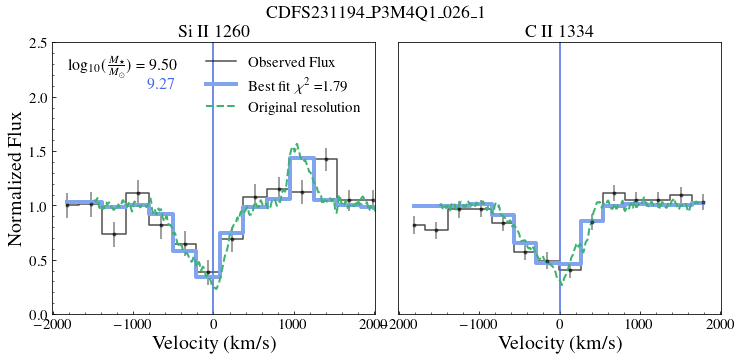

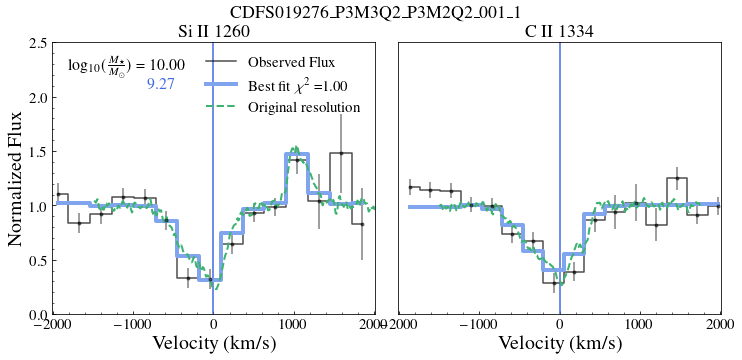

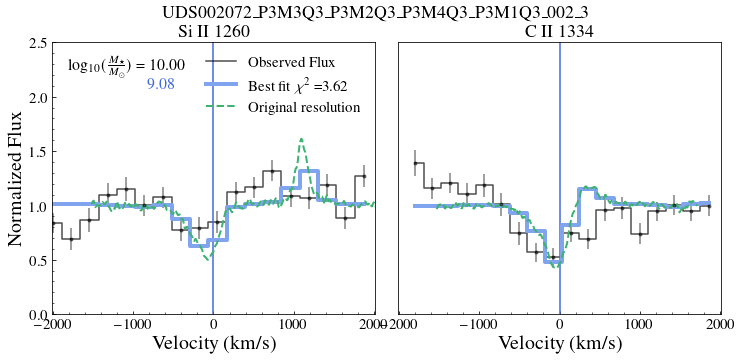

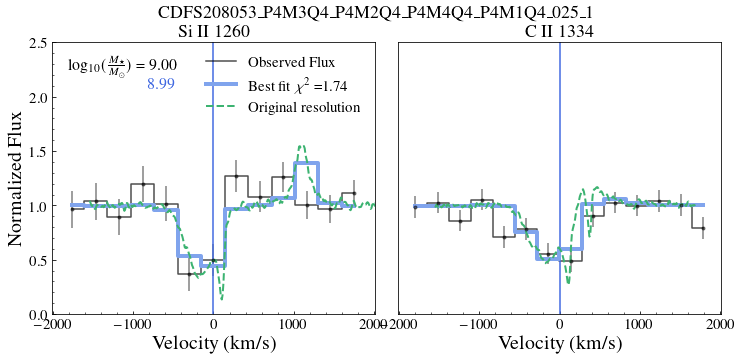

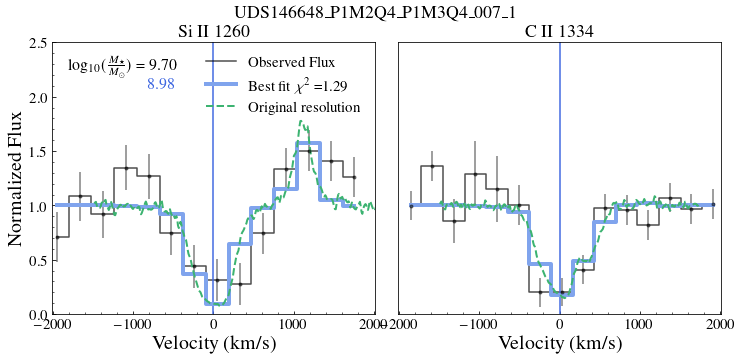

/home/simon/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/home/simon/anaconda3/lib/python3.9/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
/home/simon/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


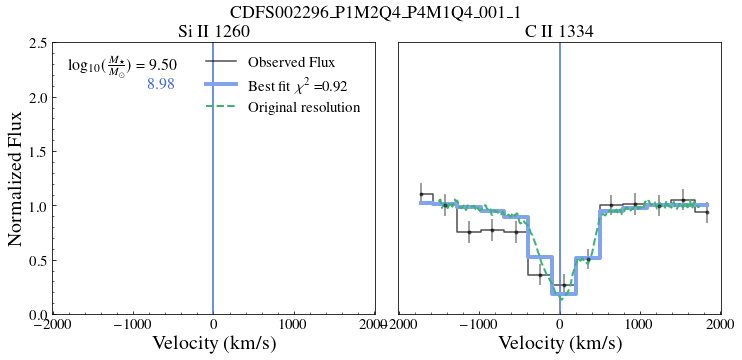

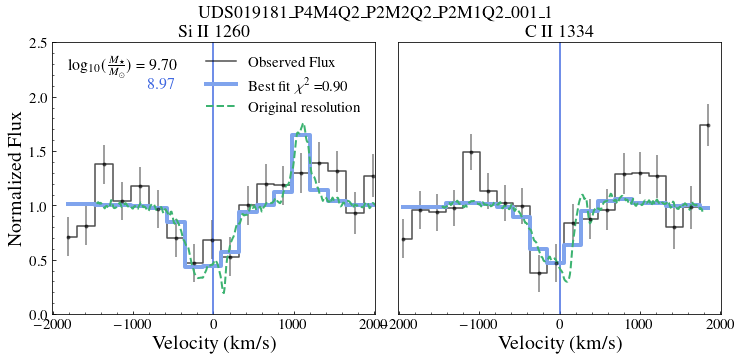

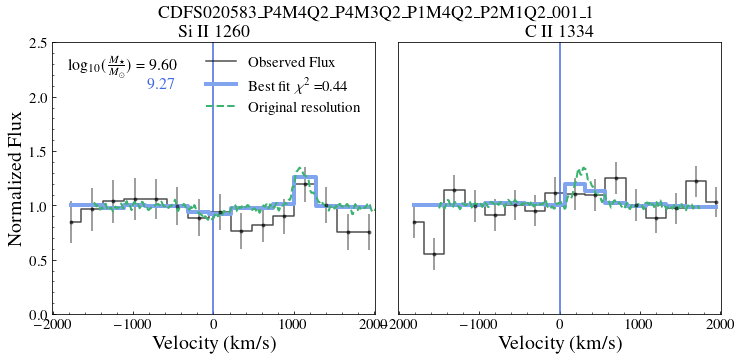

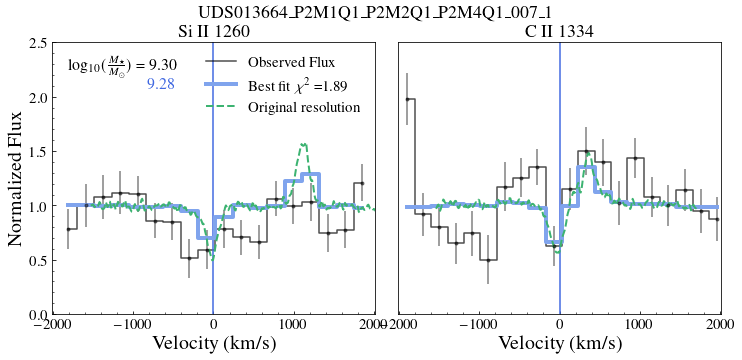

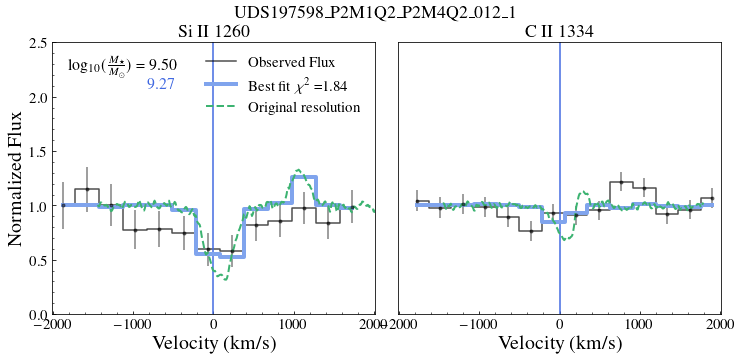

...

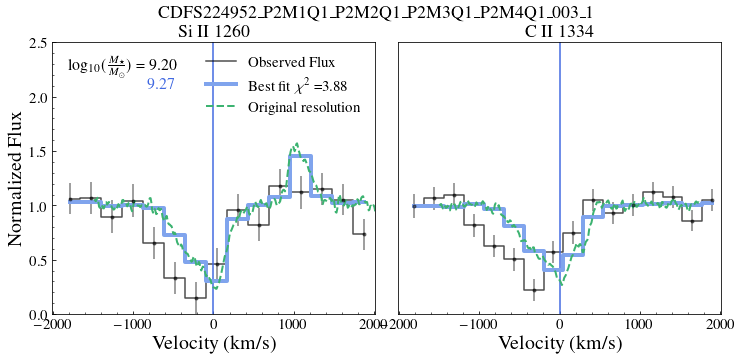

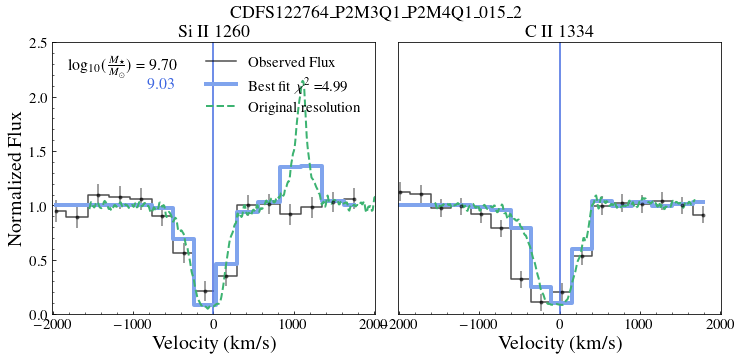

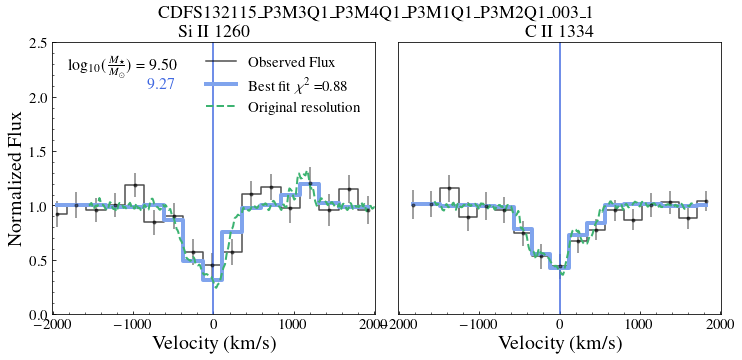

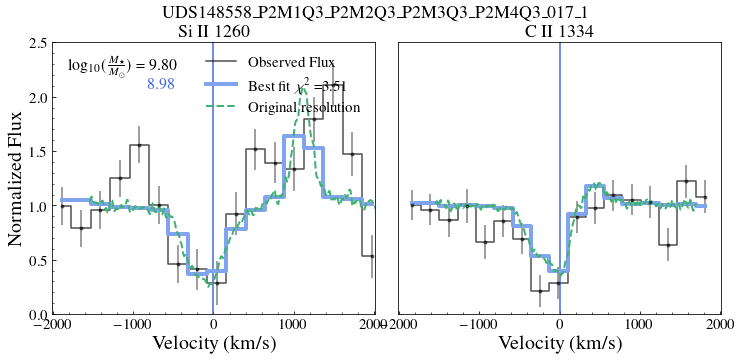

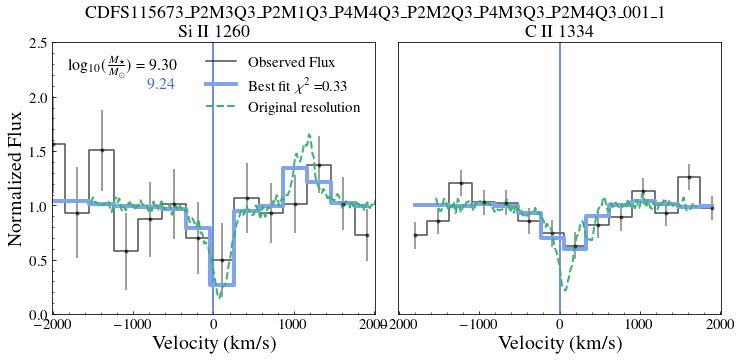

KeyError: 131

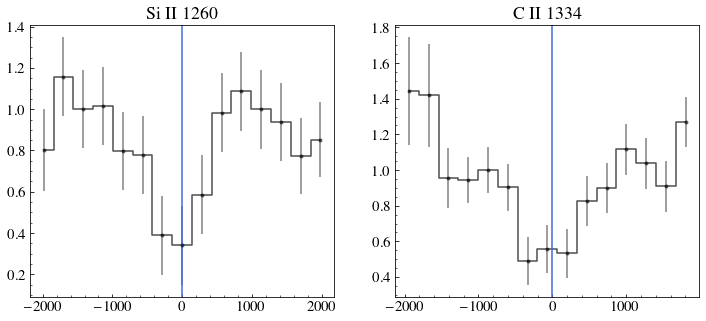

In [588]:
dfFS   = pd.read_csv('Vandels_10best_nooffset.csv')
v_cm = np.genfromtxt(path_to_folder+'./dat_files/vcm_90_164.dat',unpack=True)
chi2allC_FS = []
chi2allS_FS = []
chi2all_FS = []
onesig = 0
twosig = 0
threesig = 0
otherssig = 0
true_i= 0
for i in range(len(info)):    
    
    if(info['snr_per_pix'][i]<5):
        continue
#     print({info["spectrum"][i]})
    dat1 = pd.read_csv(f'vandels_sample/vandels_spectra/{info["spectrum"][i]}.dat',delim_whitespace=True,
                       comment="#", 
                       names = ['wl', 'flam', 'flam_err'])
    redshift = info["z"][i]
    wave = dat1['wl']/(1+redshift)
    err  =  dat1['flam_err']/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
    flux = dat1['flam']/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
    flux[flux<0]=0
    vcIId  = (wave/wcII1334-1)*c
    vsiIId = (wave/wsiII1260-1)*c

    cutCIIall = (vcIId>-2000) & (vcIId<2000) 
    cutSiIIall = (vsiIId>-2000) & (vsiIId<2000)  
    
    fcII     = flux[cutCIIall]
    fsiII    = flux[cutSiIIall]
    ecII     = err[cutCIIall]
    esiII    = err[cutSiIIall]
    vcII     = vcIId[cutCIIall]
    vsiII    = vsiIId[cutSiIIall]  
    
    rmedCII = ((vcII<-500) | (vcII > 500))
    fmedCII = np.nanmedian(fcII[rmedCII])
    fcII /= fmedCII
    
    rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500))) 
    fmedSiII = np.nanmedian(fsiII[rmedSiII])
    fsiII /= fmedSiII
    
    fig, axs = plt.subplots(1,2,figsize=(12,5))
    axs[1].errorbar(vcII, fcII, yerr = ecII, fmt='.k' , alpha=0.5)
    axs[1].plot(vcII, fcII,  c='k', alpha = 0.7,drawstyle='steps-mid' , label = 'Observed Flux')
    axs[1].set_title('C II 1334')
    axs[1].axvline(0, c= 'royalblue')
   
    
    axs[0].errorbar(vsiII, fsiII, yerr = esiII, fmt='.k' , alpha=0.5)
    axs[0].plot(vsiII, fsiII,  c='k',  alpha = 0.7,drawstyle='steps-mid', label = 'Observed Flux' )
    axs[0].set_title('Si II 1260')
    axs[0].axvline(0, c= 'royalblue')


    #######################################################                                                                                           
                                                                                                            
    # with FS
    bestDir         = dfFS['DirAll0'][true_i]
    bestOut         = dfFS['OutputAll0'][true_i]
    bestChi2FS      = dfFS['x2All0'][true_i]
    if(bestChi2FS<=1):
        onesig+=1
    elif(bestChi2FS<=2):
        twosig+=1
    elif(bestChi2FS<=3):
        threesig+=1
    else:
        otherssig+=1
    lcII, fluxcII   = read_spectrum_c(path_to_data,  bestOut )
    lsiII, fluxsiII = read_spectrum_si(path_to_data, bestOut )

            ## CII Plot
    lcII_systemic  = lcII + np.dot(directions[bestDir,:], v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lcII) 
    lcII_systemic  = lcII_systemic[1:]
    vcII_s         = (lcII_systemic/wcII1334 -1)*c
    sigma_pixelcii = rkms_vandels/4 / 2.355/((vcII_s[50]-vcII_s[49]))
    modelcii       = gaussian_filter(fluxcII[bestDir,1:], sigma = sigma_pixelcii)
    modelNewcii    = np.interp(vcII,vcII_s, modelcii)

    rmedCII = ((vcII<-500) | (vcII > 700)) 
    fmedCII = np.nanmedian(modelNewcii[rmedCII])
    modelNewcii /= fmedCII
    modelcii=fluxcII[bestDir,1:]/fmedCII
        ## Si II plot
    lsiII_systemic = lsiII + np.dot(directions[bestDir,:],v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lsiII) 
    lsiII_systemic = lsiII_systemic[1:]
    vsiII_s        = (lsiII_systemic/wsiII1260 -1)*c
    sigma_pixelsi  =  rkms_vandels/4/ 2.355/ ((vsiII_s[50]-vsiII_s[49]))
    modelsi      = gaussian_filter(fluxsiII[bestDir,1:]/np.median(fluxsiII[bestDir,1:]), sigma = sigma_pixelsi)
    modelNewsi     = np.interp(vsiII,vsiII_s, modelsi)
    rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500)))
    fmedSiII = np.nanmedian(modelNewsi[rmedSiII])
    modelNewsi /= fmedSiII  
    modelsi = fluxsiII[bestDir,1:]/np.median(fluxsiII[bestDir,1:])/fmedSiII
    
#     line1 = Line2D([0], [0], label='Observed flux', color='k')    
#     line3 = Line2D([0], [0], label='Best match', color=cFS)
#     patch = patches.Patch(facecolor='#E99F0C', label='Masked', alpha = 0.2)   

# #         handles.extend([patch,line])
#     axs[0].legend([line1,line3], ['Observed flux',  'Best fit'], frameon = False, ncol = 3,
#                  loc = (0.4,1), fontsize = 18)
        
        
    axs[0].set_xlabel('Velocity (km/s)', fontsize = 20,)
    axs[1].set_xlabel('Velocity (km/s)', fontsize = 20)
    axs[0].set_ylabel('Normalized Flux', fontsize = 20)
    axs[1].set_yticks([])
    axs[0].set_xlim(-2010,2010)
    axs[1].set_xlim(-2010,2010)
    plt.suptitle( '%s'%info["spectrum"][i].replace("_", "\_" ), fontsize = 18)
    
    axs[0].set_ylim(0,2.5)
    axs[1].set_ylim(0,2.5)

    maskCII = (vcII >-1000) & (vcII < 1000)
    maskSiII = (vsiII > - 800)   & (vsiII < 1700)
    #& (~((vsiII >-364) & (vsiII <-144)))
    lnlikecII  =  np.nansum(((fcII[maskCII]-modelNewcii[maskCII])**2)/ecII[maskCII]**2)#/len(modelNewcii[maskCII])
    ncII = len(modelNewcii[maskCII])

    lnlikesiII =  np.nansum(((fsiII[maskSiII] - modelNewsi[maskSiII])**2)/esiII[maskSiII]**2)#/len(modelNewsi[maskSiII])
    nsiII = len(modelNewsi[maskSiII])
        
#     print('All ', lnlikecII/ncII, lnlikesiII/nsiII)
    lnlikeall  = (lnlikecII + lnlikesiII)/(ncII+nsiII)
#     print(lnlikeall)  
    chi2allC_FS.append(lnlikecII/ncII)
    chi2allS_FS.append(lnlikesiII/nsiII)
    chi2all_FS.append(lnlikeall)
    axs[1].plot(vcII, modelNewcii, c =cFS, lw = 4, label = 'Best match', drawstyle = 'steps-mid')
    axs[0].plot(vsiII, modelNewsi, c =cFS, lw = 4, drawstyle = 'steps-mid',
                label = 'Best fit $\chi^2$ =%.2f'%(bestChi2FS))# label = 'fesc %.3f'%fesc900[bestOut-90, bestDir])
   

    axs[1].plot(vcII_s, gaussian_filter(modelcii,sigma = 1), c ='mediumseagreen', lw = 2, ls = '--')
    axs[0].plot(vsiII_s, gaussian_filter(modelsi,sigma = 1), c ='mediumseagreen', lw = 2,
                label = 'Original resolution', ls = '--')# label = 'fesc %.3f'%fesc900[bestOut-90, bestDir])

    axs[0].text(0.05, 0.9, r'log$_{10}(\frac{M_\star}{M_\odot})$ = %.2f '%info['lmass'][i],
                transform=axs[0].transAxes, fontsize = 16)
    axs[0].text(0.05+(0.915-0.67), 0.83, str(np.round(np.log10(Mstar[bestOut-90]),2)),
                transform=axs[0].transAxes, fontsize = 16, c = 'royalblue')
    axs[0].legend(frameon = False, loc = 'upper right')
    plt.subplots_adjust(wspace=0.07, hspace=None)
    plt.savefig('Plots/WithoutOffsets/'+info["spectrum"][i]+'_bestmatch_nooffset.pdf', bbox_inches = 'tight')
    plt.show()
    true_i +=1
#     if(true_i>2):
#         break


34 55 16


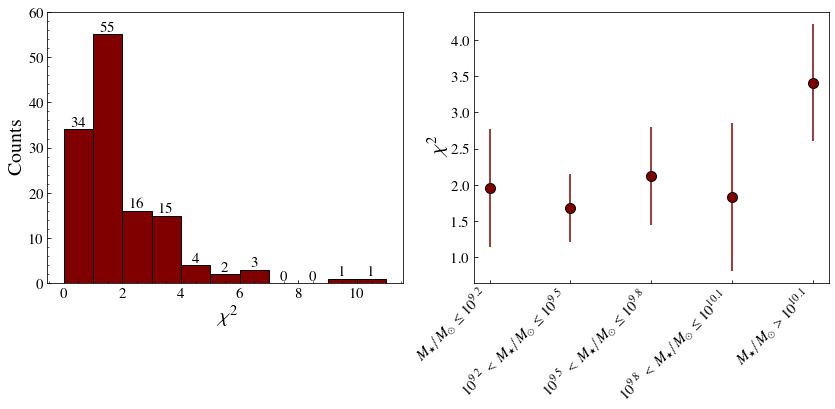

In [565]:
print(onesig, twosig, threesig)
fig, (ax1, ax2) = plt.subplots(1,2, figsize = (14,5))
counts, edges, bars =ax1.hist(dfFS['x2All0'],bins = [0,1,2,3,4,5,6,7,8,9,10,11],align='mid', 
                              alpha = 1, label = 'VANDELS',
             edgecolor = 'k',color = '#800000', )
ax1.set_xlabel(r'$\chi^2$', fontsize = 20)
ax1.set_ylabel(r'Counts', fontsize = 20)
# axs[0].legend(frameon = False, fontsize = 15))           
ax1.bar_label(bars)
ax1.set_ylim(0,60)

mask1 = info['lmass'][info['snr_per_pix']>5]<9.2
mask3 = (9.2 <=info['lmass'][info['snr_per_pix']>5]) & (info['lmass'][info['snr_per_pix']>5]<9.5)
# mask4 = (9.4 <=info['lmass'][info['snr_per_pix']>5]) & (info['lmass'][info['snr_per_pix']>5]<9.6)
mask5 = (9.5 <=info['lmass'][info['snr_per_pix']>5]) & (info['lmass'][info['snr_per_pix']>5]<9.8)
mask6 = (9.8 <=info['lmass'][info['snr_per_pix']>5]) & (info['lmass'][info['snr_per_pix']>5]<10.1)
mask7 = (10.1 <=info['lmass'][info['snr_per_pix']>5]) & (info['lmass'][info['snr_per_pix']>5]<10.4)
# mask8 = (10.2 <=info['lmass'][info['snr_per_pix']>5])#& (info['lmass'][info['snr_per_pix']>5]<10.4)
mask9 = (10.4 <=info['lmass'][info['snr_per_pix']>5])

ychi = [np.mean(dfFS['x2All0'][mask1.values]),
         np.mean(dfFS['x2All0'][mask3.values]),
             np.mean(dfFS['x2All0'][mask5.values]),np.mean(dfFS['x2All0'][mask6.values]),
         np.mean(dfFS['x2All0'][mask7.values])]
ystd = [np.std(dfFS['x2All0'][mask1.values]),
         np.std(dfFS['x2All0'][mask3.values]),
    np.std(dfFS['x2All0'][mask5.values]),np.std(dfFS['x2All0'][mask6.values]),
         np.std(dfFS['x2All0'][mask7.values])]

ax2.errorbar(np.arange(len(ychi)),ychi, yerr = np.asarray(ystd)/2, marker = 'o', markeredgecolor ='k',color = '#800000',
           markersize = 10, ls = 'None')

ax2.minorticks_off()
ax2.set_xticks([0,1,2,3,4])
ax2.set_ylabel(r'$\chi^2$', fontsize = 20)

ax2.set_xticklabels([r'$M_\star/M_\odot \leq 10^{9.2}$',
                     r'$10^{9.2}$ $<$ $M_\star/M_\odot \leq 10^{9.5}$',
                     r'$10^{9.5}$ $<$ $M_\star/M_\odot\leq 10^{9.8}$',
                     r'$10^{9.8}$ $<$ $M_\star/M_\odot  \leq 10^{10.1}$',
                     r'$M_\star/M_\odot > 10^{10.1}$'],ha="right" ,rotation = 45)
plt.savefig('Plots/Chisquare_wooff.pdf', bbox_inches = 'tight')


5      0.430725
13     0.299606
15     0.912445
19     1.130430
27     1.990837
33     1.937158
37     0.455410
61     3.625406
69     1.895476
71     3.163402
78     0.996752
102    6.444831
107    2.159768
Name: x2All0, dtype: float64


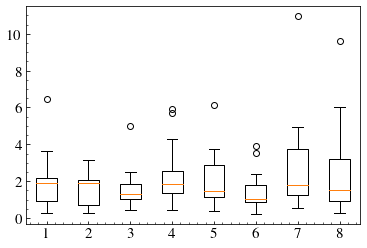

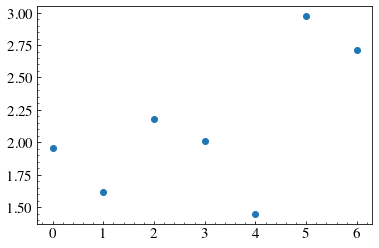

In [541]:
mask1 = info['lmass'][info['snr_per_pix']>5]<9.2
# mask2 = (9 <=info['lmass'][info['snr_per_pix']>5]) & (info['lmass'][info['snr_per_pix']>5]<9.2)
mask3 = (9.2 <=info['lmass'][info['snr_per_pix']>5]) & (info['lmass'][info['snr_per_pix']>5]<9.4)
mask4 = (9.4 <=info['lmass'][info['snr_per_pix']>5]) & (info['lmass'][info['snr_per_pix']>5]<9.6)
mask5 = (9.6 <=info['lmass'][info['snr_per_pix']>5]) & (info['lmass'][info['snr_per_pix']>5]<9.8)
mask6 = (9.8 <=info['lmass'][info['snr_per_pix']>5]) & (info['lmass'][info['snr_per_pix']>5]<10)
mask7 = (10 <=info['lmass'][info['snr_per_pix']>5]) & (info['lmass'][info['snr_per_pix']>5]<10.2)
mask8 = (10.2 <=info['lmass'][info['snr_per_pix']>5])#& (info['lmass'][info['snr_per_pix']>5]<10.4)
mask9 = (10.4 <=info['lmass'][info['snr_per_pix']>5])
         
print(dfFS['x2All0'][mask1.values])
plt.boxplot([dfFS['x2All0'][mask1.values],dfFS['x2All0'][mask2.values],dfFS['x2All0'][mask3.values],
             dfFS['x2All0'][mask4.values],
             dfFS['x2All0'][mask5.values],dfFS['x2All0'][mask6.values],dfFS['x2All0'][mask7.values],
             dfFS['x2All0'][mask8.values]])

plt.figure()
plt.scatter(np.arange(7),[np.mean(dfFS['x2All0'][mask1.values]),
         np.mean(dfFS['x2All0'][mask3.values]),
             np.mean(dfFS['x2All0'][mask4.values]),
             np.mean(dfFS['x2All0'][mask5.values]),np.mean(dfFS['x2All0'][mask6.values]),
         np.mean(dfFS['x2All0'][mask7.values]),
             np.mean(dfFS['x2All0'][mask8.values])])

In [538]:
 info['spectrum'][(info['lmass']>10.4) & (info['snr_per_pix']>5) ]

240                          UDS003664_P1M1Q4_010_1
260    CDFS131961_P3M3Q1_P3M4Q1_P3M1Q1_P3M2Q1_002_1
530                   UDS150237_P4M2Q3_P4M3Q3_018_1
729                          UDS143762_P4M1Q4_033_1
Name: spectrum, dtype: object

### Compare stellar masses

1846000000.0


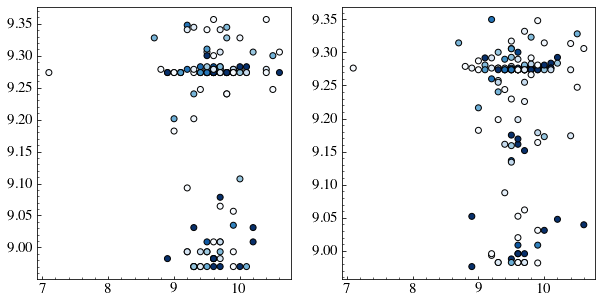

In [154]:
fig, (ax0, ax1) = plt.subplots(1,2,figsize =(14,5) )
ax0.scatter(info[info['snr_per_pix']>5]['lmass'], np.log10(Mstar[outall[:,0].astype(int)-90]), 
            c = Chi2all[:,0], vmin = 1, vmax = 3, cmap = 'Blues', edgecolor = 'k')

bestMstar10 = []
print(np.median(Mstar[outall[i, 0:10].astype(int)-90]))
for i in range(len(outall[:,0])):
    bestMstar10.append(np.median(Mstar[outall[i, :10].astype(int)-90]))
#     print(np.median(Mstar[outall[i, 10*i:10*(i+1)].astype(int)-90]))
ax1.scatter(info[info['snr_per_pix']>5]['lmass'], np.log10(bestMstar10), 
            c = Chi2all[:,0], vmin = 1, vmax = 3, cmap = 'Blues', edgecolor = 'k')

### Escape fractions

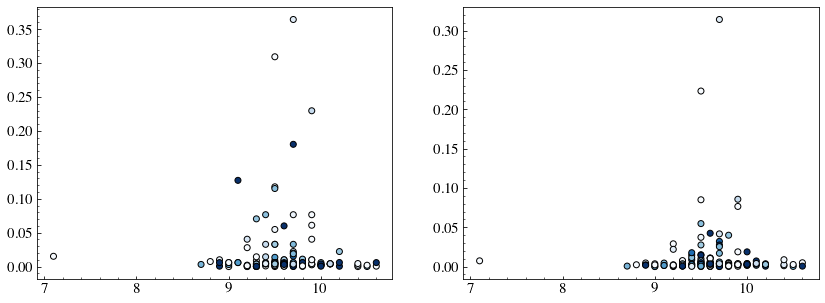

In [160]:
fig, (ax0, ax1) = plt.subplots(1,2,figsize =(14,5) )
ax0.scatter(info[info['snr_per_pix']>5]['lmass'], fesc900[outall[:,0].astype(int)-90,dirall[:,0].astype(int)], 
            c = Chi2all[:,0], vmin = 1, vmax = 3, cmap = 'Blues', edgecolor = 'k')

fesc_med = []
for i in range(len(outall[:,0])):
    fesc_med.append(np.median(fesc900[outall[i, :10].astype(int)-90, dirall[i, :10].astype(int)]))
#     print(np.median(Mstar[outall[i, 10*i:10*(i+1)].astype(int)-90]))
ax1.scatter(info[info['snr_per_pix']>5]['lmass'], fesc_med, 
            c = Chi2all[:,0], vmin = 1, vmax = 3, cmap = 'Blues', edgecolor = 'k')

In [163]:
print(np.mean(fesc_med),np.median(fesc_med), np.std(fesc_med))
fesc_one = fesc900[outall[:,0].astype(int)-90,dirall[:,0].astype(int)]
print(np.mean(fesc_one),np.median(fesc_one), np.std(fesc_one))


0.012376676877862597 0.0034479000000000003 0.035642903548567834
0.02059666411514275 0.0043153 0.051506485305232906


## Fit with shift

In [11]:
def shift5(arr, num, fill_value=1):
    result = np.empty_like(arr)
    if num > 0:
        result[:num] = fill_value
        result[num:] = arr[:-num]
    elif num < 0:
        result[num:] = fill_value
        result[:num] = arr[-num:]
    else:
        result[:] = arr
    return result

### 100 mocks

In [ ]:
import scipy.signal as signal
from scipy import fftpack
import time
nmocks         = 100
Chi2all        = np.zeros((nGal, nmocks)) + 1e40
dirall         = np.zeros((nGal, nmocks)) - 1
outall         = np.zeros((nGal, nmocks)) - 1
offall         = np.zeros((nGal, nmocks)) - 1

v_cm = np.genfromtxt(path_to_folder+'/dat_files/vcm_90_164.dat',unpack=True)
path_to_data = path_to_data_arr[-1]

analyze_i = 0

for i in range(len(info)):    
    
    if(info['snr_per_pix'][i]<5 or info['lmass'][i]<7.5):
        continue
    dat1 = pd.read_csv(f'vandels_sample/vandels_spectra/{info["spectrum"][i]}.dat',delim_whitespace=True,
                       comment="#", 
                       names = ['wl', 'flam', 'flam_err'])
    redshift = info["z"][i]
    wave = dat1['wl']/(1+redshift)
    err  =  dat1['flam_err']/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
    flux = dat1['flam']/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
    flux[flux<0]=0
    vcIId  = (wave/wcII1334-1)*c
    vsiIId = (wave/wsiII1260-1)*c

    cutCIIall = (vcIId>-3000) & (vcIId<3000) 
    cutSiIIall = (vsiIId>-3000) & (vsiIId<3000)  
    
    fcII     = flux[cutCIIall]
    fsiII    = flux[cutSiIIall]
    ecII     = err[cutCIIall]
    esiII    = err[cutSiIIall]
    vcII     = vcIId[cutCIIall]
    vsiII    = vsiIId[cutSiIIall]  
    
    rmedCII = ((vcII<-1200) | (vcII>1200))
    fmedCII = np.nanmedian(fcII[rmedCII])
    fcII /= fmedCII
    
    rmedSiII = ((vsiII<-1000) |  (vsiII > 2000) )
    fmedSiII = np.nanmedian(fsiII[rmedSiII])
    fsiII /= fmedSiII  
    
    
    fig, axs = plt.subplots(1,2,figsize=(12,5))
    axs[1].errorbar(vcII, fcII, yerr = ecII, fmt='.k' , alpha=0.5)
    axs[1].plot(vcII, fcII,  c='k', alpha = 0.7,drawstyle='steps-mid' , label = 'Observed')
    axs[1].set_title('C II 1334')
    axs[1].axvline(0, c= 'royalblue')
   
    
    axs[0].errorbar(vsiII, fsiII, yerr = esiII, fmt='.k' , alpha=0.5)
    axs[0].plot(vsiII, fsiII,  c='k',  alpha = 0.7,drawstyle='steps-mid' )
    axs[0].set_title('Si II 1260')
    axs[0].axvline(0, c= 'royalblue')

    bestfluxsiall = np.zeros((nmocks, len(vsiII)))
    bestfluxciiall = np.zeros((nmocks, len(vcII)))
    
    
    for output in range(90,165,1):
    
        lcII,  fluxcII  = read_spectrum_c(path_to_data,output) 
        lsiII, fluxsiII = read_spectrum_si(path_to_data,output) 
        
        for idir in range(300):
            lcII_systemic = lcII + np.dot(directions[idir,:],v_cm[:,output-90])/c_cgs*1e5*np.mean(lcII) 
            lcII_systemic = lcII_systemic[1:]
            vcII_s    = (lcII_systemic/wcII1334 -1)*c

            lsiII_systemic = lsiII + np.dot(directions[idir,:],v_cm[:,output-90])/c_cgs*1e5*np.mean(lsiII) 
            lsiII_systemic = lsiII_systemic[1:]
            vsiII_s  = (lsiII_systemic/wsiII1260 -1)*c

            sigma_pixelcII  =  rkms_vandels/2 /2.355/ ((vcII_s[50] - vcII_s[49]))
            sigma_pixelsiII =  rkms_vandels/2 /2.355/ ((vsiII_s[50]- vsiII_s[49]))

            modelcII    = gaussian_filter(fluxcII[idir,1:], sigma = sigma_pixelcII)
            modelsiII   = gaussian_filter(fluxsiII[idir,1:], sigma = sigma_pixelsiII)
            

            rmedCII = ((vcII_s<-1200) | (vcII_s>1200))
            fmedCII = np.nanmedian(modelcII[rmedCII])
            modelcII /= fmedCII            

            rmedSiII = ((vsiII_s<-1000) |  (vsiII_s > 2000) )
            fmedSiII = np.nanmedian(modelsiII[rmedSiII])
            modelsiII /= fmedSiII
            
            extrapcII   =  modelcII[(vcII_s>-1500) & (vcII_s<1500)]
            fcIIextrap  =  np.interp(vcII_s[(vcII_s>-1500) & (vcII_s<1500)], vcII,fcII )
            extrapsiII  =  modelsiII[(vsiII_s>-1500) & (vsiII_s<1900)]
            fsiIIextrap =  np.interp(vsiII_s[(vsiII_s>-1500) & (vsiII_s<1900)], vsiII,fsiII )

            modelextrap = np.concatenate((extrapcII, extrapsiII))
            fextrap = np.concatenate((fcIIextrap, fsiIIextrap))

            A = fftpack.fft(np.asarray(fextrap))
            B = fftpack.fft(modelextrap)
            Ar = -A.conjugate()
            Br = -B.conjugate()
            d = np.abs(fftpack.ifft(Ar*B))
            d[100:len(d)-100] = 0
            off = np.argmax(d)
            if(off>len(d)/2):
                off = off - len(fextrap) #-len(modelextrap)
            off = -off
            modelsiII = shift5(modelsiII, off)
            modelcII = shift5(modelcII, off)

            modelNewcII = np.interp(vcII,vcII_s, modelcII)
            modelNewsiII= np.interp(vsiII,vsiII_s, modelsiII)

            maskCII = (vcII >-1000) & (vcII < 1000)
            maskSiII =  (vsiII > -1000)  & (vsiII < 1700)

            
            if(len(ecII[maskCII]) > 0):
                lnlikecII  =  np.nansum(((fcII[maskCII]-modelNewcII[maskCII])**2)/ecII[maskCII]**2) #/len(ecII[maskCII])
                ncII = len(fcII[maskCII])
            else:
                lnlikecII = 0
                ncII = 0
            if(len(esiII[maskSiII]) > 0):
                lnlikesiII =  np.nansum(((fsiII[maskSiII] - modelNewsiII[maskSiII])**2)/esiII[maskSiII]**2)#/len(esiII[maskSiII])
                nsiII = len(fsiII[maskSiII])               
            else:
                lnlikesiII = 0
                nsiII = 0

            if(np.isnan(lnlikesiII)):
                lnlikesiII = 0
                nsiII = 0
            if(np.isnan(lnlikecII)):
                lnlikecII = 0
                ncII = 0
            lnlikeall  = (lnlikecII + lnlikesiII)/(ncII + nsiII)
            
            if(lnlikeall > Chi2all[analyze_i][-1]):
                continue
            else:
                for j in range(nmocks):                            
                    if(lnlikeall < Chi2all[analyze_i][j]):
                        b = dirall[analyze_i].copy()
                        b = np.insert(b, j, idir)
                        b = b[:-1]
                        dirall[analyze_i] = b

                        b = Chi2all[analyze_i].copy()
                        b = np.insert(b, j, lnlikeall)
                        b = b[:-1]
                        Chi2all[analyze_i] = b

                        b = outall[analyze_i].copy()
                        b = np.insert(b,j, output)
                        b = b[:-1]
                        outall[analyze_i] = b

                        b = offall[analyze_i].copy()
                        b = np.insert(b,j, off)
                        b = b[:-1]
                        offall[analyze_i] = b

                        bestfluxsiall = np.insert(bestfluxsiall,j, modelNewsiII,0)
                        bestfluxsiall = bestfluxsiall[:-1, :]

                        bestfluxciiall = np.insert(bestfluxciiall,j, modelNewcII,0)
                        bestfluxciiall = bestfluxciiall[:-1]                 

                        break
 



    for k in range(nmocks):
#         if(np.sum(bestfluxsiall[k]))
        off = offall[analyze_i][k]
        #print(off)
        #print('Velocity offset:', vcII_s[50+int(off)]-vcII_s[50],vsiII_s[50+int(off)]-vsiII_s[50] )
        axs[1].plot(vcII, bestfluxciiall[k],
                label = 'Mock %d - TS %d - Chi %1.3f - off vel %.0f'%(k, outall[analyze_i][k],
                                                             Chi2all[analyze_i][k],
                                                                      vsiII_s[50+int(off)]-vsiII_s[50]), lw = 2)

        axs[0].plot(vsiII, bestfluxsiall[k],  lw = 4)

    plt.subplots_adjust(wspace = 0.1)
#     plt.suptitle(label[i])
#     plt.savefig('Plots/'+info["spectrum"][i]+'match_off.pdf', bbox_inches = 'tight')
    axs[0].set_ylim(-0.5,3)
    axs[1].set_ylim(-0.5,3)
    axs[0].set_xlim(-2000,2000)
    axs[1].set_xlim(-2000,2000)   
    analyze_i +=1
    plt.show()
    plt.close()
#     break

                

In [241]:
totCol = np.vstack((info[(info['snr_per_pix']>=5) & (info['lmass']>7.5)]['spectrum'],outall[:,0].astype(int), 
                    dirall[:,0].astype(int),Chi2all[:,0], offall[:,0]))
C=['Galaxy','OutputAll0','DirAll0', 'x2All0', 'outAll0']

for k in range(1,nmocks):
    totCol = np.vstack((totCol,outall[:,k].astype(int), dirall[:,k].astype(int),Chi2all[:,k],offall[:,k]))
    C.extend([f'OutputAll{k}',f'DirAll{k}',f'x2All{k}', f'outAll{k}'])
    
# print(C)
# print(totCol)
df = pd.DataFrame(totCol.T) # A is a numpy 2d array
df.to_csv(f"Vandels_100best_offset.csv", sep=',', header= C, index=False) 

### All chi square

In [23]:
import scipy.signal as signal
from scipy import fftpack
import time
Chi2all        = np.zeros((nGal, 75, 300)) + 1e40
offall         = np.zeros((nGal, 75, 300)) - 1

v_cm = np.genfromtxt(path_to_folder+'/dat_files/vcm_90_164.dat',unpack=True)
path_to_data = path_to_data_arr[-1]

analyze_i = 0

for i in range(len(info)):    
    
    if(mask[i] == False):
        continue
    dat1 = pd.read_csv(f'vandels_sample/vandels_spectra/{info["spectrum"][i]}.dat',delim_whitespace=True,
                       comment="#", 
                       names = ['wl', 'flam', 'flam_err'])
    redshift = info["z"][i]
    wave     = dat1['wl']/(1+redshift)
    err      =  dat1['flam_err']/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
    flux     = dat1['flam']/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
    flux[flux<0]=0
    vcIId  = (wave/wcII1334-1)*c
    vsiIId = (wave/wsiII1260-1)*c

    cutCIIall = (vcIId>-3000) & (vcIId<3000) 
    cutSiIIall = (vsiIId>-3000) & (vsiIId<3000)  
    
    fcII     = flux[cutCIIall]
    fsiII    = flux[cutSiIIall]
    ecII     = err[cutCIIall]
    esiII    = err[cutSiIIall]
    vcII     = vcIId[cutCIIall]
    vsiII    = vsiIId[cutSiIIall]  
    
    rmedCII = ((vcII<-1200) | (vcII>1200))
    fmedCII = np.nanmedian(fcII[rmedCII])
    fcII /= fmedCII
    
    rmedSiII = ((vsiII<-1000) |  (vsiII > 2000) )
    fmedSiII = np.nanmedian(fsiII[rmedSiII])
    fsiII /= fmedSiII  
    
    
#     fig, axs = plt.subplots(1,2,figsize=(12,5))
#     axs[1].errorbar(vcII, fcII, yerr = ecII, fmt='.k' , alpha=0.5)
#     axs[1].plot(vcII, fcII,  c='k', alpha = 0.7,drawstyle='steps-mid' , label = 'Observed')
#     axs[1].set_title('C II 1334')
#     axs[1].axvline(0, c= 'royalblue')
   
    
#     axs[0].errorbar(vsiII, fsiII, yerr = esiII, fmt='.k' , alpha=0.5)
#     axs[0].plot(vsiII, fsiII,  c='k',  alpha = 0.7,drawstyle='steps-mid' )
#     axs[0].set_title('Si II 1260')
#     axs[0].axvline(0, c= 'royalblue')

    bestfluxsiall = np.zeros((nmocks, len(vsiII)))
    bestfluxciiall = np.zeros((nmocks, len(vcII)))
    
    
    for output in range(90,165,1):
    
        lcII,  fluxcII  = read_spectrum_c(path_to_data,output) 
        lsiII, fluxsiII = read_spectrum_si(path_to_data,output) 
        
        for idir in range(300):
            lcII_systemic = lcII + np.dot(directions[idir,:],v_cm[:,output-90])/c_cgs*1e5*np.mean(lcII) 
            lcII_systemic = lcII_systemic[1:]
            vcII_s    = (lcII_systemic/wcII1334 -1)*c

            lsiII_systemic = lsiII + np.dot(directions[idir,:],v_cm[:,output-90])/c_cgs*1e5*np.mean(lsiII) 
            lsiII_systemic = lsiII_systemic[1:]
            vsiII_s  = (lsiII_systemic/wsiII1260 -1)*c

            sigma_pixelcII  =  rkms_vandels/2 /2.355/ ((vcII_s[50] - vcII_s[49]))
            sigma_pixelsiII =  rkms_vandels/2 /2.355/ ((vsiII_s[50]- vsiII_s[49]))

            modelcII    = gaussian_filter(fluxcII[idir,1:], sigma = sigma_pixelcII)
            modelsiII   = gaussian_filter(fluxsiII[idir,1:], sigma = sigma_pixelsiII)
            

            rmedCII = ((vcII_s<-1200) | (vcII_s>1200))
            fmedCII = np.nanmedian(modelcII[rmedCII])
            modelcII /= fmedCII            

            rmedSiII = ((vsiII_s<-1000) |  (vsiII_s > 2000) )
            fmedSiII = np.nanmedian(modelsiII[rmedSiII])
            modelsiII /= fmedSiII
            
            extrapcII   =  modelcII[(vcII_s>-1500) & (vcII_s<1500)]
            fcIIextrap  =  np.interp(vcII_s[(vcII_s>-1500) & (vcII_s<1500)], vcII,fcII )
            extrapsiII  =  modelsiII[(vsiII_s>-1500) & (vsiII_s<1900)]
            fsiIIextrap =  np.interp(vsiII_s[(vsiII_s>-1500) & (vsiII_s<1900)], vsiII,fsiII )

            modelextrap = np.concatenate((extrapcII, extrapsiII))
            fextrap = np.concatenate((fcIIextrap, fsiIIextrap))

            A = fftpack.fft(np.asarray(fextrap))
            B = fftpack.fft(modelextrap)
            Ar = -A.conjugate()
            Br = -B.conjugate()
            d = np.abs(fftpack.ifft(Ar*B))
            d[100:len(d)-100] = 0
            off = np.argmax(d)
            if(off>len(d)/2):
                off = off - len(fextrap) #-len(modelextrap)
            off = -off
            modelsiII = shift5(modelsiII, off)
            modelcII = shift5(modelcII, off)

            modelNewcII = np.interp(vcII,vcII_s, modelcII)
            modelNewsiII= np.interp(vsiII,vsiII_s, modelsiII)

            maskCII = (vcII >-1000) & (vcII < 1000)
            maskSiII =  (vsiII > -1000)  & (vsiII < 1700)

            
            if(len(ecII[maskCII]) > 0):
                lnlikecII  =  np.nansum(((fcII[maskCII]-modelNewcII[maskCII])**2)/ecII[maskCII]**2) #/len(ecII[maskCII])
                ncII = len(fcII[maskCII])
            else:
                lnlikecII = 0
                ncII = 0
            if(len(esiII[maskSiII]) > 0):
                lnlikesiII =  np.nansum(((fsiII[maskSiII] - modelNewsiII[maskSiII])**2)/esiII[maskSiII]**2)#/len(esiII[maskSiII])
                nsiII = len(fsiII[maskSiII])               
            else:
                lnlikesiII = 0
                nsiII = 0

            if(np.isnan(lnlikesiII)):
                lnlikesiII = 0
                nsiII = 0
            if(np.isnan(lnlikecII)):
                lnlikecII = 0
                ncII = 0
            lnlikeall  = (lnlikecII + lnlikesiII)/(ncII + nsiII)
        
            Chi2all[analyze_i][output-90][idir] = lnlikeall
            offall[analyze_i][output-90][idir] = off

                 



#     for k in range(nmocks):
# #         if(np.sum(bestfluxsiall[k]))
#         off = offall[analyze_i][k]
#         #print(off)
#         #print('Velocity offset:', vcII_s[50+int(off)]-vcII_s[50],vsiII_s[50+int(off)]-vsiII_s[50] )
#         axs[1].plot(vcII, bestfluxciiall[k],
#                 label = 'Mock %d - TS %d - Chi %1.3f - off vel %.0f'%(k, outall[analyze_i][k],
#                                                              Chi2all[analyze_i][k],
#                                                                       vsiII_s[50+int(off)]-vsiII_s[50]), lw = 2)

#         axs[0].plot(vsiII, bestfluxsiall[k],  lw = 4)

#     plt.subplots_adjust(wspace = 0.1)
# #     plt.suptitle(label[i])
# #     plt.savefig('Plots/'+info["spectrum"][i]+'match_off.pdf', bbox_inches = 'tight')
#     axs[0].set_ylim(-0.5,3)
#     axs[1].set_ylim(-0.5,3)
#     axs[0].set_xlim(-2000,2000)
#     axs[1].set_xlim(-2000,2000)   
    analyze_i +=1
    plt.show()
    plt.close()
#     break

                

In [31]:
totCol = np.vstack((Chi2all.reshape(nGal,22500)))
C=info[mask]['spectrum'].values

# for k in range(1,nmocks):
#     totCol = np.vstack((totCol,outall[:,k].astype(int), dirall[:,k].astype(int),Chi2all[:,k],offall[:,k]))
#     C.extend([f'OutputAll{k}',f'DirAll{k}',f'x2All{k}', f'outAll{k}'])
    
# print(C)
# print(totCol)
df = pd.DataFrame(totCol.T) # A is a numpy 2d array
df.to_csv(f"Vandels_allbest_offset.csv", sep=',', header= C, index=False) 

In [30]:
print(info[mask]['spectrum'].values.T)

['UDS203722_P4M2Q1_P4M1Q1_P4M4Q1_P4M3Q1_008_1'
 'CDFS002584_P1M1Q4_P1M2Q4_P1M3Q4_P1M4Q4_021_2'
 'CDFS015555_P4M2Q1_P4M3Q1_006_1'
 'UDS015507_P2M1Q1_P2M2Q1_P2M3Q1_P2M4Q1_004_2'
 'UDS303309_P2M1Q3_P2M2Q3_P2M3Q3_P2M4Q3_011_1'
 'CDFS025828_P2M3Q2_P2M4Q2_013_1' 'UDS002096_P2M1Q4_P2M2Q4_002_2'
 'UDS013500_P2M1Q1_P2M4Q1_P3M1Q2_P3M2Q2_002_1' 'UDS151133_P1M2Q4_020_2'
 'UDS026287_P1M3Q2_P4M4Q1_P1M1Q2_P1M4Q2_P1M2Q2_001_2'
 'UDS026179_P2M3Q2_P2M4Q2_015_1'
 'CDFS006417_P2M4Q4_P4M3Q4_P4M2Q4_P4M4Q4_P4M1Q4_001_1'
 'CDFS208015_P2M1Q4_P2M2Q4_P2M3Q4_P2M4Q4_002_2'
 'CDFS231741_P2M3Q1_P2M4Q1_012_1'
 'UDS306754_P2M1Q4_P2M2Q4_P2M3Q4_P2M4Q4_005_1'
 'CDFS238431_P3M3Q1_P3M2Q1_009_1' 'CDFS019568_P1M4Q2_P2M1Q2_007_1'
 'CDFS123006_P2M3Q2_P4M1Q2_P4M4Q2_P2M2Q2_P4M2Q2_P4M3Q2_001_1'
 'CDFS141027_P2M2Q1_P2M3Q1_001_2' 'CDFS129887_P2M3Q1_P2M4Q1_014_1'
 'CDFS247534_P1M1Q1_P1M2Q1_P1M3Q1_P1M4Q1_011_1'
 'CDFS101998_P4M3Q4_P4M2Q4_P4M4Q4_P4M1Q4_015_2'
 'CDFS005891_P4M3Q4_P4M2Q4_P4M4Q4_P4M1Q4_007_1'
 'CDFS246390_P2M1Q1_P2M2Q1_P

### Plot some fits, see quality

UDS203722_P4
here 1
here 1
9.7 0.8205468030127248 0.7772197059741653 0.8735021438376308


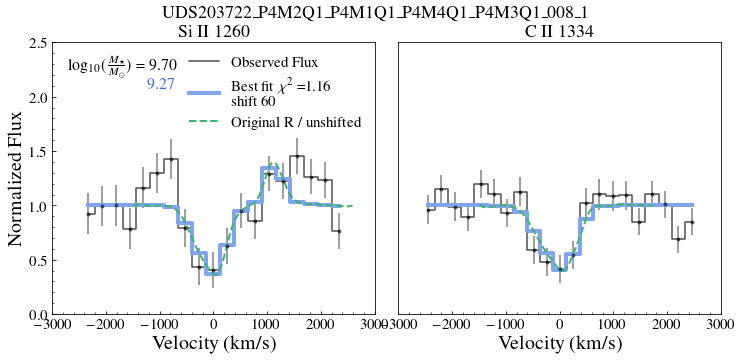

CDFS002584_P
10.1 1.0766193452305595 1.260382697919898 0.8724378422424055


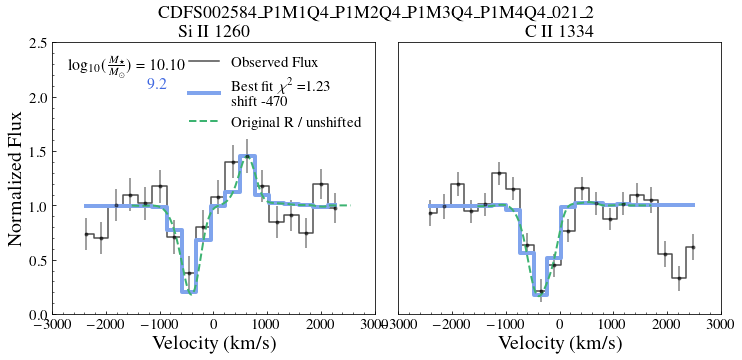

CDFS015555_P
9.9 1.1497102324125588 1.9619023736613233 0.23599407350769885


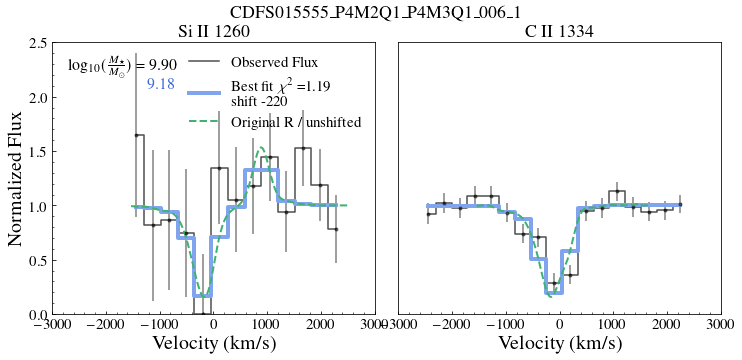

UDS015507_P2
here 1
here 1
9.5 0.7120176998862007 0.8384886670624958 0.5714944030236505


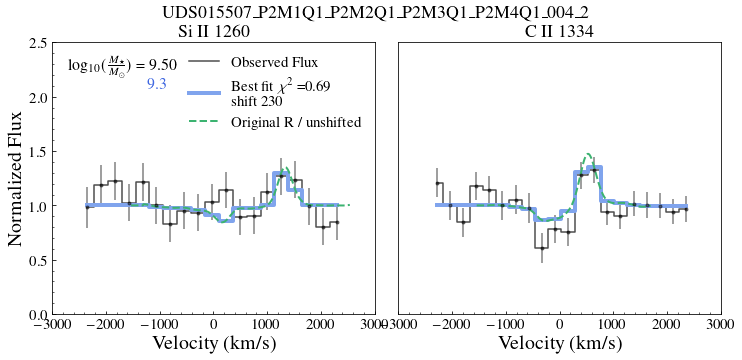

UDS303309_P2
here 1
here 1
9.5 0.6040591015377728 0.44313430890515815 0.8052150923285413


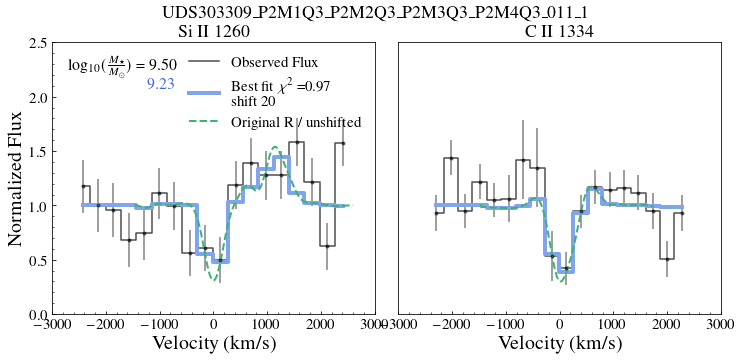

CDFS025828_P
here 1
here 1
9.5 0.3763416950947322 0.4448637913487006 0.30020603259032297


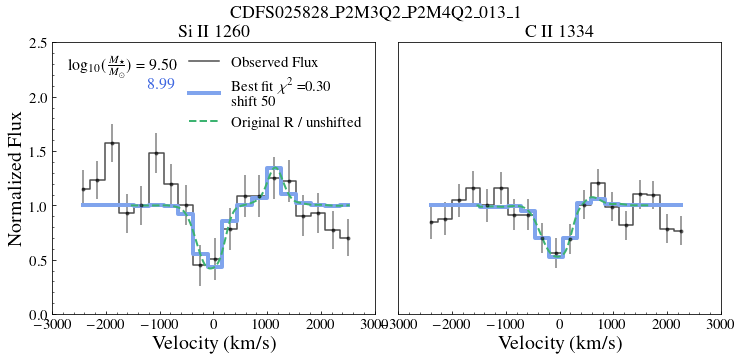

UDS002096_P2
here 1
here 1
10.2 1.0617744287244733 0.6542125566164004 1.5146209532889983


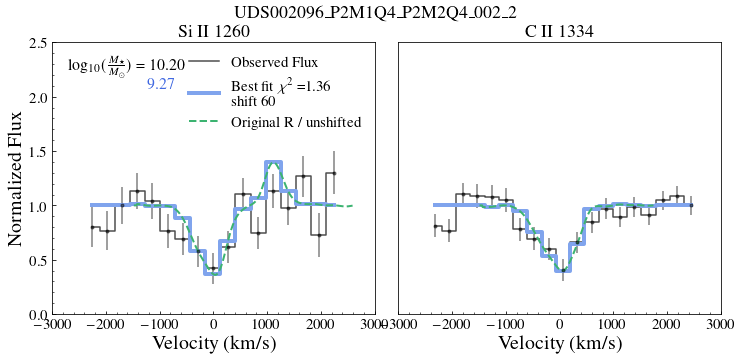

UDS013500_P2
9.6 1.7266256476645456 2.7902423389035174 0.5566472873016771


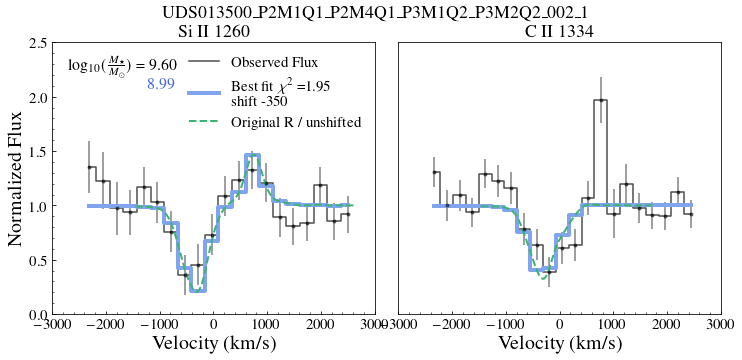

UDS151133_P1
9.4 1.037715264758388 1.3356535518634778 0.7066727235305105


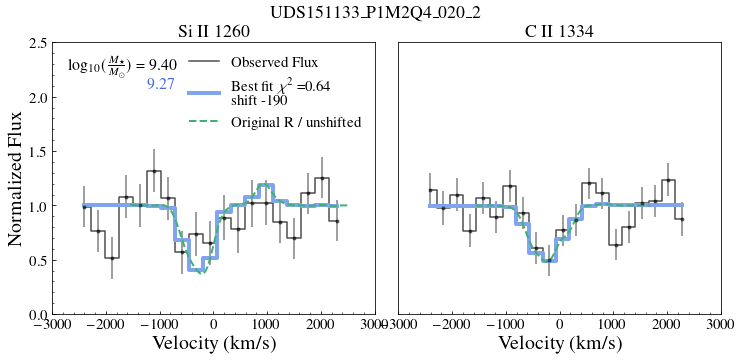

UDS026287_P1
here 1
here 1
9.7 1.5765616372943037 1.3247014540066382 1.85640628539171


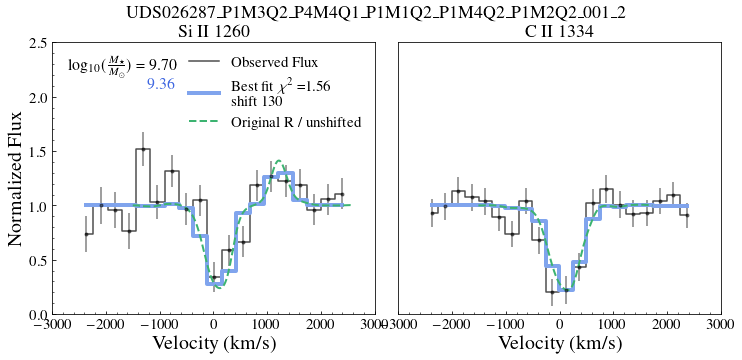

UDS026179_P2
10.1 0.846557727171704 0.9893114925919841 0.6879424322602818


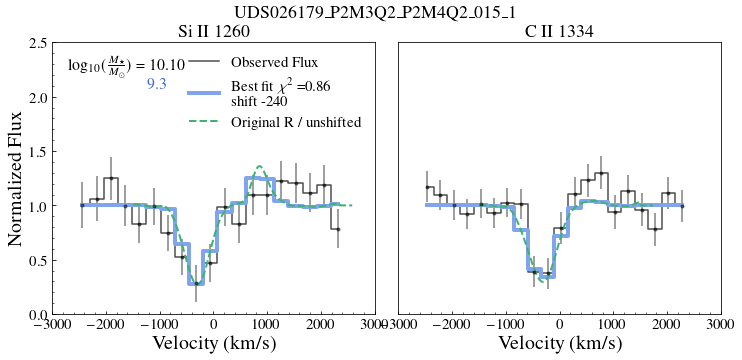

CDFS006417_P
here 1
here 1
9.7 1.15953709042756 1.1506911899334045 1.1693658687543997


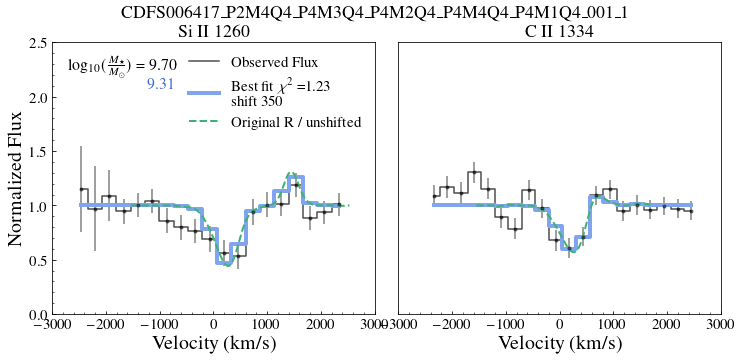

CDFS208015_P
9.3 0.33192774488579035 0.444329186470814 0.20703725423576408


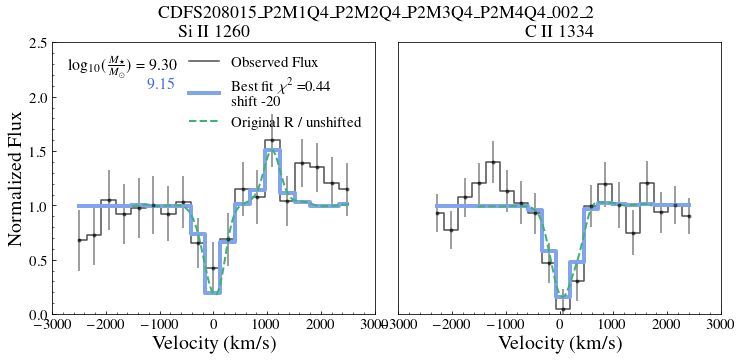

CDFS231741_P
here 1
here 1
9.0 1.2692329718638027 1.172314271578007 1.3661516721495985


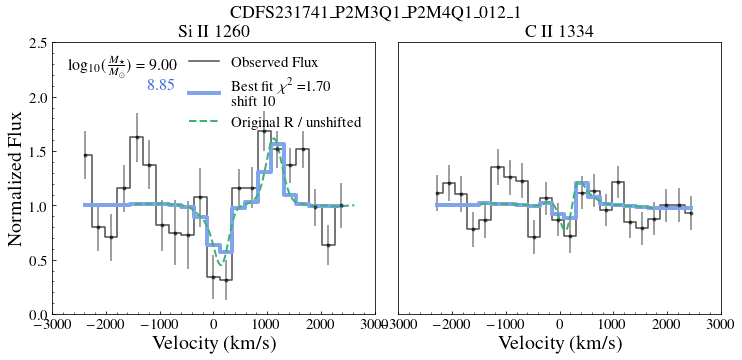

UDS306754_P2
here 1
here 1
9.5 0.8544598474422346 0.5289787250237241 1.179940969860745


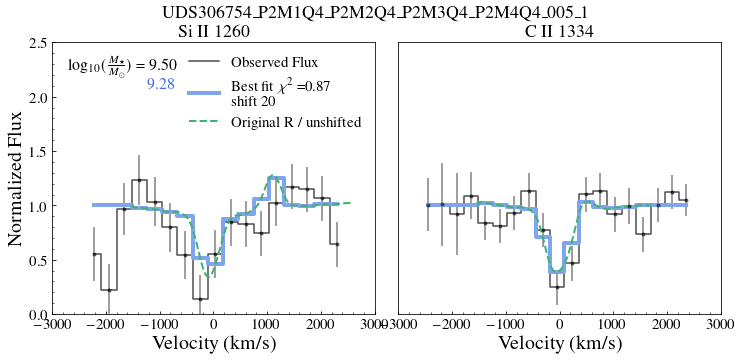

CDFS238431_P
9.7 1.8669099956965447 2.134732327047675 1.572305431210302


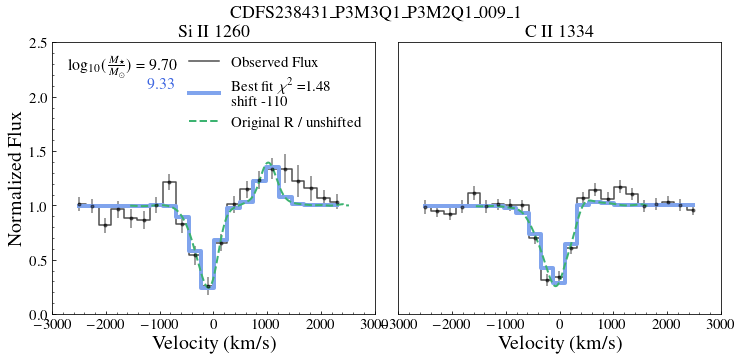

CDFS019568_P
8.8 1.2481403950740821 1.9392415186303744 0.55703927151779


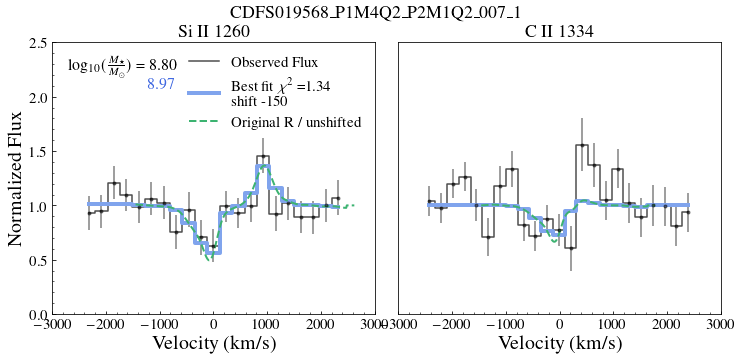

CDFS123006_P
9.6 1.5073239407905887 1.7833244331263693 1.2006567270841662


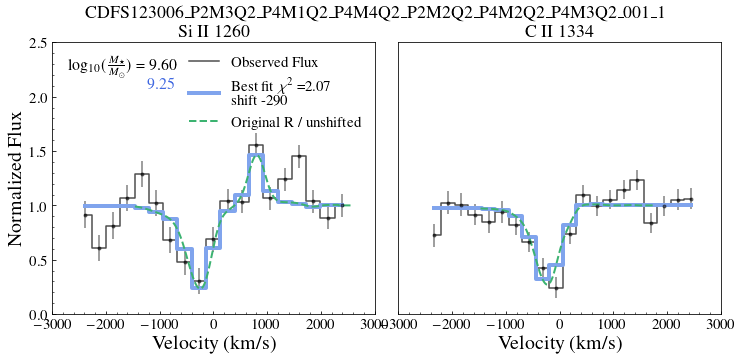

CDFS141027_P
here 1
here 1
9.5 0.7984522804974179 0.48975156110013807 1.1071529998946978


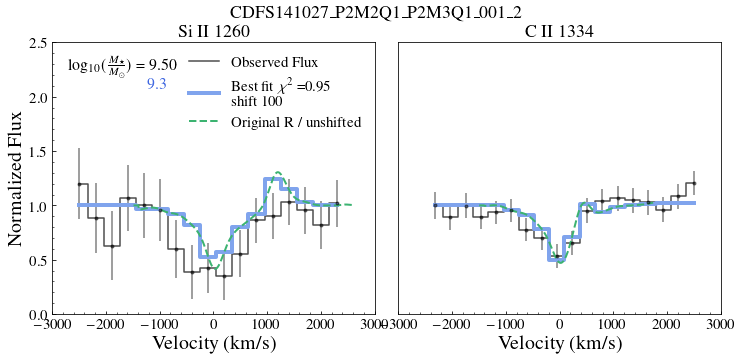

CDFS129887_P
9.5 0.6704290557452104 0.5290936423283168 0.8117644691621041


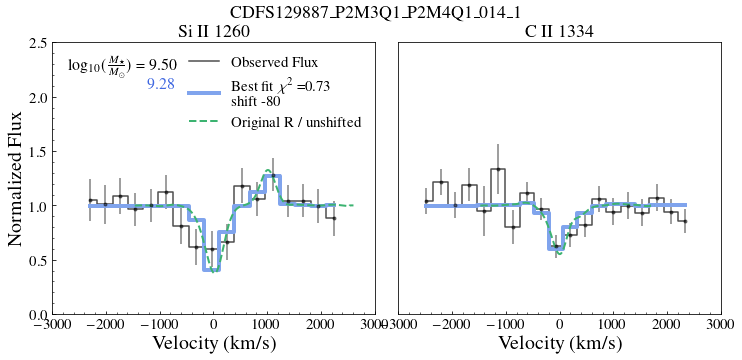

CDFS247534_P
here 1
here 1
8.9 1.4106441269590757 2.481344643458764 0.3399436104593871


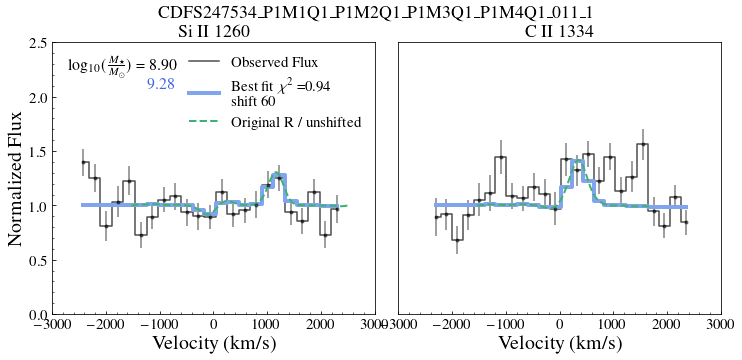

CDFS101998_P
here 1
here 1
9.4 0.6305530776751024 0.14964581228729132 1.1114603430629135


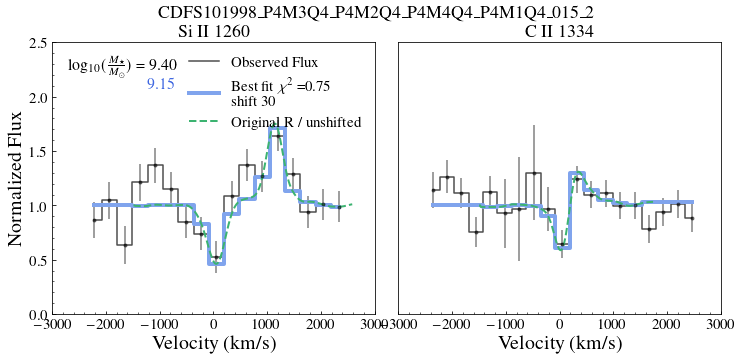

CDFS005891_P
9.5 0.844203470524342 1.0091950477443137 0.6792118933043702


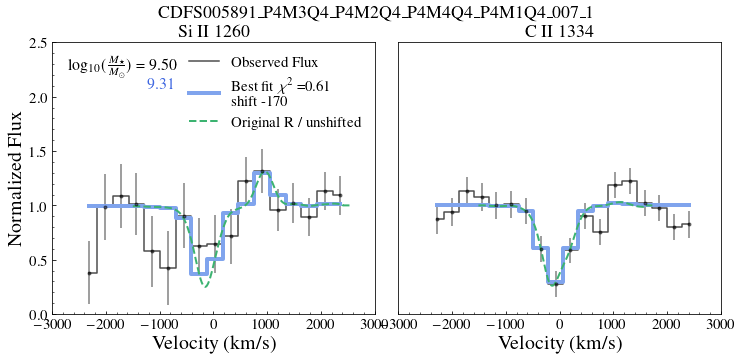

CDFS246390_P
here 1
here 1
9.2 0.9900488924316426 1.1854981886895313 0.7728830077006552


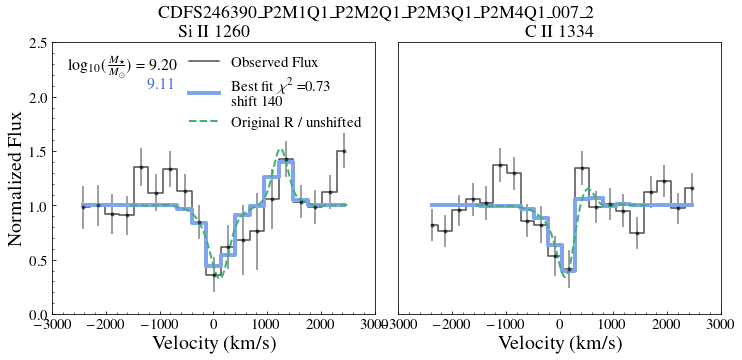

CDFS023037_P
9.2 0.48725394100296693 0.5976103779193804 0.37689750408655337


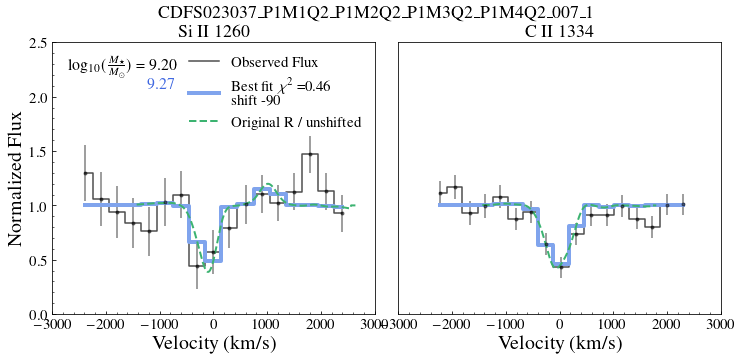

CDFS115905_P
9.3 1.6706180615719326 2.109826833374669 1.2314092897691962


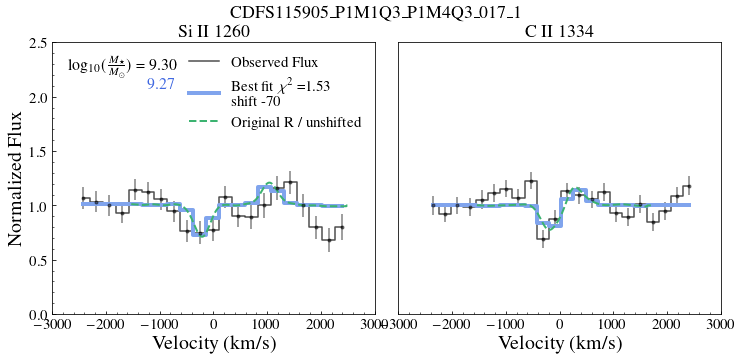

CDFS226606_P
here 1
here 1
9.3 1.5071126213547459 0.7176334399168508 2.296591802792641


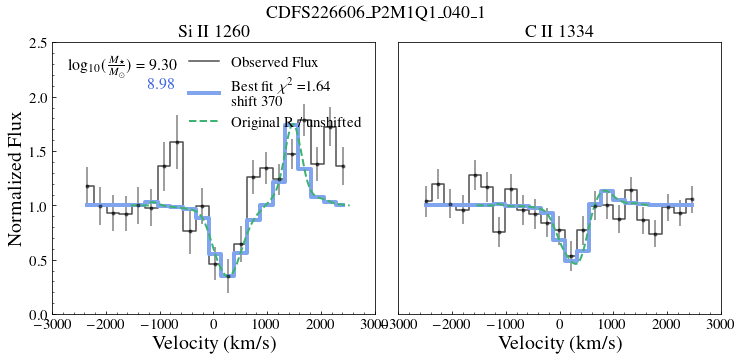

UDS395442_P4
9.9 0.8032118901705829 0.4797856787645582 1.1266381015766074


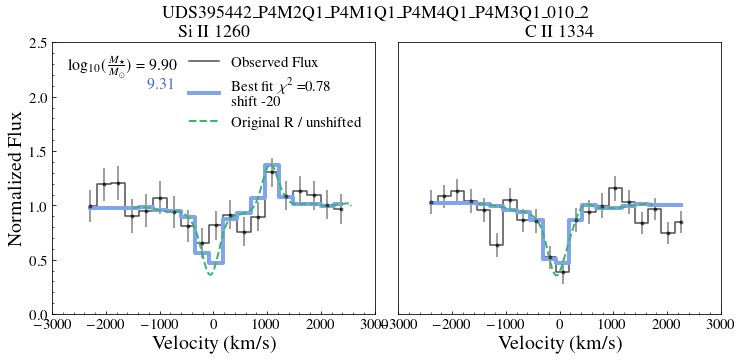

CDFS208175_P
here 1
here 1
9.0 2.5794663090256904 2.8765608074617774 2.2493613107633714


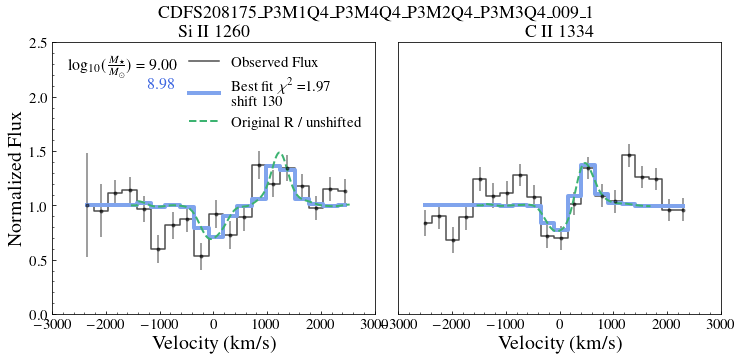

UDS003664_P1
10.6 3.0676382404317613 3.6802242620049808 2.3937936167012204


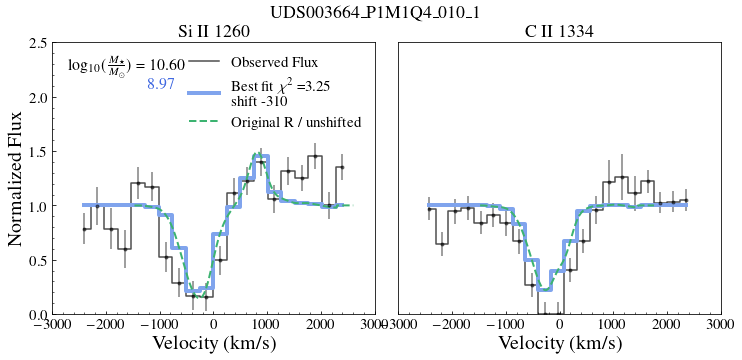

UDS009473_P4
9.5 0.838869749589229 0.8024243496286352 0.8789596895458821


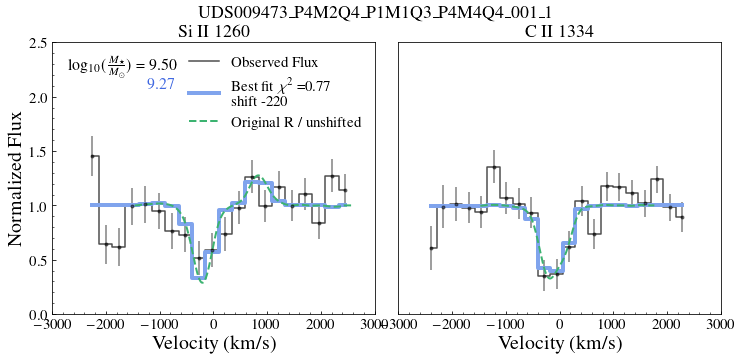

CDFS131961_P
here 1
here 1
10.6 3.346359091313925 4.015645839113383 2.6770723435144665


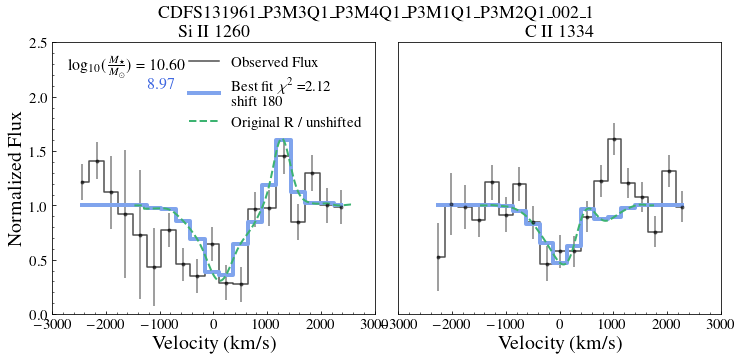

UDS149311_P1
here 1
here 1
10.0 1.7988739311823418 2.971752158027187 0.625995704337497


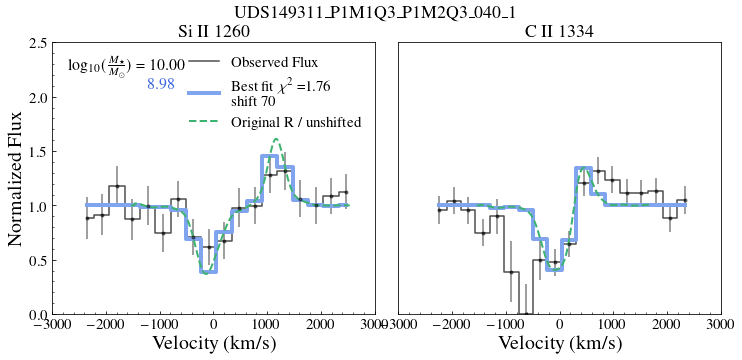

CDFS113988_P
here 1
here 1
9.7 1.7145229345836777 2.763043696968813 0.6660021721985425


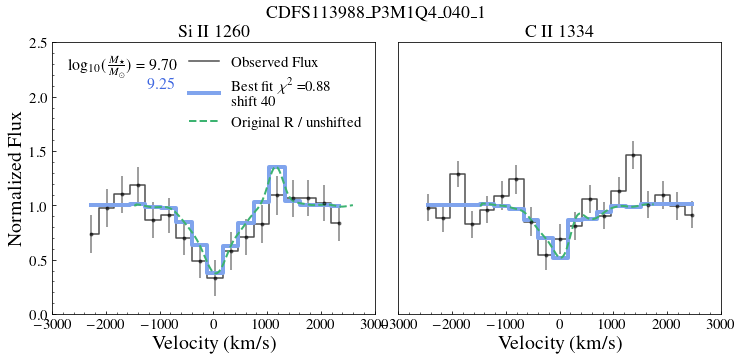

UDS205390_P1
8.7 0.8312615356155417 0.18337523497523733 1.4791478362558461


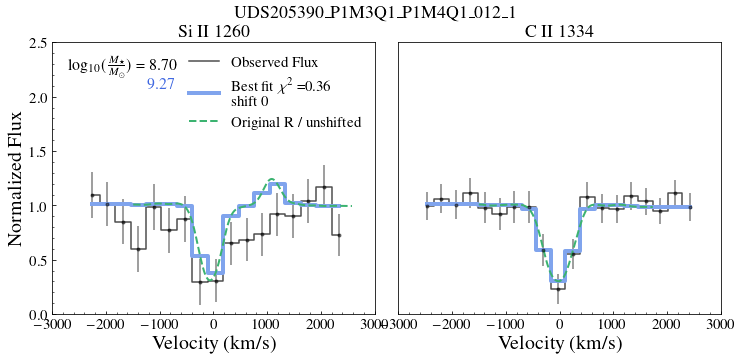

CDFS107428_P
here 1
here 1
9.8 1.0013309115171476 0.5686244511562873 1.4340373718780077


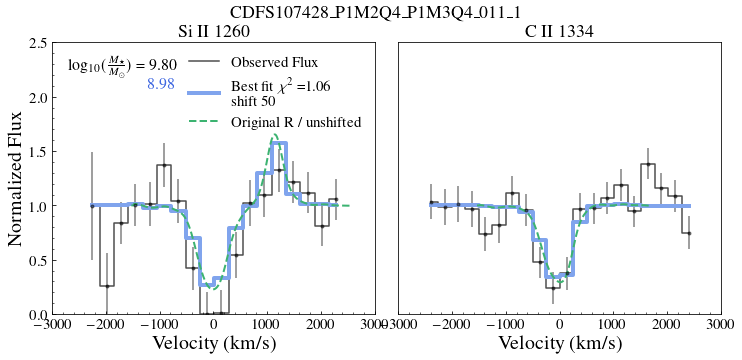

CDFS122324_P
9.8 1.1801191169425471 1.214274869793836 1.1459633640912583


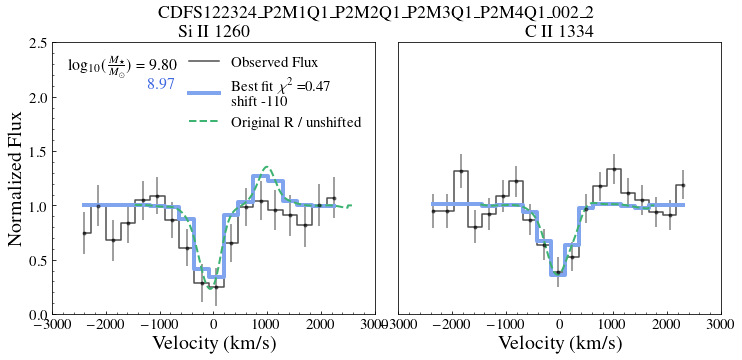

CDFS002312_P
here 1
here 1
9.6 0.9549831326922408 0.6367383290663525 1.3085884700543389


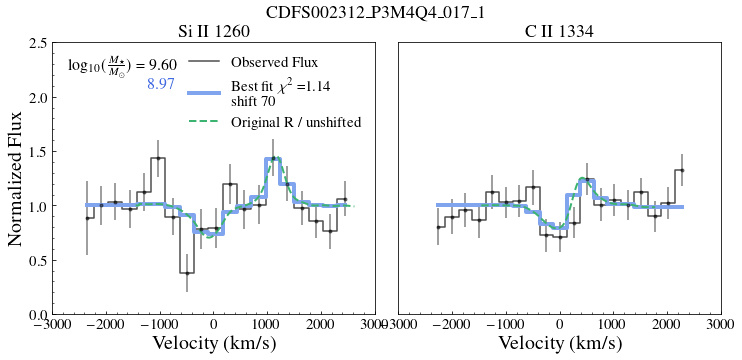

CDFS212043_P
here 1
here 1
9.0 1.2442362706214514 0.7651960981651819 1.7232764430777208


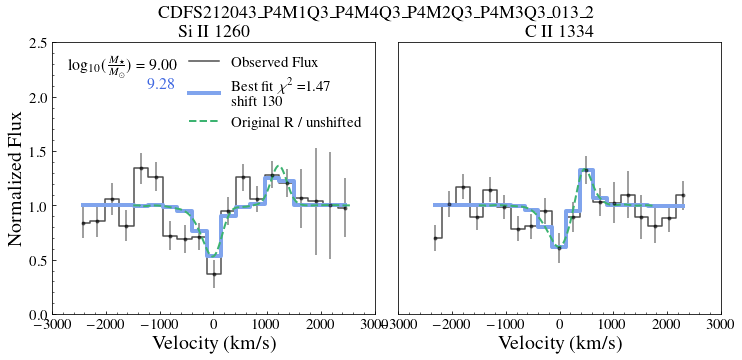

UDS200677_P3
9.9 1.699164891259684 2.6780527931675207 0.6115116669176431


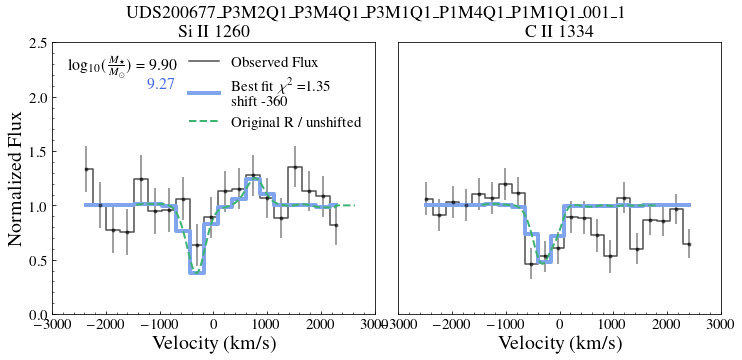

CDFS023527_P
here 1
here 1
9.8 1.574559542634224 2.154844179700717 0.994274905567731


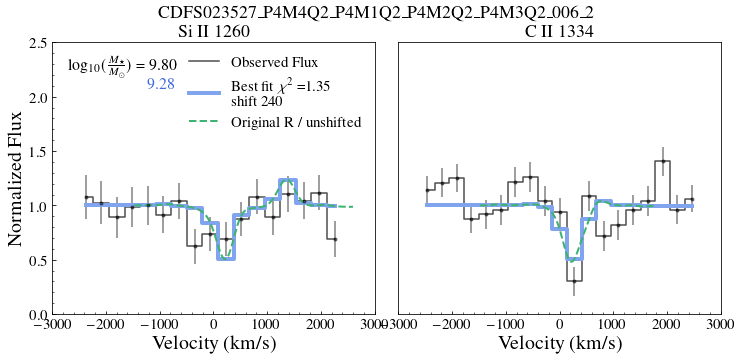

UDS389704_P2
9.7 1.0456888064312297 1.1636919741221061 0.9276856387403534


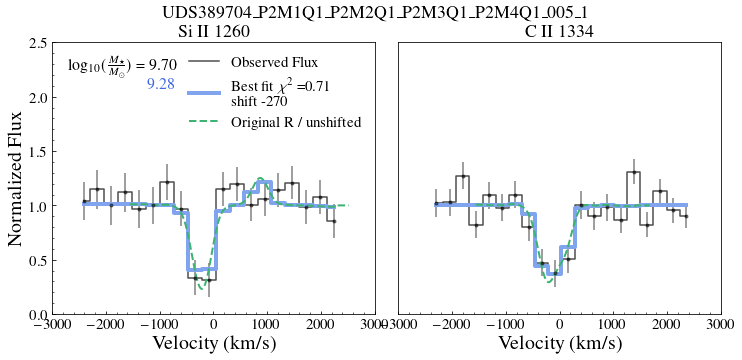

CDFS103010_P
9.6 1.2589011888020056 1.8253975603051518 0.6924048172988592


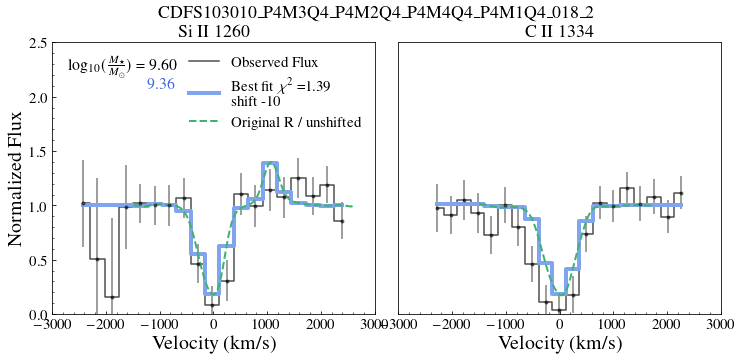

CDFS140458_P
here 1
here 1
9.2 4.623970251186475 5.578693001324827 3.563167195477194
HEEEEL YEEEAH


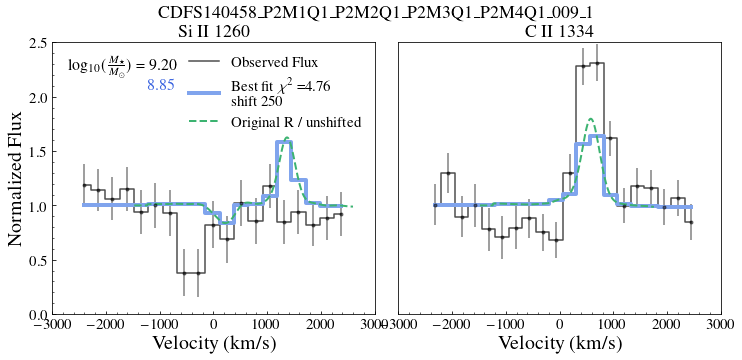

CDFS005058_P
9.3 1.3874175782742306 0.8065978875902498 1.9682372689582117


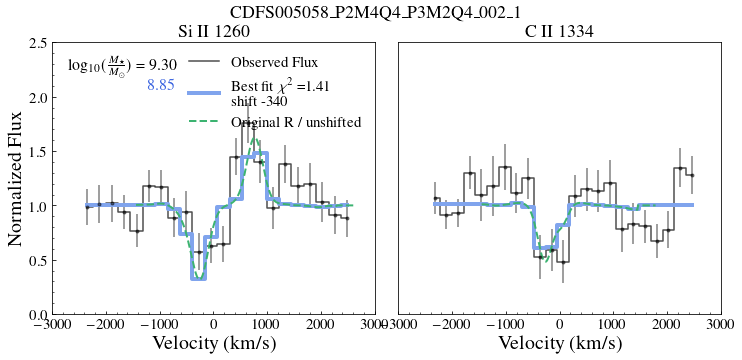

CDFS019593_P
9.6 0.9275420767213088 0.6443642576327174 1.2107198958099004


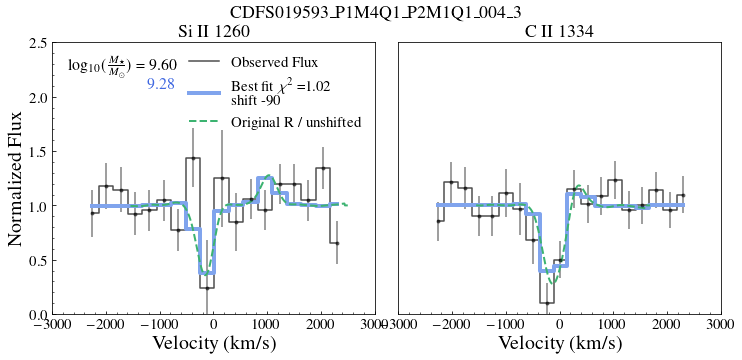

CDFS013340_P
9.8 0.5016699039620723 0.302383538452117 0.7009562694720276


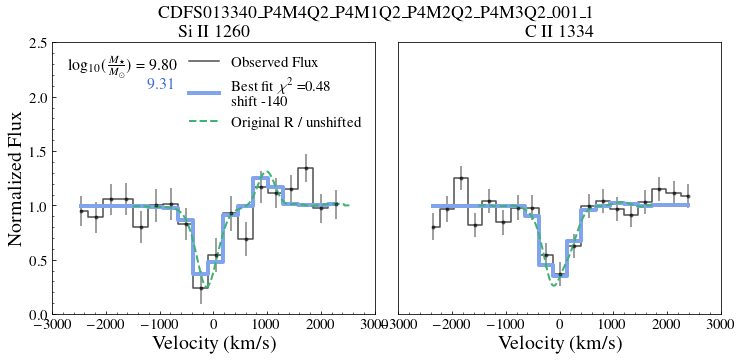

UDS003712_P2
here 1
here 1
9.7 0.7777259926634292 0.520814163543858 1.0346378217830003


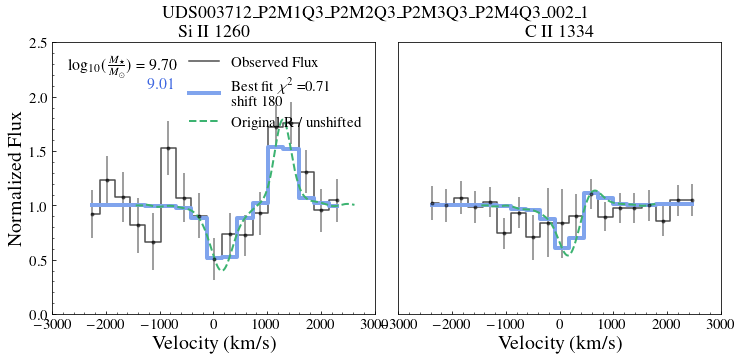

CDFS005198_P
here 1
here 1
9.7 0.7085339351677596 0.8224226883093936 0.5851544525976563


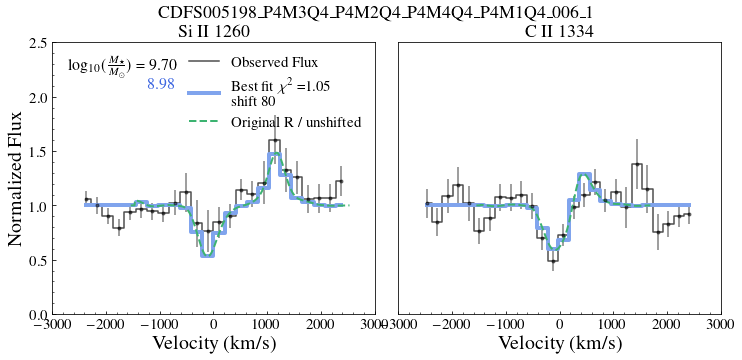

CDFS018372_P
10.0 1.9254561664610836 1.045545215228596 2.8053671176935713


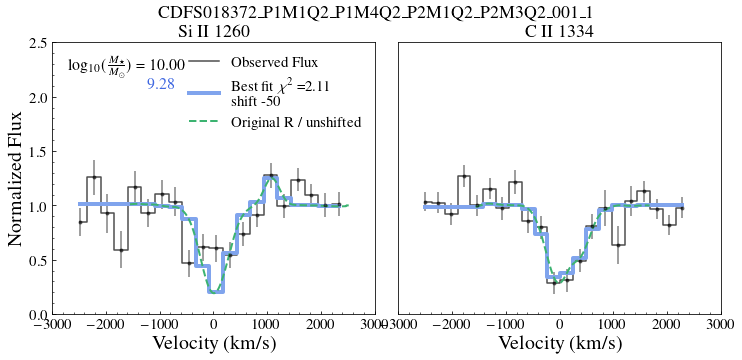

UDS300605_P1
9.7 1.5891345569270834 1.2669529215411355 1.9113161923130313


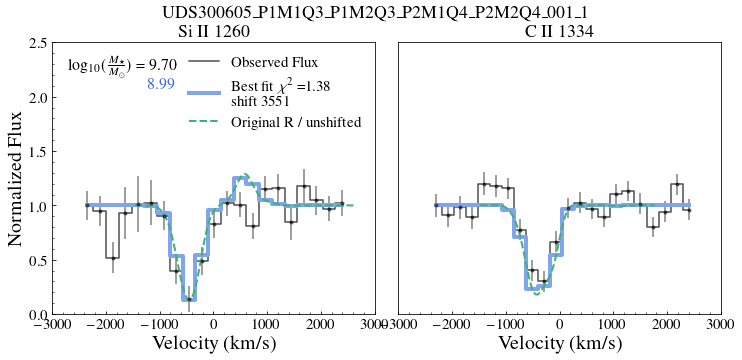

UDS402843_P4
here 1
here 1
9.5 1.2781190543289742 1.31042947788442 1.2422185837118123


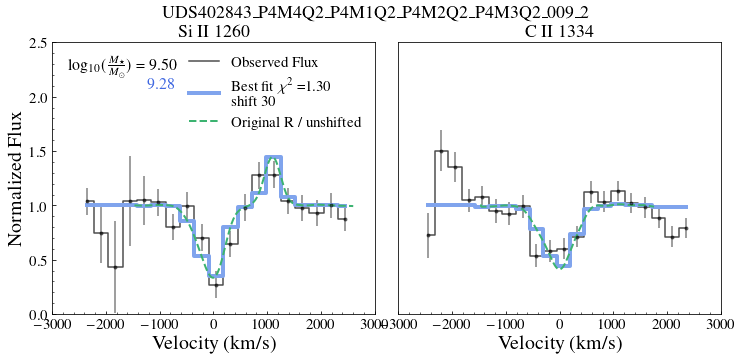

CDFS102433_P
9.5 1.6597861355880759 1.0601092597605382 2.2094899384299858


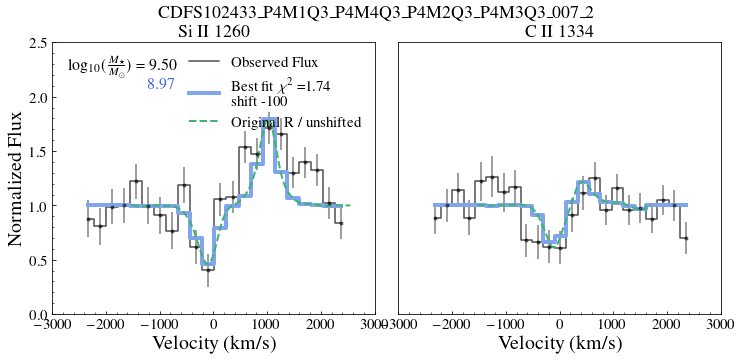

UDS192540_P1
9.7 0.5179869286286726 0.20283613920716198 0.8331377180501831


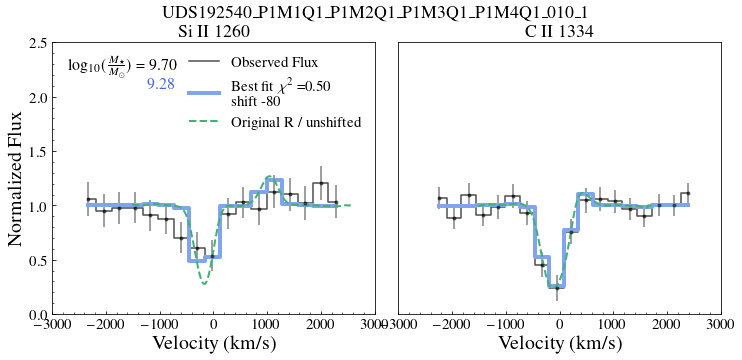

CDFS006520_P
here 1
here 1
9.9 1.087748235240435 1.2393361545228903 0.9361603159579797


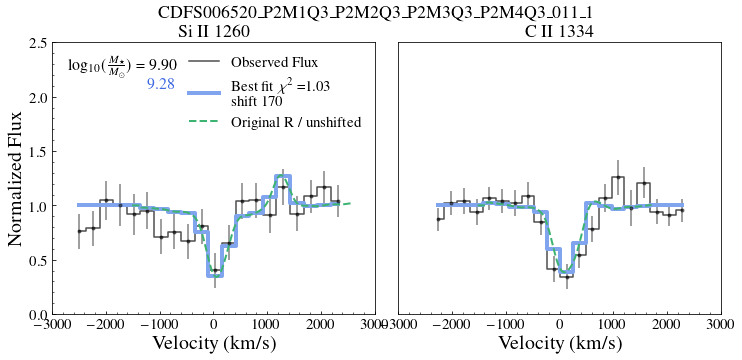

UDS284955_P3
9.6 1.6110365909231568 1.8718582085494058 1.326503917149067


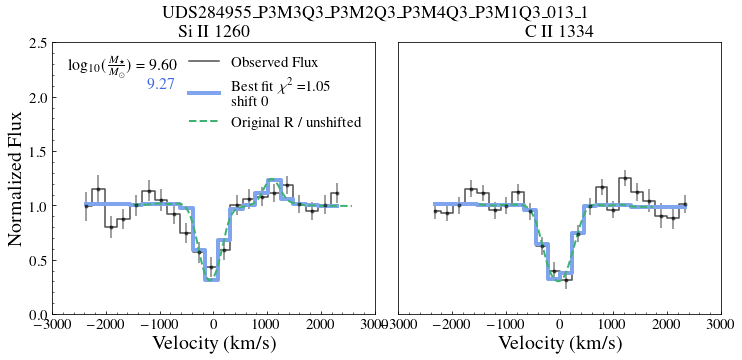

CDFS133598_P
9.3 1.8956446956603514 2.354227574554326 1.3953724641396519


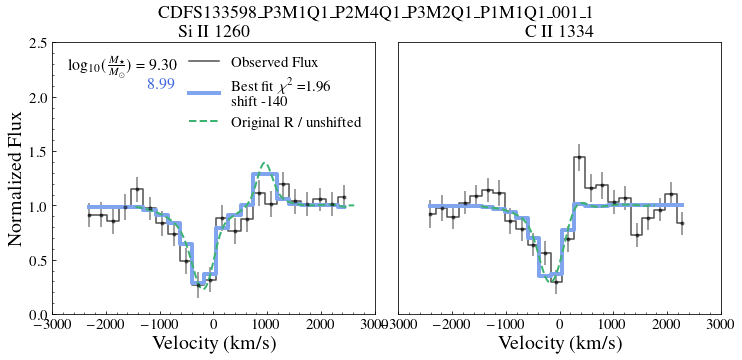

UDS293880_P2
9.6 1.9784388487206466 1.7231095643279022 2.2801916393666173


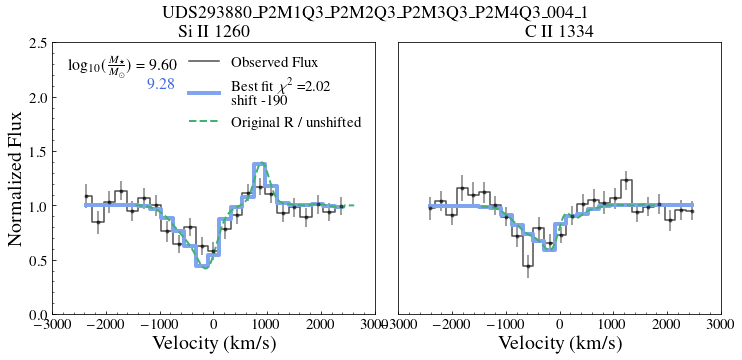

UDS193216_P4
9.6 1.179782618925919 1.3502278008210795 1.0093374370307586


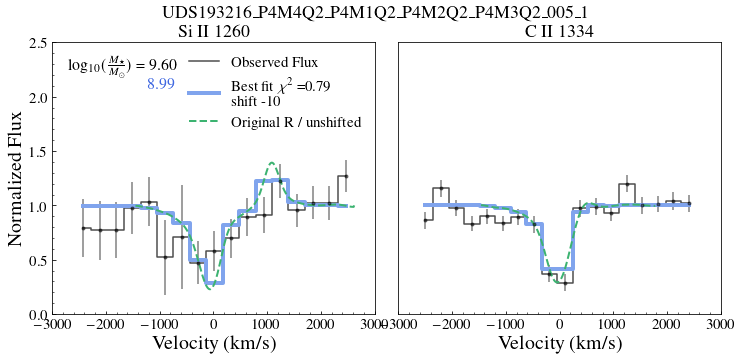

UDS018574_P2
9.6 2.066407233324716 2.190174233636225 1.942640233013207


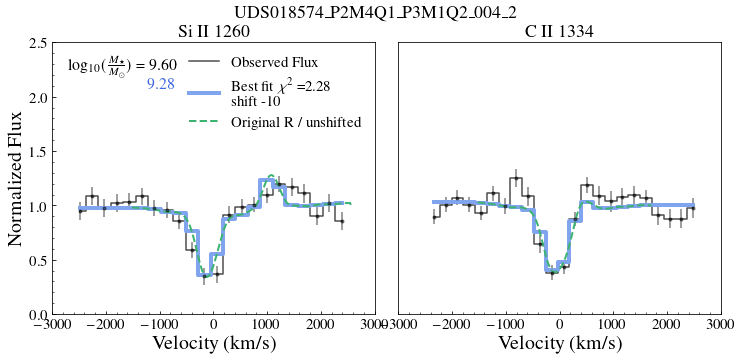

CDFS130840_P
10.4 1.6416315588203443 0.6799810339764599 2.6032820836642285


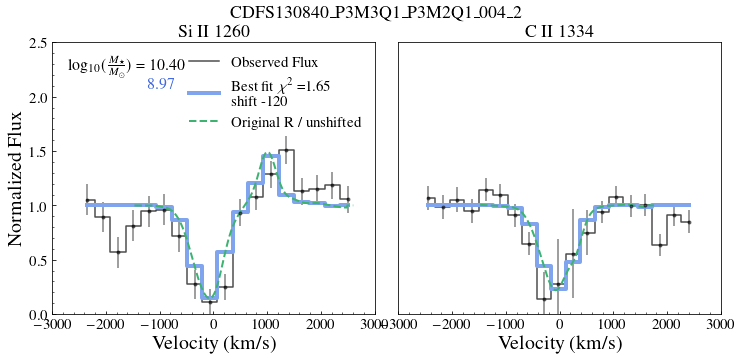

CDFS132586_P
9.6 3.1159790857876235 1.6269903251432905 4.604967846431957


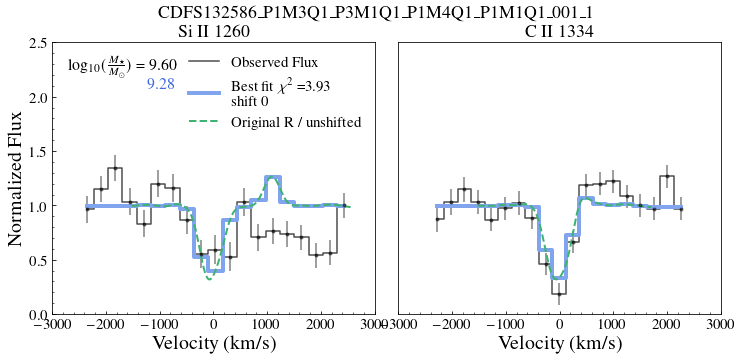

CDFS105315_P
here 1
here 1
8.9 1.3839647357170617 1.9213875563191904 0.7868282683813629


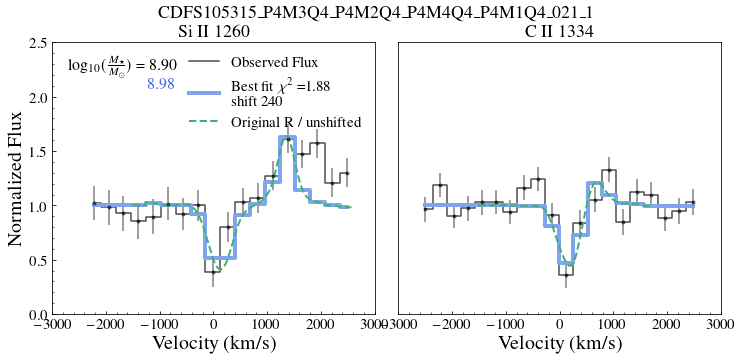

CDFS024133_P
10.1 1.8831459430623327 1.568188173417601 2.1981037127070646


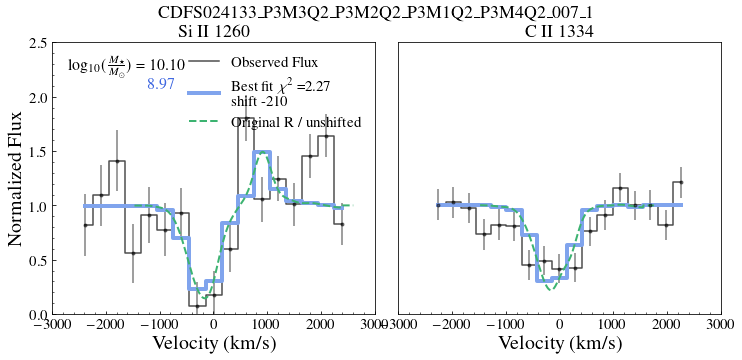

CDFS228618_P
9.5 2.000293690466004 2.1757814223936816 1.8248059585383274


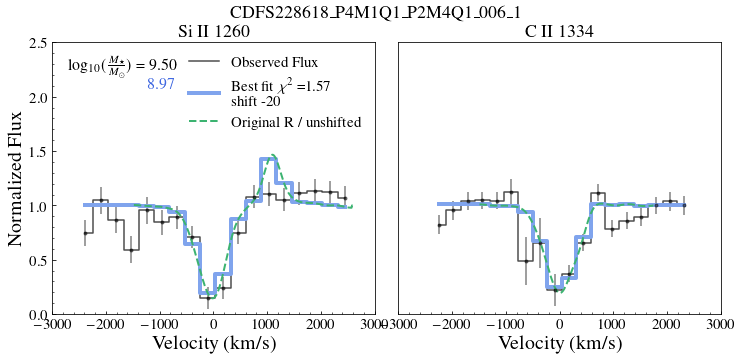

CDFS007541_P
9.6 1.1091269013085532 0.9948669720145172 1.2348128235319926


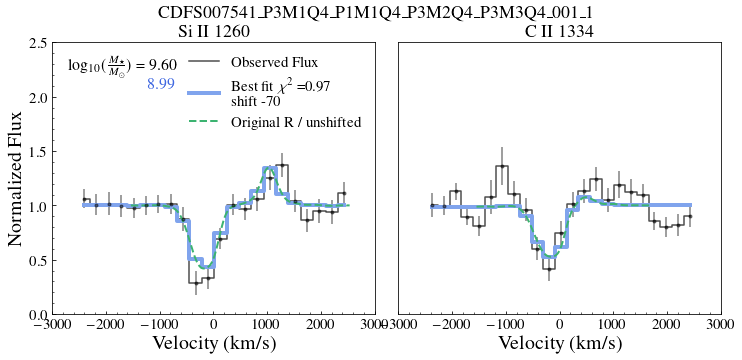

CDFS025472_P
here 1
here 1
9.3 0.4385119371242682 0.31680182349154107 0.5737453967161872


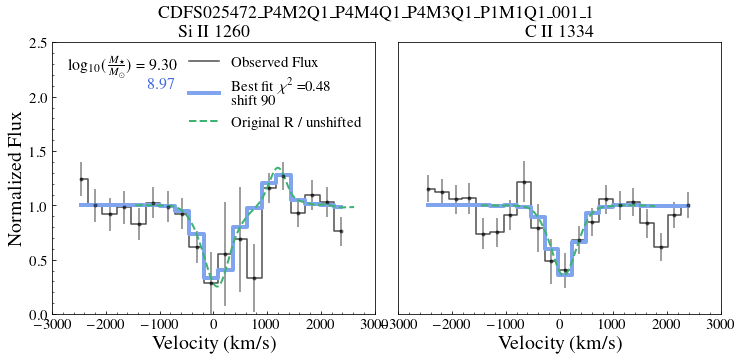

CDFS000321_P
9.4 1.7900318790498047 0.5871136608955178 3.1266076769990128


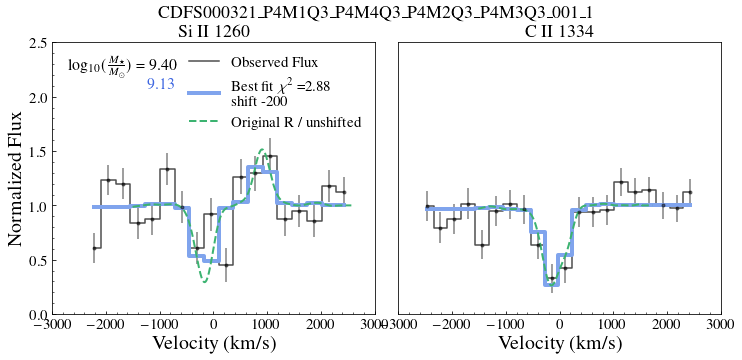

UDS141491_P2
10.0 1.4837008592074536 0.7368130416630781 2.3052774585062665


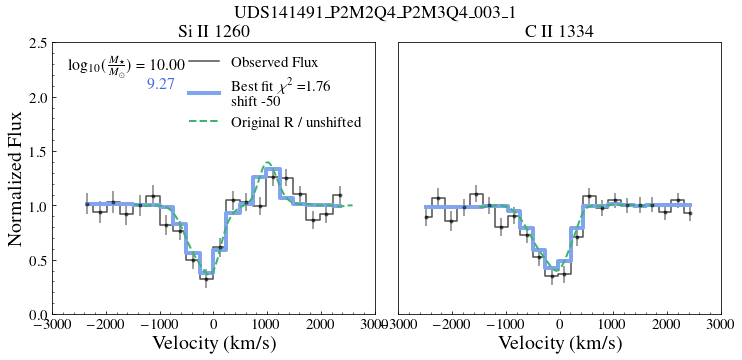

CDFS017345_P
here 1
here 1
9.4 2.499370554178772 2.9866581076086547 1.9037968777644716


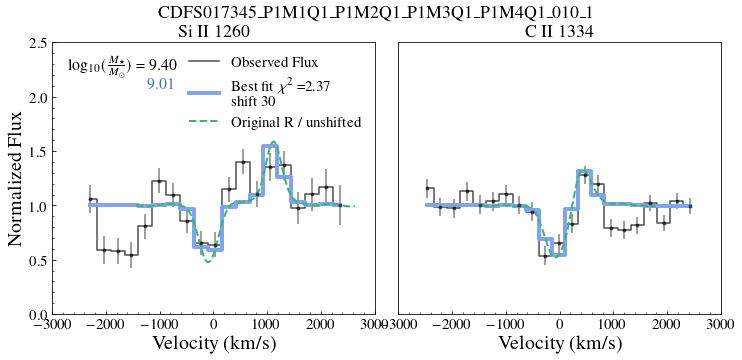

CDFS221651_P
here 1
here 1
9.1 2.8209484530119817 0.9865755365182374 4.655321369505726


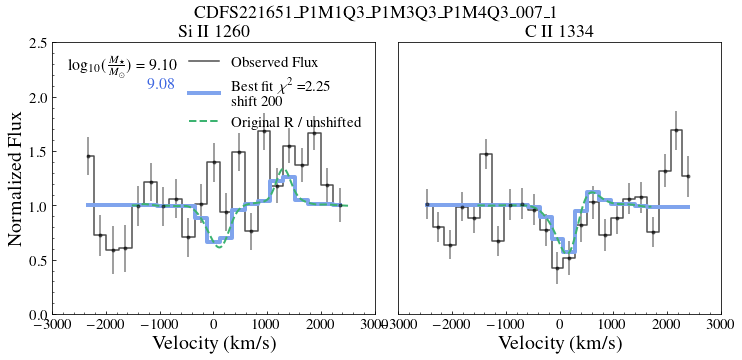

CDFS138745_P
10.2 1.2353059054892592 0.2722195119526704 2.305401898307691


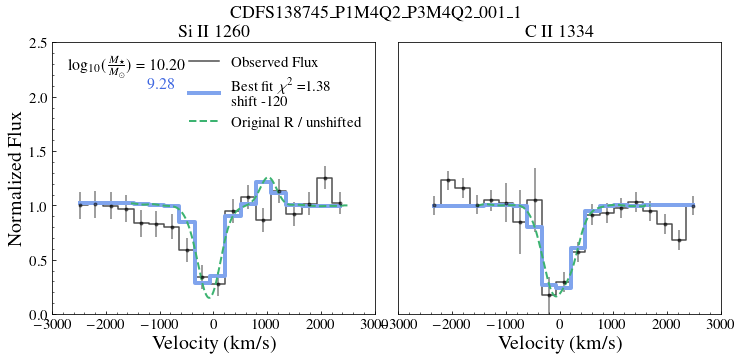

CDFS020014_P
here 1
here 1
9.1 0.8255827704613126 0.6790990789980708 0.9720664619245546


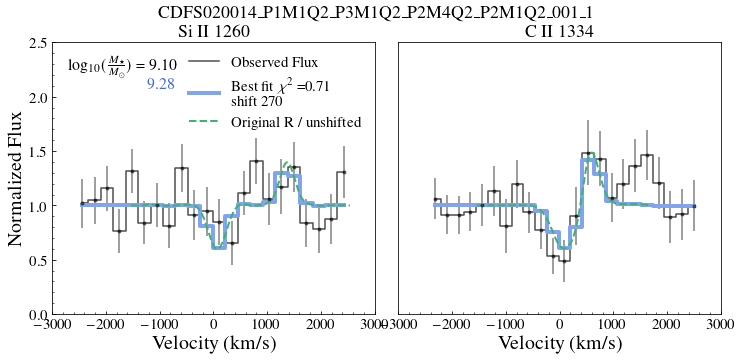

CDFS119091_P
9.6 0.6275667760845801 0.3296719512301156 0.9585610259228741


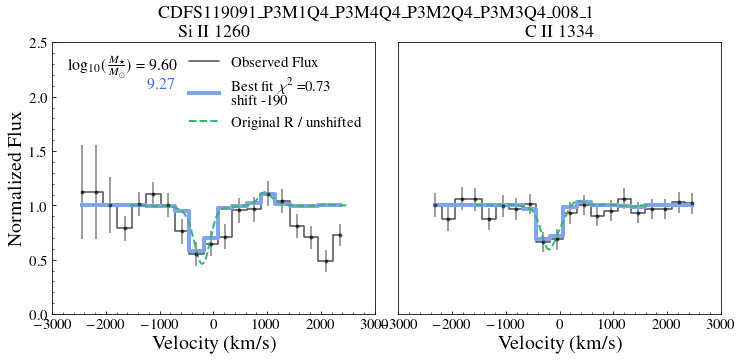

UDS150237_P4
10.5 1.4493034801081557 1.1505917566920698 1.7480152035242411


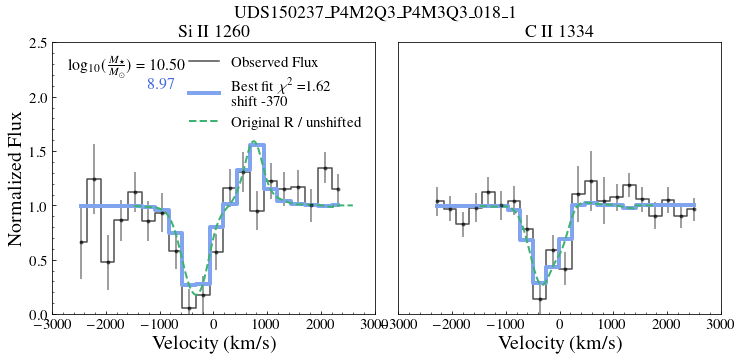

CDFS102002_P
9.2 1.4533578860248182 2.7452315624913233 0.0


/home/simon/anaconda3/lib/python3.9/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


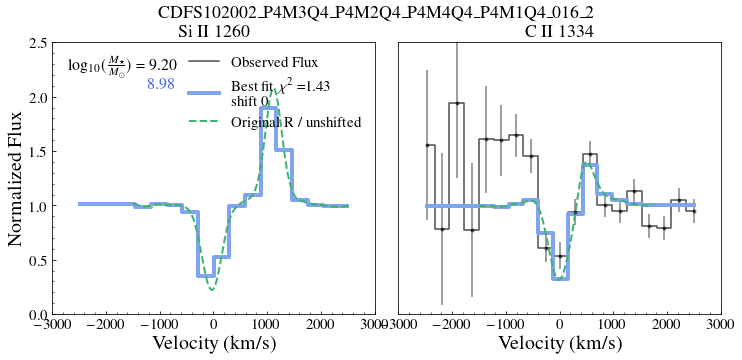

CDFS231194_P
9.5 1.283730810459476 0.7139269725107708 1.8535346484081812


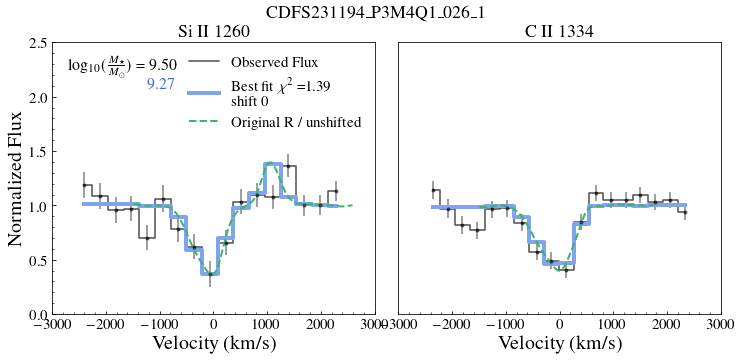

CDFS019276_P
10.0 1.3347699651110507 1.0076014117274 1.6982905799817736


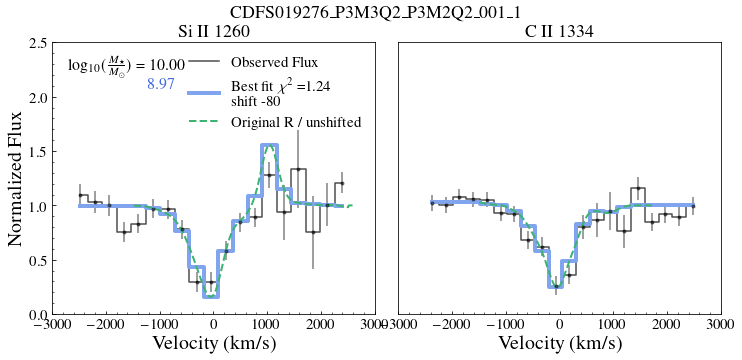

UDS002072_P3
10.0 2.322470368303803 2.504676802965092 2.123699712309669


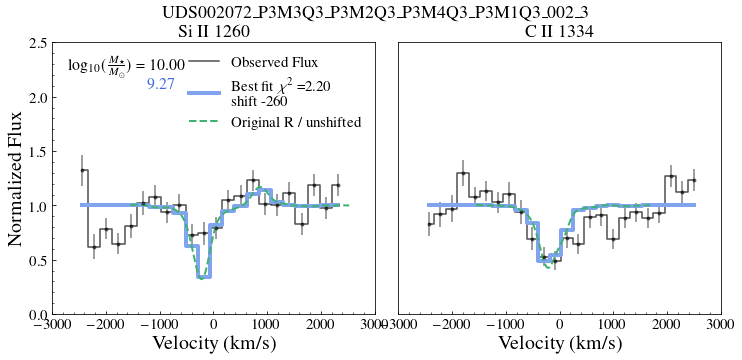

CDFS208053_P
9.0 1.1925408082705244 1.8806780315244 0.5044035850166488


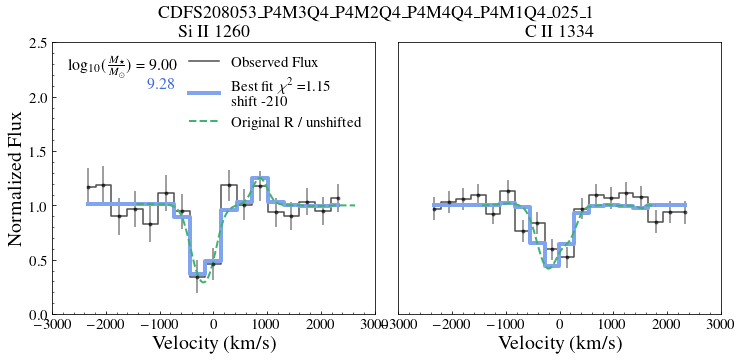

UDS146648_P1
9.7 1.4084585789851407 1.3620310749149498 1.4548860830553314


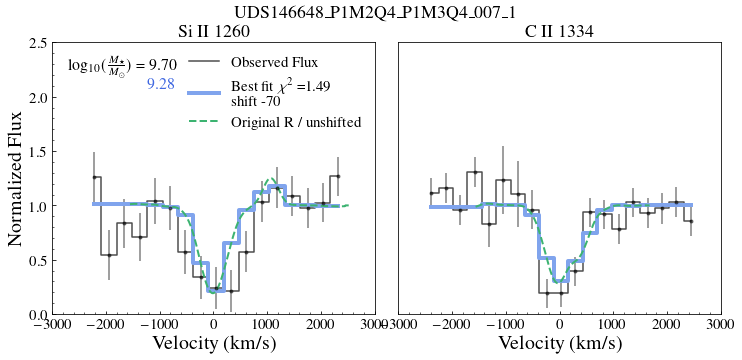

CDFS002296_P
9.5 0.9578166653724374 1.07124031511744 0.6553535993857641


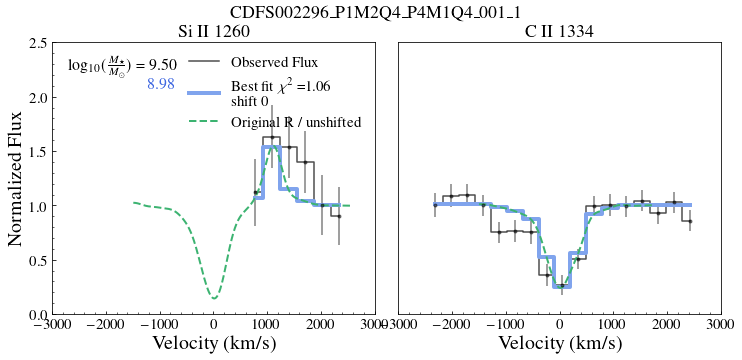

UDS019181_P4
9.7 0.8220084800105971 1.0251343497132113 0.6004166221532


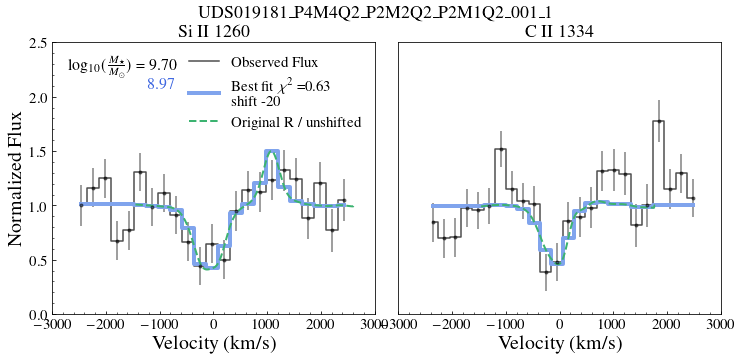

CDFS020583_P
here 1
here 1
9.6 0.340221662962342 0.44768360582912853 0.2327597200955555


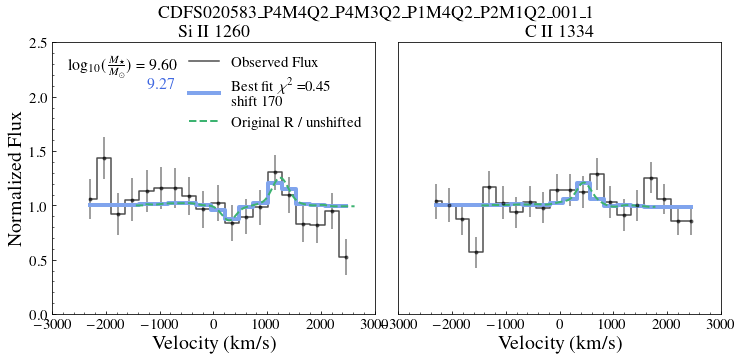

UDS013664_P2
here 1
here 1
9.3 2.9247478725504923 2.9319303534653467 2.917565391635638


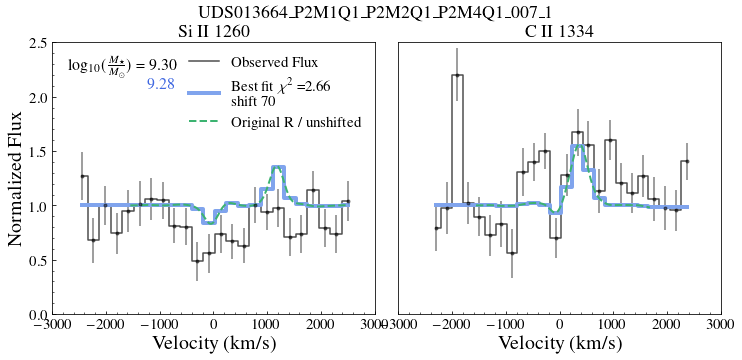

UDS197598_P2
here 1
here 1
9.5 1.7055780603761161 2.0096100499180336 1.4015460708341985


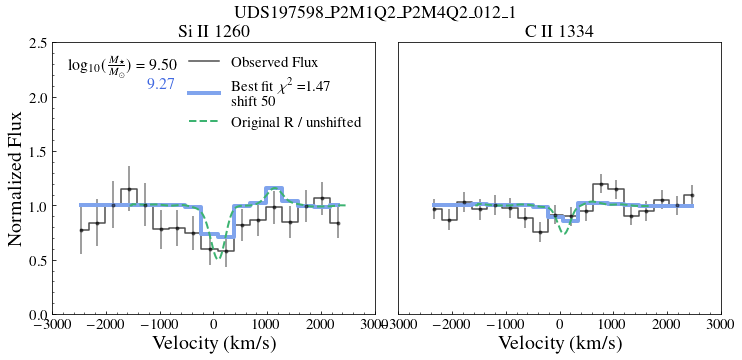

UDS000330_P4
here 1
here 1
9.7 1.4968779535839114 0.42053647435930774 2.573219432808515


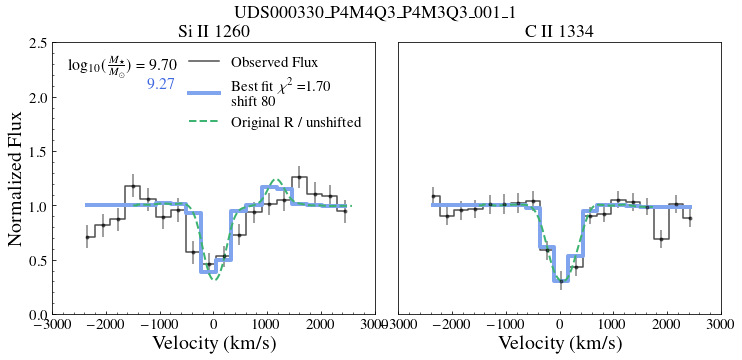

CDFS106745_P
9.4 1.1381054923868572 0.5278104444804617 1.816211101171741


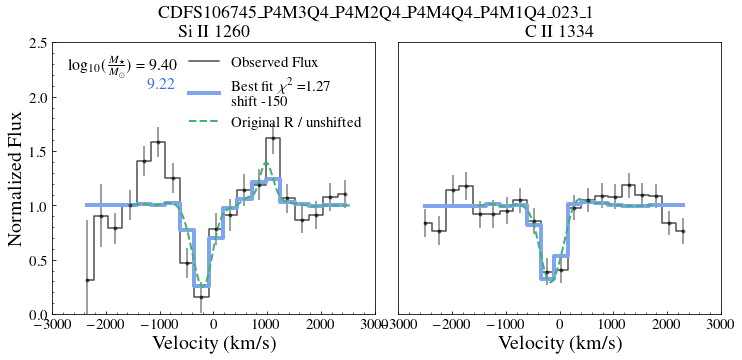

UDS000800_P4
10.1 1.841791467215997 2.151212145971809 1.532370788460185


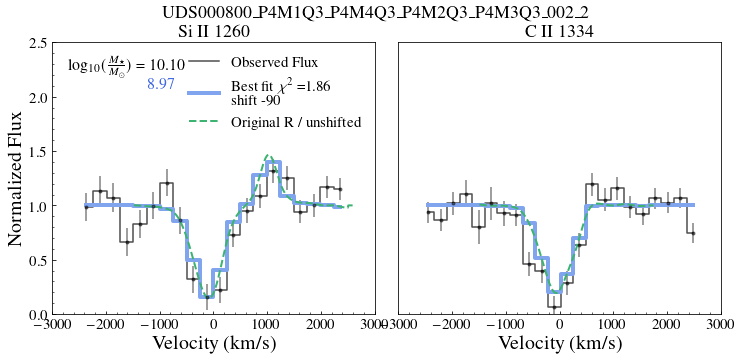

CDFS000814_P
9.9 1.0107652302923869 1.3358270326536479 0.685703427931126


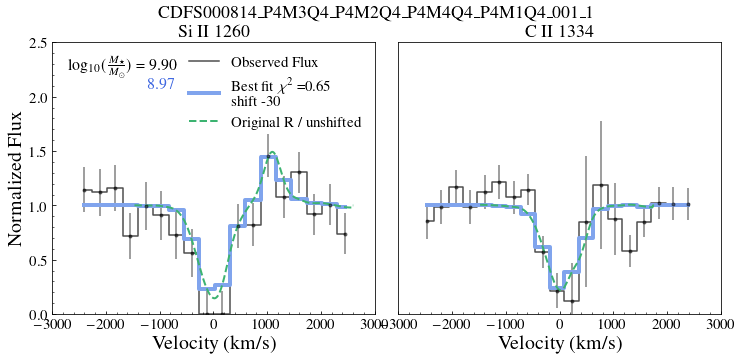

UDS378854_P1
9.6 1.9474471755507248 2.120220515503741 1.743260501060797


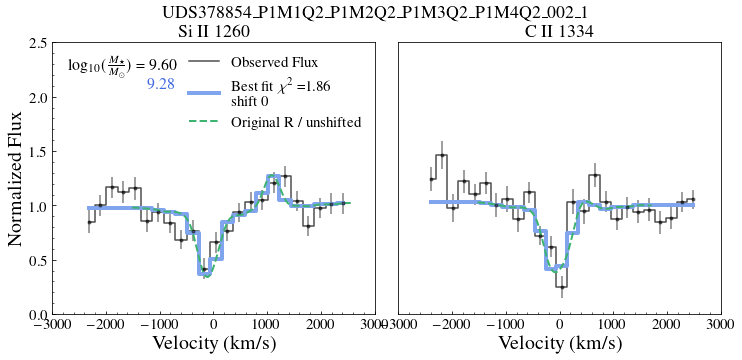

CDFS128455_P
9.6 0.833322201319838 0.79394351503337 0.872700887606306


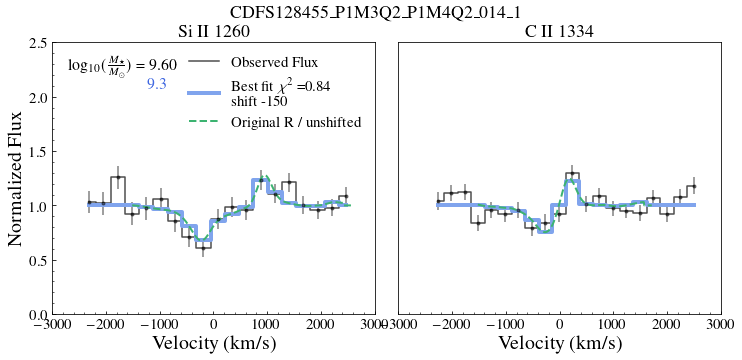

CDFS105360_P
9.3 1.1130355149283344 1.3509781886235133 0.8486547663781355


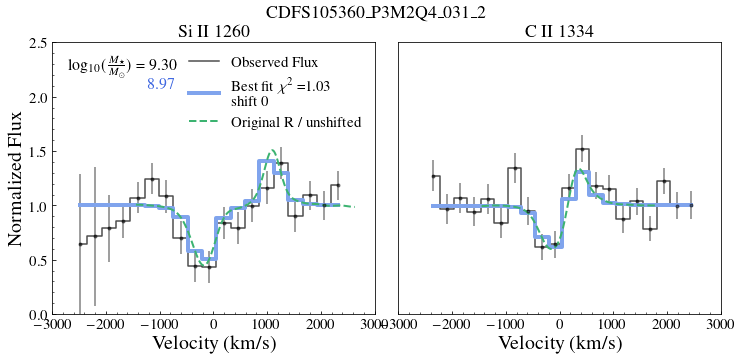

CDFS129134_P
here 1
here 1
9.5 1.2634003128554043 1.776232059786065 0.6935872607102256


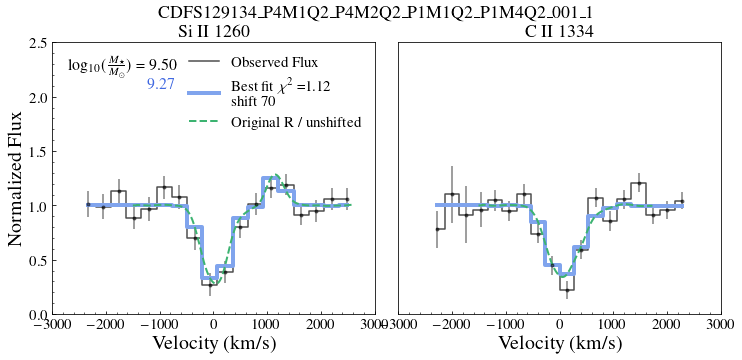

UDS295074_P3
9.6 0.6659830878858181 0.7795195519604177 0.5524466238112183


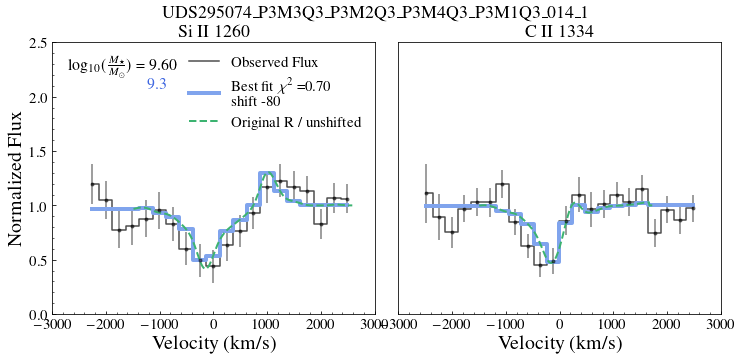

CDFS101861_P
here 1
here 1
9.5 0.22610118884152305 0.21277921197511918 0.239423165707927


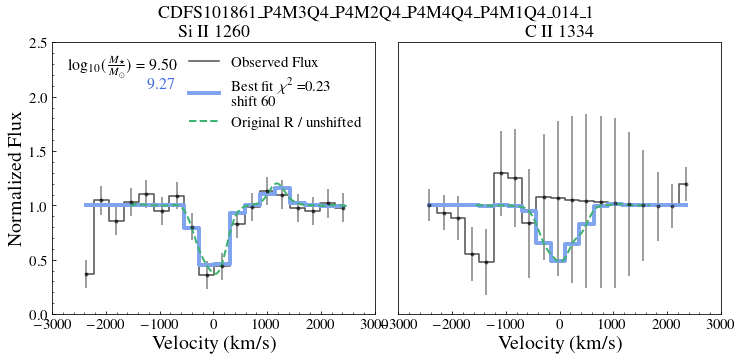

UDS027014_P3
9.3 1.8811721659806586 2.3667581375083757 1.3072978359933565


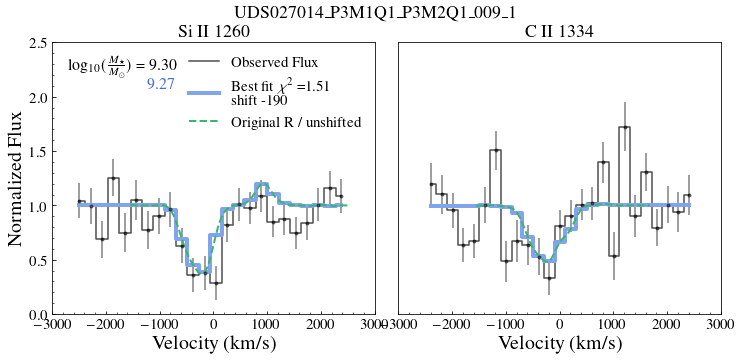

UDS143762_P4
10.5 4.416234021399743 0.841515661903453 7.990952380896033
HEEEEL YEEEAH


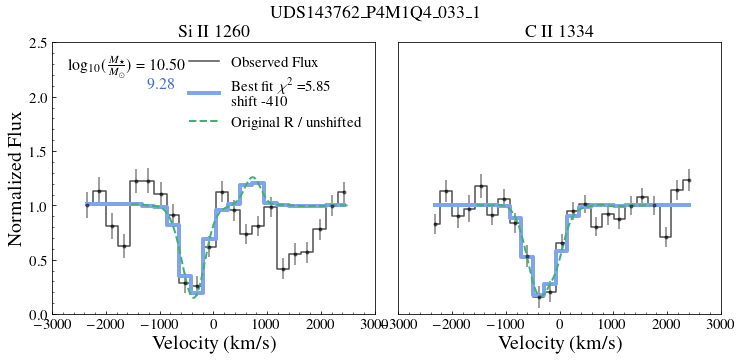

UDS021975_P2
here 1
here 1
9.4 0.8558076214874383 0.92736780116996 0.7842474418049167


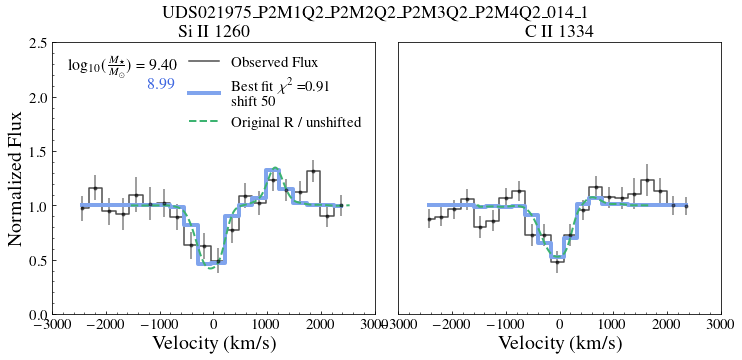

UDS157594_P3
here 1
here 1
10.0 1.2133367177104704 1.1528542340956625 1.2738192013252785


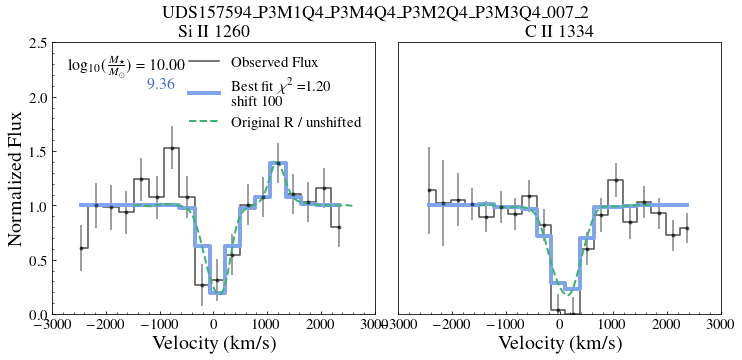

UDS021526_P4
here 1
here 1
9.8 2.383763023929366 1.5190802299798523 3.34452168387327


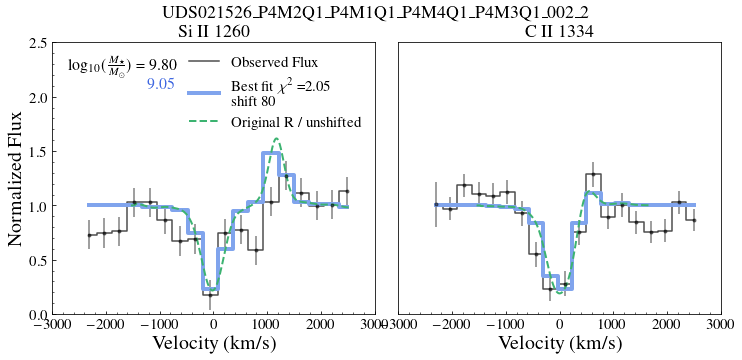

UDS014660_P2
10.4 2.247735635483027 3.4065596302236085 1.088911640742446


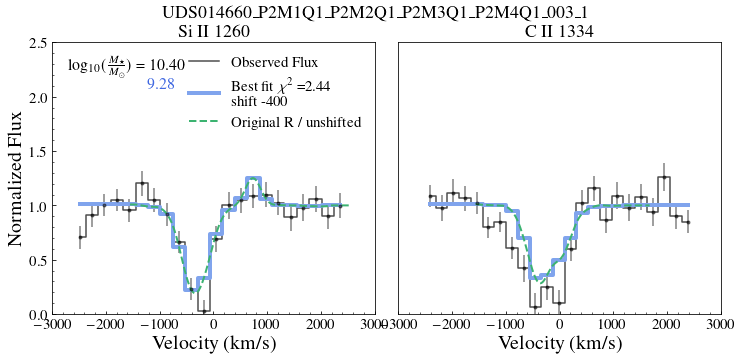

CDFS107694_P
here 1
here 1
9.4 1.3989003046344353 1.280648663061963 1.5171519462069076


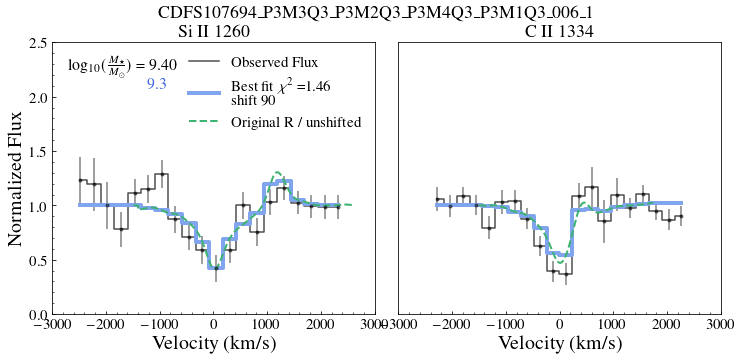

CDFS016098_P
8.9 1.1126846395134387 0.7894695086274296 1.4682212834880486


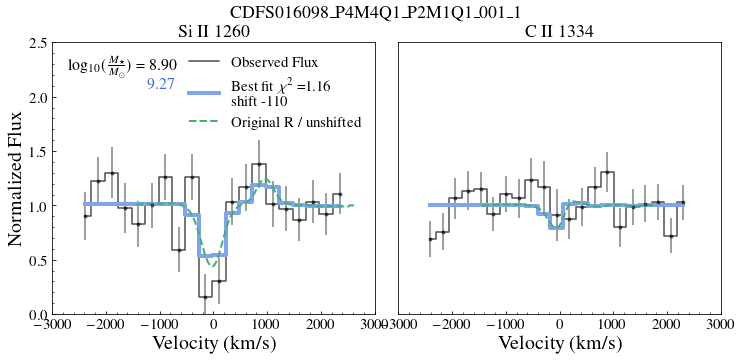

CDFS101596_P
here 1
here 1
9.8 1.273258501782925 1.4403241051614106 1.1061928984044394


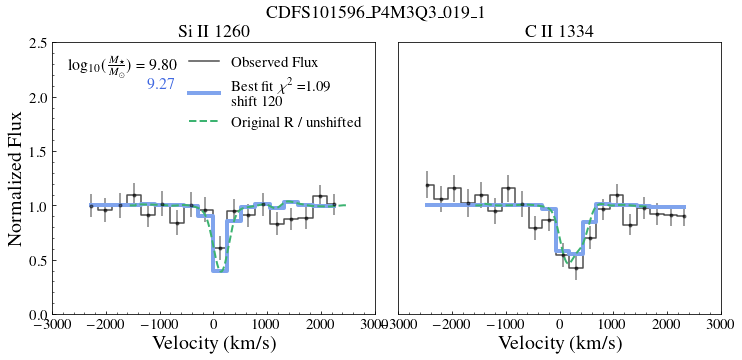

UDS150302_P1
10.4 0.5440506397790227 0.6631384003252401 0.4130541031781837


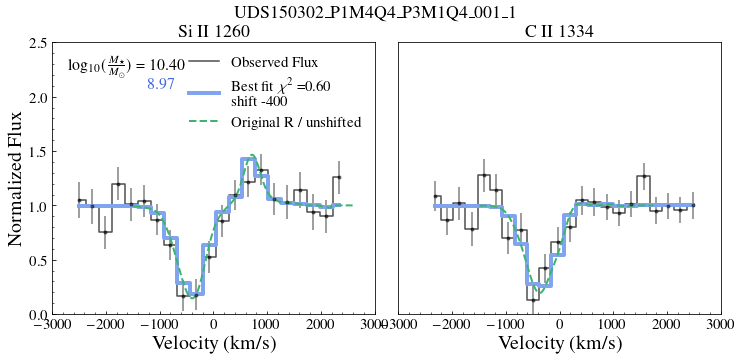

UDS383959_P4
9.7 1.0280331727868566 0.7719087779890537 1.2841575675846597


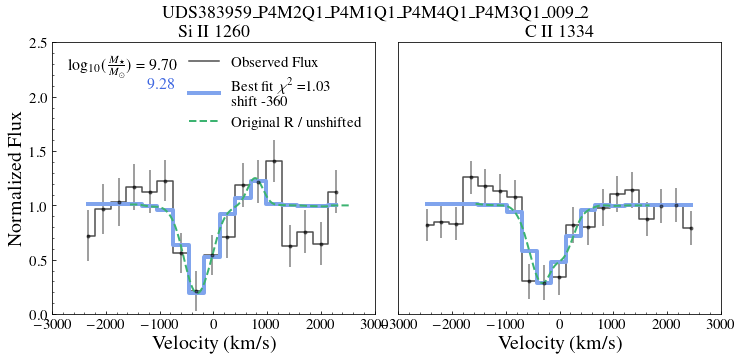

CDFS009134_P
here 1
here 1
9.5 1.0415970514119632 1.1803681566486006 0.8902103911538134


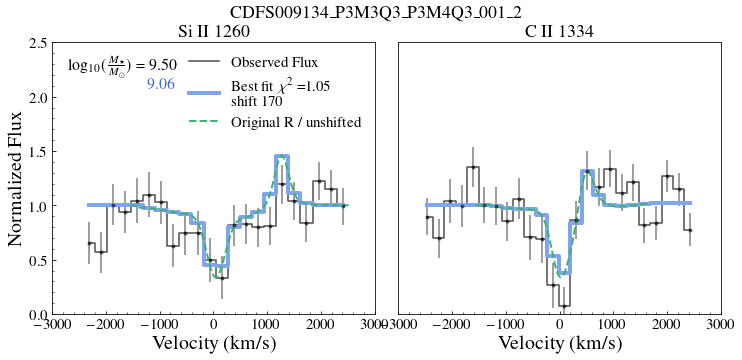

CDFS023836_P
9.1 0.5837405811030009 0.6496623724700921 0.5112266105992006


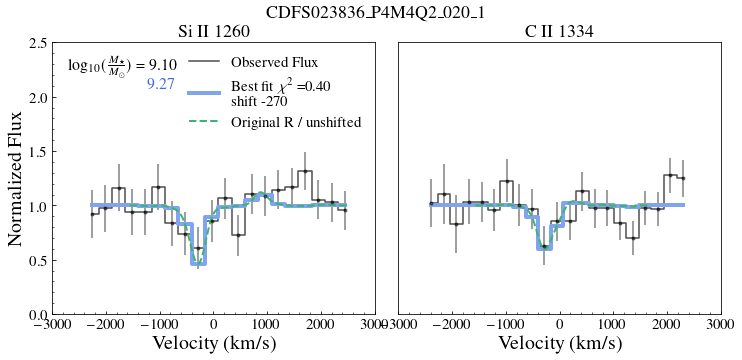

CDFS203169_P
9.6 3.119486290343778 1.9371084099824236 4.400395660735246


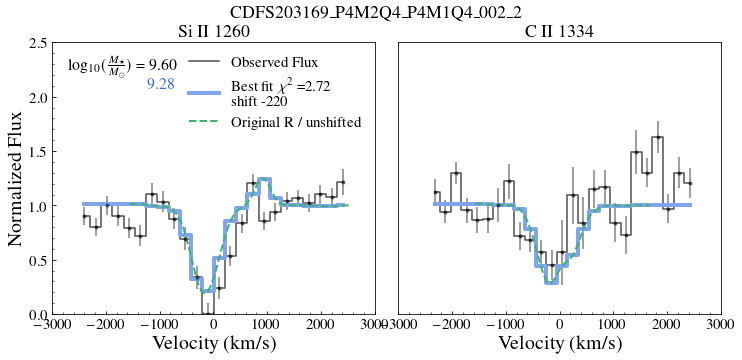

CDFS018915_P
9.9 0.849068589545773 0.7844038198037502 0.9281033081193565


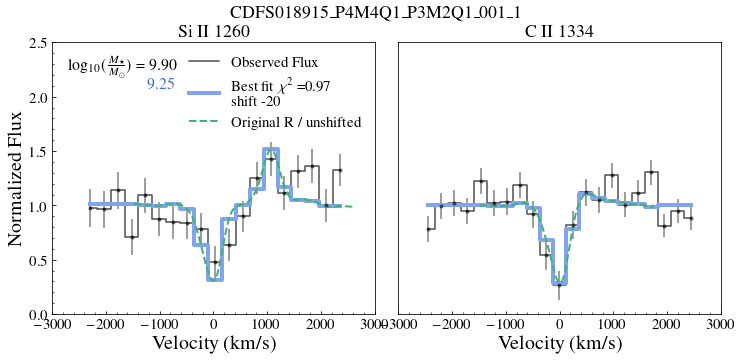

CDFS018882_P
here 1
here 1
9.9 8.355919819372438 0.7453050880383705 15.966534550706507


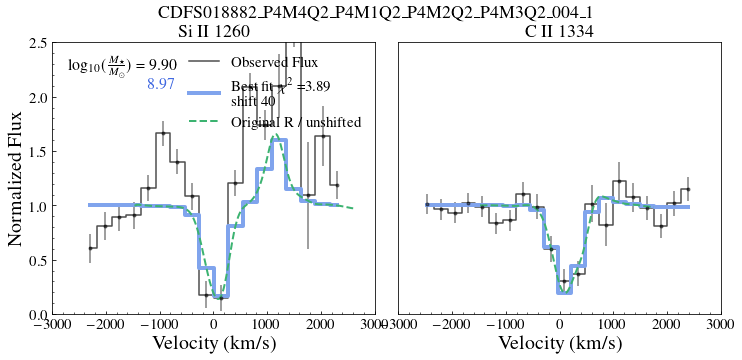

UDS019380_P1
9.8 0.5507728433121453 0.5518461923855537 0.5496994942387369


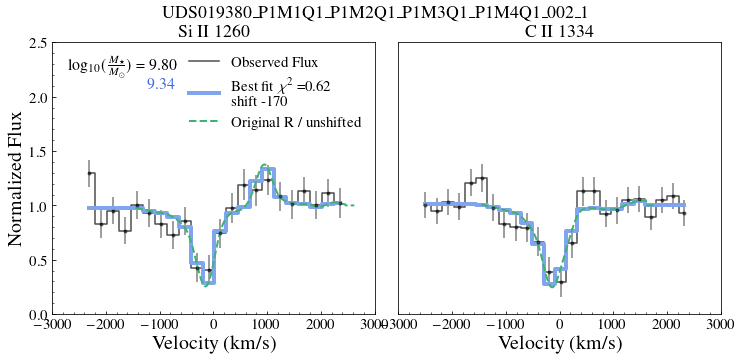

CDFS241007_P
9.2 1.5646592557235028 1.7743606663302316 1.3549578451167739


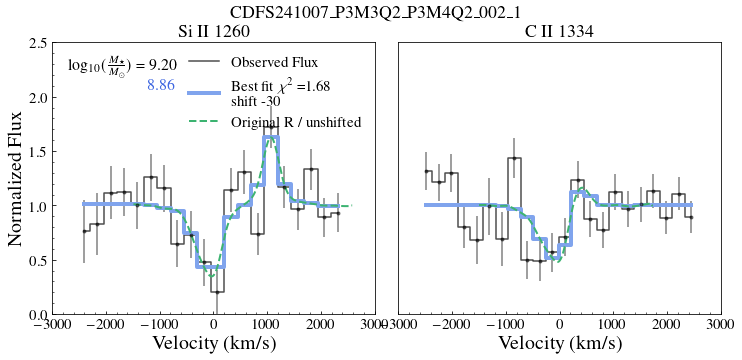

CDFS113741_P
here 1
here 1
9.7 0.4170081731611257 0.21347997807163432 0.6431506121494495


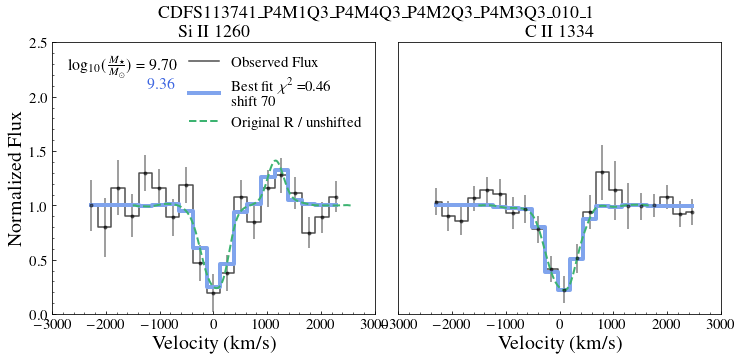

UDS023283_P3
9.9 1.3660301108695347 1.7476309910788366 0.9844292306602329


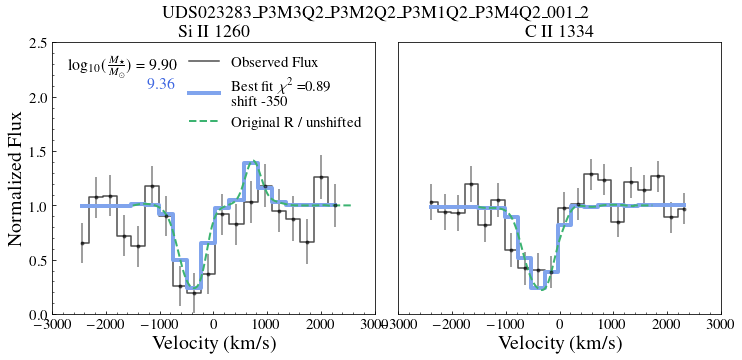

UDS002893_P3
10.2 2.0272610008899212 2.3555020469019574 1.6990199548778846


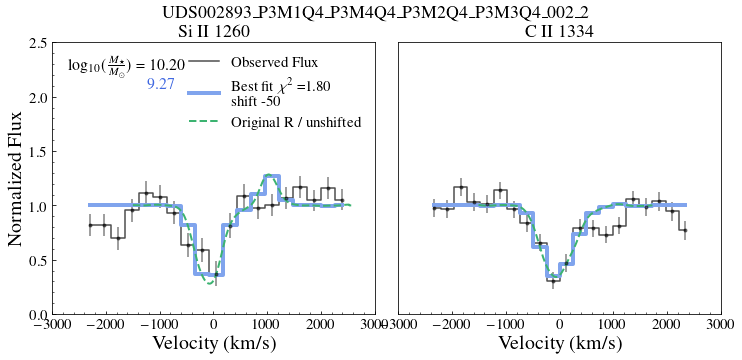

UDS019988_P1
here 1
here 1
9.9 2.2625063564720396 3.3444857965628443 1.0603069785933674


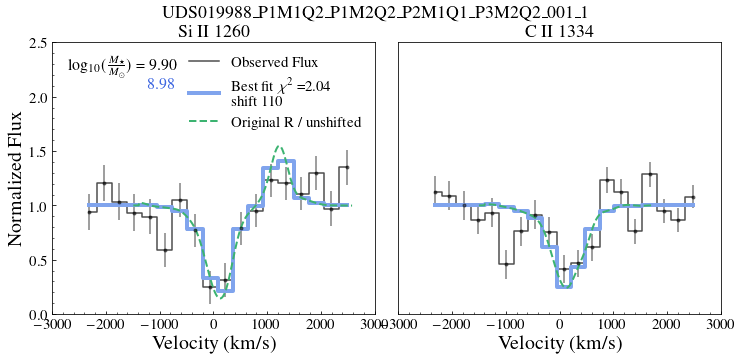

UDS002133_P4
10.0 1.6406132282685628 1.0404786972951248 2.2407477592420006


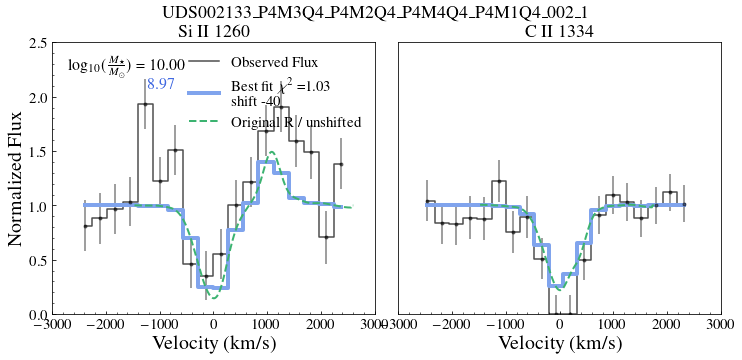

CDFS108676_P
9.5 0.5537402281126338 0.6924559007323497 0.4150245554929179


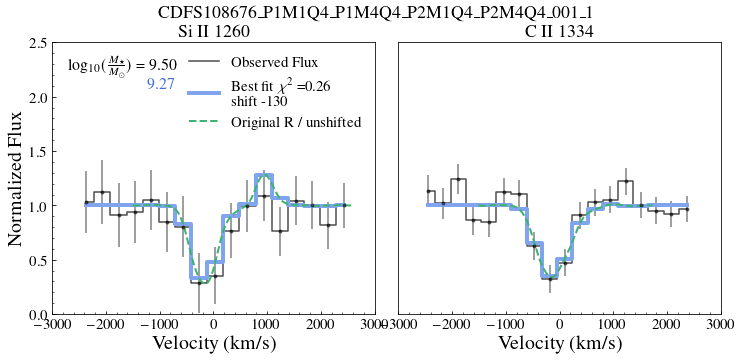

CDFS229589_P
here 1
here 1
9.2 0.972094080019182 0.3844450555462178 1.6131657430805975


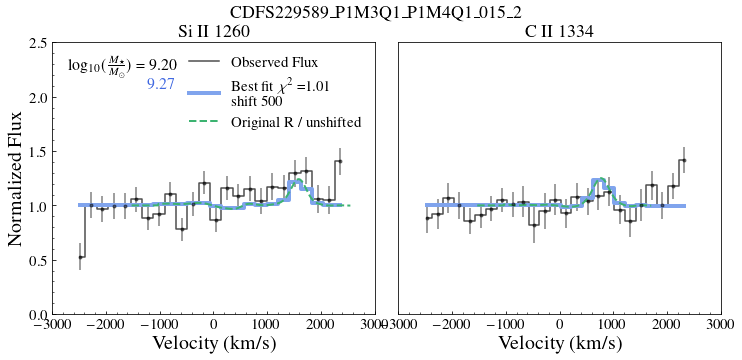

UDS148005_P4
here 1
here 1
9.4 2.0680586826129486 2.2691007662997698 1.8418863384652753


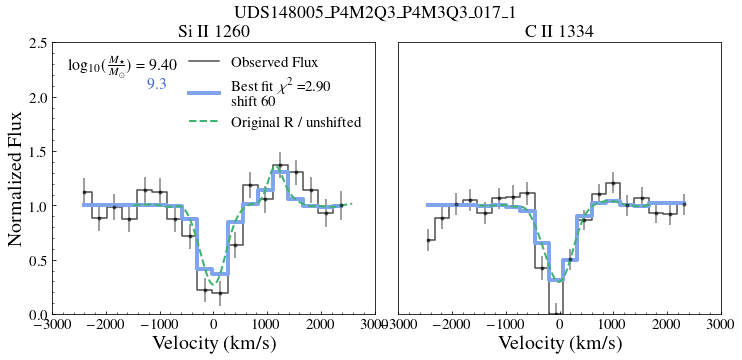

CDFS004717_P
9.6 0.5350963470072603 0.6838939117775875 0.36976571948467435


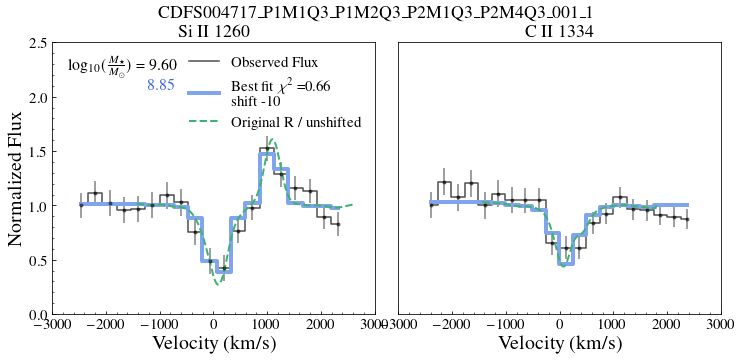

CDFS131717_P
9.7 1.384887206726059 2.1684390065927914 0.6013354068593265


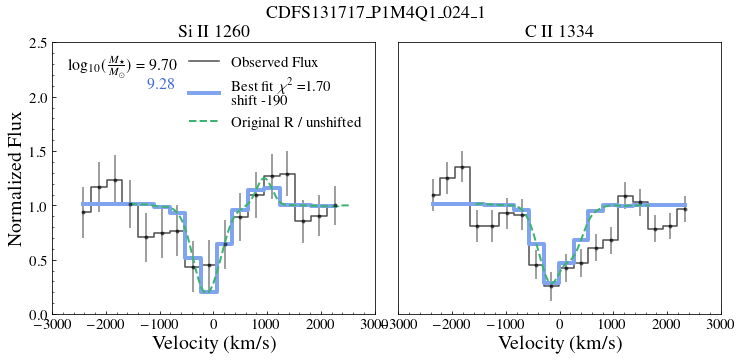

CDFS137347_P
9.5 0.579308992918465 0.6209763219887282 0.5334749309411755


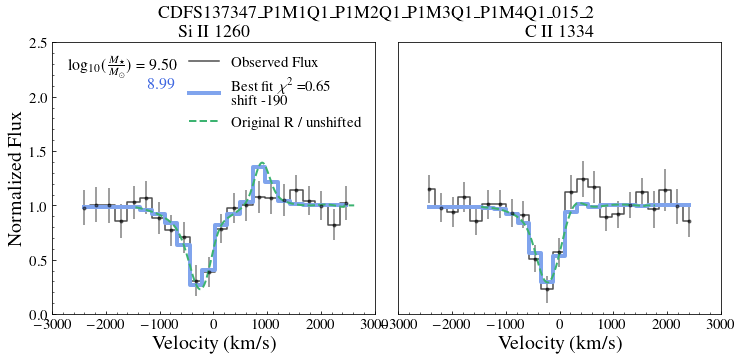

CDFS224952_P
9.2 1.0355459350067622 1.0730282806065274 0.9938988843403566


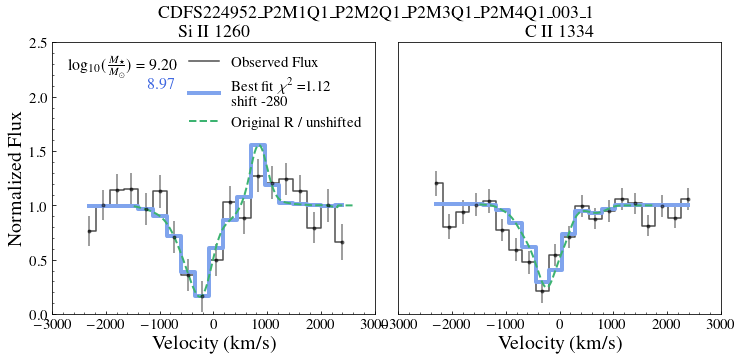

CDFS122764_P
9.7 3.7079192796613 3.563569089394084 3.8522694699285167


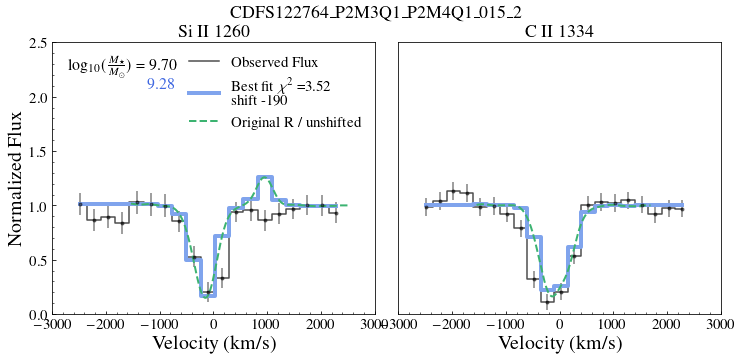

CDFS132115_P
here 1
here 1
9.5 0.5988085464863283 0.28739533569065495 0.9102217572820016


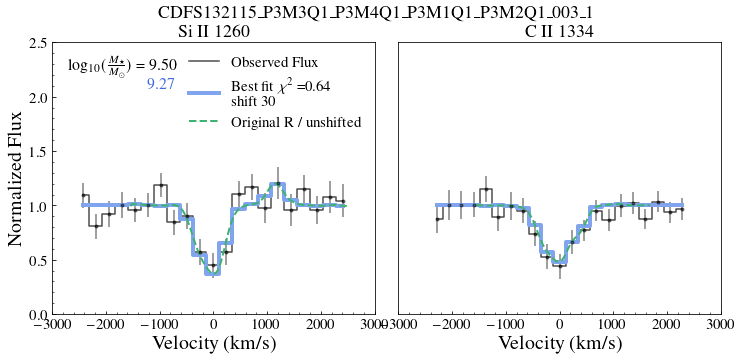

UDS148558_P2
9.8 2.4502117195813464 1.1905544640087902 3.7098689751539022


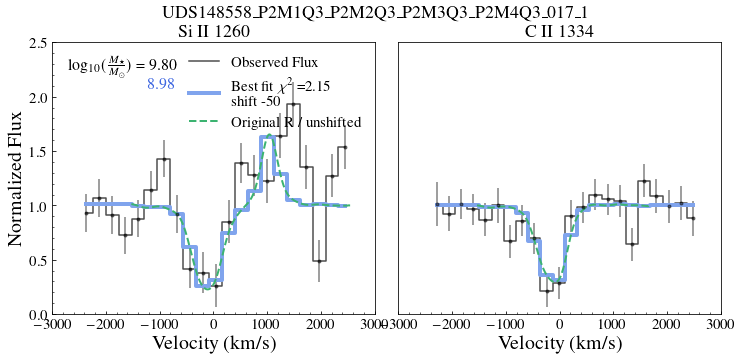

CDFS115673_P
here 1
here 1
9.3 0.32395348186504036 0.37189853725850897 0.2700152945473882


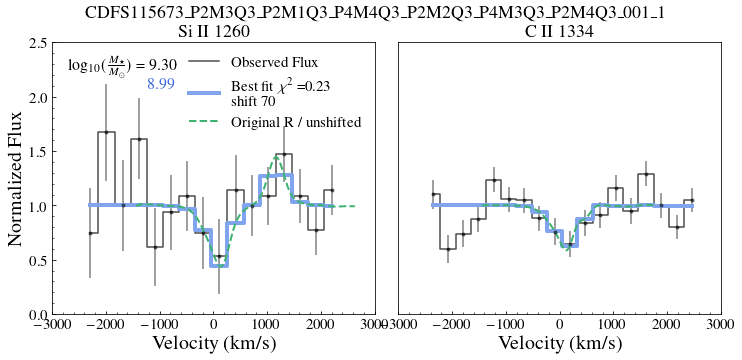

UDS020437_P1
9.9 0.6738100533198401 1.0524126094974908 0.2952074971421894


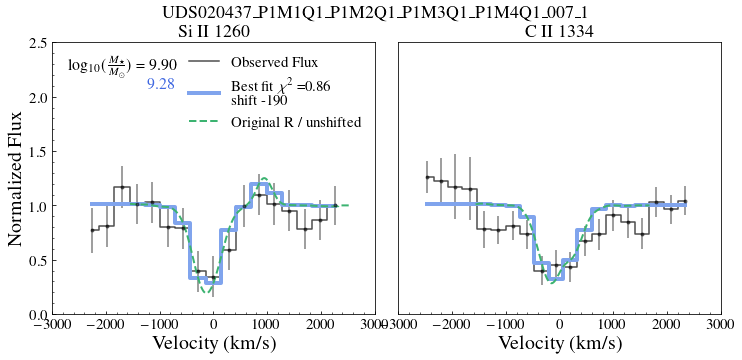

CDFS023170_P
here 1
here 1
9.6 0.9684836096542895 1.4626361100766496 0.4125620466791343


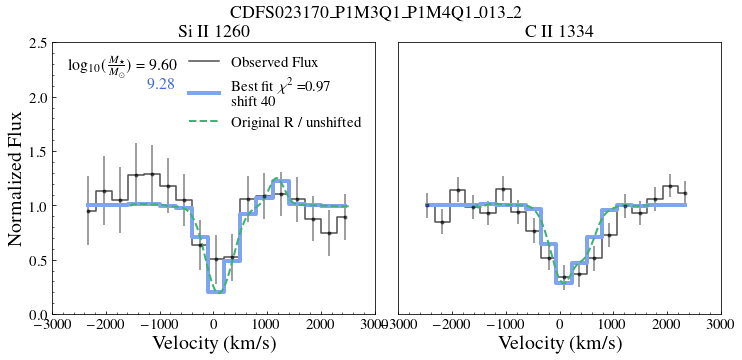

UDS022130_P2
9.8 2.1767371859841886 1.5019179054987584 2.912903673786477


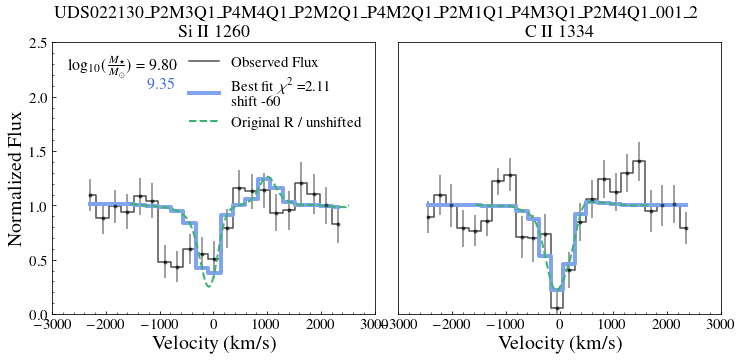

In [685]:
dfFS   = pd.read_csv('Vandels_100best_offset.csv')
path_to_data = path_to_folder+'/CII_SiII_depletion/'   # To change if you move the data

v_cm = np.genfromtxt(path_to_folder+'./dat_files/vcm_90_164.dat',unpack=True)
chi2allC_off = []
chi2allS_off = []
chi2all_off = []
onesig = 0
twosig = 0
threesig = 0
otherssig = 0
true_i= 0
def shift5(arr, num, fill_value=1):
    result = np.empty_like(arr)
    if num > 0:
        print('here', fill_value)
        result[:num] = fill_value
        result[num:] = arr[:-num]
    elif num < 0:
        result[num:] = fill_value
        result[:num] = arr[-num:]
    else:
        result[:] = arr
    return result
for i in range(len(info)):    
    
    if(info['snr_per_pix'][i]<5 or info['lmass'][i]<7.5):
        continue
#     print({info["spectrum"][i]})
    dat1 = pd.read_csv(f'vandels_sample/vandels_spectra/{info["spectrum"][i]}.dat',delim_whitespace=True,
                       comment="#", 
                       names = ['wl', 'flam', 'flam_err'])
    print(info["spectrum"][i][:12])
    redshift = info["z"][i]
    wave = dat1['wl']/(1+redshift)
    err  =  dat1['flam_err']/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
    flux = dat1['flam']/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
    flux[flux<0]=0
    vcIId  = (wave/wcII1334-1)*c
    vsiIId = (wave/wsiII1260-1)*c

    cutCIIall = (vcIId>-2500) & (vcIId<2500) 
    cutSiIIall = (vsiIId>-2500) & (vsiIId<2500)  
    
    fcII     = flux[cutCIIall]
    fsiII    = flux[cutSiIIall]
    ecII     = err[cutCIIall]
    esiII    = err[cutSiIIall]
    vcII     = vcIId[cutCIIall]
    vsiII    = vsiIId[cutSiIIall]  
    
    rmedCII = ((vcII<-1000) | (vcII>1000))
    fmedCII = np.nanmedian(fcII[rmedCII])
    fcII /= fmedCII
    
    rmedSiII = ((vsiII<-1000) |  (vsiII > 1700) )
    fmedSiII = np.nanmedian(fsiII[rmedSiII])
    fsiII /= fmedSiII  
    

    
    
    fig, axs = plt.subplots(1,2,figsize=(12,5))
    axs[1].errorbar(vcII, fcII, yerr = ecII, fmt='.k' , alpha=0.5)
    axs[1].plot(vcII, fcII,  c='k', alpha = 0.7,drawstyle='steps-mid' , label = 'Observed Flux')
    axs[1].set_title('C II 1334')
#     axs[1].axvline(0, c= 'royalblue')
   
    
    axs[0].errorbar(vsiII, fsiII, yerr = esiII, fmt='.k' , alpha=0.5)
    axs[0].plot(vsiII, fsiII,  c='k',  alpha = 0.7,drawstyle='steps-mid', label = 'Observed Flux' )
    axs[0].set_title('Si II 1260')
#     axs[0].axvline(0, c= 'royalblue')


    #######################################################                                                                                           
                                                                                                            
    # with FS
    bestDir         = dfFS['DirAll0'][true_i]
    bestOut         = dfFS['OutputAll0'][true_i]
    bestChi2FS      = dfFS['x2All0'][true_i]
    bestOff      =int(dfFS['outAll0'][true_i])
    if(bestChi2FS<=1):
        onesig+=1
    elif(bestChi2FS<=2):
        twosig+=1
    elif(bestChi2FS<=3):
        threesig+=1
    else:
        otherssig+=1
        
        
    lcII, fluxcII   = read_spectrum_c(path_to_data,  bestOut )
    lsiII, fluxsiII = read_spectrum_si(path_to_data, bestOut )

            ## CII Plot
    lcII_systemic  = lcII + np.dot(directions[bestDir,:], v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lcII) 
    lcII_systemic  = lcII_systemic[1:]
    vcII_s         = (lcII_systemic/wcII1334 -1)*c
    sigma_pixelcii = rkms_vandels/2 / 2.355/((vcII_s[50]-vcII_s[49]))
    modelcii       = gaussian_filter(fluxcII[bestDir,1:], sigma = sigma_pixelcii)
    
        ## Si II plot
    lsiII_systemic = lsiII + np.dot(directions[bestDir,:],v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lsiII) 
    lsiII_systemic = lsiII_systemic[1:]
    vsiII_s        = (lsiII_systemic/wsiII1260 -1)*c
    sigma_pixelsi  =  rkms_vandels/2/ 2.355/ ((vsiII_s[50]-vsiII_s[49]))
    modelsi      = gaussian_filter(fluxsiII[bestDir,1:], sigma = sigma_pixelsi)
    rmedSiII = ((vsiII_s<-1000) |  (vsiII_s > 1700) )
    fmedSiII = np.nanmedian(modelsi[rmedSiII])
    modelsi /= fmedSiII
    
    modelsi = shift5(modelsi, bestOff,1)
#     print(modelcii[:10])

    rmedCII = ((vcII_s<-1000) | (vcII_s>1000))
    fmedCII = np.nanmedian(modelcii[rmedCII])
    modelcii /= fmedCII
    modelcii = shift5(modelcii, bestOff,1)
    modelNewcii    = np.interp(vcII,vcII_s, modelcii)

    #modelcii=fluxcII[bestDir,1:]/fmedCII
    
    modelNewsi     = np.interp(vsiII,vsiII_s, modelsi)
#     rmedSiII = ((vsiII<-1000) |  (vsiII > 2000) )
#     fmedSiII = np.nanmedian(modelNewsi[rmedSiII])
#     modelNewsi /= fmedSiII  
#     modelsi = fluxsiII[bestDir,1:]/fmedSiII
         
        
    
    maskCII = (vcII >-1000) & (vcII < 1500)
    maskSiII =  (vsiII > -1000)  & (vsiII <  1500)


    if(len(ecII[maskCII]) > 0):
        lnlikecII  =  np.nansum(((fcII[maskCII]-modelNewcii[maskCII])**2)/ecII[maskCII]**2) #/len(ecII[maskCII])
        ncII = len(fcII[maskCII])
    else:
        lnlikecII = 0
        ncII = 0
    if(len(esiII[maskSiII]) > 0):
        lnlikesiII =  np.nansum(((fsiII[maskSiII] -  modelNewsi[maskSiII])**2)/esiII[maskSiII]**2)#/len(esiII[maskSiII])
        nsiII = len(fsiII[maskSiII])               
    else:
        lnlikesiII = 0
        nsiII = 0

    if(np.isnan(lnlikesiII)):
        lnlikesiII = 0
        nsiII = 0
    if(np.isnan(lnlikecII)):
        lnlikecII = 0
        ncII = 0
    lnlikeall  = (lnlikecII + lnlikesiII)/(ncII + nsiII)

    print( info['lmass'][i] , lnlikeall, lnlikecII/ncII, lnlikesiII/nsiII)
        
    axs[0].set_xlabel('Velocity (km/s)', fontsize = 20,)
    axs[1].set_xlabel('Velocity (km/s)', fontsize = 20)
    axs[0].set_ylabel('Normalized Flux', fontsize = 20)
    axs[1].set_yticks([])
    axs[0].set_xlim(-3010,3010)
    axs[1].set_xlim(-3010,3010)
    plt.suptitle( '%s'%info["spectrum"][i].replace("_", "\_" ), fontsize = 18)
    
    axs[0].set_ylim(0,2.5)
    axs[1].set_ylim(0,2.5)

#     maskCII = (vcII >-1000) & (vcII < 1000)
#     maskSiII = (vsiII > - 800)   & (vsiII < 1700)
#     #& (~((vsiII >-364) & (vsiII <-144)))
#     lnlikecII  =  np.nansum(((fcII[maskCII]-modelNewcii[maskCII])**2)/ecII[maskCII]**2)#/len(modelNewcii[maskCII])
#     ncII = len(modelNewcii[maskCII])

#     lnlikesiII =  np.nansum(((fsiII[maskSiII] - modelNewsi[maskSiII])**2)/esiII[maskSiII]**2)#/len(modelNewsi[maskSiII])
#     nsiII = len(modelNewsi[maskSiII])
        
# #     print('All ', lnlikecII/ncII, lnlikesiII/nsiII)
#     lnlikeall  = (lnlikecII + lnlikesiII)/(ncII+nsiII)
# #     print(lnlikeall)  
#     chi2allC_off.append(lnlikecII/ncII)
#     chi2allS_off.append(lnlikesiII/nsiII)
    chi2all_off.append(lnlikeall)
    axs[1].plot(vcII, modelNewcii, c =cFS, lw = 4, label = 'Best match', drawstyle = 'steps-mid')
    axs[0].plot(vsiII, modelNewsi, c =cFS, lw = 4, drawstyle = 'steps-mid',
                label = 'Best fit $\chi^2$ =%.2f \n shift %.0f'%(bestChi2FS,vsiII_s[50+int(bestOff)]-vsiII_s[50]))# label = 'fesc %.3f'%fesc900[bestOut-90, bestDir])
   

    axs[1].plot(vcII_s, gaussian_filter(modelcii,sigma = 0), c ='mediumseagreen', lw = 2, ls = '--')
    axs[0].plot(vsiII_s, gaussian_filter(modelsi,sigma = 0), c ='mediumseagreen', lw = 2,
                label = 'Original R / unshifted', ls = '--')# label = 'fesc %.3f'%fesc900[bestOut-90, bestDir])

    axs[0].text(0.05, 0.9, r'log$_{10}(\frac{M_\star}{M_\odot})$ = %.2f '%info['lmass'][i],
                transform=axs[0].transAxes, fontsize = 16)
    axs[0].text(0.05+(0.915-0.67), 0.83, str(np.round(np.log10(Mstar[bestOut-90]),2)),
                transform=axs[0].transAxes, fontsize = 16, c = 'royalblue')
    axs[0].legend(frameon = False, loc = 'upper right')
    plt.subplots_adjust(wspace=0.07, hspace=None)
    if( bestChi2FS>4):
        print("HEEEEL YEEEAH")
#     plt.savefig('Plots/WithOffsets/'+info["spectrum"][i]+'_bestmatch_offset.pdf', bbox_inches = 'tight')
    plt.show()
    
    true_i +=1
#     if(true_i>2):
#     break


### Plot fit paper

99 3.254988593084383
148 1.1215330101984056
99 1.1191979684898326


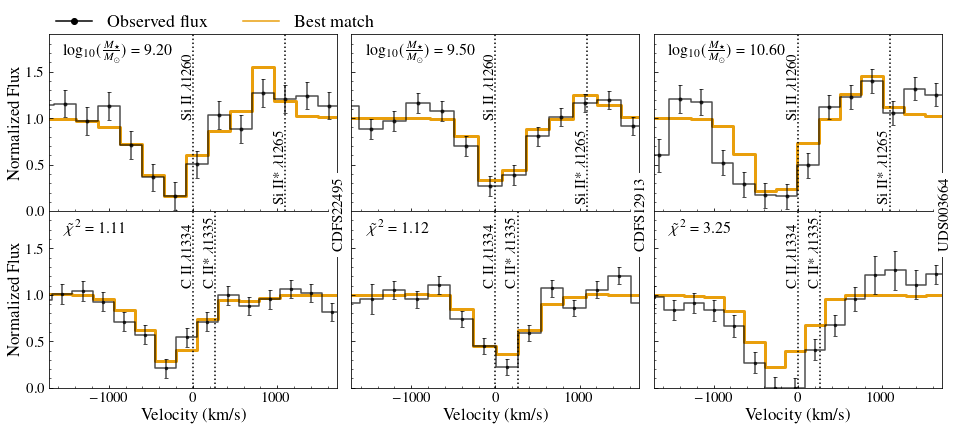

In [13]:
dfFS   = pd.read_csv('Vandels_100best_offset.csv')
path_to_data = path_to_folder+'/CII_SiII_depletion/'   # To change if you move the data
import math 
v_cm = np.genfromtxt(path_to_folder+'./dat_files/vcm_90_164.dat',unpack=True)
gal_sel = ['CDFS2249', 'UDS003664', 'CDFS129134',]
true_i = -1
plt_i = 3
fig, axs = plt.subplots(2,3,figsize=(16,6.5),sharex=True, sharey = True)

for i in range(len(info)):    
    
    if(info['snr_per_pix'][i]<5 or info['lmass'][i]<7.5):
        continue
    true_i +=1
    found = False
    for name in gal_sel:
        if name in info['spectrum'][i]:
            found=True
            break
    if(found == False):
        continue
    plt_i -=1

#     print({info["spectrum"][i]})
    dat1 = pd.read_csv(f'vandels_sample/vandels_spectra/{info["spectrum"][i]}.dat',delim_whitespace=True,
                       comment="#", 
                       names = ['wl', 'flam', 'flam_err'])
    redshift = info["z"][i]
    wave = dat1['wl']/(1+redshift)
    err  =  dat1['flam_err']/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
    flux = dat1['flam']/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
    flux[flux<0]=0
    vcIId  = (wave/wcII1334-1)*c
    vsiIId = (wave/wsiII1260-1)*c

    cutCIIall = (vcIId>-2500) & (vcIId<2500) 
    cutSiIIall = (vsiIId>-2500) & (vsiIId<2500)  
    
    fcII     = flux[cutCIIall]
    fsiII    = flux[cutSiIIall]
    ecII     = err[cutCIIall]
    esiII    = err[cutSiIIall]
    vcII     = vcIId[cutCIIall]
    vsiII    = vsiIId[cutSiIIall]  
    
    rmedCII = ((vcII<-1000) | (vcII>1000))
    fmedCII = np.nanmedian(fcII[rmedCII])
    fcII /= fmedCII
    
    rmedSiII = ((vsiII<-1000) |  (vsiII > 1700) )
    fmedSiII = np.nanmedian(fsiII[rmedSiII])
    fsiII /= fmedSiII  
    

    if(plt_i == 0):
        fcII[(vcII<-400) & (vcII >-1200) ] *=1.2
    
    axs[1,plt_i].errorbar(vcII, fcII, yerr = ecII, fmt='.k' , alpha=0.7, markersize = 5, capsize = 2)
    axs[1,plt_i].plot(vcII, fcII,  c='k', alpha = 0.7,drawstyle='steps-mid' , label = 'Observed Flux' )
#     axs[1].set_title('C II 1334')
#     axs[1].axvline(0, c= 'royalblue')
   
    
    axs[0,plt_i].errorbar(vsiII, fsiII, yerr = esiII, fmt='.k' , alpha=0.7,capsize = 2)
    axs[0,plt_i].plot(vsiII, fsiII,  c='k',  alpha = 0.7,drawstyle='steps-mid', label = 'Observed Flux' )
#     axs[0].set_title('Si II 1260')
#     axs[0].axvline(0, c= 'royalblue')


    #######################################################                                                                                           
                                                                                                            
    # with FS#227C9D
#E99F0C
    cfits = ['#E99F0C', '#227C9D','#61210F']
    for idxfix in [0]:
        bestDir         = dfFS[f'DirAll{idxfix}'][true_i]
        bestOut         = dfFS[f'OutputAll{idxfix}'][true_i]
        bestChi2FS      = dfFS[f'x2All{idxfix}'][true_i]
        bestOff          =   int(dfFS[f'outAll{idxfix}'][true_i])
        print(bestOut, bestChi2FS)


        lcII, fluxcII   = read_spectrum_c(path_to_data,  bestOut )
        lsiII, fluxsiII = read_spectrum_si(path_to_data, bestOut )

                ## CII Plot
        lcII_systemic  = lcII + np.dot(directions[bestDir,:], v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lcII) 
        lcII_systemic  = lcII_systemic[1:]
        vcII_s         = (lcII_systemic/wcII1334 -1)*c
        sigma_pixelcii = rkms_vandels/2 / 2.355/((vcII_s[50]-vcII_s[49]))
        modelcii       = gaussian_filter(fluxcII[bestDir,1:], sigma = sigma_pixelcii)

            ## Si II plot
        lsiII_systemic = lsiII + np.dot(directions[bestDir,:],v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lsiII) 
        lsiII_systemic = lsiII_systemic[1:]
        vsiII_s        = (lsiII_systemic/wsiII1260 -1)*c
        sigma_pixelsi  =  rkms_vandels/2/ 2.355/ ((vsiII_s[50]-vsiII_s[49]))
        modelsi      = gaussian_filter(fluxsiII[bestDir,1:], sigma = sigma_pixelsi)
        rmedSiII = ((vsiII_s<-1000) |  (vsiII_s > 1700) )
        fmedSiII = np.nanmedian(modelsi[rmedSiII])
        modelsi /= fmedSiII

        modelsi = shift5(modelsi, bestOff,1)
    #     print(modelcii[:10])

        rmedCII = ((vcII_s<-1000) | (vcII_s>1000))
        fmedCII = np.nanmedian(modelcii[rmedCII])
        modelcii /= fmedCII
        modelcii = shift5(modelcii, bestOff,1)
        modelNewcii    = np.interp(vcII,vcII_s, modelcii)

        #modelcii=fluxcII[bestDir,1:]/fmedCII

        modelNewsi     = np.interp(vsiII,vsiII_s, modelsi)

        axs[1,plt_i].text(0.05, 0.88,r'$\tilde{\chi}^2$ = %.2f'%(int(bestChi2FS*100)/100.),
                          c ='k', 
                      fontsize = 16,transform=axs[1,plt_i].transAxes,)
#         print( info['lmass'][i] , lnlikeall, lnlikecII/ncII, lnlikesiII/nsiII)

#         axs[0].set_xlabel('Velocity (km/s)', fontsize = 20,)


        
        axs[1,plt_i].plot(vcII, modelNewcii, c =cfits[idxfix//40], lw = 3, label = 'Best match', drawstyle = 'steps-mid', zorder = 0)
        axs[0,plt_i].plot(vsiII, modelNewsi, c =cfits[idxfix//40], lw =3, drawstyle = 'steps-mid',
                    label = 'Best match $\chi^2$ =%.2f'%(bestChi2FS), zorder = 0)# label = 'fesc %.3f'%fesc900[bestOut-90, bestDir])
    if(plt_i==0):
        axs[0,plt_i].set_ylabel('Normalized Flux', fontsize = 17)
        axs[1,plt_i].set_ylabel('Normalized Flux', fontsize = 17)

    axs[1,plt_i].set_xlabel('Velocity (km/s)', fontsize = 17)
    axs[0,plt_i].set_xlim(-1710,1710)
    axs[1,plt_i].set_xlim(-1710,1710)
    axs[1,plt_i].text(1660, 1.5, '%s'%info["spectrum"][i][:9], fontsize = 15, rotation = 90,
                     bbox=dict(facecolor='white', edgecolor='white'), zorder= 20)

    axs[0,plt_i].set_ylim(0,2.4)
    axs[1,plt_i].set_ylim(0,1.9)

    axs[1,plt_i].axvline(0, c = 'k', linestyle = ':')
    axs[1,plt_i].text(-150,1.1,r'C II  $\lambda1334$', c = 'k', rotation = 90)

    axs[0,plt_i].axvline(0, c = 'k', linestyle = ':')
    axs[0,plt_i].text(-150,1,r'Si II  $\lambda1260$', c = 'k', rotation = 90)
    axs[1,plt_i].axvline(offcIIfluo1335, c = 'k', linestyle = ':')
    axs[1,plt_i].text(offcIIfluo1335-150,1.1,r'C II*  $\lambda1335$', c = 'k', rotation = 90)

    axs[0,plt_i].axvline(offsiIIfluo1265, c = 'k', linestyle = ':')
    axs[0,plt_i].text(offsiIIfluo1265-150,0.1,r'Si II*  $\lambda1265$', c = 'k', rotation = 90)

    axs[0,plt_i].text(0.05, 0.88, r'log$_{10}(\frac{M_\star}{M_\odot})$ = %.2f'%info['lmass'][i],
                    transform=axs[0,plt_i].transAxes, fontsize = 16)
#         axs[0].text(0.5, 0.85, '('+str(np.round(np.log10(Mstar[bestOut-90]),2))+')',
#                     transform=axs[0].transAxes, fontsize = 16, c = 'royalblue')
#         axs[0].legend(frameon = False, loc = 'upper right')


line0 = Line2D([0], [0], label='Observed flux', marker='o', linestyle='-', color='k')   
line1 = Line2D([0], [0], label='Observed flux', marker='None', linestyle='-', color=cfits[0])    
# line2 = Line2D([0], [0], label='Observed flux', marker='None', linestyle='-', color=cfits[1])    
# line3 = Line2D([0], [0], label='Observed flux', marker='None', linestyle='-', color=cfits[2])    

labels = [r'Observed flux', 'Best match',  ]#r'50$^{\rm th}$ best match',  r'100$^{\rm th}$ best match'
ll = axs[0,0].legend([line0,line1,], labels,frameon = False, 
                     loc = (0,0.98),ncol = 4, fontsize = 18)
plt.subplots_adjust(wspace=0.05, hspace=0.0)

plt.savefig('Plots/fitexamples_V2.pdf', bbox_inches = 'tight')
plt.show()

#     true_i +=1
#     if(true_i>2):
#     break


In [327]:
chis = dfFS['x2All0'].values

print(chis[(info['lmass'][mask]<9.5) & (chis>4)] )

[4.76283971]


### Chi square

#### V1  with 100 best


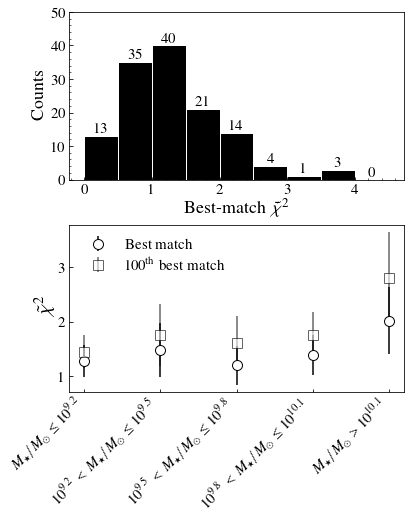

In [1026]:
chisall = dfFS['x2All0'].values
chisall[(info['lmass'][mask]<9.5) & (chis>4)] = np.nan

fig, (ax1, ax2) = plt.subplots(2,1, figsize = (6,7))
counts, edges, bars =ax1.hist(chisall,bins = np.arange(0,5,0.5),align='mid', 
                              alpha = 1, label = 'VANDELS',
             edgecolor = 'w',color = 'k', )
ax1.set_xlabel(r'Best-match $\tilde{\chi}^2$', fontsize = 18, labelpad = 1)
ax1.set_ylabel(r'Counts', fontsize = 18)
# axs[0].legend(frameon = False, fontsize = 15))           
ax1.bar_label(bars)
ax1.set_ylim(0,50)

mask1 = info['lmass'][mask]<9.2
mask3 = (9.2 <=info['lmass'][mask]) & (info['lmass'][mask]<9.5)
# mask4 = (9.4 <=info['lmass'][mask) & (info['lmass'][mask<9.6)
mask5 = (9.5 <=info['lmass'][mask]) & (info['lmass'][mask]<9.8)
mask6 = (9.8 <=info['lmass'][mask]) & (info['lmass'][mask]<10.1)
mask7 = (10.1 <=info['lmass'][mask]) 
# mask8 = (10.2 <=info['lmass'][mask)#& (info['lmass'][mask<10.4)
mask9 = (10.4 <=info['lmass'][mask])

ychi = [np.nanmean(chisall[mask1.values]),
         np.nanmean(chisall[mask3.values]),
             np.nanmean(chisall[mask5.values]),np.nanmean(chisall[mask6.values]),
         np.nanmean(chisall[mask7.values])]
ystd = [np.nanstd(chisall[mask1.values]),
         np.nanstd(chisall[mask3.values]),
    np.nanstd(chisall[mask5.values]),np.nanstd(chisall[mask6.values]),
         np.nanstd(chisall[mask7.values])]

ax2.errorbar(np.arange(len(ychi)),ychi, yerr = np.asarray(ystd)/2, marker = 'o', 
             markeredgecolor ='k',color = 'w',ecolor = 'k',
           markersize = 10, ls = 'None', label = r'Best match')

chisall = dfFS['x2All49'].values
chisall[(info['lmass'][mask]<9.5) & (chis>4)] = np.nan

# ychi = [np.nanmean(chisall[mask1.values]),
#          np.nanmean(chisall[mask3.values]),
#              np.nanmean(chisall[mask5.values]),np.nanmean(chisall[mask6.values]),
#          np.nanmean(chisall[mask7.values])]
# ystd = [np.nanstd(chisall[mask1.values]),
#          np.nanstd(chisall[mask3.values]),
#     np.nanstd(chisall[mask5.values]),np.nanstd(chisall[mask6.values]),
#          np.nanstd(chisall[mask7.values])]

# ax2.errorbar(np.arange(len(ychi)),ychi, yerr = np.asarray(ystd)/2, marker = 's', 
#              markeredgecolor ='k',color = 'w', alpha = 0.7,ecolor = 'k',
#            markersize = 10, ls = 'None', label = r'50$^{\rm th}$ best match')

# chisall = dfFS['x2All99'].values
# chisall[(info['lmass'][mask]<9.5) & (chis>4)] = np.nan

ychi = [np.mean(chisall[mask1.values]),
         np.mean(chisall[mask3.values]),
             np.mean(chisall[mask5.values]),np.mean(chisall[mask6.values]),
         np.mean(chisall[mask7.values])]
ystd = [np.std(chisall[mask1.values]),
         np.std(chisall[mask3.values]),
    np.std(chisall[mask5.values]),np.std(chisall[mask6.values]),
         np.std(chisall[mask7.values])]

ax2.errorbar(np.arange(len(ychi)),ychi, yerr = np.asarray(ystd)/2, marker = 's',
             markeredgecolor ='k',color = 'w', alpha = 0.6,ecolor = 'k',
           markersize = 10, ls = 'None', label = r'100$^{\rm th}$ best match')

ax2.minorticks_off()
ax2.set_xticks([0,1,2,3,4])
ax2.set_ylabel(r'$\tilde{\chi}^2$', fontsize = 20)
ax2.legend(frameon = False, fontsize = 15, loc = 'upper left')
ax2.set_xticklabels([r'$M_\star/M_\odot \leq 10^{9.2}$',
                     r'$10^{9.2}$ $<$ $M_\star/M_\odot \leq 10^{9.5}$',
                     r'$10^{9.5}$ $<$ $M_\star/M_\odot\leq 10^{9.8}$',
                     r'$10^{9.8}$ $<$ $M_\star/M_\odot  \leq 10^{10.1}$',
                     r'$M_\star/M_\odot > 10^{10.1}$'],ha="right" ,rotation = 45)
plt.subplots_adjust(wspace=0.07, hspace=0.27)
plt.savefig('Plots/Chisquare_woff.pdf', bbox_inches = 'tight')
# plt.figure()
# plt.scatter(info['lmass'][mask],chisall )

#### V2 with all

131


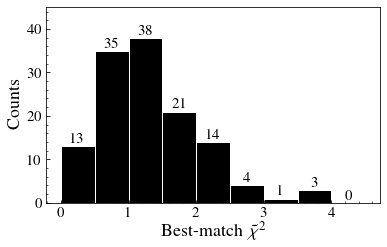

In [36]:
dfFS   = np.genfromtxt('Vandels_allbest_offset.csv',delimiter = ',', skip_header=1)
chisall = dfFS.T
# print(chisall)
print(len(np.min(chisall, axis = 1)))
# chisall = dfFS[''].values
# print(chisall)
# chisall[(info['lmass'][mask]<9.5) & (chis>4)] = np.nan

fig, ax1 = plt.subplots(1,1, figsize = (6,3.6))
counts, edges, bars =ax1.hist(np.min(chisall, axis = 1),bins = np.arange(0,5,0.5),align='mid', 
                              alpha = 1, label = 'VANDELS',
             edgecolor = 'w',color = 'k', )
ax1.set_xlabel(r'Best-match $\tilde{\chi}^2$', fontsize = 18, labelpad = 1)
ax1.set_ylabel(r'Counts', fontsize = 18)
ax1.tick_params(labelsize = 15)
# axs[0].legend(frameon = False, fontsize = 15))           
ax1.bar_label(bars, fontsize = 15)
ax1.set_ylim(0,45)

# mask1 = info['lmass'][mask]<9.2
# mask3 = (9.2 <=info['lmass'][mask]) & (info['lmass'][mask]<9.5)
# # mask4 = (9.4 <=info['lmass'][mask) & (info['lmass'][mask<9.6)
# mask5 = (9.5 <=info['lmass'][mask]) & (info['lmass'][mask]<9.8)
# mask6 = (9.8 <=info['lmass'][mask]) & (info['lmass'][mask]<10.1)
# mask7 = (10.1 <=info['lmass'][mask]) 
# # mask8 = (10.2 <=info['lmass'][mask)#& (info['lmass'][mask<10.4)
# mask9 = (10.4 <=info['lmass'][mask])

# lessthan1 = np.sum(chisall<= 1., axis = 1)
# lessthan2 = np.sum(chisall<= 2, axis = 1)
# lessthan3 = np.sum(chisall<= 3, axis = 1)
# # print(lessthan1,lessthan1[mask1.values],ychi_1)
# ychi_1 = [np.nanmean(lessthan1[mask1.values]),
#          np.nanmean(lessthan1[mask3.values]),
#              np.nanmean(lessthan1[mask5.values]),np.nanmean(lessthan1[mask6.values])-131,
#          np.nanmean(lessthan1[mask7.values])]
# ystd_1 = [np.nanstd(lessthan1[mask1.values]),
#          np.nanstd(lessthan1[mask3.values]),
#     np.nanstd(lessthan1[mask5.values]),np.nanstd(lessthan1[mask6.values]),
#          np.nanstd(lessthan1[mask7.values])]

# ychi_2 = [np.nanmean(lessthan2[mask1.values]),
#          np.nanmean(lessthan2[mask3.values]),
#              np.nanmean(lessthan2[mask5.values]),np.nanmean(lessthan2[mask6.values]),
#          np.nanmean(lessthan2[mask7.values])]
# ystd_2 = [np.nanstd(lessthan2[mask1.values]),
#          np.nanstd(lessthan2[mask3.values]),
#     np.nanstd(lessthan2[mask5.values]),np.nanstd(lessthan2[mask6.values]),
#          np.nanstd(lessthan2[mask7.values])]

# ychi_3 = [np.nanmean(lessthan3[mask1.values]),
#          np.nanmean(lessthan3[mask3.values]),
#              np.nanmean(lessthan3[mask5.values]),np.nanmean(lessthan3[mask6.values]),
#          np.nanmean(lessthan3[mask7.values])]
# ystd_3 = [np.nanstd(lessthan3[mask1.values]),
#          np.nanstd(lessthan3[mask3.values]),
#     np.nanstd(lessthan3[mask5.values]),np.nanstd(lessthan3[mask6.values]),
#          np.nanstd(lessthan3[mask7.values])]
# # ax2.errorbar(np.arange(len(ychi)),ychi, yerr = np.asarray(ystd)/2, marker = 'o', 
# #              markeredgecolor ='k',color = 'w',ecolor = 'k',
# #            markersize = 10, ls = 'None', label = r'Best match')

# ax2.bar(np.arange(len(ychi_1))-0.3, np.asarray(ychi_1)/131,  label = r'$\tilde{\chi}^2\leq1$',
#              edgecolor = 'w',color = 'k', width=0.3,)
# ax2.bar(np.arange(len(ychi_1)),  np.asarray(ychi_2)/131,  label = r'$\tilde{\chi}^2\leq2$',
#              edgecolor = 'k',color = 'gray', width=0.3,)
# ax2.bar(np.arange(len(ychi_1))+0.3,  np.asarray(ychi_3)/131,  label = r'$\tilde{\chi}^2\leq3$',
#              edgecolor = 'k',color = 'w', width=0.3,)
# ax2.set_yscale('log')

# ax2.set_yticks([1,10,100,1000,10000])

# ax2.tick_params(labelsize = 15)

# # ax2.errorbar(np.arange(len(ychi)),ychi, yerr = np.asarray(ystd)/2, marker = 's',
# #              markeredgecolor ='k',color = 'w', alpha = 0.6,ecolor = 'k',
# #            markersize = 10, ls = 'None', label = r'100$^{\rm th}$ best match')

# # ax2.minorticks_off()
# ax2.set_xticks([0,1,2,3,4])
# ax2.set_ylabel(r'Counts', fontsize = 18)
# ax2.legend(frameon = False, fontsize = 15, ncol = 3,loc = (0,0.85))
# ax2.set_xticklabels([r'$M_\star/M_\odot \leq 10^{9.2}$',
#                      r'$10^{9.2}$ $<$ $M_\star/M_\odot \leq 10^{9.5}$',
#                      r'$10^{9.5}$ $<$ $M_\star/M_\odot\leq 10^{9.8}$',
#                      r'$10^{9.8}$ $<$ $M_\star/M_\odot  \leq 10^{10.1}$',
#                      r'$M_\star/M_\odot > 10^{10.1}$'],ha="right" ,rotation = 45, fontsize = 15)
# ax2.set_ylim(1, 5e2)
# plt.subplots_adjust(wspace=0.07, hspace=0.27)
plt.savefig('Plots/Chisquare_woff_V3.pdf', bbox_inches = 'tight')
# # plt.figure()
# # plt.scatter(info['lmass'][mask],chisall )

131
17 39
8 22


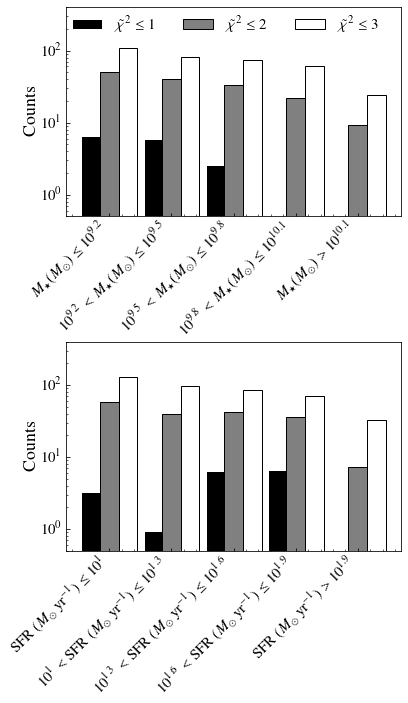

In [32]:
dfFS   = np.genfromtxt('Vandels_allbest_offset.csv',delimiter = ',', skip_header=1)
chisall = dfFS.T
# print(chisall)
print(len(np.min(chisall, axis = 1)))
# chisall = dfFS[''].values
# print(chisall)
# chisall[(info['lmass'][mask]<9.5) & (chis>4)] = np.nan

fig, (ax2, ax1) = plt.subplots(2,1, figsize = (6,10))


mask1 = info['lmass'][mask]<9.3
mask3 = (9.5 <=info['lmass'][mask]) & (info['lmass'][mask]<9.7)
# mask4 = (9.4 <=info['lmass'][mask) & (info['lmass'][mask<9.6)
mask5 = (9.7 <=info['lmass'][mask]) & (info['lmass'][mask]<9.9)
mask6 = (9.9 <=info['lmass'][mask]) & (info['lmass'][mask]<10.1)
mask7 = (10.1 <=info['lmass'][mask]) 
# mask8 = (10.2 <=info['lmass'][mask)#& (info['lmass'][mask<10.4)
mask9 = (10.4 <=info['lmass'][mask])

print(np.sum(mask1), np.sum(mask3))
lessthan1 = np.sum(chisall<= 1., axis = 1)
lessthan2 = np.sum(chisall<= 2, axis = 1)
lessthan3 = np.sum(chisall<= 3, axis = 1)
# print(lessthan1,lessthan1[mask1.values],ychi_1)
ychi_1 = [np.nanmean(lessthan1[mask1.values]),
         np.nanmean(lessthan1[mask3.values]),
             np.nanmean(lessthan1[mask5.values]),np.nanmean(lessthan1[mask6.values]),
         np.nanmean(lessthan1[mask7.values])]
ystd_1 = [np.nanstd(lessthan1[mask1.values]),
         np.nanstd(lessthan1[mask3.values]),
    np.nanstd(lessthan1[mask5.values]),np.nanstd(lessthan1[mask6.values]),
         np.nanstd(lessthan1[mask7.values])]

ychi_2 = [np.nanmean(lessthan2[mask1.values]),
         np.nanmean(lessthan2[mask3.values]),
             np.nanmean(lessthan2[mask5.values]),np.nanmean(lessthan2[mask6.values]),
         np.nanmean(lessthan2[mask7.values])]
ystd_2 = [np.nanstd(lessthan2[mask1.values]),
         np.nanstd(lessthan2[mask3.values]),
    np.nanstd(lessthan2[mask5.values]),np.nanstd(lessthan2[mask6.values]),
         np.nanstd(lessthan2[mask7.values])]

ychi_3 = [np.nanmean(lessthan3[mask1.values]),
         np.nanmean(lessthan3[mask3.values]),
             np.nanmean(lessthan3[mask5.values]),np.nanmean(lessthan3[mask6.values]),
         np.nanmean(lessthan3[mask7.values])]
ystd_3 = [np.nanstd(lessthan3[mask1.values]),
         np.nanstd(lessthan3[mask3.values]),
    np.nanstd(lessthan3[mask5.values]),np.nanstd(lessthan3[mask6.values]),
         np.nanstd(lessthan3[mask7.values])]
# ax2.errorbar(np.arange(len(ychi)),ychi, yerr = np.asarray(ystd)/2, marker = 'o', 
#              markeredgecolor ='k',color = 'w',ecolor = 'k',
#            markersize = 10, ls = 'None', label = r'Best match')

ax2.bar(np.arange(len(ychi_1))-0.3, np.asarray(ychi_1)/131,  label = r'$\tilde{\chi}^2\leq1$',
             edgecolor = 'w',color = 'k', width=0.3,)
ax2.bar(np.arange(len(ychi_1)),  np.asarray(ychi_2)/131,  label = r'$\tilde{\chi}^2\leq2$',
             edgecolor = 'k',color = 'gray', width=0.3,)
ax2.bar(np.arange(len(ychi_1))+0.3,  np.asarray(ychi_3)/131,  label = r'$\tilde{\chi}^2\leq3$',
             edgecolor = 'k',color = 'w', width=0.3,)
ax2.set_yscale('log')

ax2.set_yticks([1,10,100,1000,10000])

ax2.tick_params(labelsize = 15)

# ax2.errorbar(np.arange(len(ychi)),ychi, yerr = np.asarray(ystd)/2, marker = 's',
#              markeredgecolor ='k',color = 'w', alpha = 0.6,ecolor = 'k',
#            markersize = 10, ls = 'None', label = r'100$^{\rm th}$ best match')

# ax2.minorticks_off()
ax2.set_xticks([0,1,2,3,4])
ax2.set_ylabel(r'Counts', fontsize = 18)
ax2.legend(frameon = False, fontsize = 15, ncol = 3,loc = (0,0.85))
ax2.set_xticklabels([r'$M_\star(M_\odot) \leq 10^{9.2}$',
                     r'$10^{9.2}$ $<$ $M_\star(M_\odot) \leq 10^{9.5}$',
                     r'$10^{9.5}$ $<$ $M_\star(M_\odot) \leq 10^{9.8}$',
                     r'$10^{9.8}$ $<$ $M_\star(M_\odot)  \leq 10^{10.1}$',
                     r'$M_\star(M_\odot) > 10^{10.1}$'],ha="right" ,rotation = 45, fontsize = 15)
ax2.set_ylim(0.5, 4e2)

mask1 = info['lsfr'][mask]<1
mask3 = (1 <=info['lsfr'][mask]) & (info['lsfr'][mask]<1.3)
# mask4 = (9.4 <=info['lmass'][mask) & (info['lmass'][mask<9.6)
mask5 = (1.3 <=info['lsfr'][mask]) & (info['lsfr'][mask]<1.6)
mask6 = (1.6 <=info['lsfr'][mask]) & (info['lsfr'][mask]<1.9)
mask7 = (1.9 <=info['lsfr'][mask]) 
# mask8 = (10.2 <=info['lmass'][mask)#& (info['lmass'][mask<10.4)
mask9 = (10.4 <=info['lsfr'][mask])

print(np.sum(mask1), np.sum(mask3))
lessthan1 = np.sum(chisall<= 1., axis = 1)
lessthan2 = np.sum(chisall<= 2, axis = 1)
lessthan3 = np.sum(chisall<= 3, axis = 1)
# print(lessthan1,lessthan1[mask1.values],ychi_1)
ychi_1 = [np.nanmean(lessthan1[mask1.values]),
         np.nanmean(lessthan1[mask3.values]),
             np.nanmean(lessthan1[mask5.values]),np.nanmean(lessthan1[mask6.values]),
         np.nanmean(lessthan1[mask7.values])]
ystd_1 = [np.nanstd(lessthan1[mask1.values]),
         np.nanstd(lessthan1[mask3.values]),
    np.nanstd(lessthan1[mask5.values]),np.nanstd(lessthan1[mask6.values]),
         np.nanstd(lessthan1[mask7.values])]

ychi_2 = [np.nanmean(lessthan2[mask1.values]),
         np.nanmean(lessthan2[mask3.values]),
             np.nanmean(lessthan2[mask5.values]),np.nanmean(lessthan2[mask6.values]),
         np.nanmean(lessthan2[mask7.values])]
ystd_2 = [np.nanstd(lessthan2[mask1.values]),
         np.nanstd(lessthan2[mask3.values]),
    np.nanstd(lessthan2[mask5.values]),np.nanstd(lessthan2[mask6.values]),
         np.nanstd(lessthan2[mask7.values])]

ychi_3 = [np.nanmean(lessthan3[mask1.values]),
         np.nanmean(lessthan3[mask3.values]),
             np.nanmean(lessthan3[mask5.values]),np.nanmean(lessthan3[mask6.values]),
         np.nanmean(lessthan3[mask7.values])]
ystd_3 = [np.nanstd(lessthan3[mask1.values]),
         np.nanstd(lessthan3[mask3.values]),
    np.nanstd(lessthan3[mask5.values]),np.nanstd(lessthan3[mask6.values]),
         np.nanstd(lessthan3[mask7.values])]
# ax2.errorbar(np.arange(len(ychi)),ychi, yerr = np.asarray(ystd)/2, marker = 'o', 
#              markeredgecolor ='k',color = 'w',ecolor = 'k',
#            markersize = 10, ls = 'None', label = r'Best match')

ax1.bar(np.arange(len(ychi_1))-0.3, np.asarray(ychi_1)/131,  label = r'$\tilde{\chi}^2\leq1$',
             edgecolor = 'w',color = 'k', width=0.3,)
ax1.bar(np.arange(len(ychi_1)),  np.asarray(ychi_2)/131,  label = r'$\tilde{\chi}^2\leq2$',
             edgecolor = 'k',color = 'gray', width=0.3,)
ax1.bar(np.arange(len(ychi_1))+0.3,  np.asarray(ychi_3)/131,  label = r'$\tilde{\chi}^2\leq3$',
             edgecolor = 'k',color = 'w', width=0.3,)
ax1.set_yscale('log')
# ax1.set_yticks([1,10,100,1000,10000])

ax1.tick_params(labelsize = 15)

# ax2.errorbar(np.arange(len(ychi)),ychi, yerr = np.asarray(ystd)/2, marker = 's',
#              markeredgecolor ='k',color = 'w', alpha = 0.6,ecolor = 'k',
#            markersize = 10, ls = 'None', label = r'100$^{\rm th}$ best match')

# ax2.minorticks_off()
ax1.set_xticks([0,1,2,3,4])
ax1.set_ylabel(r'Counts', fontsize = 18)
# ax1.legend(frameon = False, fontsize = 15, ncol = 3,loc = (0,0.85))
ax1.set_xticklabels([r'SFR ($M_\odot$ yr$^{-1}$) $\leq 10^{1}$',
                     r'$10^{1}$ $<$ SFR ($M_\odot$ yr$^{-1}$) $\leq 10^{1.3}$',
                     r'$10^{1.3}$ $<$ SFR ($M_\odot$ yr$^{-1}$) $\leq 10^{1.6}$',
                      r'$10^{1.6}$ $<$ SFR ($M_\odot$ yr$^{-1}$) $\leq 10^{1.9}$',
                     r'SFR ($M_\odot$ yr$^{-1}$) $> 10^{1.9}$',],ha="right" ,rotation = 45, fontsize = 15)
ax1.set_ylim(0.5, 4e2)

plt.subplots_adjust(wspace=0.07, hspace=0.6)

plt.savefig('Plots/Chisquare_Mstar_SFR.pdf', bbox_inches = 'tight')
# # plt.figure()
# # plt.scatter(info['lmass'][mask],chisall )

#### Select 1.5 or 2 chi galax

In [161]:
nthresh = 30
mask15_sel = np.sum(chisall<= 1.5, axis = 1) >= 5
mask2_sel = np.sum(chisall<= 2, axis = 1) >= nthresh
mask3_sel = np.sum(chisall<= 3, axis = 1) > 40

print(np.sum(mask15_sel))
print(np.sum(mask2_sel))
print(np.sum(chisall<= 2, axis = 1))
# FINAL IS MASK2

75
93
[ 3544  2037   725  7579 20798 21658    67     4 17155   157 11833   599
 14455   744  8879   146  5823     0  2235 13463  1740 16571  9057 20630
 10693   234  1816  8921     2     0  7393     0   316  2494 12002  2282
 11967 13628  1397  6919  5085  4548    69     0  6357 16257  5419 21751
 10866     0   109  1292    67  9207  3098   258     1     0  2620     0
     5     0    38     0    27  4392 13637     0     2     0     0    22
 22395  3258    93     9    28     0  1423    35   117 19117  5630     0
   894    55  4132     2  6563     5  1689  4301   341  1655 21397   124
     0  6419   466     0     0    76 12580    20  3036  1278 11483 21287
     0 16440     0  8003  1294  6092  3488     6     0  1448 11546     0
  4770    10 10040   158     0  4079     0 21098   252    67     0]


## Comparison both fitting approaches

### Fit comp

In [ ]:
dfyes   = pd.read_csv('Vandels_100best_offset.csv')
dfno   = pd.read_csv('Vandels_100best_nooffset.csv')
mask = (info['snr_per_pix']>=5) & (info['lmass']>7.5)

v_cm = np.genfromtxt(path_to_folder+'./dat_files/vcm_90_164.dat',unpack=True)
chi2allC_off = []
chi2allS_off = []
chi2all_off = []
onesig = 0
twosig = 0
threesig = 0
otherssig = 0
true_i= 0
for i in range(len(info)):    
    
    if(info['snr_per_pix'][i]<5):
        continue
#     print({info["spectrum"][i]})
    dat1 = pd.read_csv(f'vandels_sample/vandels_spectra/{info["spectrum"][i]}.dat',delim_whitespace=True,
                       comment="#", 
                       names = ['wl', 'flam', 'flam_err'])
    redshift = info["z"][i]
    wave = dat1['wl']/(1+redshift)
    err  =  dat1['flam_err']/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
    flux = dat1['flam']/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
    flux[flux<0]=0
    vcIId  = (wave/wcII1334-1)*c
    vsiIId = (wave/wsiII1260-1)*c

    cutCIIall = (vcIId>-2000) & (vcIId<2000) 
    cutSiIIall = (vsiIId>-2000) & (vsiIId<2000)  
    
    fcII     = flux[cutCIIall]
    fsiII    = flux[cutSiIIall]
    ecII     = err[cutCIIall]
    esiII    = err[cutSiIIall]
    vcII     = vcIId[cutCIIall]
    vsiII    = vsiIId[cutSiIIall]  
    
    rmedCII = ((vcII<-500) | (vcII > 500))
    fmedCII = np.nanmedian(fcII[rmedCII])
    fcII /= fmedCII
    
    rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500))) 
    fmedSiII = np.nanmedian(fsiII[rmedSiII])
    fsiII /= fmedSiII
    
    fig, axs = plt.subplots(1,2,figsize=(12,5))
    axs[1].errorbar(vcII, fcII, yerr = ecII, fmt='.k' , alpha=0.5)
    axs[1].plot(vcII, fcII,  c='k', alpha = 0.7,drawstyle='steps-mid' , label = 'Observed Flux')
    axs[1].set_title('C II 1334')
#     axs[1].axvline(0, c= 'royalblue')
   
    
    axs[0].errorbar(vsiII, fsiII, yerr = esiII, fmt='.k' , alpha=0.5)
    axs[0].plot(vsiII, fsiII,  c='k',  alpha = 0.7,drawstyle='steps-mid', label = 'Observed Flux' )
    axs[0].set_title('Si II 1260')
#     axs[0].axvline(0, c= 'royalblue')


    #######################################################                                                                                           
                                                                                                            
    # with Off set
    bestDir_off         = dfyes['DirAll0'][true_i]
    bestOut_off         = dfyes['OutputAll0'][true_i]
    bestChi2FS_off      = dfyes['x2All0'][true_i]
    bestOff_off         = int(dfyes['outAll0'][true_i])
#     print(bestDir_off,bestOut_off,bestOff_off )
    lcII, fluxcII   = read_spectrum_c(path_to_data,  bestOut_off )
    lsiII, fluxsiII = read_spectrum_si(path_to_data, bestOut_off )

            ## CII Plot
    lcII_systemic  = lcII + np.dot(directions[bestDir_off,:], v_cm[:,bestOut_off-90])/c_cgs*1e5*np.mean(lcII) 
    lcII_systemic  = lcII_systemic[1:]
    vcII_s         = (lcII_systemic/wcII1334 -1)*c
    sigma_pixelcii = rkms_vandels/4 / 2.355/((vcII_s[50]-vcII_s[49]))
    modelcii       = gaussian_filter(fluxcII[bestDir_off,1:], sigma = sigma_pixelcii)
    
        ## Si II plot
    lsiII_systemic = lsiII + np.dot(directions[bestDir_off,:],v_cm[:,bestOut_off-90])/c_cgs*1e5*np.mean(lsiII) 
    lsiII_systemic = lsiII_systemic[1:]
    vsiII_s        = (lsiII_systemic/wsiII1260 -1)*c
    sigma_pixelsi  =  rkms_vandels/4/ 2.355/ ((vsiII_s[50]-vsiII_s[49]))
    modelsi      = gaussian_filter(fluxsiII[bestDir_off,1:]/np.median(fluxsiII[bestDir_off,1:]), sigma = sigma_pixelsi)
    
    modelsi = shift5(modelsi, bestOff_off)
    modelcii = shift5(modelcii, bestOff_off)
    
    modelNewcii    = np.interp(vcII,vcII_s, modelcii)
    rmedCII = ((vcII<-500) | (vcII > 700)) 
    fmedCII = np.nanmedian(modelNewcii[rmedCII])
    modelNewcii /= fmedCII
    modelcii=fluxcII[bestDir_off,1:]/fmedCII
    
    modelNewsi     = np.interp(vsiII,vsiII_s, modelsi)
    rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500)))
    fmedSiII = np.nanmedian(modelNewsi[rmedSiII])
    modelNewsi /= fmedSiII  
    modelsi = fluxsiII[bestDir,1:]/np.median(fluxsiII[bestDir_off,1:])/fmedSiII
    
    
    axs[1].plot(vcII, modelNewcii, c =cFS, lw = 4, label = 'Best match', drawstyle = 'steps-mid')
    axs[0].plot(vsiII, modelNewsi, c =cFS, lw = 4, drawstyle = 'steps-mid',
                label = 'Best match $\chi^2$ =%.2f -  shift %.0f km/s'%(bestChi2FS_off,
                                                                 vsiII_s[50+int(bestOff_off)]-vsiII_s[50]))# label = 'fesc %.3f'%fesc900[bestOut-90, bestDir])

    # without Off set
    bestDir         = dfno['DirAll0'][true_i]
    bestOut        = dfno['OutputAll0'][true_i]
    bestChi2FS      = dfno['x2All0'][true_i]

    lcII, fluxcII   = read_spectrum_c(path_to_data,  bestOut )
    lsiII, fluxsiII = read_spectrum_si(path_to_data, bestOut )

            ## CII Plot
    lcII_systemic  = lcII + np.dot(directions[bestDir,:], v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lcII) 
    lcII_systemic  = lcII_systemic[1:]
    vcII_s         = (lcII_systemic/wcII1334 -1)*c
    sigma_pixelcii = rkms_vandels/4 / 2.355/((vcII_s[50]-vcII_s[49]))
    modelcii       = gaussian_filter(fluxcII[bestDir,1:], sigma = sigma_pixelcii)
    
        ## Si II plot
    lsiII_systemic = lsiII + np.dot(directions[bestDir,:],v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lsiII) 
    lsiII_systemic = lsiII_systemic[1:]
    vsiII_s        = (lsiII_systemic/wsiII1260 -1)*c
    sigma_pixelsi  =  rkms_vandels/4/ 2.355/ ((vsiII_s[50]-vsiII_s[49]))
    modelsi      = gaussian_filter(fluxsiII[bestDir,1:]/np.median(fluxsiII[bestDir,1:]), sigma = sigma_pixelsi)
    

    modelNewcii    = np.interp(vcII,vcII_s, modelcii)
    rmedCII = ((vcII<-500) | (vcII > 700)) 
    fmedCII = np.nanmedian(modelNewcii[rmedCII])
    modelNewcii /= fmedCII
    modelcii=fluxcII[bestDir,1:]/fmedCII
    
    modelNewsi     = np.interp(vsiII,vsiII_s, modelsi)
    rmedSiII = ((vsiII<-600) | ((vsiII > 300) & (vsiII < 500)))
    fmedSiII = np.nanmedian(modelNewsi[rmedSiII])
    modelNewsi /= fmedSiII  
    modelsi = fluxsiII[bestDir,1:]/np.median(fluxsiII[bestDir,1:])/fmedSiII
    axs[1].plot(vcII, modelNewcii, c =cnoFS, lw = 4, label = 'Best match', drawstyle = 'steps-mid')
    axs[0].plot(vsiII, modelNewsi, c =cnoFS, lw = 4, drawstyle = 'steps-mid',
                label = 'Best match-no shift- $\chi^2$ =%.2f '%(bestChi2FS))
    ############   
    axs[0].set_xlabel('Velocity (km/s)', fontsize = 20,)
    axs[1].set_xlabel('Velocity (km/s)', fontsize = 20)
    axs[0].set_ylabel('Normalized Flux', fontsize = 20)
    axs[1].set_yticks([])
    axs[0].set_xlim(-2010,2010)
    axs[1].set_xlim(-2010,2010)
    plt.suptitle( '%s'%info["spectrum"][i].replace("_", "\_" ), fontsize = 18)
    
    axs[0].set_ylim(0,2.5)
    axs[1].set_ylim(0,2.5)

    axs[0].legend(frameon = False, loc = 'upper left')
    plt.subplots_adjust(wspace=0.07, hspace=None)
#     plt.savefig('Plots/'+info["spectrum"][i]+'_bestmatch_comp.pdf', bbox_inches = 'tight')
    plt.show()
    true_i +=1
#     if(true_i>2):
#         break


### Chisquare

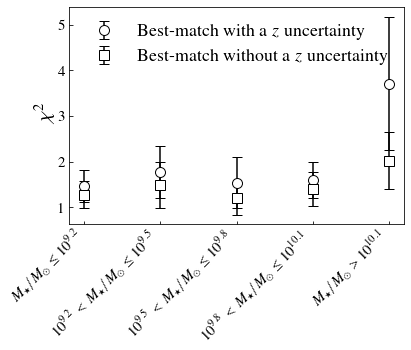

In [940]:
dfyes   = pd.read_csv('Vandels_100best_offset.csv')
dfno   = pd.read_csv('Vandels_100best_nooffset.csv')
# print(len(dfno), len(dfyes))
mask = (info['snr_per_pix']>=5) & (info['lmass']>7.5)

fig, (ax2) = plt.subplots(1,1, figsize = (6,4))
# counts, edges, bars =ax1.hist([dfno['x2All0'],dfyes['x2All0']],bins = [0,1,2,3,4,5,6,7,8,9,10,11],align='mid', 
#                               alpha = 1, label = ['Without z uncertainty', 'With z uncertainty'],
#              edgecolor = 'k',color = ['#800000','#227C9D'], )
# print(bars)
# ax1.set_xlabel(r'$\chi^2$', fontsize = 20)
# ax1.set_ylabel(r'Counts', fontsize = 20)
# ax1.legend(frameon = False, fontsize = 15)          
# ax1.bar_label(bars[0])
# ax1.bar_label(bars[1])

# ax1.set_ylim(0,69)


mask1 = info['lmass'][mask]<9.2
mask3 = (9.2 <=info['lmass'][mask]) & (info['lmass'][mask]<9.5)
# mask4 = (9.4 <=info['lmass'][mask) & (info['lmass'][mask<9.6)
mask5 = (9.5 <=info['lmass'][mask]) & (info['lmass'][mask]<9.8)
mask6 = (9.8 <=info['lmass'][mask]) & (info['lmass'][mask]<10.1)
mask7 = (10.1 <=info['lmass'][mask]) 
# mask8 = (10.2 <=info['lmass'][mask)#& (info['lmass'][mask<10.4)
mask9 = (10.4 <=info['lmass'][mask])

ychi1 = [np.mean(dfno['x2All0'][mask1.values]),
         np.mean(dfno['x2All0'][mask3.values]),
             np.mean(dfno['x2All0'][mask5.values]),np.mean(dfno['x2All0'][mask6.values]),
         np.mean(dfno['x2All0'][mask7.values])]
ystd1 = [np.std(dfno['x2All0'][mask1.values]),
         np.std(dfno['x2All0'][mask3.values]),
    np.std(dfno['x2All0'][mask5.values]),np.std(dfno['x2All0'][mask6.values]),
         np.std(dfno['x2All0'][mask7.values])]

ychi2 = [np.mean(dfyes['x2All0'][mask1.values]),
         np.mean(dfyes['x2All0'][mask3.values]),
             np.mean(dfyes['x2All0'][mask5.values]),np.mean(dfyes['x2All0'][mask6.values]),
         np.mean(dfyes['x2All0'][mask7.values])]
ystd2 = [np.std(dfyes['x2All0'][mask1.values]),
         np.std(dfyes['x2All0'][mask3.values]),
    np.std(dfyes['x2All0'][mask5.values]),np.std(dfyes['x2All0'][mask6.values]),
         np.std(dfyes['x2All0'][mask7.values])]

ax2.errorbar(np.arange(len(ychi1)),ychi1, yerr = np.asarray(ystd1)/2, marker = 'o', markeredgecolor ='k',color = 'w',
           markersize = 10, ls = 'None', ecolor = 'k',capsize = 5, label = 'Best-match with a $z$ uncertainty' )
ax2.errorbar(np.arange(len(ychi2)),ychi2, yerr = np.asarray(ystd2)/2, marker = 's', markeredgecolor ='k',
             color = 'w',
           markersize = 10, ls = 'None', ecolor = 'k',capsize = 5, label = 'Best-match without a $z$ uncertainty')

ax2.minorticks_off()
ax2.set_xticks([0,1,2,3,4])
ax2.set_ylabel(r'$\chi^2$', fontsize = 20)
ax2.legend(frameon = False, fontsize = 18)
ax2.set_xticklabels([r'$M_\star/M_\odot \leq 10^{9.2}$',
                     r'$10^{9.2}$ $<$ $M_\star/M_\odot \leq 10^{9.5}$',
                     r'$10^{9.5}$ $<$ $M_\star/M_\odot\leq 10^{9.8}$',
                     r'$10^{9.8}$ $<$ $M_\star/M_\odot  \leq 10^{10.1}$',
                     r'$M_\star/M_\odot > 10^{10.1}$'],ha="right" ,rotation = 45)
plt.savefig('Plots/Chisquare_comp_off.pdf', bbox_inches = 'tight')


/tmp/ipykernel_6984/3444552191.py:49: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax_xDist.set_yticklabels(['',''])


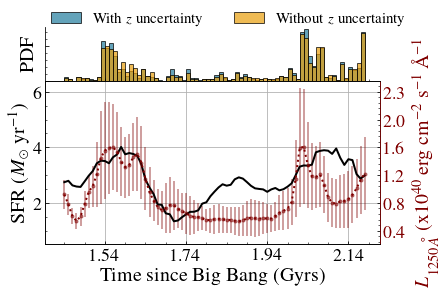

In [949]:
# OUTPUT and DIR
df100_yes   = pd.read_csv('Vandels_100best_offset.csv')
df100_no   = pd.read_csv('Vandels_100best_nooffset.csv')


allOut_100_yes = []
allOut_100_no = []

for i in range(100):
    allOut_100_yes.append(df100_yes[f'OutputAll{i}'].values)
    allOut_100_no.append(df100_no[f'OutputAll{i}'].values)

allOut_100_yes=np.asarray(allOut_100_yes).flatten()
allOut_100_no=np.asarray(allOut_100_no).flatten()

cb_colors = ["#739721", "#4C6085", "#886E44", "#E99F0C", "#FE6D73"]
fig, ax1 = plt.subplots(1,1, figsize= (6,4))
gs = GridSpec(8, 8)
ax_main = plt.subplot(gs[2:8, :8])
ax_xDist = plt.subplot(gs[0:2, :8],sharex=ax_main)

# hist2 = ax_xDist.hist([allOut_10,allOut_100], bins = range(90,165,3), density = True, alpha = 1, 
#                       label =['Single best-match spectra',
#                               '100 best-match spectra'],
#                       color =['#227C9D','#E99F0C'],
#                      edgecolor = 'k')
hist2 = ax_xDist.hist([allOut_100_yes], bins = range(89,165,1), density = True, alpha = 0.7, 
                      label ='With $z$ uncertainty',
                      color ='#227C9D',
                     edgecolor = 'k')
hist2 = ax_xDist.hist([allOut_100_no], bins = range(89,165,1), density = True, alpha = 0.7, 
                      label ='Without $z$ uncertainty',
                      color ='#E99F0C',
                     edgecolor = 'k')
# hist2 = ax_xDist.hist(allOut_no, bins = range(90,165,2), density = True, alpha = 1, label = '10 best - no z uncertainty', 
#                       color ='#227C9D',
#                      edgecolor = 'k')
allval = np.insert(hist2[0],len(hist2[0]),0)
# axs.scatter(range(90,165,1), fesc900M, label = 'Mean Fesc at 900A per output', c= 'k')
# ax_main.bar(range(90,165,2), allval/max(allval), alpha = 0.4,label = 'Hist of TS of best fits - no FS',
#           color = cFS)
ax_main.plot(np.arange(90,165, 1), SFR100, c ='k', label = 'SFR', lw = 2)
ax_main.set_xlabel('Time since Big Bang (Gyrs)', fontsize = 20)
ax_main.set_ylabel(r'SFR ($M_\odot$ yr$^{-1}$)', fontsize = 20)
ax_xDist.set_xticks([100,120,140, 160])
ax_xDist.set_xticklabels(['','','',''], size = 18)
ax_xDist.set_ylabel('PDF', fontsize = 20)
# ax_xDist.set_yticks([0,0.2])
ax_xDist.set_yticklabels(['',''])
ax_xDist.spines['right'].set_color('#800000')
ax_xDist.spines[['bottom','right', 'top']].set_visible(False)
ax_main.set_xticklabels(['1.54', '1.74', '1.94', '2.14'], size = 18)
# ax_xDist.set_xticklabels(['','','',''], size = 18)
plt.setp(ax_xDist.get_xticklabels(), visible=False)

# ax_xDist.set_ylabel('PDF', fon)
# ax_main.set_yticks([1.5,2,2.5,3,3.5,4], fontsize = 18)
ax_main.tick_params(axis='y', which='major', labelsize=18)

# ax_main.legend(fontsize = 13)

# ax_xDist.axis(False)
ax_xDist.legend(frameon = False, loc = (0.,0.9),ncol = 2)
# plt.setp(ax_xDist.get_xticklabels(), visible=False)
plt.subplots_adjust(wspace=0, hspace=0)
# ax_main.set_ylim(0.4, 4.2)


# ax_main.legend(frameon = False, fontsize = 20, ncol = 3, loc= (0,0.1))
dd = ax_main.get_yticks()

# print(np.percentile(xq, 84, axis = 1))
xq = abs(Lumi_sim)
xqm = gaussian_filter(np.median(xq, axis = 1), sigma = 1)
xqs16 = gaussian_filter(np.percentile(xq, 16, axis = 1), sigma = 1)
xqs16 = xqm-xqs16
xqs16 = ((xqs16)/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) # + np.min(SFR100)
# xqs84 = np.percentile(xq, 84, axis = 1)
xqs84 = gaussian_filter(np.percentile(xq, 84, axis = 1), sigma = 1)-xqm
xqs84 = ((xqs84)/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) # + np.min(SFR100)
xqm2 = xqm.copy()


xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
ax_main.plot(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 0), linestyle = ':', linewidth =2, 
             color = '#800000', label = r'$L(1250\AA)$')
ax_main.errorbar(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 0), yerr = (xqs84+xqs16)/2, 
                 fmt='.', c= '#800000', alpha = 0.5 )
# ax_main.fill_between(np.arange(90,165, 1), xqm+xqs84, 
#                      xqm-xqs16,
#                      alpha=0.1,
#              color = '#800000')
twin1 = ax_main.twinx()
def tick_function(X):
    V = (X - np.min(SFR100))/(np.max(SFR100) - np.min(SFR100)) *(np.max(xqm2) - np.min(xqm2))  + np.min(xqm2) 
    return ["%.1f" % (z/1e40) for z in V]

twin1.set_ylim(ax_main.get_ylim())
twin1.set_yticks([1,2,3,4,5,6])

twin1.set_yticklabels(tick_function([1,2,3,4,5,6]), size = 18, color = '#800000')

# twin1.set_ylim(0.4, 2.1)
# twin1.set_yticks([0.5, 4.5])
# twin1.set_yticklabels(['Small','Large'], fontsize = 20)
twin1.set_ylabel(r'$L_{1250\AA}$ (x10$^{40}$ erg cm$^{-2}$ s$^{-1}$ \AA$^{-1}$', fontsize = 20)
twin1.yaxis.label.set_color('#800000')
twin1.spines['right'].set_color('#800000')
ax_main.grid()
# plt.plot(np.median(Lumi_sim, axis = 1))


plt.savefig('Plots/SFR_histogram_comp.pdf', bbox_inches = 'tight')

In [ ]:
## fesc

In [985]:
nmock = 100
tuple_out_100_yes = np.zeros((nGal, nmocks))
tuple_dir_100_yes = np.zeros((nGal, nmocks))
tuple_out_100_no = np.zeros((nGal, nmocks))
tuple_dir_100_no = np.zeros((nGal, nmocks))


for i in range(nmocks):
    tuple_out_100_yes[:,i] = df100_yes[f'OutputAll{i}'].values
    tuple_dir_100_yes[:,i] = df100_yes[f'DirAll{i}'].values
    tuple_out_100_no[:,i] = df100_no[f'OutputAll{i}'].values
    tuple_dir_100_no[:,i] = df100_no[f'DirAll{i}'].values

    
fesc_first= np.zeros(nGal)#fesc900[df100['OutputAll0'].astype(int).values-90
fesc_mean_100_yes, fesc_med_100_yes, fesc_std_100_yes = np.zeros(nGal), np.zeros(nGal), np.zeros(nGal)
fesc_mean_100_no, fesc_med_100_no, fesc_std_100_no = np.zeros(nGal), np.zeros(nGal), np.zeros(nGal)

for i in range(nGal):
    fesc_first[i] = fesc900[df100['OutputAll0'][i]-90,df100['DirAll0'][i].astype(int)]
    fesc_mean_100_yes[i]=np.mean(fesc900[tuple_out_100_yes[i, :].astype(int)-90, tuple_dir_100_yes[i, :].astype(int)])
    fesc_med_100_yes[i]=np.median(fesc900[tuple_out_100_yes[i, :].astype(int)-90, tuple_dir_100_yes[i, :].astype(int)])
    fesc_std_100_yes[i]=np.std(fesc900[tuple_out_100_yes[i, :].astype(int)-90, tuple_dir_100_yes[i, :].astype(int)])
    fesc_mean_100_no[i]=np.mean(fesc900[tuple_out_100_no[i, :].astype(int)-90, tuple_dir_100_no[i, :].astype(int)])
    fesc_med_100_no[i]=np.median(fesc900[tuple_out_100_no[i, :].astype(int)-90, tuple_dir_100_no[i, :].astype(int)])
    fesc_std_100_no[i]=np.std(fesc900[tuple_out_100_no[i, :].astype(int)-90, tuple_dir_100_no[i, :].astype(int)])
# fesc_mean_100_no=np.insert(fesc_mean_100_no, -1, 0.1)

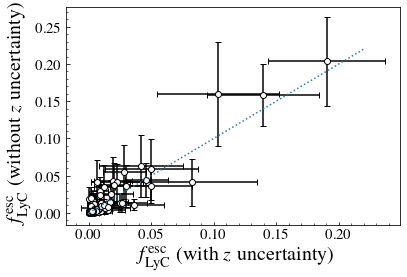

In [1020]:
fig, ax1 = plt.subplots(1,1, figsize= (6,4))

plt.errorbar(fesc_mean_100_yes,fesc_mean_100_no, yerr =fesc_std_100_no/2, xerr = fesc_std_100_yes/2,
             ls = 'None' , color = 'w', markeredgecolor = 'k',ecolor = 'k', capsize = 3, zorder =0)
plt.scatter(fesc_mean_100_yes,fesc_mean_100_no, c= 'w', edgecolors = 'k', zorder = 2)

plt.plot(np.linspace(0.00005, 0.22), np.linspace(0.00005, 0.22), c='#227C9D', ls = ':', zorder = 15)
plt.xlabel(r'$f_{\rm LyC}^{\rm esc}$ (with $z$ uncertainty)', fontsize = 20)
plt.ylabel(r'$f_{\rm LyC}^{\rm esc}$ (without $z$ uncertainty)', fontsize = 20)
plt.savefig('Plots/fesclyc_comp.pdf', bbox_inches = 'tight')
# plt.yscale('log')
# plt.xscale('log')

/tmp/ipykernel_6984/3199205062.py:48: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax1.set_xlim(0,1)


0.011188525534524613 0.02232422552195407
0.0 0.0


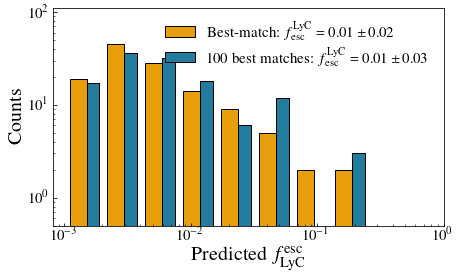

In [987]:
nmock = 100
tuple_out_100_yes = np.zeros((nGal, nmocks))
tuple_dir_100_yes = np.zeros((nGal, nmocks))
tuple_out_100_no = np.zeros((nGal, nmocks))
tuple_dir_100_no = np.zeros((nGal, nmocks))


for i in range(nmocks):
    tuple_out_100_yes[:,i] = df100_yes[f'OutputAll{i}'].values
    tuple_dir_100_yes[:,i] = df100_yes[f'DirAll{i}'].values
    tuple_out_100_no[:,i] = df100_no[f'OutputAll{i}'].values
    tuple_dir_100_no[:,i] = df100_no[f'DirAll{i}'].values

    
fesc_first= np.zeros(nGal)#fesc900[df100['OutputAll0'].astype(int).values-90
fesc_mean_100_yes, fesc_med_100_yes, fesc_std_100_yes = np.zeros(nGal), np.zeros(nGal), np.zeros(nGal)
fesc_mean_100_no, fesc_med_100_no, fesc_std_100_no = np.zeros(nGal), np.zeros(nGal), np.zeros(nGal)

for i in range(nGal):
    fesc_first[i] = fesc900[df100['OutputAll0'][i]-90,df100['DirAll0'][i].astype(int)]
    fesc_mean_100_yes[i]=np.mean(fesc900[tuple_out_100_yes[i, :].astype(int)-90, tuple_dir_100_yes[i, :].astype(int)])
    fesc_med_100_yes[i]=np.median(fesc900[tuple_out_100_yes[i, :].astype(int)-90, tuple_dir_100_yes[i, :].astype(int)])
    fesc_std_100_yes[i]=np.std(fesc900[tuple_out_100_yes[i, :].astype(int)-90, tuple_dir_100_yes[i, :].astype(int)])
    fesc_mean_100_no[i]=np.mean(fesc900[tuple_out_100_no[i, :].astype(int)-90, tuple_dir_100_no[i, :].astype(int)])
    fesc_med_100_no[i]=np.median(fesc900[tuple_out_100_no[i, :].astype(int)-90, tuple_dir_100_no[i, :].astype(int)])
    fesc_std_100_no[i]=np.std(fesc900[tuple_out_100_no[i, :].astype(int)-90, tuple_dir_100_no[i, :].astype(int)])
# fesc_mean_100_no=np.insert(fesc_mean_100_no, -1, 0.1)

bins = np.logspace(np.log10(0.001),np.log10(.5), 10)
fig, (ax1) = plt.subplots(1,1, figsize = (7,4))

counts, edges, bars =ax1.hist([fesc_mean_100_yes,
                               fesc_mean_100_no],
                               bins = bins,align='mid', 
                              alpha = 1, 
                              label = [r'Best-match: $f_{\rm esc}^{\rm LyC} = %.2f \pm %.2f$'%(np.mean(fesc_mean_100_yes), np.std(fesc_mean_100_yes)),
                             r'100 best matches: $f_{\rm esc}^{\rm LyC} = %.2f \pm %.2f$'%(np.mean(fesc_mean_100_no), np.std(fesc_mean_100_no))   ], 
                              edgecolor = 'k', color =['#E99F0C','#227C9D'], log=False, density = False )
ax1.set_xlabel(r'Predicted $f_{\rm LyC}^{\rm esc}$', fontsize = 20)
ax1.set_ylabel(r'Counts', fontsize = 20)
# ax1.bar_label(bars[0])
# ax1.bar_label(bars[1])
ax1.legend(frameon=False)
ax1.set_yscale('log')
ax1.set_xscale('log')
ax1.set_xlim(0,1)
ax1.set_ylim(0.5,110)
# ax1.grid(minor = True)
# ax2.errorbar(fesc_mean_10,fesc_mean_100, ls = 'None', marker = 'o', color = 'k')
# ax2.plot(np.linspace(0,0.45),np.linspace(0,0.45),'--k')
# # ax2.set_yscale = 
# # ax1.set_ylim(0,65)
# ax2.set_yscale('log')
# ax2.set_xscale('log')
# ax2.set_xlabel(r'$f_{\rm LyC}^{\rm esc}$ from no z uncertainty matches', fontsize = 20)
# ax2.set_ylabel(r'$f_{\rm LyC}^{\rm esc}$ from z uncertainty matches', fontsize = 20)
print(np.mean(fesc_mean_10), np.std(fesc_mean_10))
print(np.mean(fesc_mean_100), np.std(fesc_mean_100))
# plt.savefig('Plots/Escape_fractions.pdf', bbox_inches = 'tight')



[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
CDFS00519
CDFS00519 0.00596423605
CDFS00754 0.011003365481
CDFS01956 0.0433062161
CDFS02001 0.00682630038
CDFS10243 0.0029860828699999997
CDFS11590 0.130518008
CDFS13211 0.0052209700257369995
CDFS13359 0.008945408879999998
CDFS13734 0.009305868131
CDFS22660 0.001686244150410007
CDFS23174 0.001954191443000019
CDFS24753 0.057961607000000005
UDS002072 0.0195452505
UDS013664 0.0382971491
UDS378854 0.01085601984


/tmp/ipykernel_6984/1602610713.py:61: RuntimeWarning: divide by zero encountered in log10
  plt.plot(np.linspace(0,0.6), 10**(2.06473*np.log10(np.linspace(0,0.6))-0.08773), ls = ':', c= 'Firebrick',


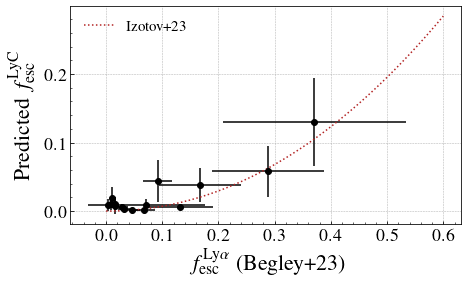

In [966]:
infolya = pd.read_csv('vandels-ancillary-data/rbegley_etal_2023.dat',delim_whitespace=True, comment="#", 
                   names = ['idx', 'ew_lya', 'ew_lya_err', 'fesc_lya', 'fesc_lya_err_l', 'fesc_lya_err_u'] )
# print( info[mask]['spectrum'].values)
# print(infolya[infolya['idx'] == info[mask]['spectrum'].values])
ewlya =[]
ewlya_err = []
fesclya =[]
fesclya_err =[]
fesclyc = []
fesclyc_err = []
valid = [string[:9] for string in info[mask]['spectrum'].values]
# print(valid)                    
# print(np.where(valid == 'CDFS00519'))
# print(valid.index('CDFS00519'))
print(fesc_mean_100)
for name in valid:
    if(name == 'CDFS00519'):
        print(name)
for i in range(len(infolya)):
#     print(infolya['idx'][i][3:12])
    if(infolya['idx'][i][3:12] in valid and infolya['idx'][i][3:12] != 'CDFS22958'):
        ewlya.append(infolya['ew_lya'][i])
        ewlya_err.append(infolya['ew_lya_err'][i])
        fesclya.append(infolya['fesc_lya'][i])
        fesclya_err.append(infolya['fesc_lya_err_l'][i])
        fesclyc.append(fesc_mean_100_no[valid.index(infolya['idx'][i][3:12])])
        fesclyc_err.append(fesc_std_100_no[valid.index(infolya['idx'][i][3:12])]/2)
        print(infolya['idx'][i][3:12],fesc_mean_100_no[valid.index(infolya['idx'][i][3:12])])
#         print(infolya['idx'][i][3:12], valid == infolya['idx'][i][3:12])

fig, (ax1) = plt.subplots(1,1, figsize = (7,4))

ax1.errorbar(fesclya, fesclyc, xerr = fesclya_err, yerr = np.asarray(fesclyc_err), marker = 'o',ls = 'None', color = 'k')
# ax1.axvline(np.min(np.log10(Mstar)), ls = ':', c= 'k', lw =2)
# ax1.axvline(np.max(np.log10(Mstar)), ls = ':',c='k', lw = 2)

# ax1.fill_betweenx([0,cur_ylim[1]], x1 = np.min(np.log10(Mstar)), x2 = np.max(np.log10(Mstar)),
#                   color='#E99F0C', alpha = 0.3)
ax1.set_xlabel(r'$f_{\rm esc}^{\rm Ly\alpha}$  (Begley+23)', fontsize = 22)
ax1.set_ylabel(r'Predicted $f_{\rm esc}^{\rm LyC}$', fontsize = 22, labelpad = 10)
# ax1.set_ylim(0,cur_ylim[1])
# ax1.set_xlim(5.8,10.4)
ax1.tick_params(axis='both', which='major', labelsize=18)
# ax1.set_xticks([6,7,8,9,10])
ax1.grid(linestyle = '--', linewidth = 0.5)

# ax2.errorbar(ewlya, fesclyc, xerr = ewlya_err, yerr = fesclyc_err, marker = 'o',ls = 'None', color = 'k')
# # ax1.axvline(np.min(np.log10(Mstar)), ls = ':', c= 'k', lw =2)
# # ax1.axvline(np.max(np.log10(Mstar)), ls = ':',c='k', lw = 2)

# # ax1.fill_betweenx([0,cur_ylim[1]], x1 = np.min(np.log10(Mstar)), x2 = np.max(np.log10(Mstar)),
# #                   color='#E99F0C', alpha = 0.3)
# ax2.set_xlabel(r'$f_{\rm esc}^{\rm Ly\alpha}$ (Begley+23)', fontsize = 22)
# ax2.set_ylabel(r'Predicted $f_{\rm esc}^{\rm LyC}$', fontsize = 22, labelpad = 10)
# # ax1.set_ylim(0,cur_ylim[1])
# # ax1.set_xlim(5.8,10.4)
# ax2.tick_params(axis='both', which='major', labelsize=18)
# # ax1.set_xticks([6,7,8,9,10])
# ax2.grid(linestyle = '--', linewidth = 0.5)
# log fesc(LyC) = 2.06473 × log fesc(Lyα) − 0.08773. 
plt.plot(np.linspace(0,0.6), 10**(2.06473*np.log10(np.linspace(0,0.6))-0.08773), ls = ':', c= 'Firebrick', 
         label = 'Izotov+23')
plt.subplots_adjust(wspace=0.25)
plt.legend(frameon=False, fontsize = 15)
# fig.savefig('Plots/LyaLyc.pdf', bbox_inches = 'tight')



## Compare SFR and stellar masses


In [178]:
nGal_sel = np.sum(mask2_sel)
print(nGal, chisall.shape[0])
stell_mass_best, stell_mass_std = np.zeros(nGal_sel), np.zeros(nGal_sel)
sfr_best, sfr_std = np.zeros(nGal_sel), np.zeros(nGal_sel)
true_i = 0
all_mass = []
dfFS   = np.genfromtxt('Vandels_allbest_offset.csv',delimiter = ',', skip_header=1)
chisall = dfFS.T
nthresh = 10
allOut = []
allOut_all=[]
ave_len =[]
for i in range(chisall.shape[0]):
    if mask2_sel[i] == False:
        continue

    bestChi = np.min(chisall[i])
    maxid = np.min([np.sum(chisall[i] <= 2),nthresh])
    sorted_idx = np.argpartition(chisall[i],nthresh)[:maxid]
    stell_mass_best[true_i] = np.median(Mstar[sorted_idx//300])
    stell_mass_std[true_i] = np.std(Mstar[sorted_idx//300])
    sfr_best[true_i] = np.median(SFR100[sorted_idx//300])
    sfr_std[true_i] = np.std(SFR100[sorted_idx//300])
    true_i+=1
    print(chisall[i][sorted_idx])
#     allOut_all.extend(sorted_idx//300+90)
    


131 131
[1.16954766 1.15985676 1.27751321 1.32140053 1.32390987 1.3231661
 1.32555262 1.33099523 1.34341882 1.35043905]
[1.25965107 1.25978744 1.25246237 1.23387203 1.28233363 1.28953621
 1.29109203 1.29385016 1.29930715 1.29488693]
[1.24082459 1.1850051  1.29502547 1.22479364 1.28829075 1.24255157
 1.29698483 1.24674473 1.29507333 1.32279275]
[0.9197516  0.90659557 0.69139322 0.89239639 0.81089308 0.88126185
 0.88977189 0.93620568 0.94138108 0.94214564]
[1.08356827 1.04124354 0.97469532 1.06743318 1.08488675 1.0504708
 1.08970224 1.09582844 1.09244565 1.09496022]
[0.43100468 0.30443905 0.39526302 0.42078751 0.43361784 0.44220648
 0.42820668 0.43321437 0.42653261 0.44482103]
[1.56724631 1.50353637 1.55587089 1.60251532 1.53354575 1.58075199
 1.36299419 1.38663146 1.61026343 1.63288673]
[0.68588579 0.72657632 0.73919747 0.71919396 0.73537098 0.63880342
 0.71694001 0.74090618 0.74387485 0.74750291]
[1.60176269 1.56203166 1.66592996 1.67570727 1.67773094 1.67157706
 1.67899115 1.69044492 

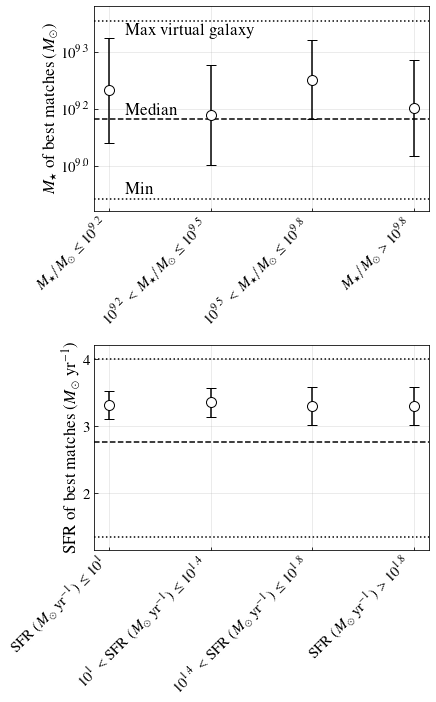

In [176]:
fig, (ax2, ax1) = plt.subplots(2,1, figsize = (6,10))

mask1 = info['lmass'][mask][mask2_sel]<9.2
mask3 = (9.2 <=info['lmass'][mask][mask2_sel]) & (info['lmass'][mask][mask2_sel]<9.5)
# mask4 = (9.4 <=info['lmass'][mask) & (info['lmass'][mask<9.6)
mask5 = (9.5 <=info['lmass'][mask][mask2_sel]) & (info['lmass'][mask][mask2_sel]<9.8)
# mask6 = (9.8 <=info['lmass'][mask]) & (info['lmass'][mask]<10.1)
mask7 = (9.8 <=info['lmass'][mask][mask2_sel]) 


ychi1 = [np.mean(stell_mass_best[mask1.values]),
         np.mean(stell_mass_best[mask3.values]),
         np.mean(stell_mass_best[mask5.values]),
         np.mean(stell_mass_best[mask7.values])]
ystd1 = [np.std(stell_mass_best[mask1.values]),
         np.std(stell_mass_best[mask3.values]),
        np.std(stell_mass_best[mask5.values]),
         np.std(stell_mass_best[mask7.values])]


ax2.errorbar(np.arange(len(ychi1)),np.asarray(ychi1)/1e9, yerr = np.asarray(ystd1)/1e9, marker = 'o', markeredgecolor ='k',color = 'w',
           markersize = 10, ls = 'None', ecolor = 'k',capsize = 5 )
# ax2.errorbar(np.arange(len(ychi2)),ychi2, yerr = np.asarray(ystd2)/2, marker = 's', markeredgecolor ='k',
#              color = 'w',
#            markersize = 10, ls = 'None', ecolor = 'k',capsize = 5, label = 'Best-match without a $z$ uncertainty')
# ax2.set_yscale('log')
np.min(np.log10(Mstar))
ax2.axhline(np.min(Mstar)/1e9, c= 'k', ls = ':', label = 'Max, Min')
ax2.text(0+0.15, np.max(Mstar)/1e9-0.12,r'Max virtual galaxy', fontsize = 17)
ax2.text(0+0.15, np.min(Mstar)/1e9+0.05,r'Min', fontsize = 17)
ax2.text(0+0.15, np.median(Mstar)/1e9+0.05,r'Median', fontsize = 17)
ax2.axhline(np.max(Mstar)/1e9, c= 'k', ls = ':')
ax2.axhline(np.median(Mstar)/1e9, c= 'k', ls = '--', label = 'Median (Virtual Galaxy)')

ax2.minorticks_off()
ax1.minorticks_off()
ax2.grid(alpha=0.3)
ax2.set_xticks([0,1,2,3])
ax1.set_xticks([0,1,2,3])
ax2.set_yticks([1,1.5,2])
ax2.set_yticklabels([r'10$^{9.0}$',r'10$^{%.1f}$'%np.log10(1.5e9),r'10$^{%.1f}$'%np.log10(2e9)])

ax2.set_ylabel(r'$M_\star$ of best matches ($M_\odot$)', fontsize = 17)
# ax2.legend(frameon = False, fontsize = 18, loc = (0,1), ncol = 2)
ax2.set_xticklabels([r'$M_\star/M_\odot \leq 10^{9.2}$',
                     r'$10^{9.2}$ $<$ $M_\star/M_\odot \leq 10^{9.5}$',
                     r'$10^{9.5}$ $<$ $M_\star/M_\odot\leq 10^{9.8}$',
                     r'$M_\star/M_\odot > 10^{9.8}$'],ha="right" ,rotation = 45, fontsize = 15)
ax2.set_ylim(0.6, 2.4)
ax2.tick_params(labelsize = 15)


mask1 = info['lsfr'][mask][mask2_sel]<1
mask3 = (1 <=info['lsfr'][mask][mask2_sel]) & (info['lsfr'][mask][mask2_sel]<1.4)
# mask4 = (9.4 <=info['lmass'][mask) & (info['lmass'][mask<9.6)
mask5 = (1.4 <=info['lsfr'][mask][mask2_sel]) & (info['lsfr'][mask][mask2_sel]<1.8)
# mask6 = (9.8 <=info['lmass'][mask]) & (info['lmass'][mask]<10.1)
mask7 = (1.8 <=info['lsfr'][mask][mask2_sel]) 

ychi1 = [np.mean(sfr_best[mask1.values]),
         np.mean(sfr_best[mask3.values]),
         np.mean(sfr_best[mask5.values]),
         np.mean(sfr_best[mask7.values])]
ystd1 = [np.std(sfr_best[mask1.values]),
         np.std(sfr_best[mask3.values]),
        np.std(sfr_best[mask5.values]),
         np.std(sfr_best[mask7.values])]
ax1.errorbar(np.arange(len(ychi1)),np.asarray(ychi1), yerr = np.asarray(ystd1), marker = 'o', markeredgecolor ='k',color = 'w',
           markersize = 10, ls = 'None', ecolor = 'k',capsize = 5 )
ax1.tick_params(labelsize = 15)
ax1.set_xticklabels([r'SFR ($M_\odot$ yr$^{-1}$) $\leq 10^{1}$',
                     r'$10^{1}$ $<$ SFR ($M_\odot$ yr$^{-1}$) $\leq 10^{1.4}$',
                     r'$10^{1.4}$ $<$ SFR ($M_\odot$ yr$^{-1}$) $\leq 10^{1.8}$',
                     r'SFR ($M_\odot$ yr$^{-1}$) $> 10^{1.8}$'],ha="right" ,rotation = 45, fontsize = 15)
ax1.set_ylabel(r'SFR of best matches ($M_\odot$ yr$^{-1}$) ', fontsize = 17)
ax1.axhline(np.min(SFR100), c= 'k', ls = ':', label = 'Max, Min ')
# ax2.text(0, 10**9.35,r'Max $M_\star$ of the virtual galaxy', fontsize = 17)
ax1.axhline(np.max(SFR100), c= 'k', ls = ':')
ax1.axhline(np.median(SFR100), c= 'k', ls = '--', label = 'Median ')
ax1.set_ylim(1.15, 4.22)
ax1.grid(alpha=0.3)
plt.subplots_adjust(hspace=0.65)
# plt.savefig('Plots/SFR_MstarComp.pdf', bbox_inches = 'tight')


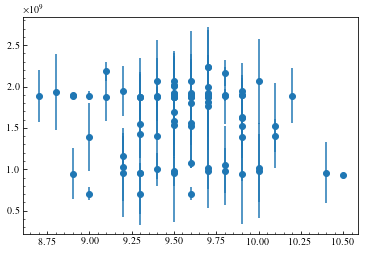

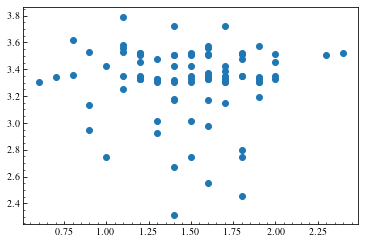

In [111]:
plt.errorbar(info['lmass'][mask][mask2_sel], stell_mass_best, yerr = stell_mass_std, ls = 'None', marker = 'o')
plt.figure()
plt.scatter(info['lsfr'][mask][mask2_sel],sfr_best)
# plt.xscale('log')
# plt.yscale('log')

## Plot histogram best ouput

### 100 and single best match

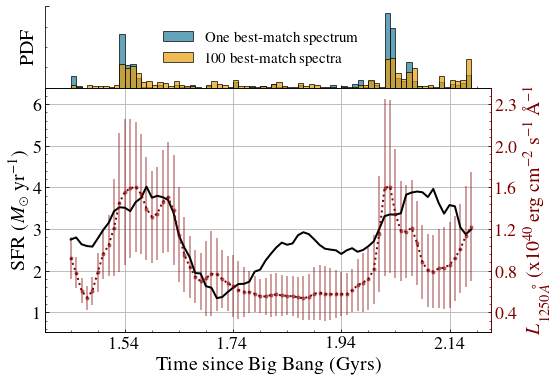

In [88]:
# OUTPUT and DIR
df100   = pd.read_csv('Vandels_100best_offset.csv')
allOut_sing = df100['OutputAll0'].values
allOut_10 =  [df100['OutputAll0'].values]
allOut_100 = []

for i in range(2):
    allOut_10.append(df100[f'OutputAll{i}'].values)
allOut_10=np.asarray(allOut_10).flatten()

for i in range(100):
    allOut_100.append(df100[f'OutputAll{i}'].values)
allOut_100=np.asarray(allOut_100).flatten()


cb_colors = ["#739721", "#4C6085", "#886E44", "#E99F0C", "#FE6D73"]
fig, ax1 = plt.subplots(1,1, figsize= (8,6))
gs = GridSpec(8, 8)
ax_main = plt.subplot(gs[2:8, :8])
ax_xDist = plt.subplot(gs[0:2, :8],sharex=ax_main)

# hist2 = ax_xDist.hist([allOut_10,allOut_100], bins = range(90,165,3), density = True, alpha = 1, 
#                       label =['Single best-match spectra',
#                               '100 best-match spectra'],
#                       color =['#227C9D','#E99F0C'],
#                      edgecolor = 'k')
hist2 = ax_xDist.hist([allOut_10], bins = range(89,165,1), density = True, alpha = 0.7, 
                      label ='One best-match spectrum',
                      color ='#227C9D',
                     edgecolor = 'k')
hist2 = ax_xDist.hist([allOut_100], bins = range(89,165,1), density = True, alpha = 0.7, 
                      label ='100 best-match spectra',
                      color ='#E99F0C',
                     edgecolor = 'k')
# hist2 = ax_xDist.hist(allOut_no, bins = range(90,165,2), density = True, alpha = 1, label = '10 best - no z uncertainty', 
#                       color ='#227C9D',
#                      edgecolor = 'k')
allval = np.insert(hist2[0],len(hist2[0]),0)
# axs.scatter(range(90,165,1), fesc900M, label = 'Mean Fesc at 900A per output', c= 'k')
# ax_main.bar(range(90,165,2), allval/max(allval), alpha = 0.4,label = 'Hist of TS of best fits - no FS',
#           color = cFS)
ax_main.plot(np.arange(90,165, 1), SFR100, c ='k', label = 'SFR', lw = 2)
ax_main.set_xlabel('Time since Big Bang (Gyrs)', fontsize = 20)
ax_main.set_ylabel(r'SFR ($M_\odot$ yr$^{-1}$)', fontsize = 20)
ax_xDist.set_xticks([100,120,140, 160])
ax_xDist.set_xticklabels(['','','',''], size = 18)
ax_xDist.set_ylabel('PDF', fontsize = 20)
ax_xDist.set_yticks([0,0.2])
ax_xDist.set_yticklabels(['',''])
ax_xDist.spines['right'].set_color('#800000')
ax_xDist.spines[['bottom','right', 'top']].set_visible(False)
ax_main.set_xticklabels(['1.54', '1.74', '1.94', '2.14'], size = 18)
# ax_xDist.set_xticklabels(['','','',''], size = 18)
plt.setp(ax_xDist.get_xticklabels(), visible=False)

# ax_xDist.set_ylabel('PDF', fon)
# ax_main.set_yticks([1.5,2,2.5,3,3.5,4], fontsize = 18)
ax_main.tick_params(axis='y', which='major', labelsize=18)

# ax_main.legend(fontsize = 13)

# ax_xDist.axis(False)
ax_xDist.legend(frameon = False, loc = (0.25,0.2))
# plt.setp(ax_xDist.get_xticklabels(), visible=False)
plt.subplots_adjust(wspace=0, hspace=0)
# ax_main.set_ylim(0.4, 4.2)


# ax_main.legend(frameon = False, fontsize = 20, ncol = 3, loc= (0,0.1))
dd = ax_main.get_yticks()

# print(np.percentile(xq, 84, axis = 1))
xq = abs(Lumi_sim)
xqm = gaussian_filter(np.median(xq, axis = 1), sigma = 1)
xqs16 = gaussian_filter(np.percentile(xq, 16, axis = 1), sigma = 1)
xqs16 = xqm-xqs16
xqs16 = ((xqs16)/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) # + np.min(SFR100)
# xqs84 = np.percentile(xq, 84, axis = 1)
xqs84 = gaussian_filter(np.percentile(xq, 84, axis = 1), sigma = 1)-xqm
xqs84 = ((xqs84)/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) # + np.min(SFR100)
xqm2 = xqm.copy()


xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
ax_main.plot(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 0), linestyle = ':', linewidth =2, 
             color = '#800000', label = r'$L(1250\AA)$')
ax_main.errorbar(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 0), yerr = (xqs84+xqs16)/2, 
                 fmt='.', c= '#800000', alpha = 0.5 )
# ax_main.fill_between(np.arange(90,165, 1), xqm+xqs84, 
#                      xqm-xqs16,
#                      alpha=0.1,
#              color = '#800000')
twin1 = ax_main.twinx()
def tick_function(X):
    V = (X - np.min(SFR100))/(np.max(SFR100) - np.min(SFR100)) *(np.max(xqm2) - np.min(xqm2))  + np.min(xqm2) 
    return ["%.1f" % (z/1e40) for z in V]

twin1.set_ylim(ax_main.get_ylim())
twin1.set_yticks([1,2,3,4,5,6])

twin1.set_yticklabels(tick_function([1,2,3,4,5,6]), size = 18, color = '#800000')

# twin1.set_ylim(0.4, 2.1)
# twin1.set_yticks([0.5, 4.5])
# twin1.set_yticklabels(['Small','Large'], fontsize = 20)
twin1.set_ylabel(r'$L_{1250\AA}$ (x10$^{40}$ erg cm$^{-2}$ s$^{-1}$ \AA$^{-1}$', fontsize = 20)
twin1.yaxis.label.set_color('#800000')
twin1.spines['right'].set_color('#800000')
ax_main.grid()
# plt.plot(np.median(Lumi_sim, axis = 1))


# plt.savefig('Plots/SFR_histogram_100best.pdf', bbox_inches = 'tight')

### Selected best fits

(131, 22500)
58 85
0.1814179629503021 0.14365202762321322
Number 148 appears 270 times.
Number 100 appears 126 times.
Number 102 appears 75 times.
Number 99 appears 214 times.
Number 158 appears 74 times.
Number 152 appears 129 times.
Number 163 appears 85 times.
Number 164 appears 110 times.
Number 101 appears 138 times.
Number 149 appears 291 times.
Number 103 appears 37 times.
Number 127 appears 28 times.
Number 138 appears 7 times.
Number 125 appears 7 times.
Number 118 appears 13 times.
Number 116 appears 45 times.
Number 135 appears 9 times.
Number 121 appears 11 times.
Number 137 appears 3 times.
Number 126 appears 8 times.
Number 117 appears 13 times.
Number 161 appears 45 times.
Number 120 appears 53 times.
Number 140 appears 8 times.
Number 132 appears 24 times.
Number 144 appears 13 times.
Number 160 appears 55 times.
Number 119 appears 1 times.
Number 124 appears 3 times.
Number 155 appears 4 times.
Number 133 appears 11 times.
Number 153 appears 144 times.
Number 162 appea

/tmp/ipykernel_22229/2029452931.py:83: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_xDist.set_yticklabels(['',''])


NameError: name 'M_obs_sim' is not defined

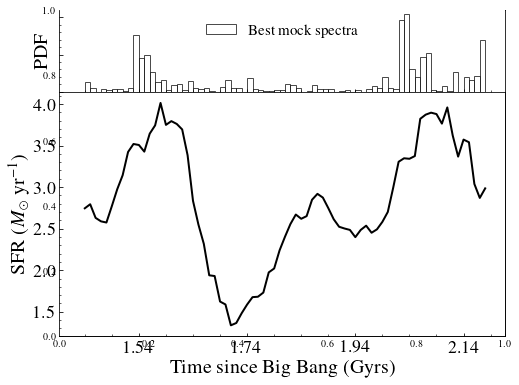

In [204]:
# OUTPUT and DIR
dfFS   = np.genfromtxt('Vandels_allbest_offset.csv',delimiter = ',', skip_header=1)
chisall = dfFS.T
nthresh = 30
print(chisall.shape)
allOut = []
allOut_all=[]
ave_len =[]
# print(np.where(SFR100>3.3)[0]+90)

bestissfr = 0
all_gal_in_sfr = 0
from collections import Counter

for i in range(chisall.shape[0]):
    if mask2_sel[i] == False:
        continue
#     best = chisall[i][chisall[i] <= 2]
#     print(len(best))
#     print(np.argmin(chisall[i]))
    bestChi = np.min(chisall[i])
    if(np.argmin(chisall[i])//300+90 in [148, 149, 99, 100,101] ):
        bestissfr+=1
#     print(np.sum(chisall[i] <= 2))
    maxid = np.min([np.sum(chisall[i] <= 2),nthresh])
        
    sorted_idx = np.argpartition(chisall[i],nthresh)[:maxid]
    allOut.append(np.argmin(chisall[i])//300+90)
#     t = (chisall[i]<=2) & (chisall[i]<bestChi+0.15)
#     best = [i//300 + 90 for i, x in enumerate(t) if x]
#     ave_len.append(len(best))
#     print(len(best))
#     print(best)
    ave_len.append(np.max(chisall[i][sorted_idx[:nthresh]])-np.min(chisall[i][sorted_idx[:nthresh]]))
    if(any(i in np.asarray(sorted_idx//300+90) for i in [99, 149])):
        all_gal_in_sfr+=1
    allOut_all.extend(sorted_idx//300+90)
#     allOut_all.extend(best)
print(bestissfr, all_gal_in_sfr)
print(np.median(ave_len), np.std(ave_len))
# print(np.mean(ave_len))
# plt.hist(allOut,  bins = range(90,165,3), density=True)
# plt.hist(np.asarray(allOut_all).flatten(),  bins = range(89,166,1), density=True)
number_counts = Counter(allOut_all)

# Print the result
for number, count in number_counts.items():
    print(f"Number {number} appears {count} times.")

cb_colors = ["#739721", "#4C6085", "#886E44", "#E99F0C", "#FE6D73"]
fig, ax1 = plt.subplots(1,1, figsize= (8,6))
gs = GridSpec(8, 8)
ax_main = plt.subplot(gs[2:8, :8])
ax_xDist = plt.subplot(gs[0:2, :8],sharex=ax_main)

# hist2 = ax_xDist.hist([allOut_10,allOut_100], bins = range(90,165,3), density = True, alpha = 1, 
#                       label =['Single best-match spectra',
#                               '100 best-match spectra'],
#                       color =['#227C9D','#E99F0C'],
#                      edgecolor = 'k')
# hist2 = ax_xDist.hist([allOut], bins = range(89,165,1), density = True, alpha = 0.7, 
#                       label =r'$\tilde{\chi}^2 = \tilde{\chi}^2_{\rm min}$ ',
#                       color ='k',
#                      edgecolor = 'k')
hist2 = ax_xDist.hist([allOut_all], bins = range(89,165,1), density = True, alpha = 0.7, 
                      label =r'Best mock spectra',
                      color ='w',
                     edgecolor = 'k')
# hist2 = ax_xDist.hist(allOut_no, bins = range(90,165,2), density = True, alpha = 1, label = '10 best - no z uncertainty', 
#                       color ='#227C9D',
#                      edgecolor = 'k')
allval = np.insert(hist2[0],len(hist2[0]),0)
# axs.scatter(range(90,165,1), fesc900M, label = 'Mean Fesc at 900A per output', c= 'k')
# ax_main.bar(range(90,165,2), allval/max(allval), alpha = 0.4,label = 'Hist of TS of best fits - no FS',
#           color = cFS)
ax_main.plot(np.arange(90,165, 1), SFR100, c ='k', label = 'SFR', lw = 2)
ax_main.set_xlabel('Time since Big Bang (Gyrs)', fontsize = 20)
ax_main.set_ylabel(r'SFR ($M_\odot$ yr$^{-1}$)', fontsize = 20)
ax_xDist.set_xticks([100,120,140, 160])
ax_xDist.set_xticklabels(['','','',''], size = 18)
ax_xDist.set_ylabel('PDF', fontsize = 20)
# ax_xDist.set_yticks([0,0.2])
ax_xDist.set_yticklabels(['',''])
ax_xDist.spines['right'].set_color('#800000')
ax_xDist.spines[['bottom','right', 'top']].set_visible(False)
ax_main.set_xticklabels(['1.54', '1.74', '1.94', '2.14'], size = 18)
# ax_xDist.set_xticklabels(['','','',''], size = 18)
plt.setp(ax_xDist.get_xticklabels(), visible=False)

# ax_xDist.set_ylabel('PDF', fon)
# ax_main.set_yticks([1.5,2,2.5,3,3.5,4], fontsize = 18)
ax_main.tick_params(axis='y', which='major', labelsize=18)

# ax_main.legend(fontsize = 13)

# ax_xDist.axis(False)
ax_xDist.legend(frameon = False, fontsize = 15)
# plt.setp(ax_xDist.get_xticklabels(), visible=False)
plt.subplots_adjust(wspace=0, hspace=0)
# ax_main.set_ylim(0.4, 4.2)


# ax_main.legend(frameon = False, fontsize = 20, ncol = 3, loc= (0,0.1))
dd = ax_main.get_yticks()

# print(np.percentile(xq, 84, axis = 1))
xq = abs(M_obs_sim)
xqm = gaussian_filter(np.median(xq, axis = 1), sigma = 1)
xqs16 = gaussian_filter(np.percentile(xq, 16, axis = 1), sigma = 1)
xqs16 = xqm-xqs16
xqs16 = ((xqs16)/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) # + np.min(SFR100)
# xqs84 = np.percentile(xq, 84, axis = 1)
xqs84 = gaussian_filter(np.percentile(xq, 84, axis = 1), sigma = 1)-xqm
xqs84 = ((xqs84)/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) # + np.min(SFR100)
xqm2 = xqm.copy()


xqm = ((xqm - np.min(xqm))/(np.max(xqm) - np.min(xqm)))*(np.max(SFR100) - np.min(SFR100)) + np.min(SFR100)
ax_main.plot(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 0), linestyle = ':', linewidth =2, 
             color = '#800000', label = r'$L(1250\AA)$')
ax_main.errorbar(np.arange(90,165, 1), gaussian_filter(xqm, sigma = 0), yerr = (xqs84+xqs16)/2, 
                 fmt='.', c= '#800000', alpha = 0.5 )
# ax_main.fill_between(np.arange(90,165, 1), xqm+xqs84, 
#                      xqm-xqs16,
#                      alpha=0.1,
#              color = '#800000')
twin1 = ax_main.twinx()
def tick_function(X):
    V = (X - np.min(SFR100))/(np.max(SFR100) - np.min(SFR100)) *(np.max(xqm2) - np.min(xqm2))  + np.min(xqm2) 
    return [r"$-$%.1f" % (z) for z in V]

twin1.set_ylim(ax_main.get_ylim())
ticktick= [1.1,2.3,3.5,4.7]
twin1.set_yticks(ticktick)

twin1.set_yticklabels(tick_function(ticktick), size = 18, color = '#800000')

# twin1.set_ylim(0.4, 2.1)
# twin1.set_yticks([0.5, 4.5])
# twin1.set_yticklabels(['Small','Large'], fontsize = 20)
twin1.set_ylabel(r'$\rm M_{\rm 1250\AA}\ (mag)$', fontsize = 20)
twin1.yaxis.label.set_color('#800000')
twin1.spines['right'].set_color('#800000')
ax_main.grid()
# plt.plot(np.median(Lumi_sim, axis = 1))


# plt.savefig('Plots/SFR_histogram_allbest.pdf', bbox_inches = 'tight')

(131, 22500)
0.1814179629503021 0.14365202762321322


/tmp/ipykernel_103016/3400872825.py:69: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_xDist.set_yticklabels(['',''])


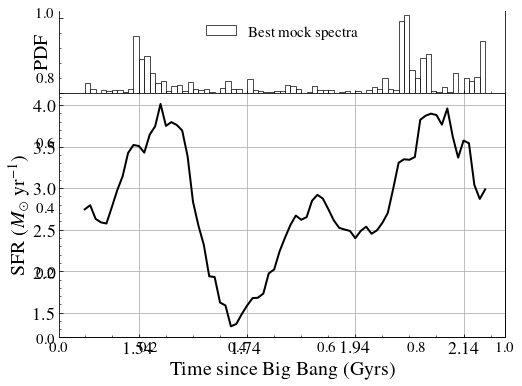

In [38]:
# OUTPUT and DIR
dfFS   = np.genfromtxt('Vandels_allbest_offset.csv',delimiter = ',', skip_header=1)
chisall = dfFS.T
nthresh = 30
print(chisall.shape)
allOut = []
allOut_all=[]
ave_len =[]
for i in range(chisall.shape[0]):
    if mask2_sel[i] == False:
        continue
#     best = chisall[i][chisall[i] <= 2]
#     print(len(best))
#     print(np.argmin(chisall[i]))
    bestChi = np.min(chisall[i])
#     print(np.sum(chisall[i] <= 2))
    maxid = np.min([np.sum(chisall[i] <= 2),nthresh])
        
    sorted_idx = np.argpartition(chisall[i],nthresh)[:maxid]
    allOut.append(np.argmin(chisall[i])//300+90)
#     t = (chisall[i]<=2) & (chisall[i]<bestChi+0.15)
#     best = [i//300 + 90 for i, x in enumerate(t) if x]
#     ave_len.append(len(best))
#     print(len(best))
#     print(best)
    ave_len.append(np.max(chisall[i][sorted_idx[:nthresh]])-np.min(chisall[i][sorted_idx[:nthresh]]))
    allOut_all.extend(sorted_idx//300+90)
#     allOut_all.extend(best)
  
print(np.median(ave_len), np.std(ave_len))
# print(np.mean(ave_len))
# plt.hist(allOut,  bins = range(90,165,3), density=True)
# plt.hist(np.asarray(allOut_all).flatten(),  bins = range(89,166,1), density=True)


cb_colors = ["#739721", "#4C6085", "#886E44", "#E99F0C", "#FE6D73"]
fig, ax1 = plt.subplots(1,1, figsize= (8,6))
gs = GridSpec(8, 8)
ax_main = plt.subplot(gs[2:8, :8])
ax_xDist = plt.subplot(gs[0:2, :8],sharex=ax_main)

# hist2 = ax_xDist.hist([allOut_10,allOut_100], bins = range(90,165,3), density = True, alpha = 1, 
#                       label =['Single best-match spectra',
#                               '100 best-match spectra'],
#                       color =['#227C9D','#E99F0C'],
#                      edgecolor = 'k')
# hist2 = ax_xDist.hist([allOut], bins = range(89,165,1), density = True, alpha = 0.7, 
#                       label =r'$\tilde{\chi}^2 = \tilde{\chi}^2_{\rm min}$ ',
#                       color ='k',
#                      edgecolor = 'k')
hist2 = ax_xDist.hist([allOut_all], bins = range(89,165,1), density = True, alpha = 0.7, 
                      label =r'Best mock spectra',
                      color ='w',
                     edgecolor = 'k')
# hist2 = ax_xDist.hist(allOut_no, bins = range(90,165,2), density = True, alpha = 1, label = '10 best - no z uncertainty', 
#                       color ='#227C9D',
#                      edgecolor = 'k')
allval = np.insert(hist2[0],len(hist2[0]),0)
# axs.scatter(range(90,165,1), fesc900M, label = 'Mean Fesc at 900A per output', c= 'k')
# ax_main.bar(range(90,165,2), allval/max(allval), alpha = 0.4,label = 'Hist of TS of best fits - no FS',
#           color = cFS)
ax_main.plot(np.arange(90,165, 1), SFR100, c ='k', label = 'SFR', lw = 2)
ax_main.set_xlabel('Time since Big Bang (Gyrs)', fontsize = 20)
ax_main.set_ylabel(r'SFR ($M_\odot$ yr$^{-1}$)', fontsize = 20)
ax_xDist.set_xticks([100,120,140, 160])
ax_xDist.set_xticklabels(['','','',''], size = 18)
ax_xDist.set_ylabel('PDF', fontsize = 20)
# ax_xDist.set_yticks([0,0.2])
ax_xDist.set_yticklabels(['',''])
ax_xDist.spines['right'].set_color('#800000')
ax_xDist.spines[['bottom','right', 'top']].set_visible(False)
ax_main.set_xticklabels(['1.54', '1.74', '1.94', '2.14'], size = 18)
# ax_xDist.set_xticklabels(['','','',''], size = 18)
plt.setp(ax_xDist.get_xticklabels(), visible=False)

# ax_xDist.set_ylabel('PDF', fon)
# ax_main.set_yticks([1.5,2,2.5,3,3.5,4], fontsize = 18)
ax_main.tick_params(axis='y', which='major', labelsize=18)

# ax_main.legend(fontsize = 13)

# ax_xDist.axis(False)
ax_xDist.legend(frameon = False, fontsize = 15)
# plt.setp(ax_xDist.get_xticklabels(), visible=False)
plt.subplots_adjust(wspace=0, hspace=0)
# ax_main.set_ylim(0.4, 4.2)
ax_main.grid()

# plt.savefig('Plots/SFR_histogram_allbest.pdf', bbox_inches = 'tight')

In [23]:
def most_common(lst):
    return max(set(lst), key=lst.count)
print(most_common(allOut_all))

149


#### Plot spectra in best time and worst time

In [ ]:
stack_siIIgood = []
# stack_siIIbad = []
allbestidx = []
visited = np.zeros(22500)

for i in range(chisall.shape[0]):
    if mask2_sel[i] == False:
        continue
    sorted_idx = np.argpartition(chisall[i],50)[:50]
    allbestidx.extend(sorted_idx)
    
plt.hist(np.unique(allbestidx))
# print(allbestidx)
copy = np.asarray(allbestidx)==17461
print(np.sum(copy))
for j in np.unique(allbestidx):
    if(np.sum(np.asarray(allbestidx) == j) > 10):
        bestDir         = j%300
        bestOut         = j//300+90

        lcII, fluxcII   = read_spectrum_c(path_to_data,  bestOut )
        lsiII, fluxsiII = read_spectrum_si(path_to_data, bestOut )

                ## CII Plot
        lcII_systemic  = lcII + np.dot(directions[bestDir,:], v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lcII) 
        lcII_systemic  = lcII_systemic[1:]
        vcII_s         = (lcII_systemic/wcII1334 -1)*c
        sigma_pixelcii = 0
        modelcii       = gaussian_filter(fluxcII[bestDir,1:], sigma = sigma_pixelcii)

            ## Si II plot
        lsiII_systemic = lsiII + np.dot(directions[bestDir,:],v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lsiII) 
        lsiII_systemic = lsiII_systemic[1:]
        vsiII_s        = (lsiII_systemic/wsiII1260 -1)*c
        sigma_pixelsi  =  0
        modelsi      = gaussian_filter(fluxsiII[bestDir,1:], sigma = sigma_pixelsi)
        rmedSiII = ((vsiII_s<-1000) |  (vsiII_s > 1700) )
        fmedSiII = np.nanmedian(modelsi[rmedSiII])
        modelsi /= fmedSiII

        rmedCII = ((vcII_s<-1000) | (vcII_s>1000))
        fmedCII = np.nanmedian(modelcii[rmedCII])
        modelcii /= fmedCII

        stack_siIIgood.append(modelsi)
#         visited[sorted_idx[j]] =1


In [520]:
stack_siIIbad = []
stack_siIIgood = []
stack_cIIbad = []
stack_cIIgood = []
for out in range(120, 125):
    for k in range(300):
#         if(k+out*k in allbestidx):
#             continue
        bestDir         = k
        bestOut         = out

        lcII, fluxcII   = read_spectrum_c(path_to_data,  bestOut )
        lsiII, fluxsiII = read_spectrum_si(path_to_data, bestOut )

                ## CII Plot
        lcII_systemic  = lcII + np.dot(directions[bestDir,:], v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lcII) 
        lcII_systemic  = lcII_systemic[1:]
        vcII_s         = (lcII_systemic/wcII1334 -1)*c
        sigma_pixelcii = 0
        modelcii       = fluxcII[bestDir,1:]

            ## Si II plot
        lsiII_systemic = lsiII + np.dot(directions[bestDir,:],v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lsiII) 
        lsiII_systemic = lsiII_systemic[1:]
        vsiII_s        = (lsiII_systemic/wsiII1260 -1)*c
        sigma_pixelsi  =  0
        modelsi      = fluxsiII[bestDir,1:]
        rmedSiII = ((vsiII_s<-1000) |  (vsiII_s > 1700) )
        fmedSiII = np.nanmedian(modelsi[rmedSiII])
        modelsi /= fmedSiII

        rmedCII = ((vcII_s<-1000) | (vcII_s>1000))
        fmedCII = np.nanmedian(modelcii[rmedCII])
        modelcii /= fmedCII

        stack_siIIbad.append(modelsi)
        stack_cIIbad.append(modelcii)

#         visited[sorted_idx[j]] =1

for out in range(146, 150):
    for k in range(300):
        bestDir         = k
        bestOut         = out

        lcII, fluxcII   = read_spectrum_c(path_to_data,  bestOut )
        lsiII, fluxsiII = read_spectrum_si(path_to_data, bestOut )

                ## CII Plot
        lcII_systemic  = lcII + np.dot(directions[bestDir,:], v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lcII) 
        lcII_systemic  = lcII_systemic[1:]
        vcII_s         = (lcII_systemic/wcII1334 -1)*c
        sigma_pixelcii = 0
        modelcii       = fluxcII[bestDir,1:]

            ## Si II plot
        lsiII_systemic = lsiII + np.dot(directions[bestDir,:],v_cm[:,bestOut-90])/c_cgs*1e5*np.mean(lsiII) 
        lsiII_systemic = lsiII_systemic[1:]
        vsiII_s        = (lsiII_systemic/wsiII1260 -1)*c
        sigma_pixelsi  =  0
        modelsi      = fluxsiII[bestDir,1:]
        rmedSiII = ((vsiII_s<-1000) |  (vsiII_s > 1700) )
        fmedSiII = np.nanmedian(modelsi[rmedSiII])
        modelsi /= fmedSiII

        rmedCII = ((vcII_s<-1000) | (vcII_s>1000))
        fmedCII = np.nanmedian(modelcii[rmedCII])
        modelcii /= fmedCII

        stack_siIIgood.append(modelsi)
        stack_cIIgood.append(modelcii)

In [515]:
print(len(stack_siIIbad))
print(len(stack_siIIgood))

1450
66


In [ ]:
plt.figure(figsize = (7,4))
plt.plot(lsiII_systemic, np.mean(stack_siIIgood, axis = 0))
plt.plot(lsiII_systemic, np.mean(stack_siIIbad, axis = 0))

plt.axvline(wsiII1260)

plt.figure(figsize = (7,4))
plt.plot(lcII_systemic, np.mean(stack_cIIgood, axis = 0))
plt.plot(lcII_systemic, np.mean(stack_cIIbad, axis = 0))
plt.axvline(wcII1334)



## Escape fractions

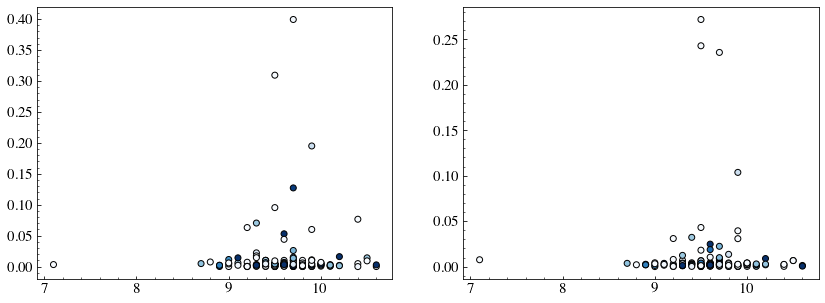

In [349]:
fig, (ax0, ax1) = plt.subplots(1,2,figsize =(14,5) )
ax0.scatter(info[info['snr_per_pix']>5]['lmass'], fesc900[outall[:,0].astype(int)-90,dirall[:,0].astype(int)], 
            c = Chi2all[:,0], vmin = 1, vmax = 3, cmap = 'Blues', edgecolor = 'k')

fesc_med = []
for i in range(len(outall[:,0])):
    fesc_med.append(np.median(fesc900[outall[i, :10].astype(int)-90, dirall[i, :10].astype(int)]))
    
fesc_mean = []
for i in range(len(outall[:,0])):
    fesc_mean.append(np.mean(fesc900[outall[i, :10].astype(int)-90, dirall[i, :10].astype(int)]))
#     print(np.median(Mstar[outall[i, 10*i:10*(i+1)].astype(int)-90]))
ax1.scatter(info[info['snr_per_pix']>5]['lmass'], fesc_med, 
            c = Chi2all[:,0], vmin = 1, vmax = 3, cmap = 'Blues', edgecolor = 'k')

0.011096314393129773 0.0025485 0.03836347329936639
0.015475691983282445 0.0035973 0.049052608470589475
0.013908072918731177 0.00375814979737 0.034773679642192676


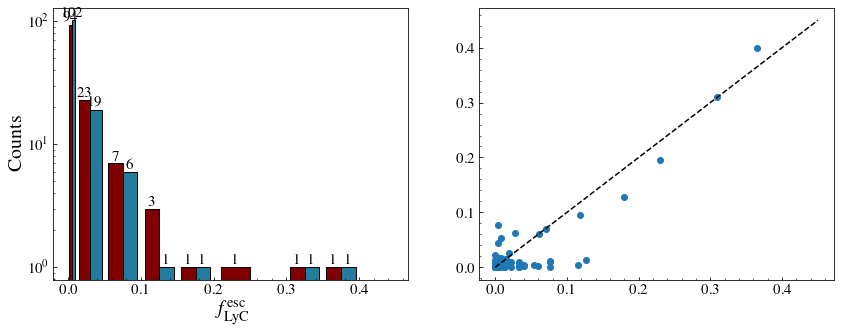

In [693]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize = (14,5))
counts, edges, bars =ax1.hist([fesc900[dfno['OutputAll0'].astype(int).values-90,dfno['DirAll0'].astype(int)],
                               fesc900[dfyes['OutputAll0'].astype(int).values-90,dfyes['DirAll0'].astype(int)]],
                               bins = [0.00,0.01,0.05,0.1,0.15,0.2,0.3,0.35,0.4,0.45],align='mid', 
                              alpha = 1, label = 'VANDELS', 
                              edgecolor = 'k', color =['#800000','#227C9D'], log=True )
ax1.set_xlabel(r'$f_{\rm LyC}^{\rm esc}$', fontsize = 20)
ax1.set_ylabel(r'Counts', fontsize = 20)
ax1.bar_label(bars[0])
ax1.bar_label(bars[1])

ax2.scatter(fesc900[dfno['OutputAll0'].astype(int).values-90,dfno['DirAll0'].astype(int)],
                               fesc900[dfyes['OutputAll0'].astype(int).values-90,dfyes['DirAll0'].astype(int)])
ax2.plot(np.linspace(0,0.45),np.linspace(0,0.45),'--k')
# ax1.set_ylim(0,65)
# ax1.set_yscale('log')
# ax1.set_xscale('log')
# ax
print(np.mean(fesc_med),np.median(fesc_med), np.std(fesc_med))
fesc_one = fesc900[outall[:,0].astype(int)-90,dirall[:,0].astype(int)]
print(np.mean(fesc_one),np.median(fesc_one), np.std(fesc_one))
# plt.hist( fesc900[outall[:,0].astype(int)-90,dirall[:,0].astype(int)])

print(np.mean(fesc_mean),np.median(fesc_mean), np.std(fesc_mean))


### 1000 best

In [113]:
df100   = pd.read_csv('Vandels_100best_offset.csv')
tuple_out_100 = np.zeros((nGal, 100))
tuple_dir_100 = np.zeros((nGal, 100))
tuple_out_10 = np.zeros((nGal, 10))
tuple_dir_10 = np.zeros((nGal, 10))
tuple_out_50 = np.zeros((nGal, 50))
tuple_dir_50 = np.zeros((nGal, 50))
nmocks = 100
for i in range(nmocks):
    tuple_out_100[:,i] = df100[f'OutputAll{i}'].values
    tuple_dir_100[:,i] = df100[f'DirAll{i}'].values

for i in range(10):
    tuple_out_10[:,i] = df100[f'OutputAll{i}'].values
    tuple_dir_10[:,i] = df100[f'DirAll{i}'].values
    
for i in range(50):
    tuple_out_50[:,i] = df100[f'OutputAll{i}'].values
    tuple_dir_50[:,i] = df100[f'DirAll{i}'].values
    
    
fesc_first= np.zeros(nGal)#fesc900[df100['OutputAll0'].astype(int).values-90
fesc_mean_100, fesc_med_100, fesc_std_100 = np.zeros(nGal), np.zeros(nGal), np.zeros(nGal)
fesc_mean_10, fesc_med_10, fesc_std_10 = np.zeros(nGal), np.zeros(nGal), np.zeros(nGal)
fesc_mean_50, fesc_med_50, fesc_std_50 = np.zeros(nGal), np.zeros(nGal), np.zeros(nGal)

for i in range(nGal):
    fesc_first[i] = fesc900[df100['OutputAll0'][i]-90,df100['DirAll0'][i].astype(int)]
    fesc_mean_100[i]=np.mean(fesc900[tuple_out_100[i, :].astype(int)-90, tuple_dir_100[i, :].astype(int)])
    fesc_med_100[i]=np.median(fesc900[tuple_out_100[i, :].astype(int)-90, tuple_dir_100[i, :].astype(int)])
    fesc_std_100[i]=np.std(fesc900[tuple_out_100[i, :].astype(int)-90, tuple_dir_100[i, :].astype(int)])
    
    fesc_mean_10[i]=np.mean(fesc900[tuple_out_10[i, :].astype(int)-90, tuple_dir_10[i, :].astype(int)])
    fesc_med_10[i]=np.median(fesc900[tuple_out_10[i, :].astype(int)-90, tuple_dir_10[i, :].astype(int)])
    fesc_std_10[i]=np.std(fesc900[tuple_out_10[i, :].astype(int)-90, tuple_dir_10[i, :].astype(int)])
    
    fesc_mean_50[i]=np.mean(fesc900[tuple_out_50[i, :].astype(int)-90, tuple_dir_50[i, :].astype(int)])
    fesc_med_50[i]=np.median(fesc900[tuple_out_50[i, :].astype(int)-90, tuple_dir_50[i, :].astype(int)])
    fesc_std_50[i]=np.std(fesc900[tuple_out_50[i, :].astype(int)-90, tuple_dir_50[i, :].astype(int)])

ValueError: could not broadcast input array from shape (133,) into shape (131,)

/tmp/ipykernel_6984/1043932144.py:48: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax1.set_xlim(0,1)


0.011188525534524613 0.02232422552195407
0.010451945358173741 0.023402335104247014


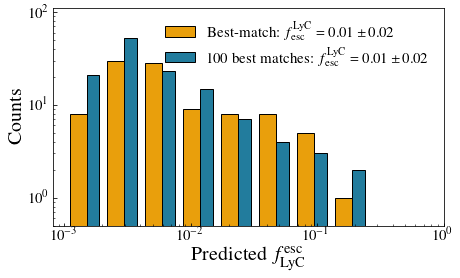

In [914]:
bins = np.logspace(np.log10(0.001),np.log10(.5), 10)
fig, (ax1) = plt.subplots(1,1, figsize = (7,4))
# hist2 = ax1.hist([fesc_first],  bins = np.logspace(np.log10(0.001),np.log10(1.0), 50),
#                       density = True, alpha = 0.7, 
#                       label ='Best-match spectra',
#                       color ='k',
#                      edgecolor = 'k')
# # hist2 = ax1.hist([fesc_mean_10],  bins = [0.00,0.01,0.05,0.1,0.15,0.2,0.3],
# #                       density = True, alpha = 0.7, 
# #                       label ='10 best-match spectra',
# #                       color ='#227C9D',
# #                      edgecolor = 'k')
# hist2 = ax1.hist([fesc_mean_100],  bins =bins, 
#                       density = True, alpha = 0.7, 
#                       label ='100 best-match spectra',
#                       color ='#E99F0C',
#                      edgecolor = 'k')
# hist2 = ax1.hist([fesc900.flatten()],  bins = bins, 
#                       density = True, alpha = 0.3, 
#                       label ='Simulation',
#                       color ='r',
#                      edgecolor = '#227C9D')
# counts, edges, bars =ax1.hist([fesc_first,
#                                fesc_mean_100, fesc900.flatten()],
#                                bins = bins,align='mid', 
#                               alpha = 1, 
#                               label = [r'Best-match: $f_{\rm esc}^{\rm LyC} = %.2f +- %.2f$'%(np.mean(fesc_first), np.std(fesc_first)),
#                              r'100 best matches: $f_{\rm esc}^{\rm LyC} = %.2f +- %.2f$'%(np.mean(fesc_mean_100), np.std(fesc_mean_100)),
#                               r'Simulation:  $f_{\rm esc}^{\rm LyC} = %.2f +- %.2f$' %(np.mean(fesc900.flatten()), np.std(fesc900.flatten()))  ], 
#                               edgecolor = 'k', color =['#800000','#E99F0C','#227C9D'], log=False, density = True )
# fesc_first = np.insert(fesc_first,-1,0.2)
# fesc_mean_100 = np.insert(fesc_mean_100,-1,0.2)

counts, edges, bars =ax1.hist([fesc_first,
                               fesc_mean_100],
                               bins = bins,align='mid', 
                              alpha = 1, 
                              label = [r'Best-match: $f_{\rm esc}^{\rm LyC} = %.2f \pm %.2f$'%(np.mean(fesc_first), np.std(fesc_first)),
                             r'100 best matches: $f_{\rm esc}^{\rm LyC} = %.2f \pm %.2f$'%(np.mean(fesc_mean_100), np.std(fesc_mean_100))   ], 
                              edgecolor = 'k', color =['#E99F0C','#227C9D'], log=False, density = False )
ax1.set_xlabel(r'Predicted $f_{\rm LyC}^{\rm esc}$', fontsize = 20)
ax1.set_ylabel(r'Counts', fontsize = 20)
# ax1.bar_label(bars[0])
# ax1.bar_label(bars[1])
ax1.legend(frameon=False)
ax1.set_yscale('log')
ax1.set_xscale('log')
ax1.set_xlim(0,1)
ax1.set_ylim(0.5,110)
# ax1.grid(minor = True)
# ax2.errorbar(fesc_mean_10,fesc_mean_100, ls = 'None', marker = 'o', color = 'k')
# ax2.plot(np.linspace(0,0.45),np.linspace(0,0.45),'--k')
# # ax2.set_yscale = 
# # ax1.set_ylim(0,65)
# ax2.set_yscale('log')
# ax2.set_xscale('log')
# ax2.set_xlabel(r'$f_{\rm LyC}^{\rm esc}$ from no z uncertainty matches', fontsize = 20)
# ax2.set_ylabel(r'$f_{\rm LyC}^{\rm esc}$ from z uncertainty matches', fontsize = 20)
print(np.mean(fesc_mean_10), np.std(fesc_mean_10))
print(np.mean(fesc_mean_100), np.std(fesc_mean_100))
plt.savefig('Plots/Escape_fractions.pdf', bbox_inches = 'tight')



In [910]:
print(len(fesc_mean_100[fesc_mean_100>=0.08]))
print(len(fesc_mean_100[fesc_mean_100>=0.08]))

5
5


#### Stacks from escape fraction bins

In [ ]:
df100   = pd.read_csv('Vandels_100best_offset.csv')
allOut_sing = df100['OutputAll0'].values
allOut_10 =  [df100['OutputAll0'].values]
allOut_100 = []

for i in range(50):
    allOut_10.append(df100[f'OutputAll{i}'].values)
allOut_10=np.asarray(allOut_10).flatten()

for i in range(100):
    allOut_100.append(df100[f'OutputAll{i}'].values)
allOut_100=np.asarray(allOut_100).flatten()


v_cm = np.genfromtxt(path_to_folder+'./dat_files/vcm_90_164.dat',unpack=True)
true_i= 0
stack_01 = []
stack_05 =[]
stack_10 =[]
stack_high =[]
for i in range(len(info)):    
    
    if(info['snr_per_pix'][i]<5 or info['lmass'][i]<7.5 ):
        continue
#     print({info["spectrum"][i]})
    dat1 = pd.read_csv(f'vandels_sample/vandels_spectra/{info["spectrum"][i]}.dat',delim_whitespace=True,
                       comment="#", 
                       names = ['wl', 'flam', 'flam_err'])
    redshift = info["z"][i]
    wave = dat1['wl']/(1+redshift)
    err  =  dat1['flam_err']/np.median(dat1['flam'][(wave>1410) & (wave<1520)])
    flux = dat1['flam']/np.median(dat1['flam'][(wave>1410) & (wave<1520)])
    flux[flux<0]=1e-3
    
    interwave = np.linspace(1200, 1700, 500)
    interpflux = np.interp(interwave, wave, flux)
    interpflux[interpflux==0] = np.nan
    # without Off set
    bestDir         = df100['DirAll0'][true_i]
    bestOut        = df100['OutputAll0'][true_i]
    bestChi2FS      = df100['x2All0'][true_i]
    if('229589' in info["spectrum"][i]):
        print('yes')
    else:
        if(fesc_mean_100[true_i]<0.004):
            stack_01.append(interpflux)
    #     elif(fesc900[int(bestOut)-90, int(bestDir)]<0.05):
    #         stack_05.append(interpflux)
    #     elif(fesc_mean_10[true_i]<0.05):
    #         stack_05.append(interpflux)
        elif(fesc_mean_100[true_i]<0.09):
            stack_10.append(interpflux)
        else:
            stack_high.append(interpflux)
    true_i +=1
#     if(true_i>2):
#         break


In [851]:
print(true_i)

133


/tmp/ipykernel_6984/3406206664.py:3: RuntimeWarning: Mean of empty slice
  mdstack05 =  np.asarray(np.nanmean(np.asarray(stack_05), axis=0))


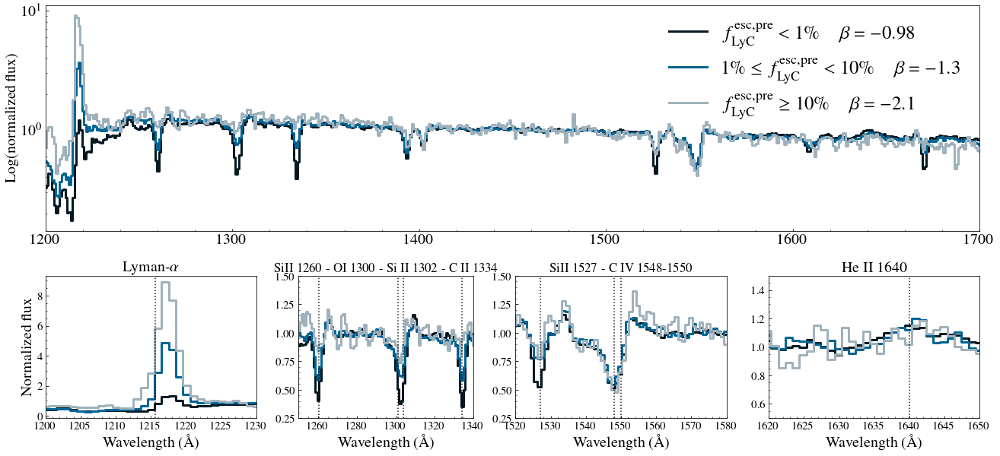

In [849]:
#chigh, "#17C3B2", "#FFC05C", "#E99F0C", "#FE6D73", "#800000"
mdstack1 = np.asarray(np.nanmean(np.asarray(stack_01), axis=0))
mdstack05 =  np.asarray(np.nanmean(np.asarray(stack_05), axis=0))
mdstack10 =  np.asarray(np.nanmean(np.asarray(stack_10), axis=0))
mdstackhigh =  np.asarray(np.nanmean(np.asarray(stack_high), axis=0))
clow ='#051923'
cmed = '#006494'
chigh = '#9FB1BC'

fig = plt.figure(figsize=(22,10))
gs = GridSpec(20, 26)
ax_main = plt.subplot(gs[:11, :])

ax_main.plot(interwave, np.nanmedian(np.asarray(stack_01), axis=0), c= clow,lw = 3,
            label = r'$f_{\rm LyC}^{\rm esc, pre} < 1\% \quad \beta = -0.98$', drawstyle = 'steps-mid')
# plt.plot(interwave, np.nanmedian(np.asarray(stack_05), axis=0))
ax_main.plot(interwave, np.nanmedian(np.asarray(stack_10), axis=0), c =cmed,lw = 3,
                        label = r'$1\% \leq f_{\rm LyC}^{\rm esc, pre} < 10\% \quad \beta = -1.3$', drawstyle = 'steps-mid')

ax_main.plot(interwave, gaussian_filter(np.nanmedian(np.asarray(stack_high), axis=0),sigma = 0.2), c = chigh,lw = 3,
                        label = r'$f_{\rm LyC}^{\rm esc, pre} \geq 10\% \quad \beta = -2.1$', drawstyle = 'steps-mid')
ax_main.legend(frameon = False, fontsize = 25)
# ax_main.set_xlabel(r'Wavelength ($\rm \AA$)', fontsize = 20)
ax_main.set_ylabel(r'Log(normalized flux)', fontsize = 20)
ax_main.set_xlim(1200, 1700)
ax_main.tick_params(labelsize = 20)
# ax_main.plot(np.exp(np.log(interwave[masklam])), np.exp((np.log(interwave[masklam])*-1.3+9.3)))
# ax_main.plot(np.exp(np.log(interwave[masklam])), np.exp((np.log(interwave[masklam])*-1.5+10.71)))
# ax_main.plot(np.exp(np.log(interwave[masklam])), np.exp((np.log(interwave[masklam])*-2.18+15.64)))
ax_main.set_yscale('log')

ax_main2 = plt.subplot(gs[13:28, :6])
ax_main2.plot(interwave, mdstack1/np.median(mdstack1[(interwave>1250) & (interwave<1260)]), c= clow,lw = 3,
             drawstyle = 'steps-mid')
# plt.plot(interwave, np.nanmedian(np.asarray(stack_05), axis=0))
ax_main2.plot(interwave, mdstack10/np.median(mdstack10[(interwave>1250) & (interwave<1260)]), c =cmed,lw = 3,
                         drawstyle = 'steps-mid')

ax_main2.plot(interwave, mdstackhigh/np.median(mdstackhigh[(interwave>1250) & (interwave<1260)]), c = chigh,lw = 3,
                         drawstyle = 'steps-mid')
ax_main2.set_xlim(1200, 1230)
ax_main2.set_xlabel(r'Wavelength ($\rm \AA$)', fontsize = 20)
ax_main2.set_ylabel(r'Normalized flux', fontsize = 20)
ax_main2.set_title(r'Lyman-$\alpha$', fontsize = 20)
ax_main2.axvline(1215.65, ls = ':', c= 'k', alpha = 0.9)


ax_main2 = plt.subplot(gs[13:28, 7:12])
ax_main2.plot(interwave, mdstack1/np.median(mdstack1[(interwave>1280) & (interwave<1285)]), c= clow,lw = 3,
             drawstyle = 'steps-mid')
# plt.plot(interwave, np.nanmedian(np.asarray(stack_05), axis=0))
ax_main2.plot(interwave, mdstack10/np.median(mdstack10[(interwave>1280) & (interwave<1285)]), c =cmed,lw = 3,
                         drawstyle = 'steps-mid')

ax_main2.plot(interwave, mdstackhigh/np.median(mdstackhigh[(interwave>1280) & (interwave<1285)]), c = chigh,lw = 3,
                         drawstyle = 'steps-mid')
ax_main2.set_xlim(1250, 1340)
ax_main2.set_ylim(0.25,1.5)
ax_main2.set_xlabel(r'Wavelength ($\rm \AA$)', fontsize = 20)
ax_main2.set_title(r'SiII 1260 - OI 1300 - Si II 1302 - C II 1334', fontsize = 17)
ax_main2.axvline(1260.40, ls = ':', c= 'k', alpha = 0.9)
ax_main2.axvline(1301, ls = ':', c= 'k', alpha = 0.9)
ax_main2.axvline(1304, ls = ':', c= 'k', alpha = 0.9)
ax_main2.axvline(1334, ls = ':', c= 'k', alpha = 0.9)


ax_main2 = plt.subplot(gs[13:28, 13:19])
ax_main2.plot(interwave, mdstack1/np.median(mdstack1[(interwave>1560) & (interwave<1600)]), c= clow,lw = 3,
             drawstyle = 'steps-mid')
# plt.plot(interwave, np.nanmedian(np.asarray(stack_05), axis=0))
ax_main2.plot(interwave, mdstack10/np.median(mdstack10[(interwave>1560) & (interwave<1600)]), c =cmed,lw = 3,
                         drawstyle = 'steps-mid')

ax_main2.plot(interwave, mdstackhigh/np.median(mdstackhigh[(interwave>1560) & (interwave<1600)]), c = chigh,lw = 3,
                         drawstyle = 'steps-mid')
ax_main2.set_xlim(1520, 1580)
ax_main2.set_ylim(0.25,1.5)
ax_main2.set_xlabel(r'Wavelength ($\rm \AA$)', fontsize = 20)
ax_main2.set_title(r'SiII 1527 - C IV 1548-1550', fontsize = 17)
ax_main2.axvline(1527, ls = ':', c= 'k', alpha = 0.9)
ax_main2.axvline(1548, ls = ':', c= 'k', alpha = 0.9)
ax_main2.axvline(1550, ls = ':', c= 'k', alpha = 0.9)

ax_main2 = plt.subplot(gs[13:28, 20:26])
ax_main2.plot(interwave, mdstack1/np.median(mdstack1[(interwave>1620) & (interwave<1635)]), c= clow,lw = 3,
             drawstyle = 'steps-mid')
# plt.plot(interwave, np.nanmedian(np.asarray(stack_05), axis=0))
ax_main2.plot(interwave, mdstack10/np.median(mdstack10[(interwave>1620) & (interwave<1635)]), c =cmed,lw = 3,
                         drawstyle = 'steps-mid')

ax_main2.plot(interwave, mdstackhigh/np.median(mdstackhigh[(interwave>1620) & (interwave<1635)]), c = chigh,lw = 3,
                         drawstyle = 'steps-mid')
ax_main2.axvline(1640, ls = ':', c= 'k', alpha = 0.9)



ax_main2.set_xlim(1620, 1650)
ax_main2.set_ylim(0.5,1.5)
ax_main2.set_xlabel(r'Wavelength ($\rm \AA$)', fontsize = 20)
ax_main2.set_title(r'He II 1640', fontsize = 20)
plt.savefig('Plots/Stacks.pdf', bbox_inches = 'tight')


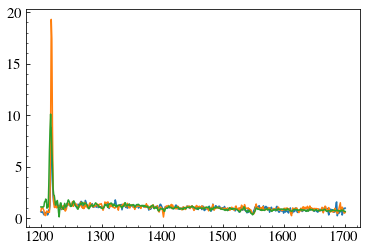

In [850]:
# print(stack_high)
# del stack_high[-1]
for spec in stack_high:
    plt.plot(interwave, spec)

In [843]:
from scipy.optimize import curve_fit
from lmfit import Parameters,minimize, fit_report


def model_lmfit(params,x,y):
    beta  =params['beta']    
    model = x*beta+params['K']
   # model /= np.median(model[(x>1269) & (x<1271)])
    return 0.5*(((y-model)))#*inv_sigma2

# Defining the various parameters
params = Parameters()
params.add("beta", value = -1, min =-5.0, max = 5.)
params.add("K", value = 1e3)
masklam = (interwave>1270) & (interwave<1600)

# Calling the minimize function. Args contains the x and y data. lssquare, powell, bashinhopping
fitted_params = minimize(model_lmfit, params, args= (np.log(interwave[masklam]),
                                                     np.log(np.nanmedian(np.asarray(stack_01), axis=0)[masklam])),
                        reduce_fcn='neglogcauchy')
fitted_params.params.pretty_print()

fitted_params = minimize(model_lmfit, params, args= (np.log(interwave[masklam]),
                                                     np.log(np.nanmedian(np.asarray(stack_10), axis=0)[masklam])),
                        reduce_fcn='neglogcauchy')
fitted_params.params.pretty_print()

fitted_params = minimize(model_lmfit, params, args= (np.log(interwave[masklam]),
                                                     np.log(np.nanmedian(np.asarray(stack_high), axis=0)[masklam])),
                                                    reduce_fcn='neglogcauchy')
fitted_params.params.pretty_print()

# target_func = func_powerlaw
# mask = (interwave>1310) & (interwave<1330) | (interwave>1350) & (interwave<1380) | \
# (interwave>1420) & (interwave<1510) | (interwave>1560) & (interwave<1600)
# popt1, pcov = curve_fit(target_func,,
#                       p0 = (-2, 1e5),maxfev=20000)

# # popt2, pcov = curve_fit(target_func, interwave[mask], np.log(np.nanmedian(np.asarray(stack_05), axis=0)[mask]),
# #                       p0 = (-2, 1e5),maxfev=20000)

# popt3, pcov = curve_fit(target_func, interwave[mask], np.log(np.nanmedian(np.asarray(stack_10), axis=0)[mask]),
#                       p0 = (-2, 1e5),maxfev=20000)

# popt4, pcov = curve_fit(target_func, interwave[mask], np.log(np.nanmedian(np.asarray(stack_high), axis=0)[mask]),
#                       p0 = (-2, 1e5),maxfev=20000)

# print(popt1,popt2,popt3,popt4)

Name     Value      Min      Max   Stderr     Vary     Expr Brute_Step
K        7.121     -inf      inf   0.9896     True     None     None
beta   -0.9846       -5        5   0.1362     True     None     None
Name     Value      Min      Max   Stderr     Vary     Expr Brute_Step
K        10.71     -inf      inf   0.6578     True     None     None
beta    -1.475       -5        5  0.09052     True     None     None
Name     Value      Min      Max   Stderr     Vary     Expr Brute_Step
K         15.3     -inf      inf   0.7927     True     None     None
beta    -2.104       -5        5   0.1091     True     None     None


In [844]:
betalow = 1.3e-4 * 10**(-1.22*-0.9438)
betamed = 1.3e-4 * 10**(-1.22*-1.476  )
betahigh = 1.3e-4 * 10**(-1.22*-2.1 )
print(betalow, betamed, betahigh)

0.0018423806016305976 0.008216055273354072 0.04741801310032899


# Selected best

131
93
2
2


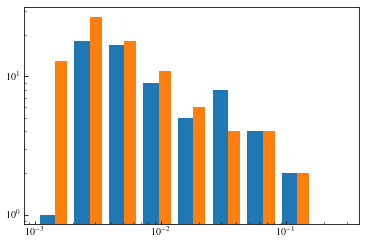

In [185]:
nGal_sel = np.sum(mask2_sel)
fesc_first= np.zeros(nGal_sel)#fesc900[df100['OutputAll0'].astype(int).values-90
fesc_mean_best, fesc_med_best, fesc_std_best = np.zeros(nGal_sel), np.zeros(nGal_sel), np.zeros(nGal_sel)
chisall_select = []
stell_mass_select = []
sfr_select = []
true_i = 0
print(nGal)
nthresh = 30
for ii in range(nGal):
    if(mask2_sel[ii] == False):
        continue
    fesc_first[true_i] = fesc900[np.argmin(chisall[ii])//300,np.argmin(chisall[ii])%300]
    bestChi = np.min(chisall[ii])
#     bestChi = np.min(chisall[i])
    sorted_idx = np.argpartition(chisall[ii],nthresh)
    best_o = sorted_idx[:nthresh]//300
    best_d = sorted_idx[:nthresh]%300

#     t = (chisall[ii]<=2) & (chisall[ii]<bestChi+0.15)
#     best_o = [i//300 for i, x in enumerate(t) if x]
#     best_d = [i%300 for i, x in enumerate(t) if x]
#     print(best_o)
    fesc_mean_best[true_i]=np.mean(fesc900[best_o, best_d])
    fesc_med_best[true_i]=np.median(fesc900[best_o, best_d])
    fesc_std_best[true_i]=np.std(fesc900[best_o, best_d])
    chisall_select.append(chisall[ii])
#     print(info['lmass'][mask].values[ii])
    stell_mass_select.append([info['lmass'][mask].values[ii], np.median(np.log10(Mstar[best_o]))])
    sfr_select.append([info['lsfr'][mask].values[ii], np.median(np.log10(SFR100[best_o]))])

#     fesc_mean_10[i]=np.mean(fesc900[tuple_out_10[i, :].astype(int)-90, tuple_dir_10[i, :].astype(int)])
#     fesc_med_10[i]=np.median(fesc900[tuple_out_10[i, :].astype(int)-90, tuple_dir_10[i, :].astype(int)])
#     fesc_std_10[i]=np.std(fesc900[tuple_out_10[i, :].astype(int)-90, tuple_dir_10[i, :].astype(int)])
    
#     fesc_mean_50[i]=np.mean(fesc900[tuple_out_50[i, :].astype(int)-90, tuple_dir_50[i, :].astype(int)])
#     fesc_med_50[i]=np.median(fesc900[tuple_out_50[i, :].astype(int)-90, tuple_dir_50[i, :].astype(int)])
#     fesc_std_50[i]=np.std(fesc900[tuple_out_50[i, :].astype(int)-90, tuple_dir_50[i, :].astype(int)])
    true_i+=1
print(true_i)
plt.hist([fesc_first,fesc_mean_best], bins = np.logspace(np.log10(0.001),np.log10(.3), 10), density = False)
ax = plt.gca()
ax.set_yscale('log')
ax.set_xscale('log')
print(len(fesc_mean_best[fesc_mean_best>=0.08]))
print(len(fesc_first[fesc_first>=0.08]))

/tmp/ipykernel_22229/2349341584.py:16: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  ax1.set_xlim(0,1)


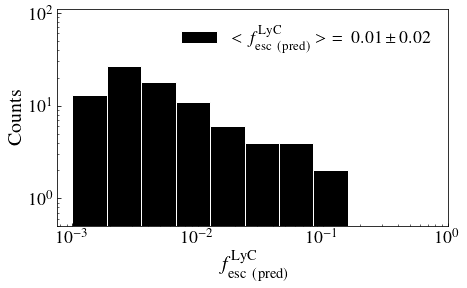

In [155]:
bins = np.logspace(np.log10(0.001),np.log10(0.3), 10)
fig, (ax1) = plt.subplots(1,1, figsize = (7,4))

counts, edges, bars =ax1.hist(fesc_mean_best,
                               bins = bins,align='mid', 
                              alpha = 1, 
                              label = r' $<f_{\rm esc\ (pred)}^{\rm LyC}>\ =\ %.2f \pm %.2f$'%(np.mean(fesc_mean_best), np.std(fesc_mean_best))   , 
                              edgecolor = 'w', color ='k', log=False, density = False)
ax1.set_xlabel(r'$f^{\rm LyC}_{\rm esc\ (pred)}$', fontsize = 20)
ax1.set_ylabel(r'Counts', fontsize = 20)
# ax1.bar_label(bars[0])
# ax1.bar_label(bars[1])
ax1.legend(frameon=False, fontsize = 18)
ax1.set_yscale('log')
ax1.set_xscale('log')
ax1.set_xlim(0,1)
ax1.set_ylim(0.5,110)
ax1.tick_params(labelsize = 18)
# plt.savefig('Plots/Escape_fractions_V2.pdf', bbox_inches = 'tight')
# 


## Stacks from escape fraction bins

UDS015507_P2M1Q1_P2M2Q1_P2M3Q1_P2M4Q1_004_2
0.052177393333333336
CDFS115905_P1M1Q3_P1M4Q3_017_1
0.09917504
CDFS002312_P3M4Q4_017_1
0.05268178333333333
UDS200677_P3M2Q1_P3M4Q1_P3M1Q1_P1M4Q1_P1M1Q1_001_1
0.008615078
CDFS020583_P4M4Q2_P4M3Q2_P1M4Q2_P2M1Q2_001_1
0.1206213
UDS197598_P2M1Q2_P2M4Q2_012_1
0.07506358333333334
CDFS128455_P1M3Q2_P1M4Q2_014_1
0.044032060000000005


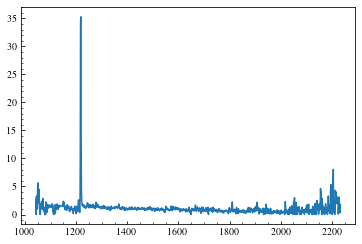

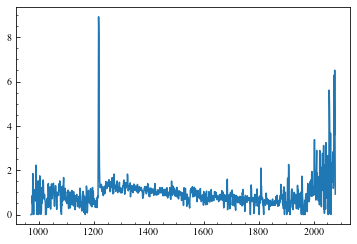

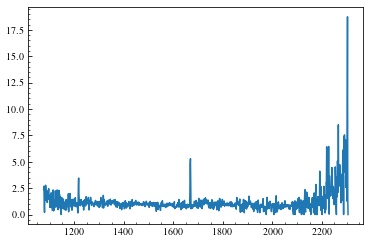

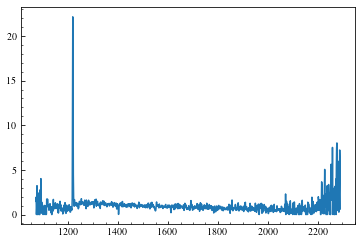

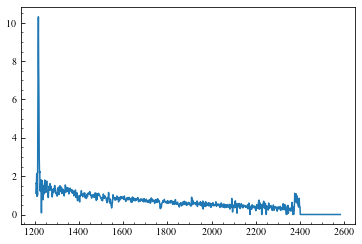

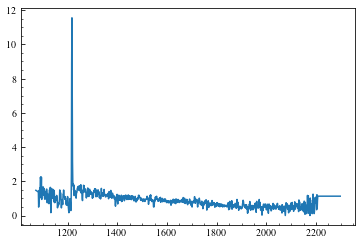

In [54]:

v_cm = np.genfromtxt(path_to_folder+'./dat_files/vcm_90_164.dat',unpack=True)
true_i= 0
stack_01 = []
stack_05 =[]
stack_10 =[]
stack_high =[]

cfits = ['#227C9D','#E99F0C', '#61210F']


true_i = 0
sel_i = 0
for i in range(len(info)):    
    
    if(mask[i] == False ):
        continue
    if(mask2_sel[true_i] == True):

    #     print({info["spectrum"][i]})
        dat1 = pd.read_csv(f'vandels_sample/vandels_spectra/{info["spectrum"][i]}.dat',delim_whitespace=True,
                           comment="#", 
                           names = ['wl', 'flam', 'flam_err'])
        redshift = info["z"][i]
        wave = dat1['wl']/(1+redshift)
        err  =  dat1['flam_err']/np.nanmedian(dat1['flam'][(wave>1410) & (wave<1520)])
        flux = dat1['flam']/np.nanmedian(dat1['flam'][(wave>1410) & (wave<1520)])
        flux[flux<0]=1e-3

        interwave = np.linspace(1150, 1700, 500)
        interpflux = np.interp(interwave, wave, flux)
        interpflux[interpflux==0] = np.nan

        if('229589' in info["spectrum"][i]):
            print('yes')
        else:
            if(fesc_mean_best[sel_i]+fesc_std_best[sel_i]<0.01):
                stack_01.append(interpflux)
        #     elif(fesc900[int(bestOut)-90, int(bestDir)]<0.05):
        #         stack_05.append(interpflux)
        #     elif(fesc_mean_10[true_i]<0.05):
        #         stack_05.append(interpflux)
            elif(fesc_mean_best[sel_i]+fesc_std_best[sel_i]<0.1):
                stack_10.append(interpflux)
#                 print(info["spectrum"][i])

            else:
                print(info["spectrum"][i])
                stack_high.append(interpflux)
                print(fesc_mean_best[sel_i])
                plt.figure()
                plt.plot(wave, flux)
                
        if('UDS200677' in info["spectrum"][i]):
            print(info["spectrum"][i])
            print(fesc_mean_best[sel_i])
        sel_i+=1
    true_i +=1
#     if(true_i>2):
#         break


/home/simon/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


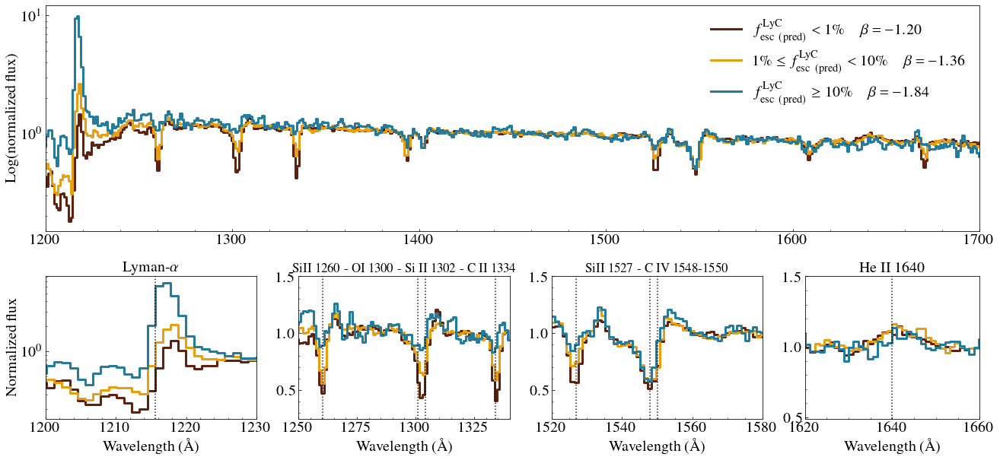

In [16]:
#chigh, "#17C3B2", "#FFC05C", "#E99F0C", "#FE6D73", "#800000"
mdstack1 = gaussian_filter(np.asarray(np.nanmedian(np.asarray(stack_01), axis=0)), sigma = 0.5)
mdstack05 =  gaussian_filter(np.asarray(np.nanmedian(np.asarray(stack_05), axis=0)), sigma =0.5)
mdstack10 =  gaussian_filter(np.asarray(np.nanmedian(np.asarray(stack_10), axis=0)), sigma = 0.5)
mdstackhigh =  gaussian_filter(np.asarray(np.nanmedian(np.asarray(stack_high), axis=0)), sigma = 0.5)
cfits = ['#227C9D','#E99F0C', '#61210F']

# clow ='#051923'
# cmed = '#006494'
# chigh = '#9FB1BC'
clow =cfits[2]
cmed = cfits[1]
chigh = cfits[0]
fig = plt.figure(figsize=(22,10))
gs = GridSpec(20, 26)
ax_main = plt.subplot(gs[:11, :])

ax_main.plot(interwave, np.nanmedian(np.asarray(stack_01), axis=0), c= clow,lw = 3,
            label = r'$f^{\rm LyC}_{\rm esc\ (pred)} < 1\% \quad \beta = -1.20$', drawstyle = 'steps-mid')
# plt.plot(interwave, np.nanmedian(np.asarray(stack_05), axis=0))
ax_main.plot(interwave, np.nanmedian(np.asarray(stack_10), axis=0), c =cmed,lw = 3,
                        label = r'$1\% \leq f^{\rm LyC}_{\rm esc\ (pred)} < 10\% \quad \beta = -1.36$', drawstyle = 'steps-mid')

ax_main.plot(interwave, np.nanmedian(np.asarray(stack_high), axis=0), c = chigh,lw = 3,
                        label = r'$f^{\rm LyC}_{\rm esc\ (pred)} \geq 10\% \quad \beta = -1.84$', drawstyle = 'steps-mid')
ax_main.legend(frameon = False, fontsize = 20)
# ax_main.set_xlabel(r'Wavelength ($\rm \AA$)', fontsize = 20)
ax_main.set_ylabel(r'Log(normalized flux)', fontsize = 20)
ax_main.set_xlim(1200, 1700)
ax_main.tick_params(labelsize = 20)
# ax_main.plot(np.exp(np.log(interwave[masklam])), np.exp((np.log(interwave[masklam])*-1.3+9.3)))
# ax_main.plot(np.exp(np.log(interwave[masklam])), np.exp((np.log(interwave[masklam])*-1.5+10.71)))
# ax_main.plot(np.exp(np.log(interwave[masklam])), np.exp((np.log(interwave[masklam])*-2.18+15.64)))
ax_main.set_yscale('log')

ax_main2 = plt.subplot(gs[13:28, :6])
ax_main2.plot(interwave, mdstack1/np.median(mdstack1[(interwave>1250) & (interwave<1260)]), c= clow,lw = 3,
             drawstyle = 'steps-mid')
# plt.plot(interwave, np.nanmedian(np.asarray(stack_05), axis=0))
ax_main2.plot(interwave, mdstack10/np.median(mdstack10[(interwave>1250) & (interwave<1260)]), c =cmed,lw = 3,
                         drawstyle = 'steps-mid')

ax_main2.plot(interwave, mdstackhigh/np.median(mdstackhigh[(interwave>1250) & (interwave<1260)]), c = chigh,lw = 3,
                         drawstyle = 'steps-mid')
ax_main2.set_xlim(1200, 1230)
ax_main2.set_xlabel(r'Wavelength ($\rm \AA$)', fontsize = 20)
ax_main2.set_ylabel(r'Normalized flux', fontsize = 20)
ax_main2.set_title(r'Lyman-$\alpha$', fontsize = 20)
ax_main2.axvline(1215.65, ls = ':', c= 'k', alpha = 0.9)
ax_main2.set_yscale('log')
ax_main2.tick_params(labelsize = 20)

ax_main2 = plt.subplot(gs[13:28, 7:13])
ax_main2.plot(interwave, mdstack1/np.median(mdstack1[(interwave>1280) & (interwave<1340)]), c= clow,lw = 3,
             drawstyle = 'steps-mid')
# plt.plot(interwave, np.nanmedian(np.asarray(stack_05), axis=0))
ax_main2.plot(interwave, mdstack10/np.median(mdstack10[(interwave>1280) & (interwave<1340)]), c =cmed,lw = 3,
                         drawstyle = 'steps-mid')

ax_main2.plot(interwave, mdstackhigh/np.median(mdstackhigh[(interwave>1280) & (interwave<1340)]), c = chigh,lw = 3,
                         drawstyle = 'steps-mid')
ax_main2.set_xlim(1250, 1340)
ax_main2.set_ylim(0.25,1.5)
ax_main2.set_xlabel(r'Wavelength ($\rm \AA$)', fontsize = 20)
ax_main2.set_title(r'SiII 1260 - OI 1300 - Si II 1302 - C II 1334', fontsize = 17)
ax_main2.axvline(1260.40, ls = ':', c= 'k', alpha = 0.9)
ax_main2.axvline(1301, ls = ':', c= 'k', alpha = 0.9)
ax_main2.axvline(1304, ls = ':', c= 'k', alpha = 0.9)
ax_main2.axvline(1334, ls = ':', c= 'k', alpha = 0.9)
ax_main2.tick_params(labelsize = 20)


ax_main2 = plt.subplot(gs[13:28, 14:20])
ax_main2.plot(interwave, mdstack1/np.median(mdstack1[(interwave>1560) & (interwave<1600)]), c= clow,lw = 3,
             drawstyle = 'steps-mid')
# plt.plot(interwave, np.nanmedian(np.asarray(stack_05), axis=0))
ax_main2.plot(interwave, mdstack10/np.median(mdstack10[(interwave>1560) & (interwave<1600)]), c =cmed,lw = 3,
                         drawstyle = 'steps-mid')

ax_main2.plot(interwave, mdstackhigh/np.median(mdstackhigh[(interwave>1560) & (interwave<1600)]), c = chigh,lw = 3,
                         drawstyle = 'steps-mid')
ax_main2.set_xlim(1520, 1580)
ax_main2.set_ylim(0.25,1.5)
ax_main2.set_xlabel(r'Wavelength ($\rm \AA$)', fontsize = 20)
ax_main2.set_title(r'SiII 1527 - C IV 1548-1550', fontsize = 17)
ax_main2.axvline(1527, ls = ':', c= 'k', alpha = 0.9)
ax_main2.axvline(1548, ls = ':', c= 'k', alpha = 0.9)
ax_main2.axvline(1550, ls = ':', c= 'k', alpha = 0.9)
ax_main2.tick_params(labelsize = 20)

#smooth right part of 
mdstackhigh[(interwave>1643) & (interwave<1655)] = gaussian_filter(mdstackhigh[(interwave>1643) & (interwave<1655)] ,sigma = 1.5)
ax_main2 = plt.subplot(gs[13:28, 21:26])
ax_main2.plot(interwave, mdstack1/np.median(mdstack1[(interwave>1625) & (interwave<1635)]), c= clow,lw = 3,
             drawstyle = 'steps-mid')
# plt.plot(interwave, np.nanmedian(np.asarray(stack_05), axis=0))
ax_main2.plot(interwave, mdstack10/np.median(mdstack10[(interwave>1625) & (interwave<1635)]), c =cmed,lw = 3,
                         drawstyle = 'steps-mid')

ax_main2.plot(interwave, 
              mdstackhigh/np.median(mdstackhigh[(interwave>1625) & (interwave<1635)]), c = chigh,lw = 3,
                         drawstyle = 'steps-mid')
ax_main2.axvline(1640, ls = ':', c= 'k', alpha = 0.9)



ax_main2.set_xlim(1620, 1660)
ax_main2.set_ylim(0.49,1.5)
ax_main2.set_xlabel(r'Wavelength ($\rm \AA$)', fontsize = 20)
ax_main2.set_title(r'He II 1640', fontsize = 20)
ax_main2.tick_params(labelsize = 20)

# plt.savefig('Plots/Stacks_V2.pdf', bbox_inches = 'tight')


(0.0, 2.0)

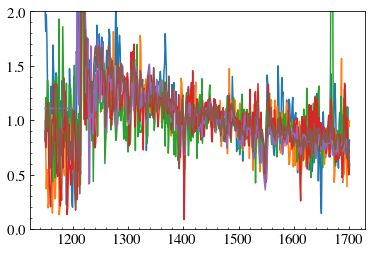

In [34]:
# print(stack_high)
# del stack_high[-1]

for spec in stack_high:
    plt.plot(interwave, spec)
# plt.xlim(1600, 1700)
plt.ylim(0,2)

In [55]:
from scipy.optimize import curve_fit
from lmfit import Parameters,minimize, fit_report


def model_lmfit(params,x,y):
    beta  =params['beta']    
    model = x*beta+params['K']
   # model /= np.median(model[(x>1269) & (x<1271)])
    return 0.5*(((y-model)**2))#*inv_sigma2

# Defining the various parameters
params = Parameters()
params.add("beta", value = -1, min =-5.0, max = 5.)
params.add("K", value = 1e3)
# masklam = (interwave>1270) & (interwave<1600)
# masklam = ((interwave>1290) & (interwave<1295)) | ((interwave>1350) & (interwave<1370))| \
# ((interwave>1410) & (interwave<1490)) | ((interwave>1560) & (interwave<1600))
masklam = ((interwave>1275) & (interwave<1290)) | ((interwave>1310) & (interwave<1325))| \
((interwave>1340) & (interwave<1380)) | ((interwave>1410) & (interwave<1490)) |\
 ((interwave>1510) & (interwave<1520)) |  ((interwave>1560) & (interwave<1600)) | \
 ((interwave>1680) & (interwave<1700))
masklam = ((interwave>1280) & (interwave<1290)) | ((interwave>1310) & (interwave<1320))| \
((interwave>1340) & (interwave<1375)) | ((interwave>1410) & (interwave<1490)) |\
 ((interwave>1510) & (interwave<1520)) |  ((interwave>1560) & (interwave<1600)) | \
 ((interwave>1680) & (interwave<1685))# |  ((interwave>1695) & (interwave<1698))
# Calling the minimize function. Args contains the x and y data. lssquare, powell, bashinhopping
print('Low stack fit')
fitted_params = minimize(model_lmfit, params, args= (np.log(interwave[masklam]),
                                                     np.log(gaussian_filter(mdstack1[masklam], sigma = 1))),
                        reduce_fcn='neglogcauchy')
fitted_params.params.pretty_print()
print()

print('Med stack fit')

fitted_params = minimize(model_lmfit, params, args= (np.log(interwave[masklam]),
                                                     np.log(gaussian_filter(mdstack10[masklam], sigma = 1))),
                        reduce_fcn='neglogcauchy')
fitted_params.params.pretty_print()
print()

print('High stack fit')

fitted_params = minimize(model_lmfit, params, args= (np.log(interwave[masklam]),
                                                     np.log(gaussian_filter(mdstackhigh[masklam], sigma = 1))),
                                                    reduce_fcn='neglogcauchy')
fitted_params.params.pretty_print()
print()
# target_func = func_powerlaw
# mask = (interwave>1310) & (interwave<1330) | (interwave>1350) & (interwave<1380) | \
# (interwave>1420) & (interwave<1510) | (interwave>1560) & (interwave<1600)
# popt1, pcov = curve_fit(target_func,,
#                       p0 = (-2, 1e5),maxfev=20000)

# # popt2, pcov = curve_fit(target_func, interwave[mask], np.log(np.nanmedian(np.asarray(stack_05), axis=0)[mask]),
# #                       p0 = (-2, 1e5),maxfev=20000)

# popt3, pcov = curve_fit(target_func, interwave[mask], np.log(np.nanmedian(np.asarray(stack_10), axis=0)[mask]),
#                       p0 = (-2, 1e5),maxfev=20000)

# popt4, pcov = curve_fit(target_func, interwave[mask], np.log(np.nanmedian(np.asarray(stack_high), axis=0)[mask]),
#                       p0 = (-2, 1e5),maxfev=20000)

# print(popt1,popt2,popt3,popt4)

Low stack fit
Name     Value      Min      Max   Stderr     Vary     Expr Brute_Step
K        8.716     -inf      inf   0.1128     True     None     None
beta    -1.196       -5        5  0.01542     True     None     None

Med stack fit
Name     Value      Min      Max   Stderr     Vary     Expr Brute_Step
K        9.888     -inf      inf   0.1471     True     None     None
beta    -1.358       -5        5  0.02017     True     None     None

High stack fit
Name     Value      Min      Max   Stderr     Vary     Expr Brute_Step
K        13.41     -inf      inf   0.3124     True     None     None
beta    -1.838       -5        5  0.04299     True     None     None



<ipython-input-65-0e3ef2e18132>:27: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  plt.ylim(0,2)


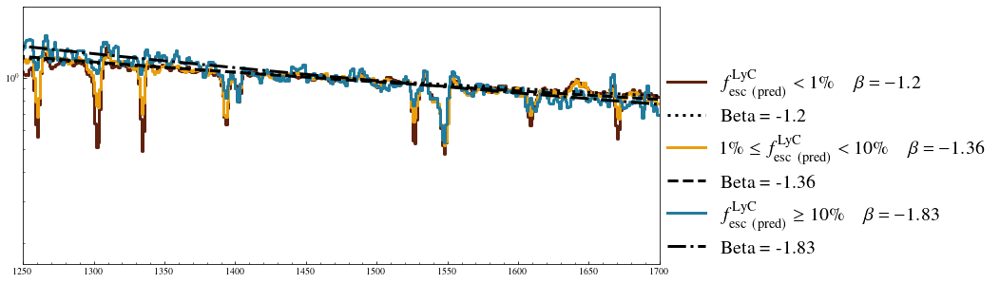

In [65]:
#toto
fig = plt.figure(figsize=(12,5))
masklam = ((interwave>1280) & (interwave<1290)) | ((interwave>1310) & (interwave<1320))| \
((interwave>1340) & (interwave<1375)) | ((interwave>1410) & (interwave<1490)) |\
 ((interwave>1510) & (interwave<1520)) |  ((interwave>1560) & (interwave<1600)) | \
 ((interwave>1680) & (interwave<1685))# |  ((interwave>1695) & (interwave<1698))
masklam = ((interwave>1200)& (interwave<1700))
plt.plot(interwave[masklam], gaussian_filter(mdstack1[masklam], sigma =0.5), c= clow,lw = 3,
            label = r'$f^{\rm LyC}_{\rm esc\ (pred)} < 1\% \quad \beta = -1.2$', drawstyle = 'steps-mid')
plt.plot(np.exp(np.log(interwave[masklam])), np.exp((np.log(interwave[masklam])*-1.196+8.716)), c= 'k',
        ls = ':', lw = 3, zorder = 10, label = 'Beta  = -1.2')

# plt.plot(interwave, np.nanmedian(np.asarray(stack_05), axis=0))
plt.plot(interwave[masklam], gaussian_filter(mdstack10[masklam], sigma =0.5), c =cmed,lw = 3,
                        label = r'$1\% \leq f^{\rm LyC}_{\rm esc\ (pred)} < 10\% \quad \beta = -1.36$', drawstyle = 'steps-mid')
plt.plot(np.exp(np.log(interwave[masklam])), np.exp((np.log(interwave[masklam])*-1.358+9.888)), c= 'k',
        ls = '--', lw = 3, zorder = 10, label = 'Beta  = -1.36')

plt.plot(interwave[masklam], gaussian_filter(mdstackhigh[masklam], sigma =0.5), c = chigh,lw = 3,
                        label = r'$f^{\rm LyC}_{\rm esc\ (pred)} \geq 10\% \quad \beta = -1.83$', drawstyle = 'steps-mid')
plt.plot(np.exp(np.log(interwave[masklam])), np.exp((np.log(interwave[masklam])*-1.838+13.41)), c= 'k',
        ls = '-.', lw = 3, zorder = 10, label = 'Beta  = -1.83')
plt.legend(frameon = False, fontsize = 20, loc = (1,0), ncol = 1)
plt.yscale('log')
# ax_main.set_xlabel(r'Wavelength ($\rm \AA$)', fontsize = 20)
ax_main.set_ylabel(r'Log(normalized flux)', fontsize = 20)
plt.xlim(1250, 1700)
plt.ylim(0,2)
ax_main.tick_params(labelsize = 20)

# plt.plot(np.exp(np.log(interwave[masklam])), np.exp((np.log(interwave[masklam])*-1.4+10.2)))
# plt.plot(np.exp(np.log(interwave[masklam])), np.exp((np.log(interwave[masklam])*-1.812+13.21)))

<ipython-input-66-711e4d72b473>:38: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  plt.ylim(0,2)


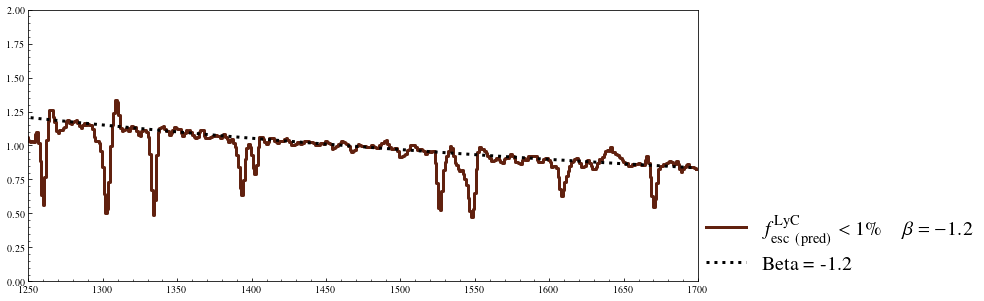

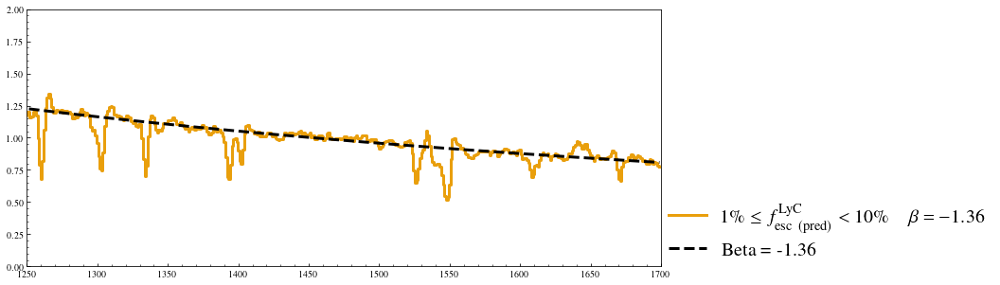

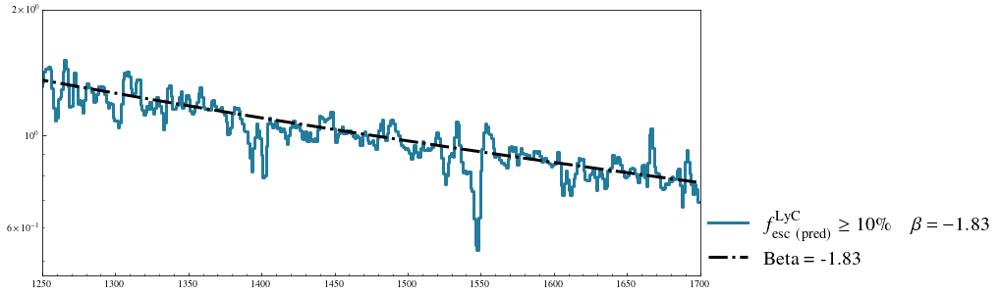

In [66]:
#toto
fig = plt.figure(figsize=(12,5))
masklam = ((interwave>1280) & (interwave<1290)) | ((interwave>1310) & (interwave<1320))| \
((interwave>1340) & (interwave<1375)) | ((interwave>1410) & (interwave<1490)) |\
 ((interwave>1510) & (interwave<1520)) |  ((interwave>1560) & (interwave<1600)) | \
 ((interwave>1680) & (interwave<1685))# |  ((interwave>1695) & (interwave<1698))
masklam = ((interwave>1200)& (interwave<1700))
plt.plot(interwave[masklam], gaussian_filter(mdstack1[masklam], sigma =0.5), c= clow,lw = 3,
            label = r'$f^{\rm LyC}_{\rm esc\ (pred)} < 1\% \quad \beta = -1.2$', drawstyle = 'steps-mid')
plt.plot(np.exp(np.log(interwave[masklam])), np.exp((np.log(interwave[masklam])*-1.196+8.716)), c= 'k',
        ls = ':', lw = 3, zorder = 10, label = 'Beta  = -1.2')
plt.xlim(1250, 1700)
plt.ylim(0,2)
plt.legend(frameon = False, fontsize = 20, loc = (1,0), ncol = 1)

fig = plt.figure(figsize=(12,5))

# plt.plot(interwave, np.nanmedian(np.asarray(stack_05), axis=0))
plt.plot(interwave[masklam], gaussian_filter(mdstack10[masklam], sigma =0.5), c =cmed,lw = 3,
                        label = r'$1\% \leq f^{\rm LyC}_{\rm esc\ (pred)} < 10\% \quad \beta = -1.36$', drawstyle = 'steps-mid')
plt.plot(np.exp(np.log(interwave[masklam])), np.exp((np.log(interwave[masklam])*-1.358+9.888)), c= 'k',
        ls = '--', lw = 3, zorder = 10, label = 'Beta  = -1.36')
plt.xlim(1250, 1700)
plt.ylim(0,2)
plt.legend(frameon = False, fontsize = 20, loc = (1,0), ncol = 1)

fig = plt.figure(figsize=(12,5))

plt.plot(interwave[masklam], gaussian_filter(mdstackhigh[masklam], sigma =0.5), c = chigh,lw = 3,
                        label = r'$f^{\rm LyC}_{\rm esc\ (pred)} \geq 10\% \quad \beta = -1.83$', drawstyle = 'steps-mid')
plt.plot(np.exp(np.log(interwave[masklam])), np.exp((np.log(interwave[masklam])*-1.838+13.41)), c= 'k',
        ls = '-.', lw = 3, zorder = 10, label = 'Beta  = -1.83')
plt.legend(frameon = False, fontsize = 20, loc = (1,0), ncol = 1)
plt.yscale('log')
# ax_main.set_xlabel(r'Wavelength ($\rm \AA$)', fontsize = 20)
ax_main.set_ylabel(r'Log(normalized flux)', fontsize = 20)
plt.xlim(1250, 1700)
plt.ylim(0,2)
ax_main.tick_params(labelsize = 20)

# plt.plot(np.exp(np.log(interwave[masklam])), np.exp((np.log(interwave[masklam])*-1.4+10.2)))
# plt.plot(np.exp(np.log(interwave[masklam])), np.exp((np.log(interwave[masklam])*-1.812+13.21)))

In [17]:
betalow = 1.3e-4 * 10**(-1.22*-1.2)
betamed = 1.3e-4 * 10**(-1.22*-1.35  )
betahigh = 1.3e-4 * 10**(-1.22*-1.84 )
print(betalow, betamed, betahigh)

0.003783932253486586 0.005766912371108622 0.022842485205736233


In [171]:
print(fesc_mean_best)

[0.005881          nan        nan 0.05419032 0.0024467  0.00389081
        nan 0.0031285         nan 0.00235235        nan 0.00114687
        nan 0.00173276        nan        nan 0.0034444  0.00645369
 0.08089385 0.00400551 0.00116247 0.00289235 0.00178706        nan
        nan 0.00422951 0.00189365        nan 0.00775279 0.00157588
 0.0067931  0.00133994 0.13302667        nan        nan        nan
 0.00179562        nan        nan 0.00247867 0.00138017 0.00231806
 0.01974492        nan        nan        nan 0.00163754 0.00244412
 0.0039887  0.00133343 0.01336645 0.00176023 0.01060637 0.01786798
        nan 0.00885285 0.00222708 0.00263051 0.06382867        nan
        nan        nan 0.00152932 0.04550583 0.01355862 0.00282509
 0.00424948 0.00349846        nan 0.01556807        nan        nan
 0.076496   0.00316418 0.00188174 0.00158094 0.0098556  0.00128768
 0.00141301        nan 0.00134422 0.00350762 0.00118559 0.00146336
 0.00112534 0.00188743 0.00240696 0.00574232 0.003998   0.0026

#### Estimating for 3 galaxies

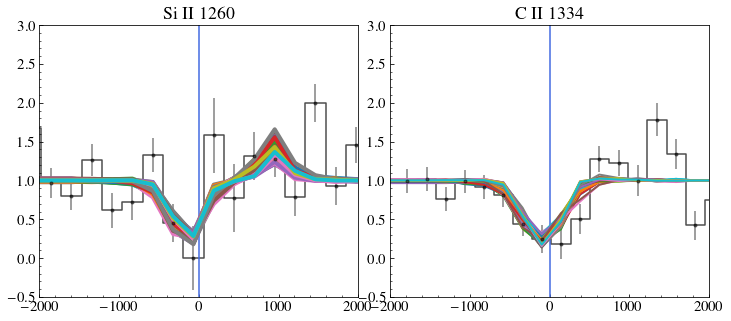

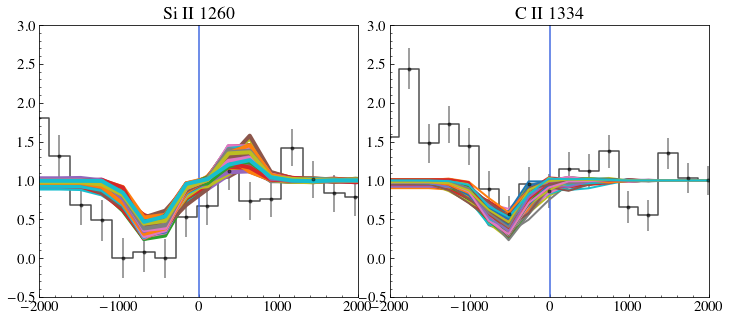

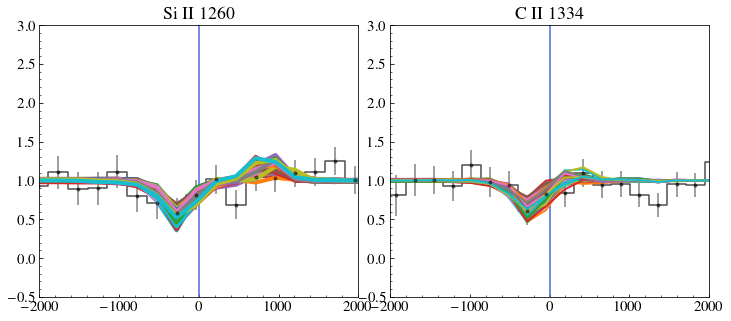

In [617]:
import scipy.signal as signal
from scipy import fftpack
import time
nGal_lyc =3
nmocks         = 100
Chi2_lyc        = np.zeros((nGal, nmocks)) + 1e40
dir_lyc        = np.zeros((nGal, nmocks)) - 1
out_lyc         = np.zeros((nGal, nmocks)) - 1
off_lyc         = np.zeros((nGal, nmocks)) - 1

v_cm = np.genfromtxt(path_to_folder+'/dat_files/vcm_90_164.dat',unpack=True)
path_to_data = path_to_data_arr[-1]

analyze_i = 0
gal_lyc = ['023836','025948', '220026']

for i in range(len(info)):    

    if(gal_lyc[0] in info["spectrum"][i] or gal_lyc[1] in info["spectrum"][i] or gal_lyc[2] in info["spectrum"][i]):

        dat1 = pd.read_csv(f'vandels_sample/vandels_spectra/{info["spectrum"][i]}.dat',delim_whitespace=True,
                           comment="#", 
                           names = ['wl', 'flam', 'flam_err'])
        redshift = info["z"][i]
        wave = dat1['wl']/(1+redshift)
        err  =  dat1['flam_err']/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
        flux = dat1['flam']/np.median(dat1['flam'][(wave>1310) & (wave<1320)])
        flux[flux<0]=0
        vcIId  = (wave/wcII1334-1)*c
        vsiIId = (wave/wsiII1260-1)*c

        cutCIIall = (vcIId>-3000) & (vcIId<3000) 
        cutSiIIall = (vsiIId>-3000) & (vsiIId<3000)  

        fcII     = flux[cutCIIall]
        fsiII    = flux[cutSiIIall]
        ecII     = err[cutCIIall]
        esiII    = err[cutSiIIall]
        vcII     = vcIId[cutCIIall]
        vsiII    = vsiIId[cutSiIIall]  

        rmedCII = ((vcII<-1200) | (vcII>1200))
        fmedCII = np.nanmedian(fcII[rmedCII])
        fcII /= fmedCII

        rmedSiII = ((vsiII<-1000) |  (vsiII > 2000) )
        fmedSiII = np.nanmedian(fsiII[rmedSiII])
        fsiII /= fmedSiII  


        fig, axs = plt.subplots(1,2,figsize=(12,5))
        axs[1].errorbar(vcII, fcII, yerr = ecII, fmt='.k' , alpha=0.5)
        axs[1].plot(vcII, fcII,  c='k', alpha = 0.7,drawstyle='steps-mid' , label = 'Observed')
        axs[1].set_title('C II 1334')
        axs[1].axvline(0, c= 'royalblue')


        axs[0].errorbar(vsiII, fsiII, yerr = esiII, fmt='.k' , alpha=0.5)
        axs[0].plot(vsiII, fsiII,  c='k',  alpha = 0.7,drawstyle='steps-mid' )
        axs[0].set_title('Si II 1260')
        axs[0].axvline(0, c= 'royalblue')

        bestfluxsiall = np.zeros((nmocks, len(vsiII)))
        bestfluxciiall = np.zeros((nmocks, len(vcII)))


        for output in range(90,165,1):

            lcII,  fluxcII  = read_spectrum_c(path_to_data,output) 
            lsiII, fluxsiII = read_spectrum_si(path_to_data,output) 

            for idir in range(300):
                lcII_systemic = lcII + np.dot(directions[idir,:],v_cm[:,output-90])/c_cgs*1e5*np.mean(lcII) 
                lcII_systemic = lcII_systemic[1:]
                vcII_s    = (lcII_systemic/wcII1334 -1)*c

                lsiII_systemic = lsiII + np.dot(directions[idir,:],v_cm[:,output-90])/c_cgs*1e5*np.mean(lsiII) 
                lsiII_systemic = lsiII_systemic[1:]
                vsiII_s  = (lsiII_systemic/wsiII1260 -1)*c

                sigma_pixelcII  =  rkms_vandels/2 /2.355/ ((vcII_s[50] - vcII_s[49]))
                sigma_pixelsiII =  rkms_vandels/2 /2.355/ ((vsiII_s[50]- vsiII_s[49]))

                modelcII    = gaussian_filter(fluxcII[idir,1:], sigma = sigma_pixelcII)
                modelsiII   = gaussian_filter(fluxsiII[idir,1:], sigma = sigma_pixelsiII)


                rmedCII = ((vcII_s<-1200) | (vcII_s>1200))
                fmedCII = np.nanmedian(modelcII[rmedCII])
                modelcII /= fmedCII            

                rmedSiII = ((vsiII_s<-1000) |  (vsiII_s > 2000) )
                fmedSiII = np.nanmedian(modelsiII[rmedSiII])
                modelsiII /= fmedSiII

                extrapcII   =  modelcII[(vcII_s>-1500) & (vcII_s<1500)]
                fcIIextrap  =  np.interp(vcII_s[(vcII_s>-1500) & (vcII_s<1500)], vcII,fcII )
                extrapsiII  =  modelsiII[(vsiII_s>-1500) & (vsiII_s<1900)]
                fsiIIextrap =  np.interp(vsiII_s[(vsiII_s>-1500) & (vsiII_s<1900)], vsiII,fsiII )

                modelextrap = np.concatenate((extrapcII, extrapsiII))
                fextrap = np.concatenate((fcIIextrap, fsiIIextrap))

                A = fftpack.fft(np.asarray(fextrap))
                B = fftpack.fft(modelextrap)
                Ar = -A.conjugate()
                Br = -B.conjugate()
                d = np.abs(fftpack.ifft(Ar*B))
                d[100:len(d)-100] = 0
                off = np.argmax(d)
                if(off>len(d)/2):
                    off = off - len(fextrap) #-len(modelextrap)
                off = -off
                modelsiII = shift5(modelsiII, off)
                modelcII = shift5(modelcII, off)

                modelNewcII = np.interp(vcII,vcII_s, modelcII)
                modelNewsiII= np.interp(vsiII,vsiII_s, modelsiII)

                maskCII = (vcII >-1000) & (vcII < 1000)
                maskSiII =  (vsiII > -1000)  & (vsiII < 1700)


                if(len(ecII[maskCII]) > 0):
                    lnlikecII  =  np.nansum(((fcII[maskCII]-modelNewcII[maskCII])**2)/ecII[maskCII]**2) #/len(ecII[maskCII])
                    ncII = len(fcII[maskCII])
                else:
                    lnlikecII = 0
                    ncII = 0
                if(len(esiII[maskSiII]) > 0):
                    lnlikesiII =  np.nansum(((fsiII[maskSiII] - modelNewsiII[maskSiII])**2)/esiII[maskSiII]**2)#/len(esiII[maskSiII])
                    nsiII = len(fsiII[maskSiII])               
                else:
                    lnlikesiII = 0
                    nsiII = 0

                if(np.isnan(lnlikesiII)):
                    lnlikesiII = 0
                    nsiII = 0
                if(np.isnan(lnlikecII)):
                    lnlikecII = 0
                    ncII = 0
                lnlikeall  = (lnlikecII + lnlikesiII)/(ncII + nsiII)

                if(lnlikeall > Chi2_lyc[analyze_i][-1]):
                    continue
                else:
                    for j in range(nmocks):                            
                        if(lnlikeall < Chi2_lyc[analyze_i][j]):
                            b = dir_lyc[analyze_i].copy()
                            b = np.insert(b, j, idir)
                            b = b[:-1]
                            dir_lyc[analyze_i] = b

                            b = Chi2_lyc[analyze_i].copy()
                            b = np.insert(b, j, lnlikeall)
                            b = b[:-1]
                            Chi2_lyc[analyze_i] = b

                            b = out_lyc[analyze_i].copy()
                            b = np.insert(b,j, output)
                            b = b[:-1]
                            out_lyc[analyze_i] = b

                            b = off_lyc[analyze_i].copy()
                            b = np.insert(b,j, off)
                            b = b[:-1]
                            off_lyc[analyze_i] = b

                            bestfluxsiall = np.insert(bestfluxsiall,j, modelNewsiII,0)
                            bestfluxsiall = bestfluxsiall[:-1, :]

                            bestfluxciiall = np.insert(bestfluxciiall,j, modelNewcII,0)
                            bestfluxciiall = bestfluxciiall[:-1]                 

                            break




        for k in range(nmocks):
    #         if(np.sum(bestfluxsiall[k]))
            off = off_lyc[analyze_i][k]
            #print(off)
            #print('Velocity offset:', vcII_s[50+int(off)]-vcII_s[50],vsiII_s[50+int(off)]-vsiII_s[50] )
            axs[1].plot(vcII, bestfluxciiall[k],
                    label = 'Mock %d - TS %d - Chi %1.3f - off vel %.0f'%(k, out_lyc[analyze_i][k],
                                                                 Chi2_lyc[analyze_i][k],
                                                                          vsiII_s[50+int(off)]-vsiII_s[50]), lw = 2)

            axs[0].plot(vsiII, bestfluxsiall[k],  lw = 4)

        plt.subplots_adjust(wspace = 0.1)
    #     plt.suptitle(label[i])
    #     plt.savefig('Plots/'+info["spectrum"][i]+'match_off.pdf', bbox_inches = 'tight')
        axs[0].set_ylim(-0.5,3)
        axs[1].set_ylim(-0.5,3)
        axs[0].set_xlim(-2000,2000)
        axs[1].set_xlim(-2000,2000)   
        analyze_i +=1
        plt.show()
        plt.close()
#     break

                

In [618]:
totCol = np.vstack((gal_lyc,out_lyc[:3,0].astype(int), 
                    dir_lyc[:3,0].astype(int),Chi2_lyc[:3,0], off_lyc[:3,0]))
C=['Galaxy','OutputAll0','DirAll0', 'x2All0', 'outAll0']

for k in range(1,nmocks):
    totCol = np.vstack((totCol,out_lyc[:3,k].astype(int), dir_lyc[:3,k].astype(int),Chi2_lyc[:3,k],off_lyc[:3,k]))
    C.extend([f'OutputAll{k}',f'DirAll{k}',f'x2All{k}', f'outAll{k}'])
    
# print(C)
# print(totCol)
df = pd.DataFrame(totCol.T) # A is a numpy 2d array
df.to_csv(f"Vandels_100best_lyc.csv", sep=',', header= C, index=False) 

   Galaxy  OutputAll0  DirAll0    x2All0  outAll0  OutputAll1  DirAll1  \
0   23836         148      154  1.999077    -14.0         101       58   
1   25948         145       13  1.837438    -57.0          99       10   
2  220026         148      261  0.399040    -27.0         148      223   

     x2All1  outAll1  OutputAll2  ...   x2All97  outAll97  OutputAll98  \
0  2.027482    -23.0         148  ...  2.227181     -18.0          138   
1  1.914233    -56.0         145  ...  2.191981     -59.0          146   
2  0.399593    -28.0         148  ...  0.551914     -21.0           99   

   DirAll98   x2All98  outAll98  OutputAll99  DirAll99   x2All99  outAll99  
0       166  2.228125     -17.0          109       171  2.229047      -9.0  
1        55  2.193167     -58.0          148       219  2.193672     -52.0  
2       135  0.552625     -24.0          161       222  0.553247     -25.0  

[3 rows x 401 columns]
0.00023056546473684215 0.0022009539878800393
0.00020606414690465836 0.0019

/tmp/ipykernel_6984/1804230851.py:73: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax1.set_xlim(0,1)
/tmp/ipykernel_6984/1804230851.py:74: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ax1.set_ylim(0,110)


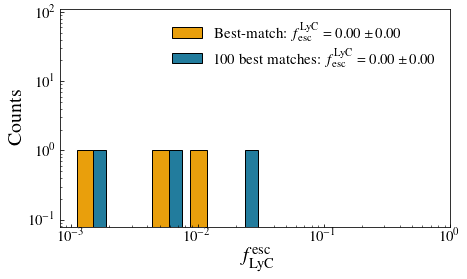

In [622]:
df100   = pd.read_csv('Vandels_100best_lyc.csv')
tuple_out_100 = np.zeros((nGal_lyc, 100))
tuple_dir_100 = np.zeros((nGal_lyc, 100))
tuple_out_10 = np.zeros((nGal_lyc, 10))
tuple_dir_10 = np.zeros((nGal_lyc, 10))
print(df100)
for i in range(nmocks):
    tuple_out_100[:,i] = df100[f'OutputAll{i}'].values
    tuple_dir_100[:,i] = df100[f'DirAll{i}'].values

for i in range(10):
    tuple_out_10[:,i] = df100[f'OutputAll{i}'].values
    tuple_dir_10[:,i] = df100[f'DirAll{i}'].values
    
fesc_first= np.zeros(nGal)#fesc900[df100['OutputAll0'].astype(int).values-90
fesc_mean_100, fesc_med_100, fesc_std_100 = np.zeros(nGal), np.zeros(nGal), np.zeros(nGal)
fesc_mean_10, fesc_med_10, fesc_std_10 = np.zeros(nGal), np.zeros(nGal), np.zeros(nGal)

for i in range(nGal_lyc):
    fesc_first[i] = fesc[df100['OutputAll0'][i]-90,df100['DirAll0'][i].astype(int)]
    fesc_mean_100[i]=np.mean(fesc900[tuple_out_100[i, :].astype(int)-90, tuple_dir_100[i, :].astype(int)])
    fesc_med_100[i]=np.median(fesc900[tuple_out_100[i, :].astype(int)-90, tuple_dir_100[i, :].astype(int)])
    fesc_std_100[i]=np.std(fesc900[tuple_out_100[i, :].astype(int)-90, tuple_dir_100[i, :].astype(int)])
    
    fesc_mean_10[i]=np.mean(fesc900[tuple_out_10[i, :].astype(int)-90, tuple_dir_10[i, :].astype(int)])
    fesc_med_10[i]=np.median(fesc900[tuple_out_10[i, :].astype(int)-90, tuple_dir_10[i, :].astype(int)])
    fesc_std_10[i]=np.std(fesc900[tuple_out_10[i, :].astype(int)-90, tuple_dir_10[i, :].astype(int)])

bins = np.logspace(np.log10(0.001),np.log10(.5), 10)
fig, (ax1) = plt.subplots(1,1, figsize = (7,4))
# hist2 = ax1.hist([fesc_first],  bins = np.logspace(np.log10(0.001),np.log10(1.0), 50),
#                       density = True, alpha = 0.7, 
#                       label ='Best-match spectra',
#                       color ='k',
#                      edgecolor = 'k')
# # hist2 = ax1.hist([fesc_mean_10],  bins = [0.00,0.01,0.05,0.1,0.15,0.2,0.3],
# #                       density = True, alpha = 0.7, 
# #                       label ='10 best-match spectra',
# #                       color ='#227C9D',
# #                      edgecolor = 'k')
# hist2 = ax1.hist([fesc_mean_100],  bins =bins, 
#                       density = True, alpha = 0.7, 
#                       label ='100 best-match spectra',
#                       color ='#E99F0C',
#                      edgecolor = 'k')
# hist2 = ax1.hist([fesc900.flatten()],  bins = bins, 
#                       density = True, alpha = 0.3, 
#                       label ='Simulation',
#                       color ='r',
#                      edgecolor = '#227C9D')
# counts, edges, bars =ax1.hist([fesc_first,
#                                fesc_mean_100, fesc900.flatten()],
#                                bins = bins,align='mid', 
#                               alpha = 1, 
#                               label = [r'Best-match: $f_{\rm esc}^{\rm LyC} = %.2f +- %.2f$'%(np.mean(fesc_first), np.std(fesc_first)),
#                              r'100 best matches: $f_{\rm esc}^{\rm LyC} = %.2f +- %.2f$'%(np.mean(fesc_mean_100), np.std(fesc_mean_100)),
#                               r'Simulation:  $f_{\rm esc}^{\rm LyC} = %.2f +- %.2f$' %(np.mean(fesc900.flatten()), np.std(fesc900.flatten()))  ], 
#                               edgecolor = 'k', color =['#800000','#E99F0C','#227C9D'], log=False, density = True )
counts, edges, bars =ax1.hist([fesc_first,
                               fesc_mean_100],
                               bins = bins,align='mid', 
                              alpha = 1, 
                              label = [r'Best-match: $f_{\rm esc}^{\rm LyC} = %.2f \pm %.2f$'%(np.mean(fesc_first), np.std(fesc_first)),
                             r'100 best matches: $f_{\rm esc}^{\rm LyC} = %.2f \pm %.2f$'%(np.mean(fesc_mean_100), np.std(fesc_mean_100))   ], 
                              edgecolor = 'k', color =['#E99F0C','#227C9D'], log=False, density = False )
ax1.set_xlabel(r'$f_{\rm LyC}^{\rm esc}$', fontsize = 20)
ax1.set_ylabel(r'Counts', fontsize = 20)
# ax1.bar_label(bars[0])
# ax1.bar_label(bars[1])
ax1.legend(frameon=False)
ax1.set_yscale('log')
ax1.set_xscale('log')
ax1.set_xlim(0,1)
ax1.set_ylim(0,110)

# ax2.errorbar(fesc_mean_10,fesc_mean_100, ls = 'None', marker = 'o', color = 'k')
# ax2.plot(np.linspace(0,0.45),np.linspace(0,0.45),'--k')
# # ax2.set_yscale = 
# # ax1.set_ylim(0,65)
# ax2.set_yscale('log')
# ax2.set_xscale('log')
# ax2.set_xlabel(r'$f_{\rm LyC}^{\rm esc}$ from no z uncertainty matches', fontsize = 20)
# ax2.set_ylabel(r'$f_{\rm LyC}^{\rm esc}$ from z uncertainty matches', fontsize = 20)
print(np.mean(fesc_mean_10), np.std(fesc_mean_10))
print(np.mean(fesc_mean_100), np.std(fesc_mean_100))
# plt.savefig('Plots/Escape_fractions.pdf', bbox_inches = 'tight')

print(fesc_first)

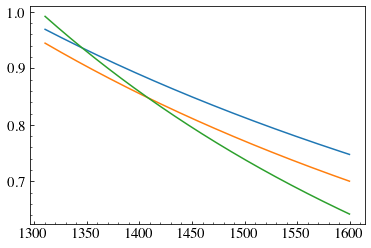

In [795]:
plt.plot(np.exp(np.log(interwave[masklam])), np.exp((np.log(interwave[masklam])*-1.3+9.3)))
plt.plot(np.exp(np.log(interwave[masklam])), np.exp((np.log(interwave[masklam])*-1.5+10.71)))
plt.plot(np.exp(np.log(interwave[masklam])), np.exp((np.log(interwave[masklam])*-2.18+15.64)))

## Lya prop

### 100

In [156]:
infolya = pd.read_csv('vandels-ancillary-data/rbegley_etal_2023.dat',delim_whitespace=True, comment="#", 
                   names = ['idx', 'ew_lya', 'ew_lya_err', 'fesc_lya', 'fesc_lya_err_l', 'fesc_lya_err_u'] )
# print( info[mask]['spectrum'].values)
# print(infolya[infolya['idx'] == info[mask]['spectrum'].values])
ewlya =[]
ewlya_err = []
fesclya =[]
fesclya_err =[]
fesclyc = []
fesclyc_err = []
valid = [string[:9] for string in info[mask]['spectrum'].values]
# print(valid)                    
# print(np.where(valid == 'CDFS00519'))
# print(valid.index('CDFS00519'))
# print(fesc_mean_100)
for name in valid:
    if(name == 'CDFS00519'):
        print(name)
for i in range(len(infolya)):
#     print(infolya['idx'][i][3:12])
    if(infolya['idx'][i][3:12] in valid and infolya['idx'][i][3:12] != 'CDFS22958'):
        ewlya.append(infolya['ew_lya'][i])
        ewlya_err.append(infolya['ew_lya_err'][i])
        fesclya.append(infolya['fesc_lya'][i])
        fesclya_err.append(infolya['fesc_lya_err_l'][i])
        fesclyc.append(fesc_mean_100[valid.index(infolya['idx'][i][3:12])])
        fesclyc_err.append(fesc_std_10[valid.index(infolya['idx'][i][3:12])])
        print(infolya['idx'][i][3:12],fesc_mean_100[valid.index(infolya['idx'][i][3:12])])
#         print(infolya['idx'][i][3:12], valid == infolya['idx'][i][3:12])

CDFS00519


NameError: name 'fesc_mean_100' is not defined

[]


<ipython-input-139-ff82e2e04963>:32: RuntimeWarning: divide by zero encountered in log10
  plt.plot(np.linspace(0,0.6), 10**(2.06473*np.log10(np.linspace(0,0.6))-0.08773), ls = ':', c= 'Firebrick',


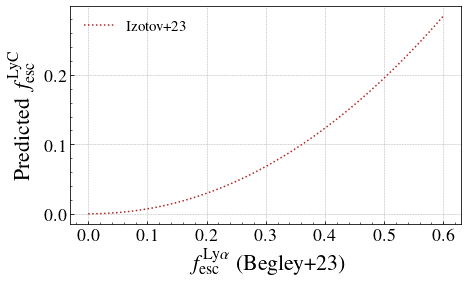

In [139]:
print(fesclya_err)
fig, (ax1) = plt.subplots(1,1, figsize = (7,4))

ax1.errorbar(fesclya, fesclyc, xerr = fesclya_err, yerr = np.asarray(fesclyc_err), marker = 'o',ls = 'None', color = 'k')
# ax1.axvline(np.min(np.log10(Mstar)), ls = ':', c= 'k', lw =2)
# ax1.axvline(np.max(np.log10(Mstar)), ls = ':',c='k', lw = 2)

# ax1.fill_betweenx([0,cur_ylim[1]], x1 = np.min(np.log10(Mstar)), x2 = np.max(np.log10(Mstar)),
#                   color='#E99F0C', alpha = 0.3)
ax1.set_xlabel(r'$f_{\rm esc}^{\rm Ly\alpha}$  (Begley+23)', fontsize = 22)
ax1.set_ylabel(r'Predicted $f_{\rm esc}^{\rm LyC}$', fontsize = 22, labelpad = 10)
# ax1.set_ylim(0,cur_ylim[1])
# ax1.set_xlim(5.8,10.4)
ax1.tick_params(axis='both', which='major', labelsize=18)
# ax1.set_xticks([6,7,8,9,10])
ax1.grid(linestyle = '--', linewidth = 0.5)

# ax2.errorbar(ewlya, fesclyc, xerr = ewlya_err, yerr = fesclyc_err, marker = 'o',ls = 'None', color = 'k')
# # ax1.axvline(np.min(np.log10(Mstar)), ls = ':', c= 'k', lw =2)
# # ax1.axvline(np.max(np.log10(Mstar)), ls = ':',c='k', lw = 2)

# # ax1.fill_betweenx([0,cur_ylim[1]], x1 = np.min(np.log10(Mstar)), x2 = np.max(np.log10(Mstar)),
# #                   color='#E99F0C', alpha = 0.3)
# ax2.set_xlabel(r'$f_{\rm esc}^{\rm Ly\alpha}$ (Begley+23)', fontsize = 22)
# ax2.set_ylabel(r'Predicted $f_{\rm esc}^{\rm LyC}$', fontsize = 22, labelpad = 10)
# # ax1.set_ylim(0,cur_ylim[1])
# # ax1.set_xlim(5.8,10.4)
# ax2.tick_params(axis='both', which='major', labelsize=18)
# # ax1.set_xticks([6,7,8,9,10])
# ax2.grid(linestyle = '--', linewidth = 0.5)
# log fesc(LyC) = 2.06473 × log fesc(Lyα) − 0.08773. 
plt.plot(np.linspace(0,0.6), 10**(2.06473*np.log10(np.linspace(0,0.6))-0.08773), ls = ':', c= 'Firebrick', 
         label = 'Izotov+23')
plt.subplots_adjust(wspace=0.25)
plt.legend(frameon=False, fontsize = 15)
fig.savefig('Plots/LyaLyc.pdf', bbox_inches = 'tight')



### Selected

In [196]:
infolya = pd.read_csv('vandels-ancillary-data/rbegley_etal_2023.dat',delim_whitespace=True, comment="#", 
                   names = ['idx', 'ew_lya', 'ew_lya_err', 'fesc_lya', 'fesc_lya_err_l', 'fesc_lya_err_u'] )
# print( info[mask]['spectrum'].values)
# print(infolya[infolya['idx'] == info[mask]['spectrum'].values])
ewlya =[]
ewlya_err = []
fesclya =[]
fesclya_err =[]
fesclyc = []
fesclyc_err = []
valid = [string[:9] for string in info[mask]['spectrum'][mask2_sel].values]
stell_mass_lya = []
sfr_lya = []
# print(valid)                    
# print(np.where(valid == 'CDFS00519'))
# print(valid.index('CDFS00519'))
# print(fesc_mean_100)
chi_lya = []
for name in valid:
    if(name == 'CDFS00519'):
        print(name)
for i in range(len(infolya)):
#     print(infolya['idx'][i][3:12])
    if(infolya['idx'][i][3:12] in valid and infolya['idx'][i][3:12] != 'CDFS22958'):
        ewlya.append(infolya['ew_lya'][i])
        ewlya_err.append(infolya['ew_lya_err'][i])
        fesclya.append(infolya['fesc_lya'][i])
        fesclya_err.append(infolya['fesc_lya_err_l'][i])
        fesclyc.append(fesc_mean_best[valid.index(infolya['idx'][i][3:12])])
        fesclyc_err.append(fesc_std_best[valid.index(infolya['idx'][i][3:12])])
        print(infolya['idx'][i][3:12],fesc_mean_best[valid.index(infolya['idx'][i][3:12])])
        chi_lya.append(chisall_select[valid.index(infolya['idx'][i][3:12])][np.argpartition(chisall_select[valid.index(infolya['idx'][i][3:12])],nthresh)[:30]])
#         print(infolya['idx'][i][3:12], valid == infolya['idx'][i][3:12])
        stell_mass_lya.append(stell_mass_select[valid.index(infolya['idx'][i][3:12])])
        sfr_lya.append(sfr_select[valid.index(infolya['idx'][i][3:12])])

fesclya = np.asarray(fesclya)
fesclyc = np.asarray(fesclyc)
fesclya_err = np.asarray(fesclya_err)
fesclyc_err = np.asarray(fesclyc_err)
chi_lya = np.asarray(chi_lya)
sfr_lya = np.asarray(sfr_lya)
stell_mass_lya = np.asarray(stell_mass_lya)

print(np.median(chi_lya, axis = 1))
# print(np.std(chi_lya, axis = 1))

print(stell_mass_lya, sfr_lya)
print(abs(stell_mass_lya[:,0]- stell_mass_lya[:,1]), 
      np.min(abs(stell_mass_lya[:,0]- stell_mass_lya[:,1])), 
      np.max(abs(stell_mass_lya[:,0]- stell_mass_lya[:,1])), 
      np.median(abs(stell_mass_lya[:,0]- stell_mass_lya[:,1])))

print(abs(sfr_lya[:,0]- sfr_lya[:,1]), 
      np.min(abs(sfr_lya[:,0]- sfr_lya[:,1])), 
      np.max(abs(sfr_lya[:,0]- sfr_lya[:,1])), 
      np.median(abs(sfr_lya[:,0]- sfr_lya[:,1])))

CDFS00519
CDFS00519 0.017521922633333332
CDFS00754 0.011865792503333335
CDFS01956 0.020320364999999996
CDFS02001 0.009034897666666663
CDFS10243 0.0025189740333333337
CDFS11590 0.09917504
CDFS13211 0.003817742232456667
CDFS13734 0.0019068926
CDFS22660 0.009086587433333331
CDFS23174 0.0037304842700000003
CDFS24753 0.052916556666666656
[1.13298094 1.21776207 1.42979081 0.78903949 1.92454932 1.73794954
 1.05298241 0.74420502 1.71796511 1.76868119 1.00063321]
[[9.7        9.03462846]
 [9.6        9.05269377]
 [8.8        9.2787536 ]
 [9.1        9.34084055]
 [9.5        8.98240693]
 [9.3        9.27369559]
 [9.5        9.2787536 ]
 [9.5        9.28443073]
 [9.3        8.98240693]
 [9.         8.90912794]
 [8.9        9.2787536 ]] [[1.4        0.55291145]
 [1.6        0.54641927]
 [0.9        0.54066669]
 [1.4        0.55291145]
 [1.8        0.54641927]
 [1.5        0.51917146]
 [1.6        0.51917146]
 [1.4        0.53217223]
 [1.2        0.54493577]
 [1.         0.47348697]
 [1.1        0.

[0.05815738 0.00287578 0.02543426 0.00426908 0.01206678 0.16231205
 0.01199497 0.1036773  0.01392149 0.02070161 0.09959012]


/tmp/ipykernel_376607/4209467726.py:38: RuntimeWarning: divide by zero encountered in log10
  plt.plot(np.linspace(0,0.6), 10**(2.06473*np.log10(np.linspace(0,0.6))-0.08773), ls = ':', c= 'Firebrick',


(0.0005, 0.4)

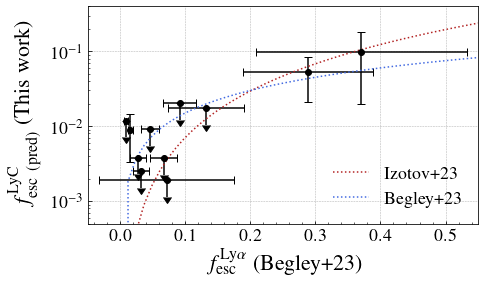

In [57]:
print(fesclya_err)
fig, (ax1) = plt.subplots(1,1, figsize = (7,4))
mask_pltlyc = (fesclyc- np.asarray(fesclyc_err))<1e-3
mask_pltlyc= mask_pltlyc.astype('bool')
ax1.errorbar(fesclya[mask_pltlyc], fesclyc[mask_pltlyc], 
             xerr = fesclya_err[mask_pltlyc], yerr = 0.4*fesclyc[mask_pltlyc],
             marker = 'o',ls = 'None', color = 'k', uplims = True, capsize = 4)
ax1.errorbar(fesclya[~mask_pltlyc], fesclyc[~mask_pltlyc], 
             xerr = fesclya_err[~mask_pltlyc], yerr = np.asarray(fesclyc_err)[~mask_pltlyc],
             marker = 'o',ls = 'None', color = 'k', capsize = 4)
# ax1.axvline(np.min(np.log10(Mstar)), ls = ':', c= 'k', lw =2)
# ax1.axvline(np.max(np.log10(Mstar)), ls = ':',c='k', lw = 2)

# ax1.fill_betweenx([0,cur_ylim[1]], x1 = np.min(np.log10(Mstar)), x2 = np.max(np.log10(Mstar)),
#                   color='#E99F0C', alpha = 0.3)
ax1.set_xlabel(r'$f_{\rm esc}^{\rm Ly\alpha}$  (Begley+23)', fontsize = 22)
ax1.set_ylabel(r'$f_{\rm esc\ (pred)}^{\rm LyC}$ (This work)', fontsize = 22, labelpad = 10)
# ax1.set_ylim(0,cur_ylim[1])
# ax1.set_xlim(5.8,10.4)
ax1.tick_params(axis='both', which='major', labelsize=18)
# ax1.set_xticks([6,7,8,9,10])
ax1.grid(linestyle = '--', linewidth = 0.5)

# ax2.errorbar(ewlya, fesclyc, xerr = ewlya_err, yerr = fesclyc_err, marker = 'o',ls = 'None', color = 'k')
# # ax1.axvline(np.min(np.log10(Mstar)), ls = ':', c= 'k', lw =2)
# # ax1.axvline(np.max(np.log10(Mstar)), ls = ':',c='k', lw = 2)

# # ax1.fill_betweenx([0,cur_ylim[1]], x1 = np.min(np.log10(Mstar)), x2 = np.max(np.log10(Mstar)),
# #                   color='#E99F0C', alpha = 0.3)
# ax2.set_xlabel(r'$f_{\rm esc}^{\rm Ly\alpha}$ (Begley+23)', fontsize = 22)
# ax2.set_ylabel(r'Predicted $f_{\rm esc}^{\rm LyC}$', fontsize = 22, labelpad = 10)
# # ax1.set_ylim(0,cur_ylim[1])
# # ax1.set_xlim(5.8,10.4)
# ax2.tick_params(axis='both', which='major', labelsize=18)
# # ax1.set_xticks([6,7,8,9,10])
# ax2.grid(linestyle = '--', linewidth = 0.5)
# log fesc(LyC) = 2.06473 × log fesc(Lyα) − 0.08773. 
plt.plot(np.linspace(0,0.6), 10**(2.06473*np.log10(np.linspace(0,0.6))-0.08773), ls = ':', c= 'Firebrick', 
         label = 'Izotov+23')
plt.plot(np.linspace(0,0.6), 0.15*np.linspace(0,0.6), ls = ':', c= 'royalblue', 
         label = 'Begley+23')
plt.subplots_adjust(wspace=0.25)
plt.legend(frameon=False, fontsize = 18)
plt.yscale('log')
# plt.xscale('log')

plt.xlim(-0.05, 0.55)
plt.ylim(5e-4,0.4)
# fig.savefig('Plots/LyaLyc_V2.pdf', bbox_inches = 'tight')



### Offsets


(array([ 3.,  4., 12., 20., 14., 38., 23.,  9.,  6.,  2.]),
 array([-49. , -40.2, -31.4, -22.6, -13.8,  -5. ,   3.8,  12.6,  21.4,
         30.2,  39. ]),
 <BarContainer object of 10 artists>)

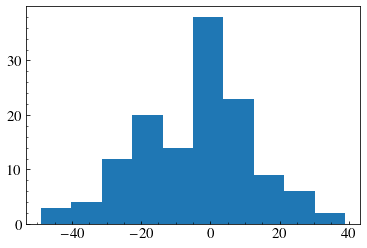

In [337]:
plt.hist(offall[:,0])

# He II

In [97]:
galaxy_ids = [
    "CDFS009705", "CDFS015347", "CDFS019872", "CDFS023170", "CDFS023215", 
    "CDFS023527", "CDFS113062", "CDFS122687", "CDFS126819", "CDFS202040", 
    "CDFS229681", "UDS004017", "UDS013586", "UDS019505", "UDS020089", 
    "UDS021062", "UDS196554", "UDS200677", "UDS281893", "UDS292392", 
    "CDFS021470", "CDFS102149", "CDFS129134", "CDFS141081", "CDFS231194", 
    "UDS137388", "CDFS006327", "CDFS028933", "CDFS208098", "UDS020721", 
    "UDS021234", "UDS025482,x", "UDS145830"
]
valid = [string[:9] for string in info[mask]['spectrum'].values]

for name in valid:
    if(name in galaxy_ids):
        print(name)
# for i in range(len(infolya)):
# #     print(infolya['idx'][i][3:12])
#     if(infolya['idx'][i][3:12] in valid and infolya['idx'][i][3:12] != 'CDFS22958'):

UDS200677


# COMP FIRST / 30 

<ipython-input-165-6926c72e9e7e>:18: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  ax1.set_xlim(0,1)


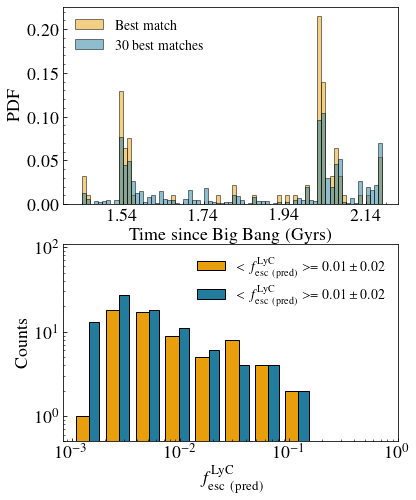

In [165]:
# bins = np.logspace(np.log10(0.0015),np.log10(0.3), 10)
fig, (ax2, ax1) = plt.subplots(2,1, figsize = (6,8))

counts, edges, bars =ax1.hist([fesc_first,
                               fesc_mean_best],
                               bins = bins,align='mid', 
                              alpha = 1, 
                              label = [r'$<f_{\rm esc\ (pred)}^{\rm LyC}> = %.2f \pm %.2f$'%(np.mean(fesc_first), np.std(fesc_first)),
                             r'$<f_{\rm esc\ (pred)}^{\rm LyC}> = %.2f \pm %.2f$'%(np.mean(fesc_mean_best), np.std(fesc_mean_best))   ], 
                              edgecolor = 'k', color =['#E99F0C','#227C9D'], log=False, density = False )
ax1.set_xlabel(r'$f^{\rm LyC}_{\rm esc\ (pred)}$', fontsize = 18)
ax1.set_ylabel(r'Counts', fontsize = 18)
# ax1.bar_label(bars[0])
# ax1.bar_label(bars[1])
ax1.legend(frameon=False, fontsize = 14)
ax1.set_yscale('log')
ax1.set_xscale('log')
ax1.set_xlim(0,1)
ax1.set_ylim(0.5,110)
ax1.tick_params(labelsize = 18)


counts, edges, bars =ax2.hist([allOut
                               ],
                               bins = np.arange(89, 165,1),align='mid', 
                              alpha = 0.5, 
                              label = [r'Best match'
                            ], 
                              edgecolor = 'k', color =['#E99F0C'], log=False, density = True )
counts, edges, bars =ax2.hist([
                               allOut_all],
                               bins = np.arange(89, 165,1),align='mid', 
                              alpha = 0.5, 
                              label = [
                             r'30 best matches'  ], 
                              edgecolor = 'k', color =['#227C9D'], log=False, density = True )
ax2.set_xlabel('Time since Big Bang (Gyrs)', fontsize = 18)
ax2.set_xticks([100,120,140, 160])
ax2.set_xticklabels(['1.54', '1.74', '1.94', '2.14'], size = 18)
ax2.set_ylabel(r'PDF', fontsize = 18)
# ax1.bar_label(bars[0])
# ax1.bar_label(bars[1])
ax2.legend(frameon=False, fontsize = 14)
# ax1.set_yscale('log')
# ax1.set_xscale('log')
# ax1.set_xlim(0,1)
# ax1.set_ylim(0.5,110)
ax2.tick_params(labelsize = 18)
# ax2.grid()
plt.savefig('Plots/Comp30.pdf', bbox_inches = 'tight')



# COMP OFFSET NO OFFSET

<ipython-input-200-5fe75fc6fc1c>:97: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  ax3.set_xlim(0,1)


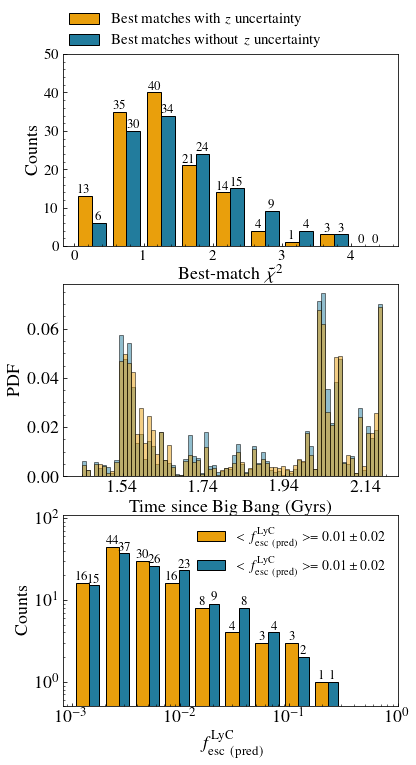

In [200]:
#### dfyes   = pd.read_csv('Vandels_100best_offset.csv')
dfno   = pd.read_csv('Vandels_100best_nooffset.csv')
# print(len(dfno), len(dfyes))
mask = (info['snr_per_pix']>=5) & (info['lmass']>7.5)

fig, (ax1, ax2, ax3) = plt.subplots(3,1, figsize = (6,12))
chisall_yes = dfyes['x2All0'].values
chisall_no = dfno['x2All0'].values

# chisall[(info['lmass'][mask]<9.5) & (chis>4)] = np.nan

counts, edges, bars =ax1.hist([chisall_yes, chisall_no],bins = np.arange(0,5,0.5),align='mid', 
                              alpha = 1, 
             edgecolor = 'k',color = ['#E99F0C','#227C9D'], label = ['Best matches with $z$ uncertainty',\
                                                                     'Best matches without $z$ uncertainty'])
ax1.set_xlabel(r'Best-match $\tilde{\chi}^2$', fontsize = 18, labelpad = 1)
ax1.set_ylabel(r'Counts', fontsize = 18)
ax1.legend(frameon = False, fontsize = 15, loc = (0,1))           
ax1.bar_label(bars[0], fontsize=13)
ax1.bar_label(bars[1], fontsize = 13)

ax1.set_ylim(0,50)
ax1.tick_params(labelsize = 15)



allOut_100_yes = []
allOut_100_no = []

for i in range(100):
    allOut_100_yes.append(dfyes[f'OutputAll{i}'].values)
    allOut_100_no.append(dfno[f'OutputAll{i}'].values)

allOut_100_yes=np.asarray(allOut_100_yes).flatten()
allOut_100_no=np.asarray(allOut_100_no).flatten()

hist2 = ax2.hist([allOut_100_yes], bins = range(89,165,1), density = True, alpha = 0.5, 
                      label ='Best matches with $z$ uncertainty',
                      color ='#227C9D',
                     edgecolor = 'k')
hist2 = ax2.hist([allOut_100_no], bins = range(89,165,1), density = True, alpha = 0.5, 
                      label ='Best matches without $z$ uncertainty',
                      color ='#E99F0C',
                     edgecolor = 'k')

ax2.set_xlabel('Time since Big Bang (Gyrs)', fontsize = 18)
ax2.set_xticks([100,120,140, 160])
# ax2.set_xticklabels(['','','',''], size = 18)
ax2.set_ylabel('PDF', fontsize = 18)
# ax_xDist.set_yticks([0,0.2])
ax2.set_xticklabels(['1.54', '1.74', '1.94', '2.14'], size = 18)
# ax_xDist.set_xticklabels(['','','',''], size = 18)
ax2.tick_params(axis='y', which='major', labelsize=18)

nmock = 30
tuple_out_100_yes = np.zeros((nGal+2, nmocks))
tuple_dir_100_yes = np.zeros((nGal+2, nmocks))
tuple_out_100_no = np.zeros((nGal+2, nmocks))
tuple_dir_100_no = np.zeros((nGal+2, nmocks))


for i in range(nmocks):
    tuple_out_100_yes[:,i] = dfyes[f'OutputAll{i}'].values
    tuple_dir_100_yes[:,i] = dfyes[f'DirAll{i}'].values
    tuple_out_100_no[:,i] = dfno[f'OutputAll{i}'].values
    tuple_dir_100_no[:,i] = dfno[f'DirAll{i}'].values

    
fesc_first= np.zeros(nGal)#fesc900[df100['OutputAll0'].astype(int).values-90
fesc_mean_100_yes, fesc_med_100_yes, fesc_std_100_yes = np.zeros(nGal), np.zeros(nGal), np.zeros(nGal)
fesc_mean_100_no, fesc_med_100_no, fesc_std_100_no = np.zeros(nGal), np.zeros(nGal), np.zeros(nGal)

for i in range(nGal):
    fesc_first[i] = fesc900[df100['OutputAll0'][i]-90,df100['DirAll0'][i].astype(int)]
    fesc_mean_100_yes[i]=np.mean(fesc900[tuple_out_100_yes[i, :].astype(int)-90, tuple_dir_100_yes[i, :].astype(int)])
    fesc_med_100_yes[i]=np.median(fesc900[tuple_out_100_yes[i, :].astype(int)-90, tuple_dir_100_yes[i, :].astype(int)])
    fesc_std_100_yes[i]=np.std(fesc900[tuple_out_100_yes[i, :].astype(int)-90, tuple_dir_100_yes[i, :].astype(int)])
    fesc_mean_100_no[i]=np.mean(fesc900[tuple_out_100_no[i, :].astype(int)-90, tuple_dir_100_no[i, :].astype(int)])
    fesc_med_100_no[i]=np.median(fesc900[tuple_out_100_no[i, :].astype(int)-90, tuple_dir_100_no[i, :].astype(int)])
    fesc_std_100_no[i]=np.std(fesc900[tuple_out_100_no[i, :].astype(int)-90, tuple_dir_100_no[i, :].astype(int)])
# fesc_mean_100_no=np.insert(fesc_mean_100_no, -1, 0.1)

counts, edges, bars =ax3.hist([fesc_mean_100_yes,
                               fesc_mean_100_no],
                               bins = bins,align='mid', 
                              alpha = 1, 
                              label = [r'$<f_{\rm esc\ (pred)}^{\rm LyC}> = %.2f \pm %.2f$'%(np.mean(fesc_mean_100_yes), np.std(fesc_mean_100_yes)),
                             r'$<f_{\rm esc\ (pred)}^{\rm LyC}> = %.2f \pm %.2f$'%(np.mean(fesc_mean_100_no), np.std(fesc_mean_100_no))   ], 
                              edgecolor = 'k', color =['#E99F0C','#227C9D'], log=False, density = False )
ax3.set_xlabel(r'$f^{\rm LyC}_{\rm esc\ (pred)}$', fontsize = 18)
ax3.set_ylabel(r'Counts', fontsize = 18)
# ax1.bar_label(bars[0])
# ax1.bar_label(bars[1])
ax3.legend(frameon=False, fontsize = 14)
ax3.set_yscale('log')
ax3.set_xscale('log')
ax3.set_xlim(0,1)
ax3.set_ylim(0.5,110)
ax3.bar_label(bars[0], fontsize=13)
ax3.bar_label(bars[1], fontsize = 13)

ax3.tick_params(axis='both', which='major', labelsize=18)

plt.savefig('Plots/CompStrat.pdf', bbox_inches = 'tight')
# print(bars[0])

# Magnitude disgression

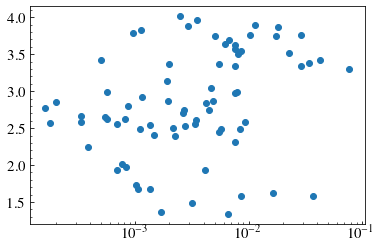

In [466]:
plt.scatter(np.mean(fesc900, axis = 1), SFR100)
plt.xscale('log')

In [299]:
flam = 10.e-18
print(Mab(mab_lam(flam), 2.5), Mab2(2e-19,7000, 3.4), Mab3(2e-19,7000, 3.4))
print(-2.5*np.log10(2e-30) -48.60 \
    -5*np.log10(cosmo.luminosity_distance(3.4).value*1e5)+\
    +2.5*np.log10(1+3.4))

25.113986568088585
25.114052190370813
-25.30110119711846 -20.681409696401264 -20.681344074119036
-20.147971253649803


In [300]:
# c_cgs = 2.998e10
# F_nu = F_lambda * 1500 / (c_cgs / (1500e-8))
# Mabs = -2.5*np.log10(F_nu / (4*np.pi*3.086e19**2)) - 48.6

print(Mab_simu(1.4e40, 1500, 3))

-18.458720358463296


In [62]:
import math
L_nu = 3631e-23 * (4. * math.pi * (10*pc_cm)**2)
nu = nu_lambda(1216.)
print(nu)
L_lambda, lamb = f_nu_lambda(L_nu, nu)
dl = luminosity_distance(6.0, **cosmo)
f_lambda = L_lambda/(4. * math.pi * (Mpc_cm)**2 * (1. + 6.0))
mAB, MAB = magnitude_AB(6.0, 3.631e-20, 7.*1216., **cosmo)
"%.3f, %.3f" % (mAB, MAB)

2465398503289473.5


'28.655, -20.091'

# Interesting LOS/OUTPUTS

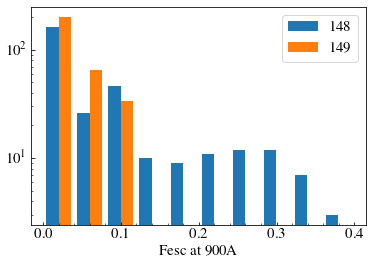

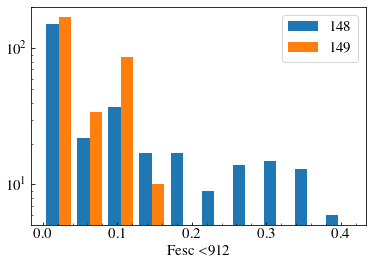

In [11]:
plt.hist([fesc900[148-90, :], fesc900[149-90,:]], label = ['148', '149'])
plt.yscale('log')
plt.legend()
plt.xlabel('Fesc at 900A')
plt.figure()
plt.hist([fesc[148-90, :], fesc[149-90,:]], label = ['148', '149'])
plt.yscale('log')
plt.xlabel(r'Fesc $<$912')

plt.legend()



In [266]:
df100   = pd.read_csv('Vandels_100best_offset.csv')
allOut_sing = df100['OutputAll0'].values
allbestdir = []
for j in range(10):
    allOut_sing = df100[f'OutputAll{j}'].values

    for i in range(nGal):
        if(allOut_sing[i] == 148 and fesc900[148-90, df100[f'DirAll{j}'][i]] > 0.01 ):
            allbestdir.append(df100[f'DirAll{j}'][i])
    #         print(df100['DirAll0'][i], fesc900[148-90,df100['DirAll0'][i] ])

# allOut_sing = df100['OutputAll1'].values
# for i in range(nGal):
#     if(allOut_sing[i] == 148):
#         allbestdir.append(df100['DirAll1'][i])


# allOut_sing = df100['OutputAll2'].values
# for i in range(nGal):
#     if(allOut_sing[i] == 148):
#         allbestdir.append(df100['DirAll2'][i])

        
allbestdir.sort()
# print(np.asarray([allbestdir, fesc[148-90, allbestdir]]).T)
dir05perc = 60
dir1perc = 220
# dir2perc = 131
dir4perc = 243
dir9perc = 283
dir13perc = 56
dir20perc = 102
dir25perc = 290
dir30perc = 288
dir34perc = 19
dir42perc = 142
finaldir = [60, 220, 243, 283, 56, 221, 102, 290, 288, 19, 142]
# print(fesc[148-90, finaldir])
# print(fesc900[148-90, finaldir])
print(directions[finaldir])
newdir = [(dir[0],dir[1],dir[2]) for dir in directions[finaldir]]
# print(newdir)
df = pd.DataFrame(np.vstack((finaldir,  
                             fesc[148-90, finaldir],
                            fesc900[148-90, finaldir],directions[finaldir][:,0],
                            directions[finaldir][:,1],directions[finaldir][:,2])).T) # A is a numpy 2d array
C=['dir', 'Fesc', 'Fesc900', 'vector_x', 'vector_y', 'vector_z']
df.to_csv("csv/sel_dir_148.csv", sep=',', header= C, index=False) 



[[ 0.84590517  0.          0.53333333]
 [ 0.84590517  0.         -0.53333333]
 [ 0.33838454  0.66411705 -0.66666667]
 [-0.33585711 -0.33585711 -0.88      ]
 [ 0.33838454 -0.66411705  0.66666667]
 [ 0.80450362  0.26139907 -0.53333333]
 [ 0.77972153  0.56650085  0.26666667]
 [-0.12330617  0.29768744 -0.94666667]
 [ 0.29768744  0.12330617 -0.94666667]
 [-0.33585711 -0.33585711  0.88      ]
 [ 0.80901699  0.58778525  0.        ]]


# Investigating Fesc LyC

## Read Cubes

In [14]:
print(path_to_folder)

../RHDSimulation/


In [15]:
nxy,imsize,lcubecIIint,cubecIIint = read_cube(path_to_folder+'./data_cubes_output_148/CII_int/',300)
nxy,imsize,lcubecII,cubecII = read_cube(path_to_folder+'./data_cubes_output_148/CII_dep/',300)
# print(nxy)
nxy,imsize,lcubeSiII,cubeSiII = read_cube(path_to_folder+'./data_cubes_output_148/SiII_dep/',300)

In [16]:
from scipy.optimize import curve_fit
import warnings
warnings.filterwarnings('ignore')

def power_law(x, a, b):
    return a*np.power(x,b)

sizecont = np.zeros(300)
sizeabs = np.zeros(300)
sizeflu = np.zeros(300)
sizedust = np.zeros(300)
sizeall = np.zeros(300)

distabs = np.zeros(300)
distflu = np.zeros(300)
distdust = np.zeros(300)
overlapabsflu = np.zeros(300)
overlapabscont = np.zeros(300)
overlapflucont = np.zeros(300)

dustinall = np.zeros(300)
dustincont = np.zeros(300)
dustinabs = np.zeros(300)
dustinflu = np.zeros(300)

totfluxall = np.zeros(300)
totfluxcont = np.zeros(300)
totfluxflu = np.zeros(300)
totfluxabs = np.zeros(300)

ffluxcont = np.zeros(300)
centerfluxcont = np.zeros(300)

rall = np.zeros(300)
rnoscatt = np.zeros(300)

EW = np.zeros(300)
EW2 = np.zeros(300)

rescen = np.zeros(300)
vcen = np.zeros(300)
reszero = np.zeros(300)
cube = cubecII[:,:,:,1:]
cube2=  cubeSiII[:,:,:,1:]
rinccont = np.zeros(300)
rincabs = np.zeros(300)
rincflu = np.zeros(300)

ewfludiff = np.zeros(300)
ewresdiff = np.zeros(300)

resiinc = np.zeros(300)
r50 = np.zeros(300)
def measureEWabs(lam, vel, fluxA, errA, xl, yl):
    valid = (vel>=xl) & (vel<=yl)     
    if(np.sum(errA) == 0):
        fluxA[fluxA>1.05]=1.05
        EW = scipy.integrate.simps(fluxA[valid]-1, x = lam[valid])
        EWstd = 0
    else:
        mes = np.zeros(1000)
        for i in range(1000):
            modFlux = fluxA[valid] + errA[valid]*np.random.normal(0, 1, len(fluxA[valid]))
            modFlux[modFlux>1] = 1
            modFlux[modFlux<0] = 0
            mes[i] =  scipy.integrate.simps(modFlux-1, x = lam[valid])
        EW = np.median(mes)
        EWstd = np.std(mes)
    return [EW, EWstd]


for idir in range(300):

#     print(fesc[148-90][idir])
    spec = gaussian_filter(np.sum(cube[idir,:,:,:],axis=(0,1)), sigma =1) 
    l_systemic = lcubecII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubecII[1:]) 
    vcII  = (l_systemic/wcII1334-1)*c
    
    spec2 = spec.copy()
    spec2[abs(vcII)>1000] =1e50
    idres = np.argmin(spec2)  -2 #np.where(abs(vcII)<200)#
    idres2 = np.argmin(spec2) +2

    idflu = np.argmax(spec)-4
    idflu2 =  np.argmax(spec)+4


    imageall  = np.sum(cube2[idir,:,:,1:],axis=(2))#/ (imsize/nxy)**2 
#     imageabs  = np.sum(cube[idir,:,:,idres:idres2],axis=(2))#/ (imsize/nxy)**2 
#     imageemi  = np.sum(cube[idir,:,:,idflu:idflu2],axis=(2))#/
    imagecontAtt = np.sum(cubecII[idir,:,:,20:50],axis=(2))#/ (imsize/nxy)**2 
    imagecontInt = np.sum(cubecIIint[idir,:,:,20:50],axis=(2))#/ (imsize/nxy)**2 
    imageratio = imagecontAtt/imagecontInt
    tot_maks = np.isfinite(imageratio)
    imageratio[~np.isfinite(imageratio)] = 1
 #   imagecsrat = imagecont / imagecontAtt
#     plt.figure()
#     plt.plot(vcII, np.sum(cubecII[idir,:,:,1:],axis=(0,1))/np.sum(cubecIIint[idir,:,:,1:],axis=(0,1)))
# #     plt.plot(vcII, )
#     plt.show()

    cx,cy = np.where(imagecontAtt == np.max(imagecontAtt))
    cx = int(cx)
    cy = int(cy)
       
    dd = imageall.copy()
    dd = np.sort(dd.flatten())[::-1]
    cumdd = np.cumsum(dd)
    lvl = .75
    idx = np.linspace(0,len(cumdd)-1,len(cumdd))
    gidx = int(idx[cumdd>=lvl*cumdd[-1]][0])
    aa = dd[gidx]
    ppc = imageall.copy()
    ppc[ppc<aa] = 0
    sizeall[idir]= np.sum(ppc>0)
    totfluxall[idir] = np.nansum(ppc)
#     print(idir, sizecont[idir], dustincont[idir])
    
    dustweight = np.nansum(imageratio[ppc>0]*imagecontAtt[ppc>0])/np.nansum(imagecontAtt[(ppc>0)])#np.median(imageratio[cx-2:cx+3,cy-2:cy+3]) #
    dustinall[idir] = dustweight#np.median(imageratio[ppc>0])#dustweight#imageratio[cx,cy]#
    
    toto = cube2[idir,:,:,:].copy()
    for gas in range(toto.shape[2]):
        toto[:,:,gas][ppc==0] = 0
    spec = gaussian_filter(np.sum(toto,axis=(0,1)), sigma =1) 
#     plt.plot(spec)
    l_systemic = lcubeSiII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubeSiII[1:]) 
    vsiII  = (l_systemic/wsiII1260-1)*c
    EW[idir] , oo = measureEWabs(l_systemic, vsiII, spec/np.median(spec[:20]), np.zeros(len(spec)), -600,400)  
    resiinc[idir] = np.nanmin((spec/np.median(spec[:20]))[(vsiII>-600) & (vsiII<400)])  

    
    toto = cube[idir,:,:,:].copy()
    for gas in range(toto.shape[2]):
        toto[:,:,gas][ppc==0] = 0
    spec = gaussian_filter(np.sum(toto,axis=(0,1)), sigma =1) 
#     plt.plot(spec)
    l_systemic = lcubecII[1:] + np.dot(directions[idir,:],v_cm[:,148-90])/c_cgs*1e5*np.mean(lcubecII[1:]) 
    vsiII  = (l_systemic/wcII1334-1)*c
    EW2[idir] , oo = measureEWabs(l_systemic, vsiII, spec/np.median(spec[:20]), np.zeros(len(spec)), -600,400)  
#     resiinc[idir] = np.nanmin((spec/np.median(spec[:20]))[(vsiII>-600) & (vsiII<400)])  
   
    
    imagesize = gaussian_filter(imageall.copy(), sigma = 0)
    cx,cy = np.where(imagesize == np.max(imagesize))
    cx = int(cx)
    cy = int(cy)
    aperture = CircularAperture((cy,cx), r=1) 
    
    aperture_masks = aperture.to_mask(method='center') # create mask

    fimage = aperture_masks.multiply(imagesize)
#     plt.figure()
#     plt.imshow(imagesize)
#     if(idir>4):
#         break
    rflux = np.zeros(20)
    tflux = np.zeros(20)
    
    rflux[0] = np.sum(fimage)
    tflux[0] = rflux[0]
    rrad = np.zeros(20)
    for kk in range(1,20):
        ppix1 = kk 
        ppix2 = (kk+1) 
        aperture2 = CircularAnnulus([cy,cx], r_in=ppix1, r_out=ppix2) 
        aperture_masks = aperture2.to_mask(method='center') # create mask

        fimage = aperture_masks.multiply(imagesize)
        rrad[kk]  = kk + 1
        rflux[kk] = np.sum(fimage)
        tflux[kk] = tflux[kk-1]+rflux[kk]
        

        
    xnew  = np.arange(np.min(rrad), np.max(rrad), 0.1)

    f  = interpolate.interp1d(rrad, rflux)
    ft = interpolate.interp1d(rrad, tflux)
    ynewcii  = f(xnew)   # use interpolation function returned by `interp1d`
    ytnewcii = ft(xnew) 

    half_fluxcii = np.max(ytnewcii)*0.75

#     print(half_fluxcii,half_fluxsiii)
    r50s = (imsize/nxy)*( xnew[(xnew > 1) & (np.round(ytnewcii,1) >= half_fluxcii)])
#     r50cii = r50s
#     plt.figure()
#     plt.scatter(xnew, ynewcii)
    if len(r50s > 1): r50[idir] = r50s[0]
    else: r50[idir] = r50s
#     print(r50[idir])
#     break


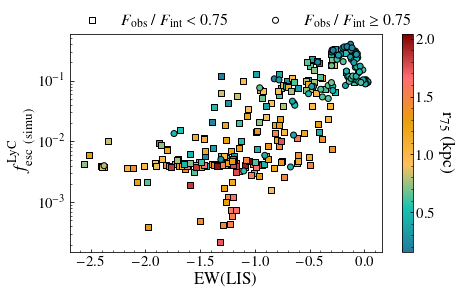

In [19]:
cb_colors = ["#227C9D", "#17C3B2", "#FFC05C", "#E99F0C", "#FE6D73", "#800000"]

num_colors = len(cb_colors[::-1])
cmap = LinearSegmentedColormap.from_list('test',cb_colors)

mask_small = dustinall<0.75
mask_inter = (r50<500) & (mask_small == False)
mask_high = dustinall>= 0.75
# plt.figure()
# cm = plt.scatter(fesc900[148-90], sizeall, c= dustinall, cmap = 'coolwarm')
# plt.colorbar(cm)
# plt.xscale('log')
# plt.yscale('log')
# plt.xlabel('Fesc(LyC)')
vmin = np.min(r50)/1000
vmax = np.max(r50)/1000
plt.figure(figsize = (7,4))
EWLIS = np.mean(np.vstack((EW, EW2)),axis=0)
# cm = plt.scatter(fesc[148-90][mask_inter], EW[mask_inter], c= dustinall[mask_inter], 
#                  cmap = cmap, marker = 's')
cm = plt.scatter(EWLIS[mask_small], fesc900[148-90][mask_small],  c= r50[mask_small]/1000, 
                 cmap = cmap, marker = 's', edgecolor = 'k', vmin = vmin, vmax = vmax, 
                 label = r'$F_{\rm obs}$ / $F_{\rm int} <$ 0.75')
cm = plt.scatter(EWLIS[mask_high], fesc900[148-90][mask_high],  c= r50[mask_high]/1000, 
                 cmap = cmap, marker = 'o', edgecolor = 'k', vmin = vmin, vmax = vmax,
                 label = r'$F_{\rm obs}$ / $F_{\rm int} \geq$ 0.75')

bar = plt.colorbar(cm)
bar.set_label(r'r$_{75}$ (kpc)', rotation=270, labelpad = 20, fontsize = 18)

plt.yscale('log')
# plt.yscale('log')
plt.ylabel(r'$f_{\rm esc\ (simu)}^{\rm LyC}$', fontsize = 18)
plt.xlabel(r'EW(LIS)', fontsize = 17)

# plt.ylim(-10,1)
leg =plt.legend(frameon = False, fontsize = 16, loc = (0,1), ncol = 2)
#  ax.get_legend()
leg.legendHandles[0].set_color('None')
leg.legendHandles[1].set_color('None')
leg.legendHandles[0].set_edgecolor('k')
leg.legendHandles[1].set_edgecolor('k')
plt.savefig('Plots/fescSimu.pdf', bbox_inches = 'tight')


# plt.figure(figsize = (7,4))
# cm = plt.scatter(fesc900[148-90][mask_small], resiinc[mask_small], c= dustinall[mask_small], 
#                  cmap = cmap, marker = 'o', edgecolor = 'k', vmin = 0.4, vmax = 1)
# # cm = plt.scatter(fesc[148-90][mask_inter], EW[mask_inter], c= dustinall[mask_inter], 
# #                  cmap = cmap, marker = 's')
# cm = plt.scatter(fesc900[148-90][mask_high], resiinc[mask_high], c= dustinall[mask_high], 
#                  cmap = cmap, marker = 's', edgecolor = 'k', vmin = 0.4, vmax = 1)
# plt.colorbar(cm)
# plt.xscale('log')
# # plt.yscale('log')
# plt.xlabel('Fesc(LyC)')

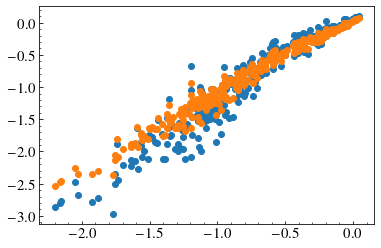

In [429]:
plt.scatter(EW, EW2)
plt.scatter(EW, EWLIS)

Text(0.5, 0, 'Fesc(LyC)')

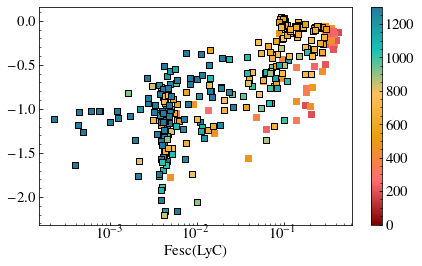

In [394]:
cb_colors = ["#227C9D", "#17C3B2", "#FFC05C", "#E99F0C", "#FE6D73", "#800000"]

num_colors = len(cb_colors[::-1])
cmap = LinearSegmentedColormap.from_list('test',cb_colors[::-1])

mask_small = r50<140
mask_inter = (r50<500) & (mask_small == False)
mask_high = r50>= 500
# plt.figure()
# cm = plt.scatter(fesc900[148-90], sizeall, c= dustinall, cmap = 'coolwarm')
# plt.colorbar(cm)
# plt.xscale('log')
# plt.yscale('log')
# plt.xlabel('Fesc(LyC)')
vmin = 0
vmax = 1300
plt.figure(figsize = (7,4))

cm = plt.scatter(fesc[148-90][mask_inter], EW[mask_inter], c= r50[mask_inter], 
                 cmap = cmap, marker = 's', vmin = vmin, vmax = vmax)
cm = plt.scatter(fesc900[148-90][mask_high], EW[mask_high], c= r50[mask_high], 
                 cmap = cmap, marker = 's', edgecolor = 'k', vmin = vmin, vmax = vmax)
cm = plt.scatter(fesc900[148-90][mask_small], EW[mask_small], c= r50[mask_small], 
                 cmap = cmap, marker = 'o', edgecolor = 'k' , vmin = vmin, vmax = vmax)
plt.colorbar(cm)
plt.xscale('log')
# plt.yscale('log')
plt.xlabel('Fesc(LyC)')
# plt.ylim(-10,1)

# plt.figure(figsize = (7,4))
# cm = plt.scatter(fesc900[148-90][mask_small], resiinc[mask_small], c= sizeall[mask_small], 
#                  cmap = cmap, marker = 'o', edgecolor = 'k', )
# # cm = plt.scatter(fesc[148-90][mask_inter], EW[mask_inter], c= dustinall[mask_inter], 
# #                  cmap = cmap, marker = 's')
# cm = plt.scatter(fesc900[148-90][mask_high], resiinc[mask_high], c= sizeall[mask_high], 
#                  cmap = cmap, marker = 's', edgecolor = 'k', )
# plt.colorbar(cm)
# plt.xscale('log')
# # plt.yscale('log')
# plt.xlabel('Fesc(LyC)')

In [389]:
print(sizeall)

[ 82. 177.  90.  90.  60.  68.  70.  76.  70. 108. 136.  71.  52.  53.
  50.  53.  69.  54.  55.  40.  65.  99. 217. 237.  92.  33.  35.  35.
  41.  37.  51.  38.  34.  59.  39.  50.  70.  78.  79. 173.  91. 275.
 128. 129. 203.  85.  20. 133. 116.  17.  34.  51.  67.  70.  44.  60.
  66.  65.  73. 294. 168. 205. 359.   7. 324. 230.  16.  20. 223.  64.
  16.  34.  49.  89.  34.  34.  53.  56.  79. 293.  79.  74.  88. 204.
 330. 362. 129. 279. 290.  92.  97.  42.  91.  86. 140.  52.  53.  56.
 377. 355.  74.  71.   3.   9. 221. 130. 389. 354. 353. 265. 279.  28.
  55. 272. 232.  25.  46.  42. 349. 399.   3.   3.   2.  77. 294. 333.
 432. 374. 355. 309.  16.  35. 132. 209. 154.  29. 223. 298. 147.  62.
   4.  16.   3.   9. 222. 273. 327. 421. 425. 396. 386. 328. 156.  48.
 106.  53. 130. 240.  59. 261.   4.   3.  20. 135. 131. 147. 262. 385.
 307. 470. 532. 483. 367. 252. 307. 257. 237.  63. 365.  19. 102.   7.
   3.  34.  21.  16.   6. 181. 331.  83. 315. 550. 502. 465. 409. 402.
 276. 

# Galaxy images


In [ ]:
nxy,imsize,lcubecIIint,cubecIIint = read_cube(path_to_folder+'./data_cubes_output_148/CII_int/',300)
nxy,imsize,lcubecII,cubecII = read_cube(path_to_folder+'./data_cubes_output_148/CII_dep/',300)
# print(nxy)
nxy,imsize,lcubeSiII,cubeSiII = read_cube(path_to_folder+'./data_cubes_output_148/SiII_dep/',300)

# 11 Compare all fesclya pred

## Classy

In [272]:
dfFS   = pd.read_csv('../RHDSimulation/csv/Classy_dep_fit_V2.csv')
dfFS.loc[dfFS.Galaxy == 'J0926_4427', 'OutputAll'] = 148
dfFS.loc[dfFS.Galaxy == 'J0926_4427', 'DirAll'] = 275

dfFS10   = pd.read_csv('../RHDSimulation/csv/Classy_dep_10fits_abs.csv')
fescall = np.zeros((45, 10)) +np.nan
mask = np.ones(45).astype(bool)
mask[[6,20,25,35,42,44]] = 0
for i in range(45):
    for j in range(10):
        if(dfFS10['x2All'+str(j)][i] <= 2*dfFS10['x2All0'][i]):
            fescall[i, j] = fesc900[dfFS10['OutputAll'+str(j)][i]-90,dfFS10['DirAll'+str(j)][i]]


fescstd = np.nanstd(fescall, axis = 1)
fescmed = np.nanmedian(fescall, axis = 1)

fescClassy = [fesc900[dfFS['OutputAll'][i]-90,dfFS['DirAll'][i]] for i in range(45)]
# fescstd = np.array(fescstd)[mask]
df = pd.read_csv('../Classy/AnalysisClassy.csv')


In [72]:
#measure_all_beta
cfits = ['#227C9D','#E99F0C', '#61210F']
from scipy.optimize import curve_fit
from lmfit import Parameters,minimize, fit_report

def model_lmfit(params,x,y):
    beta  =params['beta']    
    model = x*beta+params['K']
   # model /= np.median(model[(x>1269) & (x<1271)])
    return 0.5*(((y-model)**2))#*inv_sigma2

# Defining the various parameters
params = Parameters()
params.add("beta", value = -2, min =-3.0, max = 0.)
params.add("K", value = 1e3)
true_i = 0
sel_i = 0
beta_all = []
for i in range(len(info)):    
    
    if(mask[i] == False ):
        continue
    if(mask2_sel[true_i] == True):

    #     print({info["spectrum"][i]})
        dat1 = pd.read_csv(f'vandels_sample/vandels_spectra/{info["spectrum"][i]}.dat',delim_whitespace=True,
                           comment="#", 
                           names = ['wl', 'flam', 'flam_err'])
        redshift = info["z"][i]
        wave = dat1['wl']/(1+redshift)
        err  =  dat1['flam_err']/np.nanmedian(dat1['flam'][(wave>1410) & (wave<1520)])
        flux = dat1['flam']/np.nanmedian(dat1['flam'][(wave>1410) & (wave<1520)])
        flux[flux<0]=1e-3
#         plt.plot(wave, flux)
        interwave = wave
        masklam = ((interwave>1280) & (interwave<1290)) | ((interwave>1310) & (interwave<1320))| \
        ((interwave>1340) & (interwave<1375)) | ((interwave>1410) & (interwave<1490)) |\
         ((interwave>1510) & (interwave<1520)) |  ((interwave>1560) & (interwave<1600)) | \
         ((interwave>1680) & (interwave<1685))# |  ((interwave>1695) & (interwave<1698))
        fitted_params = minimize(model_lmfit, params, args= (np.log(interwave[masklam]),
                                                             np.log(gaussian_filter(flux[masklam], sigma = 1))),
                                                             nan_policy='omit')
        beta_all.append([fitted_params.params['beta'].value, fitted_params.params['beta'].stderr])

/tmp/ipykernel_376607/3088229889.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([0.0001,0.001,0.01,0.1,1])


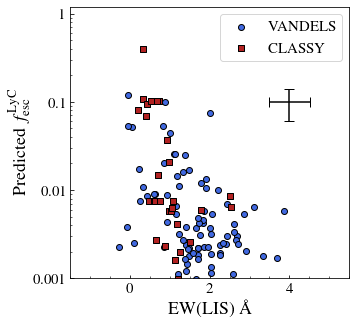

In [243]:
#fesclya[mask_pltlyc], fesclyc[mask_pltlyc]

plt.figure(figsize = (5,5))
plt.scatter(VANDELSmeas['EWSiIIabs'][mask2_sel], fesc_mean_best, c= 'royalblue', edgecolor = 'k', marker= 'o',
           label = 'VANDELS')
plt.errorbar(4, 0.1, 
                xerr = np.nanmedian(VANDELSmeas['ErrEWSiIIabs']),
                 yerr = 0.04,
               linestyle = '--', marker = 'None',c='k', capsize=5)

plt.scatter(-df['EWSiII1260'], fescClassy, c= 'Firebrick', edgecolor = 'k', marker= 's',
           label = 'CLASSY')

# plt.plot(np.linspace(-1, 5), 10**(-0.35 - 1.58*np.linspace(-1, 5) ), c= 'k', lw = 3, label= 'Saldana-Lopez+22')
plt.yscale('log')
plt.xlim(-1.5, 5.5)
plt.ylim(1e-3, 1.2)
ax = plt.gca()
ax.set_yticklabels([0.0001,0.001,0.01,0.1,1])
plt.ylabel(r'Predicted $f_{\rm esc}^{\rm LyC}$', fontsize = 18)
plt.xlabel(r'EW(LIS) \AA', fontsize = 18)
plt.tick_params(labelsize = 15)
plt.legend(fontsize = 15)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/tmp/ipykernel_376607/3552817300.py:35: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([0.0001,0.001,0.01,0.1,1])
/tmp/ipykernel_376607/3552817300.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([0.0001,0.001,0.01,0.1,1])


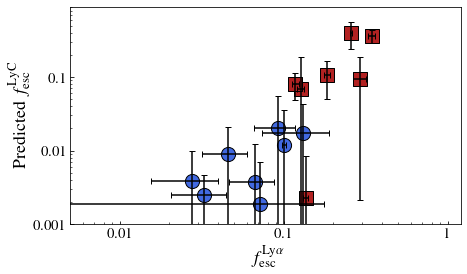

In [255]:
#fesclya[mask_pltlyc], fesclyc[mask_pltlyc]

plt.figure(figsize = (7,4))
fesclya[fesclya<0.01] = 0.1
# plt.errorbar(0.1, 0.5, 
#                 xerr = np.nanmedian(fesclya[mask_pltlyc]),
#                  yerr = 0.04,
#                linestyle = '--', marker = 'None',c='k', capsize=5)
plt.errorbar(fesclya[mask_pltlyc], fesclyc[mask_pltlyc], 
                xerr = fesclya_err[mask_pltlyc],
                 yerr = fesclyc_err[mask_pltlyc], ls = 'None',
             marker = 'None',c='k', capsize=3)
plt.scatter(fesclya[mask_pltlyc], fesclyc[mask_pltlyc], c= 'royalblue', edgecolor = 'k', marker= 'o',s = 200)


plt.errorbar(df['fescLyaIHA'][df['TypeLya'].values ==2], 
            np.asarray(fescClassy)[(df['TypeLya'].values == 2).astype('bool')],
                xerr = df['ErrfescLya'][df['TypeLya'].values ==2],
                 yerr = np.asarray(fescstd)[(df['TypeLya'].values == 2).astype('bool')], ls = 'None',
             marker = 'None',c='k', capsize=3,)
plt.scatter(df['fescLyaIHA'][df['TypeLya'].values ==2], 
            np.asarray(fescClassy)[(df['TypeLya'].values == 2).astype('bool')], c= 'Firebrick', edgecolor = 'k',
            marker= 's',s = 200)
# log fesc(LyC) = 2.06473 × log fesc(Lyα) − 0.08773.
# plt.plot(np.linspace(0,1), 10**(2.06473*np.log10(np.linspace(0,1))-0.08773), ls = ':', c= 'k', 
#          label = 'Izotov+23')
# plt.plot(np.linspace(0,0.6), 0.15*np.linspace(0,0.6), ls = '--', c= 'k', 
#          label = 'Begley+23')
plt.yscale('log')
plt.xscale('log')
plt.legend(frameon=False, fontsize = 15)
plt.xlim(5e-3, 1.2)
plt.ylim(1e-3, 0.9)
ax = plt.gca()
ax.set_yticklabels([0.0001,0.001,0.01,0.1,1])
ax.set_xticklabels([0.0001,0.001,0.01,0.1,1])

plt.ylabel(r'Predicted $f_{\rm esc}^{\rm LyC}$', fontsize = 18)
plt.xlabel(r'$f_{\rm esc}^{\rm Ly\alpha}$', fontsize = 18)
plt.tick_params(labelsize = 15)

(100.0, 750.0)

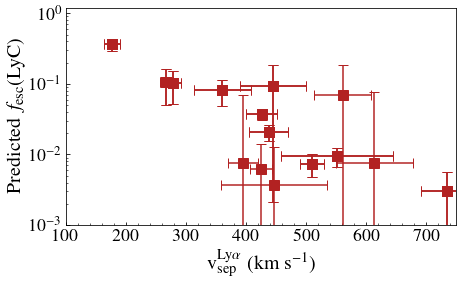

In [264]:
plt.figure(figsize=(7,4))
mask = (mask) & (np.asarray(fescClassy)>3e-3)

masklow = ( np.array(fescClassy)[mask]- fescstd[mask] <1e-5)
plt.errorbar(np.array(df['VsepLya'].values)[mask], np.array(fescClassy)[mask], 
             yerr = fescstd[mask], xerr = np.array(df['ErrVsepLya'].values)[mask], 
             linestyle = 'none', c= 'Firebrick', marker = 's', capsize = 5, markersize = 10)
plt.errorbar(np.array(df['VsepLya'].values)[mask][~masklow], np.array(fescClassy)[mask][~masklow], 
             yerr = fescstd[mask][~masklow], 
             xerr = np.array(df['ErrVsepLya'].values)[mask][~masklow], 
             linestyle = 'none', c= 'Firebrick', marker = 's', capsize = 5, markersize = 10)
# plt.errorbar(np.array(df['VsepLya'].values)[mask][masklow], np.array(fescC)[mask][masklow], 
#              yerr = np.zeros(len(fescS[masklow]))+np.array(fescC)[mask][masklow]*0.6, uplims = True,
#              linestyle = 'none', c= 'k', marker = 'o',markersize = 5, capsize = 5)
plt.yscale('log')

plt.xlabel(r'v$_{\rm sep}^{\rm Ly\alpha}$ (km s$^{-1}$)', fontsize = 20)
plt.ylabel(r'Predicted $f_{\rm esc}$(LyC)', fontsize = 20)
plt.tick_params(labelsize = 18)
# plt.plot(np.arange(150,800),(3.24*10**4)/(np.arange(150,800)**2) -1.05*10**2/np.arange(150,800) +0.095 )
plt.ylim(1e-3,1.2)
plt.xlim(100,750)

(-2.7, 0.5)

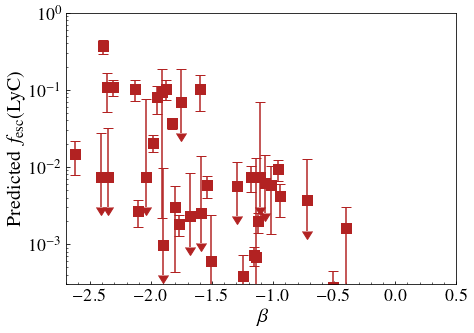

In [273]:
plt.figure(figsize=(7,5))
fescC = fescClassy.copy()
# label_arr = np.array(label_arr)[mask]
fescClassy = np.array(fescClassy)[mask]
fescstd = np.array(fescstd)[mask]
fescS = fescstd.copy()
# masklow = ( np.array(fescClassy)[mask]- fescstd[mask] <1e-5)
masklow = ( np.array(fescC)[mask] - fescS <1e-5)

plt.errorbar(np.array(df['BetaModel'].values)[mask], np.array(fescC)[mask], 
             yerr = [np.zeros(len(fescS)), fescS], xerr = np.array(df['ErrBetaModel'].values)[mask], 
             linestyle = 'none', c= 'Firebrick', marker = 's',markersize = 10, capsize = 5)
plt.errorbar(np.array(df['BetaModel'].values)[mask][~masklow], np.array(fescC)[mask][~masklow], 
             yerr = [fescS[~masklow],np.zeros(len(fescS[~masklow]))], 
             xerr = np.array(df['ErrBetaModel'].values)[mask][~masklow], 
             linestyle = 'none', c= 'Firebrick', marker = 's', markersize = 10,capsize = 5)
plt.errorbar(np.array(df['BetaModel'].values)[mask][masklow], np.array(fescC)[mask][masklow], 
             yerr = np.zeros(len(fescS[masklow]))+np.array(fescC)[mask][masklow]*0.6, uplims = True,
             linestyle = 'none', c= 'Firebrick', marker = 's',markersize = 10, capsize = 5)

plt.yscale('log')

plt.xlabel(r'$\beta$', fontsize = 20)
plt.ylabel(r'Predicted $f_{\rm esc}$(LyC)', fontsize = 20)
plt.tick_params(labelsize = 18)
# plt.plot(np.arange(150,800),(3.24*10**4)/(np.arange(150,800)**2) -1.05*10**2/np.arange(150,800) +0.095 )
plt.ylim(3e-4,1)
plt.xlim(-2.7, 0.5)

# plt.plot(np.arange(-3,1),1.3*1e-4 * 10**(-1.22*np.arange(-3,1)) )

# plt.xlim(100,700)